In [ ]:
!zip -r /content/sbs.zip /content/*.csv

  adding: content/ADSYNdataset19Features (2nd study).csv (deflated 53%)
  adding: content/BinaryRFfeature (2nd study).csv (deflated 71%)
  adding: content/CamcerTypeDataset19FeatureClassBalance (2nd study).csv (deflated 56%)
  adding: content/cancerType.csv (deflated 86%)
  adding: content/DiEarlyCancerDSFullData.csv (deflated 69%)
  adding: content/DiEarlyCancerDSFullDataInput.csv (deflated 68%)
  adding: content/DNAFragmentationDataSetBinary.csv (deflated 68%)
  adding: content/DNAFragmentationDataSetFullCancerOnlyAfterSMOTE.csv (deflated 61%)
  adding: content/DNAFragmentationDataSetFullCancerSMOTE.csv (deflated 60%)
  adding: content/FullDataset (2nd study).csv (deflated 64%)
  adding: content/PBM (2nd study).csv (deflated 60%)
  adding: content/RFweka.csv (deflated 86%)
  adding: content/SBSPDATA.csv (deflated 75%)
  adding: content/SBSPDATA-REF.csv (deflated 64%)
  adding: content/SingProfile.csv (deflated 77%)
  adding: content/SMOTE_Type_feature19Dataset (2nd study).csv (deflat

In [ ]:
from google.colab import files
files.download("/content/sbs.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#start:

In [ ]:
!pip install PyComplexHeatmap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 332.3/332.3 kB 8.7 MB/s eta 0:00:00


In [ ]:
%matplotlib inline
import IPython.core.display
# setup output image format (Chrome works best)
IPython.core.display.set_matplotlib_formats("svg")
import matplotlib.pyplot as plt
import matplotlib
from numpy import *
from sklearn import *
import os
import zipfile
import fnmatch
random.seed(100)
import skimage.io
import skimage.color
import skimage.transform
from scipy import ndimage
import numpy as np
import pandas as pd
import albumentations as A
import cv2
import warnings
warnings.filterwarnings('ignore')

<ipython-input-11-2402ab19f474>:4: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.core.display.set_matplotlib_formats("svg")
/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.6' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
from sklearn import *
from scipy import stats
random.seed(100)
import csv
from scipy import io
import pickle
from IPython.display import Audio, display
import numpy as np
from sklearn import model_selection
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

In [ ]:
import numpy as np
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn import datasets, linear_model
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_predict

In [ ]:
import numpy as np
from keras.preprocessing import image
import cv2 as cv
from pathlib import Path
from sklearn.model_selection import GridSearchCV, train_test_split
from skimage.io import imread
import pandas as pd
from builtins import range
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# prompt: ModuleNotFoundError: No module named 'umap.plot'

!pip install umap-learn

  Preparing metadata (setup.py) ... done
  Created wheel for umap: filename=umap-0.1.1-py3-none-any.whl size=3542 sha256=fc5c1f8d8645c65d506d5373ad47a1a82fca894cae727fa71300c1c123325690
  Stored in directory: /root/.cache/pip/wheels/82/d8/73/e9eb3334baaad795ff0278363ff1aca7568bdf2793e452a527
Successfully built umap


In [ ]:
import umap.plot
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PowerTransformer

ImportError: umap.plot requires pandas matplotlib datashader bokeh holoviews scikit-image and colorcet to be installed

In [ ]:
!pip install scikit-plot

In [ ]:
import scikitplot as skplt

ModuleNotFoundError: No module named 'scikitplot'

In [ ]:
def model_evaluation(model,x,y):
  pre=cross_val_predict(model, x, y, cv=10)
  acc = metrics.accuracy_score(y, pre)
  print("Test accuracy = " + str(acc))
  classReport=classification_report(y, pre)
  print(classReport)
  cm=confusion_matrix(y, pre)
  print(cm)
  skplt.metrics.plot_confusion_matrix(y, pre)
  plt.show()
  proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')
  skplt.metrics.plot_roc_curve(y,proba)
  plt.show()
  skplt.estimators.plot_learning_curve(model,x,y,cv=10,figsize=(8,6))
  plt.show()
  #fpr, tpr, _ = roc_curve(y,proba[:,0], pos_label='Cancer')
  #roc_auc= auc(fpr, tpr)
  return acc#,fpr,tpr,roc_auc

In [ ]:
from scipy.spatial import ConvexHull
import numpy as np
def rocch(fpr0,tpr0):
    fpr = np.array([0]+list(fpr0)+[1.0,1,0])
    tpr = np.array([0]+list(tpr0)+[1.0,0,0])
    hull = ConvexHull(np.vstack((fpr,tpr)).T)
    vert = hull.vertices
    vert = vert[np.argsort(fpr[vert])]
    F = [0]
    T = [0]
    for v in vert:
        ft = (fpr[v],tpr[v])
        if ft==(0,0) or ft==(1,1) or ft==(1,0):
            continue
        F+=[fpr[v]]
        T+=[tpr[v]]
    F+=[1]
    T+=[1]
    auc = np.trapz(T,F)
    return F,T,auc

# New section

Data load

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/DNAFragmentationDataSet11.csv')
x=data.iloc[:423,1:12]
y=data.iloc[:423,0]
tr=data.iloc[:423,0]
print(x)
print(y)
tr

     'Age at Diagnosis'  'PA Score'  chr1p  chr7p  chr8q  chr11q  chr17p  \
0                    69   23.743120 -20.27  39.64  93.57   27.70  -11.38   
1                    51    2.025100  -1.36   2.53   0.00   -2.00    0.92   
2                    55    6.660453   5.38  -2.68  -2.18   -2.01   -1.75   
3                    67    3.581623  -1.43   0.88  -0.26   -3.12    1.44   
4                    76    2.282642  -1.99   2.85   1.03   -0.30    0.53   
..                  ...         ...    ...    ...    ...     ...     ...   
418                  58    3.158140  -0.73   1.52   1.06   -3.48    2.19   
419                  69    4.740439   0.11   1.27   0.63   -3.95    0.71   
420                  70    5.535665  -2.61   4.12   4.28   -1.59   -2.00   
421                  58    4.966336   0.11   0.73   6.81   -4.30    0.02   
422                  64    2.251351   2.37  -0.48   2.14    1.39   -1.50   

     chr17q  chr21q  chr22q  Fragment_Size(bp)  
0    -16.30   -8.72  -11.60           

,Class
0,Cancer
1,Cancer
2,Cancer
3,Cancer
4,Cancer
...,...
418,Cancer
419,Cancer
420,Cancer
421,Cancer


In [ ]:
SingProfileDF = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/SingProfile.csv')
SingProfileDF=SingProfileDF.iloc[:,0:]
SingProfileDF=SingProfileDF.replace(np.nan, 0)
SingProfileDFData=SingProfileDF.iloc[:,8:]

In [ ]:
SingDataDF = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/SBSPDATA.csv')
SingDataDFClass=SingDataDF.iloc[:,0]
SingDataDFData=SingDataDF.iloc[:,3:]
SingDataDFData=SingDataDFData.replace(np.nan, 0)
SingDataDFData

,ichor,maf_targeted_seq,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,SBS7a,SBS7b,...,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60,SBS84,SBS85
0,0.04055,0.0000,100,34,0,0,42,0,0,0,...,28,12,0,0,0,0,0,0,17,0
1,0.02652,0.0000,240,5,0,0,0,0,123,0,...,44,237,0,0,1,0,4,0,29,0
2,0.03000,0.0093,169,32,0,0,0,0,37,32,...,35,67,0,0,0,0,13,0,0,0
3,0.03575,0.0014,15,2,0,0,0,0,18,0,...,1,0,6,0,0,0,0,0,0,0
4,0.03115,0.0000,29,10,0,0,0,0,0,0,...,0,0,5,0,0,76,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
400,0.64500,0.4303,29,67,0,0,0,27,0,0,...,0,161,0,0,0,56,39,0,0,0
401,0.23870,0.8161,253,45,0,42,324,0,8,0,...,0,269,0,0,147,7,18,0,0,0
402,0.22380,0.3600,34,145,0,0,49,128,0,0,...,0,184,0,0,0,0,16,0,22,17
403,0.02825,0.0000,194,0,78,0,541,0,139,0,...,0,114,0,0,0,48,11,3,66,0


In [ ]:
SingProfileDF

,class,cancer_type,stage,SNP.boolean,n_mut.SNP_in,n_mut.SNP_out,median.pointy_score,maf_targeted_seq,SBS1,SBS2,...,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60,SBS84,SBS85
0,Cancer,Gastric.cancer,IV,SNPs_in,26853,4291,0.680,0.0000,100,34,...,28,12,0,0,0,0,0,0,17,0
1,Cancer,Gastric.cancer,II,SNPs_in,25164,3962,0.930,0.0000,240,5,...,44,237,0,0,1,0,4,0,29,0
2,Cancer,Gastric.cancer,III,SNPs_in,26424,4069,0.794,0.0093,169,32,...,35,67,0,0,0,0,13,0,0,0
3,Cancer,Gastric.cancer,II,SNPs_in,18932,2742,0.852,0.0014,15,2,...,1,0,6,0,0,0,0,0,0,0
4,Cancer,Ovarian.Cancer,I,SNPs_in,24303,3673,0.976,0.0000,29,10,...,0,0,5,0,0,76,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
400,Cancer,Colorectal.Cancer,IV,SNPs_in,24985,4301,0.912,0.4303,29,67,...,0,161,0,0,0,56,39,0,0,0
401,Cancer,Colorectal.Cancer,IV,SNPs_in,31175,5288,0.796,0.8161,253,45,...,0,269,0,0,147,7,18,0,0,0
402,Cancer,Colorectal.Cancer,IV,SNPs_in,28751,5016,0.928,0.3600,34,145,...,0,184,0,0,0,0,16,0,22,17
403,Cancer,Colorectal.Cancer,IV,SNPs_in,28764,4354,0.894,0.0000,194,0,...,0,114,0,0,0,48,11,3,66,0


In [ ]:
SBSPDATADF = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/SBSPDATA.csv')
SBSPDATADF=SBSPDATADF.iloc[:,0:]
SBSPDATADF=SBSPDATADF.replace(np.nan, 0)

In [ ]:
DNAFragmentationDataSetBinary = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/DNAFragmentationDataSetBinary.csv')
DNAFragmentationDataSetBinary=DNAFragmentationDataSetBinary.iloc[:,0:]
DNAFragmentationDataSetBinaryData=DNAFragmentationDataSetBinary.iloc[:,0:47]

In [ ]:
DNAFragmentationDataSetBinaryData.head()

,age,PA_score,chr1p,chr1q,chr2p,chr2q,chr3p,chr3q,chr4p,chr4q,...,chr20p,chr20q,chr21q,chr22q,Fragment_Size(bp),MedianFragmentRatioProfile,GC_CorrectedFragmentRatioProfile,FractionOfMitochondrialGenome,Coverage,gender
0,69,23.74,-20.27,-18.19,25.09,26.20,-102.97,24.14,-17.90,-33.11,...,26.07,25.47,-8.72,-11.60,163,0.20,0.53,0.0,1.86,0
1,51,2.03,-1.36,-1.69,-1.42,-1.35,-2.31,-2.02,1.11,0.47,...,0.00,-0.21,-0.42,0.63,166,0.78,0.88,0.0,1.77,1
2,55,6.66,5.38,5.64,5.38,5.56,6.74,5.42,3.75,4.92,...,-1.09,-0.58,-1.63,-0.66,166,0.93,0.92,0.0,2.26,1
3,67,3.58,-1.43,-1.59,-0.84,-1.04,-3.69,-3.10,0.82,-1.98,...,-1.57,0.09,0.83,2.57,166,0.65,0.89,0.0,2.12,0
4,76,2.28,-1.99,-1.63,-0.16,-0.60,-0.92,-3.45,1.62,-0.42,...,1.12,0.67,0.63,0.66,166,0.82,0.87,0.0,2.69,0


In [ ]:
SingProfileDFData.head()

,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,SBS7a,SBS7b,SBS7c,SBS7d,...,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60,SBS84,SBS85
0,100,34,0,0,42,0,0,0,0,0,...,28,12,0,0,0,0,0,0,17,0
1,240,5,0,0,0,0,123,0,6,0,...,44,237,0,0,1,0,4,0,29,0
2,169,32,0,0,0,0,37,32,6,1,...,35,67,0,0,0,0,13,0,0,0
3,15,2,0,0,0,0,18,0,0,0,...,1,0,6,0,0,0,0,0,0,0
4,29,10,0,0,0,0,0,0,0,0,...,0,0,5,0,0,76,0,0,0,0


In [ ]:
SingProfileDF.columns = SingProfileDF.columns.str.replace('class', 'Class')
SingProfileDF.head()

,Class,cancer_type,stage,SNP.boolean,n_mut.SNP_in,n_mut.SNP_out,median.pointy_score,maf_targeted_seq,SBS1,SBS2,...,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60,SBS84,SBS85
0,Cancer,Gastric.cancer,IV,SNPs_in,26853,4291,0.680,0.0000,100,34,...,28,12,0,0,0,0,0,0,17,0
1,Cancer,Gastric.cancer,II,SNPs_in,25164,3962,0.930,0.0000,240,5,...,44,237,0,0,1,0,4,0,29,0
2,Cancer,Gastric.cancer,III,SNPs_in,26424,4069,0.794,0.0093,169,32,...,35,67,0,0,0,0,13,0,0,0
3,Cancer,Gastric.cancer,II,SNPs_in,18932,2742,0.852,0.0014,15,2,...,1,0,6,0,0,0,0,0,0,0
4,Cancer,Ovarian.Cancer,I,SNPs_in,24303,3673,0.976,0.0000,29,10,...,0,0,5,0,0,76,0,0,0,0


In [ ]:
x=SingProfileDF.iloc[:,1:]
x.head()

,cancer_type,stage,SNP.boolean,n_mut.SNP_in,n_mut.SNP_out,median.pointy_score,maf_targeted_seq,SBS1,SBS2,SBS3,...,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60,SBS84,SBS85
0,Gastric.cancer,IV,SNPs_in,26853,4291,0.680,0.0000,100,34,0,...,28,12,0,0,0,0,0,0,17,0
1,Gastric.cancer,II,SNPs_in,25164,3962,0.930,0.0000,240,5,0,...,44,237,0,0,1,0,4,0,29,0
2,Gastric.cancer,III,SNPs_in,26424,4069,0.794,0.0093,169,32,0,...,35,67,0,0,0,0,13,0,0,0
3,Gastric.cancer,II,SNPs_in,18932,2742,0.852,0.0014,15,2,0,...,1,0,6,0,0,0,0,0,0,0
4,Ovarian.Cancer,I,SNPs_in,24303,3673,0.976,0.0000,29,10,0,...,0,0,5,0,0,76,0,0,0,0


In [ ]:
sbs=SBSPDATADF.iloc[:,8:]
sbs.head()

,SBS4,SBS5,SBS6,SBS7a,SBS7b,SBS7c,SBS7d,SBS8,SBS9,SBS10a,...,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60,SBS84,SBS85
0,0,42,0,0,0,0,0,0,0,1,...,28,12,0,0,0,0,0,0,17,0
1,0,0,0,123,0,6,0,0,0,0,...,44,237,0,0,1,0,4,0,29,0
2,0,0,0,37,32,6,1,0,0,0,...,35,67,0,0,0,0,13,0,0,0
3,0,0,0,18,0,0,0,0,0,0,...,1,0,6,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,5,0,0,76,0,0,0,0


In [ ]:
x=SingProfileDF.iloc[:,7:47]
x.head()

,maf_targeted_seq,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,SBS7a,SBS7b,SBS7c,...,SBS25,SBS26,SBS27,SBS28,SBS29,SBS30,SBS31,SBS32,SBS33,SBS34
0,0.0000,100,34,0,0,42,0,0,0,0,...,0,0,11,0,0,71,0,4,0,38
1,0.0000,240,5,0,0,0,0,123,0,6,...,0,362,0,3,0,141,0,176,0,0
2,0.0093,169,32,0,0,0,0,37,32,6,...,0,0,0,0,0,0,0,152,89,0
3,0.0014,15,2,0,0,0,0,18,0,0,...,0,0,0,0,0,0,2,0,0,0
4,0.0000,29,10,0,0,0,0,0,0,0,...,0,0,0,0,0,40,57,0,0,0


In [ ]:
CancerSEEK_Binary = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/BinaryRFfeature (2nd study).csv')
CancerSEEK_Binary=CancerSEEK_Binary.iloc[:,0:]
CancerSEEK_BinaryData=CancerSEEK_Binary.iloc[:,0:17]
CancerSEEK_BinaryData

,'CA-125 (U/ml)','CA19-9 (U/ml)','CYFRA 21-1 (pg/ml)','GDF15 (ng/ml)','HE4 (pg/ml)','HGF (pg/ml)','IL-6 (pg/ml)','IL-8 (pg/ml)','NSE (ng/ml)','OPN (pg/ml)','Prolactin (pg/ml)','sEGFR (pg/ml)','sFas (pg/ml)','TGFa (pg/ml)','Thrombospondin-2 (pg/ml)','Omega Score',Age
0,5.090,16.452,1938.654,0.53,3857.712,377.26,11.316,8.238,12.04,56516.58,11606.60,3284.17,204.792,16.086,21863.74,2.96,60
1,7.270,40.910,1938.654,2.39,5779.110,659.68,21.280,29.820,23.25,61001.39,14374.99,1911.81,204.792,16.086,29669.66,2.45,59
2,4.854,16.452,1976.940,0.50,3857.712,329.07,11.316,35.060,12.84,88896.24,38375.00,1743.94,204.792,179.030,6020.47,1.22,69
3,5.390,16.452,1938.654,0.19,7819.170,266.66,15.300,15.890,22.79,42549.61,12072.51,1059.24,204.792,16.086,4331.02,1.64,70
4,4.854,16.452,1938.654,0.30,3857.712,370.88,11.316,8.238,27.20,24274.11,23718.17,1736.92,204.792,16.086,2311.91,1.33,43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1812,24.820,42.390,1970.916,0.41,4113.462,284.34,10.500,12.830,9.72,38603.84,58266.97,2542.26,207.24,16.890,599.4,0.98,55
1813,5.580,16.440,1970.916,0.34,4113.462,374.03,10.500,8.274,79.03,29994.01,187828.79,1670.22,207.24,16.890,599.4,3.92,57
1814,30.480,16.440,3590.000,0.86,48893.330,309.22,10.500,11.160,4.30,93601.15,241440.02,1194.03,207.24,16.890,599.4,7.96,60
1815,1469.450,62.260,50659.050,0.69,16014.510,1153.70,20.330,20.540,19.52,145116.62,140145.70,1607.16,207.24,16.890,6864.33,0.81,49


In [ ]:
sbsy=SBSPDATADF.iloc[:,0]
sbsy.head()

,class
0,Cancer
1,Cancer
2,Cancer
3,Cancer
4,Cancer


In [ ]:
y=SingProfileDF.iloc[:,1]
y.head()

,cancer_type
0,Gastric.cancer
1,Gastric.cancer
2,Gastric.cancer
3,Gastric.cancer
4,Ovarian.Cancer


In [ ]:
from sklearn.model_selection import train_test_split
#X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.0, random_state = 0)
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

X_train = sc.fit_transform(x)
#X_test = sc.transform(X_test)
X_train.shape

(423, 11)

#**PCA analysis:**

From drive data

In [ ]:
DNAFragmentationDataSetBinary = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/Data_old/FS/DNAFragmentationDataSetBinary.csv')
DNAFragDataClass=DNAFragmentationDataSetBinary.iloc[:,0]
DNAFragData=DNAFragmentationDataSetBinary.iloc[:,1:]

NameError: name 'pd' is not defined

In [ ]:
SingDataDF = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/SBSPDATA.csv')
SingDataDFClass=SingDataDF.iloc[:,0]
SingDataDFData=SingDataDF.iloc[:,1:]
SingDataDFData=SingDataDFData.replace(np.nan, 0)

CancerSEEK_Binary = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/FullDataset (2nd study).csv')
CancerSEEK_Class=CancerSEEK_Binary.iloc[:,19]
CancerSEEK_Data=CancerSEEK_Binary.iloc[:,0:19]
DNAFragData

NameError: name 'pd' is not defined

In [ ]:
#DNAFragmentationDataSetBinary = pd.read_csv('DNAFragmentationDataSet11.csv')
DNAFragmentationDataSetBinary = pd.read_csv('DNAFragmentationDataSet11.csv')
DNAFragDataClass=DNAFragmentationDataSetBinary.iloc[:,0]
DNAFragData=DNAFragmentationDataSetBinary.iloc[:,1:]

SingDataDF = pd.read_csv('SBSPDATA-REF.csv')
SingDataDFClass=SingDataDF.iloc[:,0]
SingDataDFData=SingDataDF.iloc[:,1:]
SingDataDFData=SingDataDFData.replace(np.nan, 0)

CancerSEEK_Binary = pd.read_csv('BinaryRFfeature19Dataset.csv')
CancerSEEK_Class=CancerSEEK_Binary.iloc[:,19]
CancerSEEK_Data=CancerSEEK_Binary.iloc[:,0:19]
DNAFragData

,'Age at Diagnosis','PA Score',chr1p,chr7p,chr8q,chr11q,chr17p,chr17q,chr21q,chr22q,Fragment_Size(bp)
0,69,23.743120,-20.27,39.64,93.57,27.70,-11.38,-16.30,-8.72,-11.60,163
1,51,2.025100,-1.36,2.53,0.00,-2.00,0.92,-0.73,-0.42,0.63,166
2,55,6.660453,5.38,-2.68,-2.18,-2.01,-1.75,-0.32,-1.63,-0.66,166
3,67,3.581623,-1.43,0.88,-0.26,-3.12,1.44,0.12,0.83,2.57,166
4,76,2.282642,-1.99,2.85,1.03,-0.30,0.53,-1.71,0.63,0.66,166
...,...,...,...,...,...,...,...,...,...,...,...
418,58,3.158140,-0.73,1.52,1.06,-3.48,2.19,0.85,0.22,1.06,169
419,69,4.740439,0.11,1.27,0.63,-3.95,0.71,-0.77,0.80,-0.03,170
420,70,5.535665,-2.61,4.12,4.28,-1.59,-2.00,-4.32,-0.13,-1.20,170
421,58,4.966336,0.11,0.73,6.81,-4.30,0.02,1.22,0.17,1.34,168


In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()


In [ ]:
#Delfi (cfDNA Frag)
scaler.fit(DNAFragData)
X_c1 = scaler.transform(DNAFragData)
X1 = pca.fit_transform(X_c1)
col1=list(DNAFragData.columns)

#Delfi (SBS)
scaler.fit(SingDataDFData)
X_c2 = scaler.transform(SingDataDFData)
X2 = pca.fit_transform(X_c2)
col2=list(SingDataDFData.columns)

#CancerSEEK
scaler.fit(CancerSEEK_Data)
X_c3 = scaler.transform(CancerSEEK_Data)
X3 = pca.fit_transform(X_c3)
col3=list(SingDataDFData.columns)

print(X1[:,1])
print(X2[:,1])
print(X3[:,1])

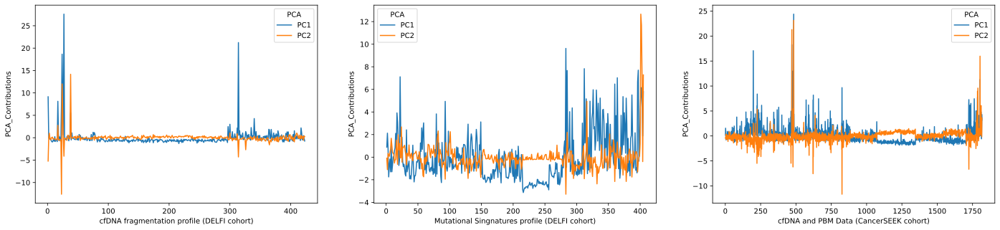

In [ ]:
import seaborn.objects as so

fig=plt.figure(figsize=(24,5))
ob=[]
p=[]
pv=[]
c=[]
for i in range(len(X1)):
  ob.append(i+1),p.append(X1[i,0]), pv.append("PC1"), c.append(DNAFragDataClass.iloc[i])
  ob.append(i+1),p.append(X1[i,1]), pv.append("PC2"), c.append(DNAFragDataClass.iloc[i])
dict = {'cfDNA fragmentation profile (DELFI cohort)':ob, 'PCA_Contributions': p, 'PCA': pv, 'Class':c}
PCA1 = pd.DataFrame(dict)
#so.Plot(PCA1, y="PCA_Contributions",x="ind", color="PCA").add(so.Bar(), so.Hist(), so.Dodge())
fig.add_subplot(1,3,1)
#ax=sns.displot(data=PCA1, y="PCA_Contributions",kde=True, hue="PCA")
#fig.add_subplot(1,3,2)
ax=sns.lineplot(data=PCA1, y="PCA_Contributions",x="cfDNA fragmentation profile (DELFI cohort)",hue="PCA")
#ax=sns.barplot(data=PCA1, y="PCA_Contributions", x="cfDNA fragmentation profile (DELFI cohort)", hue="Class")
#ax=sns.plot(data=PCA1, x="cfDNA fragmentation profile (DELFI cohort)", y="PCA_Contributions", hue="PCA")
ob=[]
p=[]
pv=[]
c=[]
for i in range(len(X2)):
  ob.append(i+1),p.append(X2[i,0]), pv.append("PC1"), c.append(DNAFragDataClass.iloc[i])
  ob.append(i+1),p.append(X2[i,1]), pv.append("PC2"), c.append(DNAFragDataClass.iloc[i])
dict = {'Mutational Singnatures profile (DELFI cohort)':ob, 'PCA_Contributions': p, 'PCA': pv, 'Class':c}
PCA1 = pd.DataFrame(dict)
fig.add_subplot(1,3,2)
ax=sns.lineplot(data=PCA1, y="PCA_Contributions",x="Mutational Singnatures profile (DELFI cohort)",hue="PCA")

ob=[]
p=[]
pv=[]
c=[]
for i in range(len(X3)):
  ob.append(i+1),p.append(X3[i,0]), pv.append("PC1"), c.append(CancerSEEK_BinaryClass.iloc[i])
  ob.append(i+1),p.append(X3[i,1]), pv.append("PC2"), c.append(CancerSEEK_BinaryClass.iloc[i])
dict = {'cfDNA and PBM Data (CancerSEEK cohort)':ob, 'PCA_Contributions': p, 'PCA': pv, 'Class':c}
PCA1 = pd.DataFrame(dict)
fig.add_subplot(1,3,3)
ax=sns.lineplot(data=PCA1, y="PCA_Contributions",x="cfDNA and PBM Data (CancerSEEK cohort)",hue="PCA")
fig.savefig("PCAContributionsPlotAll.png", bbox_inches='tight', dpi=300)
fig.savefig("PCAContributionsPlotAll.pdf", bbox_inches='tight', dpi=300)


#UMAP:

In [ ]:
pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 8.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 45.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82816 sha256=338dfeb45b390ba1cf044f210fafcf577cae39999894dc527c49f1f04545e8da
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55622 sha256=b6aac8ab0a5879e9b2a23f8b10f015d83253eeb24716e3d14f8cb5295d90136b
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


In [ ]:
# Configure UMAP hyperparameters
from umap import UMAP
import plotly.express as px
reducer = UMAP(n_neighbors=15, # default 15, The size of local neighborhood (in terms of number of neighboring sample points) used for manifold approximation.
               n_components=2, # default 2, The dimension of the space to embed into.
               metric='euclidean', # default 'euclidean', The metric to use to compute distances in high dimensional space.
               n_epochs=1000, # default None, The number of training epochs to be used in optimizing the low dimensional embedding. Larger values result in more accurate embeddings.
               learning_rate=1.0, # default 1.0, The initial learning rate for the embedding optimization.
               init='spectral', # default 'spectral', How to initialize the low dimensional embedding. Options are: {'spectral', 'random', A numpy array of initial embedding positions}.
               min_dist=0.1, # default 0.1, The effective minimum distance between embedded points.
               spread=1.0, # default 1.0, The effective scale of embedded points. In combination with ``min_dist`` this determines how clustered/clumped the embedded points are.
               low_memory=False, # default False, For some datasets the nearest neighbor computation can consume a lot of memory. If you find that UMAP is failing due to memory constraints consider setting this option to True.
               set_op_mix_ratio=1.0, # default 1.0, The value of this parameter should be between 0.0 and 1.0; a value of 1.0 will use a pure fuzzy union, while 0.0 will use a pure fuzzy intersection.
               local_connectivity=1, # default 1, The local connectivity required -- i.e. the number of nearest neighbors that should be assumed to be connected at a local level.
               repulsion_strength=1.0, # default 1.0, Weighting applied to negative samples in low dimensional embedding optimization.
               negative_sample_rate=5, # default 5, Increasing this value will result in greater repulsive force being applied, greater optimization cost, but slightly more accuracy.
               transform_queue_size=4.0, # default 4.0, Larger values will result in slower performance but more accurate nearest neighbor evaluation.
               a=None, # default None, More specific parameters controlling the embedding. If None these values are set automatically as determined by ``min_dist`` and ``spread``.
               b=None, # default None, More specific parameters controlling the embedding. If None these values are set automatically as determined by ``min_dist`` and ``spread``.
               random_state=42, # default: None, If int, random_state is the seed used by the random number generator;
               metric_kwds=None, # default None) Arguments to pass on to the metric, such as the ``p`` value for Minkowski distance.
               angular_rp_forest=False, # default False, Whether to use an angular random projection forest to initialise the approximate nearest neighbor search.
               target_n_neighbors=-1, # default -1, The number of nearest neighbors to use to construct the target simplcial set. If set to -1 use the ``n_neighbors`` value.
               #target_metric='categorical', # default 'categorical', The metric used to measure distance for a target array is using supervised dimension reduction. By default this is 'categorical' which will measure distance in terms of whether categories match or are different.
               #target_metric_kwds=None, # dict, default None, Keyword argument to pass to the target metric when performing supervised dimension reduction. If None then no arguments are passed on.
               #target_weight=0.5, # default 0.5, weighting factor between data topology and target topology.
               transform_seed=42, # default 42, Random seed used for the stochastic aspects of the transform operation.
               verbose=False, # default False, Controls verbosity of logging.
               unique=False, # default False, Controls if the rows of your data should be uniqued before being embedded.
              )

3


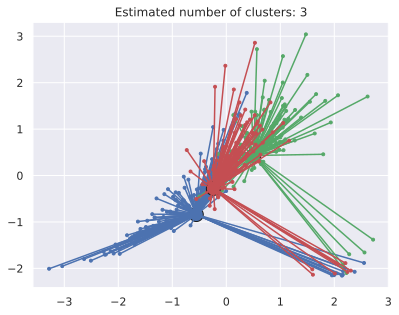

In [ ]:
from sklearn.cluster import AffinityPropagation

#Fit the model:
af = AffinityPropagation(preference=-563, random_state=0).fit(X)
cluster_centers_indices = af.cluster_centers_indices_
af_labels = af.labels_
n_clusters_ = len(cluster_centers_indices)

#Print number of clusters:
print(n_clusters_)

import matplotlib.pyplot as plt
from itertools import cycle

plt.close("all")
plt.figure(1)
plt.clf()

colors = cycle("bgrcmykbgrcmykbgrcmykbgrcmyk")
for k, col in zip(range(n_clusters_), colors):
    class_members = af_labels == k
    cluster_center = X[cluster_centers_indices[k]]
    plt.plot(X[class_members, 0], X[class_members, 1], col + ".")
    plt.plot(
        cluster_center[0],
        cluster_center[1],
        "o",
        markerfacecolor=col,
        markeredgecolor="k",
        markersize=14,
    )
    for x in X[class_members]:
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col)

plt.title("Estimated number of clusters: %d" % n_clusters_)
plt.show()

In [ ]:
pip install "umap-learn[plot]"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 36.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for datashape: filename=datashape-0.5.2-py3-none-any.whl size=59421 sha256=b406d25436ca8b9cbc3acc86238a16482e2cd9ea93e42f45d3a54882904ac1c7
  Stored in directory: /root/.cache/pip/wheels/35/c6/63/a3c12ecc9fdea10a593271de5c56481b427ad4049b90a176e1
Successfully built datashape


In [ ]:
pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


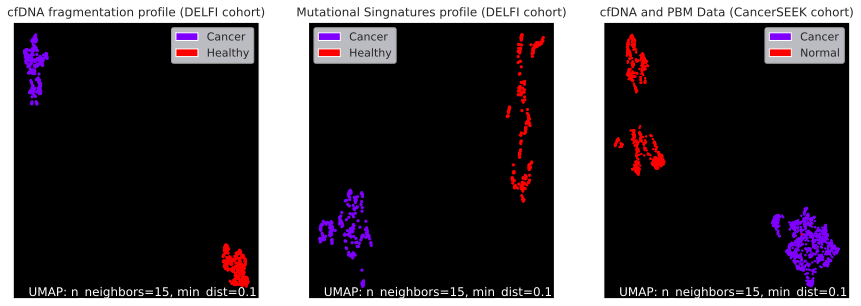

In [ ]:
#fig,ax=plt.figure(figsize=(24,5))
X=DNAFragData
y = DNAFragDataClass.values.flatten()


# Scale
pipe = make_pipeline(PowerTransformer())
X = pipe.fit_transform(X.copy())

# Encode the target to numeric
y_encoded = pd.factorize(y)[0]

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
manifold = umap.UMAP(n_neighbors=15, random_state=1121218)
manifold.fit(X, y_encoded)
ax = plt.subplot(1, 3,1)
ax=umap.plot.points(manifold, labels=y, ax=ax, theme="fire")
ax.set_title("cfDNA fragmentation profile (DELFI cohort)")

X=SingDataDFData
y = SingDataDFClass.values.flatten()

# Scale
pipe = make_pipeline(PowerTransformer())
X = pipe.fit_transform(X.copy())

# Encode the target to numeric
y_encoded = pd.factorize(y)[0]
n_neighbors = [15]
manifold = umap.UMAP(n_neighbors=15, random_state=1121218)
manifold.fit(X, y_encoded)
ax = plt.subplot(1, 3,2)
ax=umap.plot.points(manifold, labels=y, ax=ax, theme="fire")
ax.set_title("Mutational Singnatures profile (DELFI cohort)")

X=CancerSEEK_Data
y = CancerSEEK_Class.values.flatten()

# Scale
pipe = make_pipeline(PowerTransformer())
X = pipe.fit_transform(X.copy())

# Encode the target to numeric
y_encoded = pd.factorize(y)[0]
n_neighbors = [15]
manifold = umap.UMAP(n_neighbors=15, random_state=1121218)
manifold.fit(X, y_encoded)
ax = plt.subplot(1, 3,3)
ax=umap.plot.points(manifold, labels=y, ax=ax, theme="fire")
ax.set_title("cfDNA and PBM Data (CancerSEEK cohort)")

fig.savefig("UMAP_binary_all.png", dpi=300);


In [ ]:

X=SingDataDFData
y = SingDataDFClass.values.flatten()

# Scale
pipe = make_pipeline(PowerTransformer())
X = pipe.fit_transform(X.copy())

# Encode the target to numeric
y_encoded = pd.factorize(y)[0]
n_neighbors = [15]
manifold = umap.UMAP(n_neighbors=15, random_state=1121218)
manifold.fit(X, y_encoded)
umap.plot.points(manifold, labels=y, ax=ax, theme="fire")
ax.set_title("Mutational Singnatures profile (DELFI cohort)")

X=CancerSEEK_Data
y = CancerSEEK_Class.values.flatten()

# Scale
pipe = make_pipeline(PowerTransformer())
X = pipe.fit_transform(X.copy())

# Encode the target to numeric
y_encoded = pd.factorize(y)[0]
n_neighbors = [15]
manifold = umap.UMAP(n_neighbors=15, random_state=1121218)
manifold.fit(X, y_encoded)
umap.plot.points(manifold, labels=y, ax=ax, theme="fire")
ax.set_title("cfDNA and PBM Data (CancerSEEK cohort)")

fig.savefig("UMAP_binary_all.png", dpi=300);


<Axes: title={'center': 'Colored by RGB coords of PCA embedding'}>

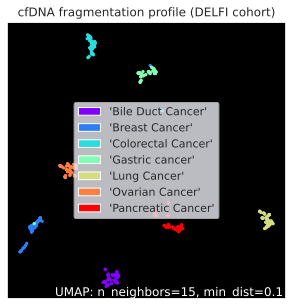

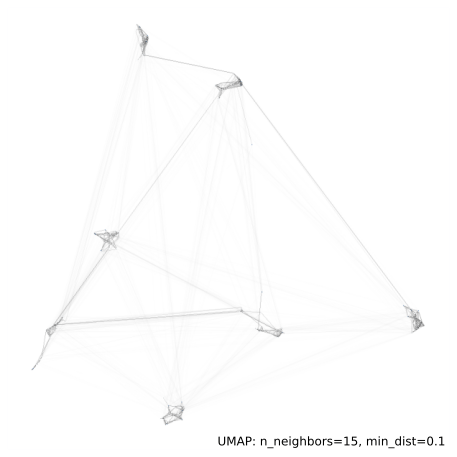

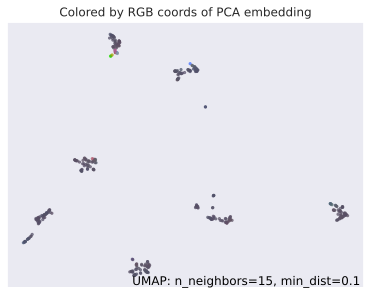

In [ ]:
DNAFragmentationDataSetType = pd.read_csv('DNAFragmentationDataSetFullCancerOnlyAfterSMOTE.csv')
DNAFragDataClass=DNAFragmentationDataSetType.iloc[:,0]
DNAFragData=DNAFragmentationDataSetType.iloc[:,1:45]

SingDataDF = pd.read_csv('SingProfile.csv')
SingDataDFClass=SingDataDF.iloc[:,1]

CancerSEEK_type = pd.read_csv('SMOTE_Type_feature19Dataset (2nd study).csv')
CancerSEEK_Class=CancerSEEK_type.iloc[:,19]
CancerSEEK_Data=CancerSEEK_type.iloc[:,0:19]

X=DNAFragData
y = DNAFragDataClass.values.flatten()

# Scale
pipe = make_pipeline(PowerTransformer())
X = pipe.fit_transform(X.copy())

# Encode the target to numeric
y_encoded = pd.factorize(y)[0]
n_neighbors = [15]
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
manifold = umap.UMAP(n_neighbors=15, random_state=1121218)
manifold.fit(X, y_encoded)
umap.plot.points(manifold, labels=y, ax=ax, theme="fire")
ax.set_title("cfDNA fragmentation profile (DELFI cohort)")


fig.savefig("multiple_neighbors.png", dpi=300);
umap.plot.connectivity(manifold, show_points=True)
umap.plot.diagnostic(manifold, diagnostic_type='pca')
umap.plot.connectivity(manifold, show_points=True)
umap.plot.diagnostic(manifold, diagnostic_type='pca')

NameError: ignored

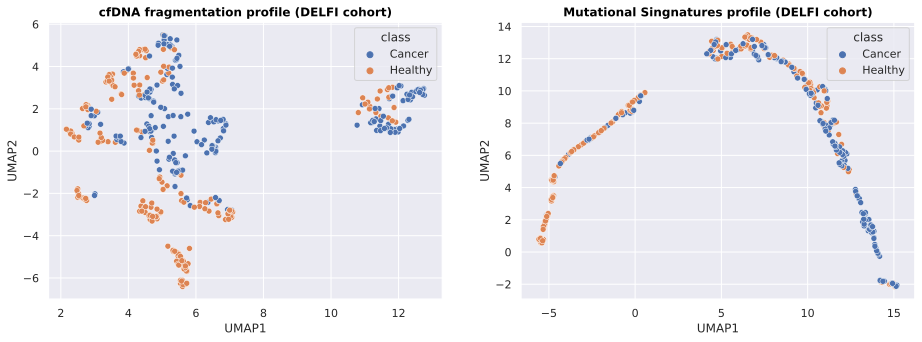

In [ ]:
fig=plt.figure(figsize=(24,5))
pipe = make_pipeline(PowerTransformer())
X = pipe.fit_transform(SingDataDFData.copy())
#y_encoded = pd.factorize(SingDataDFClass)[0]

X1_umap = reducer.fit_transform(X)
fig.add_subplot(1,3,1)
ax1=sns.scatterplot(x=X1_umap[:,0], y=X1_umap[:,1], hue=SingDataDFClass)
ax1.set_title("cfDNA fragmentation profile (DELFI cohort)",rotation=0, fontdict={'size':12, 'weight': 'bold', 'color': 'black'})
ax1.set(ylabel="UMAP2", xlabel="UMAP1")


X2_umap = reducer.fit_transform(SingDataDFData)
Class=SingDataDFClass
fig.add_subplot(1,3,2)
ax2=sns.scatterplot(x=X2_umap[:,0], y=X2_umap[:,1], hue=Class)
ax2.set_title("Mutational Singnatures profile (DELFI cohort)",rotation=0, fontdict={'size':12, 'weight': 'bold', 'color': 'black'})
ax2.set(ylabel="UMAP2", xlabel="UMAP1")

X3_umap = reducer.fit_transform(CancerSEEK_Data)
Class=CancerSEEK_Class
fig.add_subplot(1,3,3)
ax3=sns.scatterplot(x=X3_umap[:,0], y=X3_umap[:,1], hue=Class)
ax3.set_title("cfDNA and PBM Data (CancerSEEK cohort)",rotation=0, fontdict={'size':12, 'weight': 'bold', 'color': 'black'})
ax3.set(ylabel="UMAP2", xlabel="UMAP1")
fig.savefig("UMAPPlotAll.png", bbox_inches='tight', dpi=300)
fig.savefig("UMAPPlotAll.pdf", bbox_inches='tight', dpi=300)

In [ ]:
DNAFragmentationDataSetType = pd.read_csv('DNAFragmentationDataSetFullCancerOnlyAfterSMOTE.csv')
DNAFragDataClass=DNAFragmentationDataSetType.iloc[:,0]
DNAFragData=DNAFragmentationDataSetType.iloc[:,1:45]

SingDataDF = pd.read_csv('SingProfile.csv')
SingDataDFClass=SingDataDF.iloc[:,1]

CancerSEEK_type = pd.read_csv('SMOTE_Type_feature19Dataset (2nd study).csv')
CancerSEEK_Class=CancerSEEK_type.iloc[:,19]
CancerSEEK_Data=CancerSEEK_type.iloc[:,0:19]
DNAFragData

,Gender,'PA Score',chr1p,chr1q,chr2p,chr2q,chr3p,chr3q,chr4p,chr4q,...,chr18q,chr19p,chr19q,chr20p,chr20q,chr21q,chr22q,Fragment_Size(bp),MedianFragmentRatioProfile,GC_CorrectedFragmentRatioProfile
0,0.000000,23.743120,-20.270000,-18.190000,25.090000,26.200000,-102.970000,24.140000,-17.900000,-33.110000,...,-27.270000,-0.540000,-7.890000,26.070000,25.470000,-8.720000,-11.600000,163.000000,0.197200,0.526800
1,1.000000,2.025100,-1.360000,-1.690000,-1.420000,-1.350000,-2.310000,-2.020000,1.110000,0.470000,...,-2.020000,1.850000,1.540000,0.000000,-0.210000,-0.420000,0.630000,166.000000,0.780400,0.883500
2,1.000000,6.660453,5.380000,5.640000,5.380000,5.560000,6.740000,5.420000,3.750000,4.920000,...,-3.860000,-0.870000,-1.430000,-1.090000,-0.580000,-1.630000,-0.660000,166.000000,0.933500,0.920600
3,0.000000,3.581623,-1.430000,-1.590000,-0.840000,-1.040000,-3.690000,-3.100000,0.820000,-1.980000,...,-1.160000,2.380000,1.890000,-1.570000,0.090000,0.830000,2.570000,166.000000,0.653100,0.890400
4,0.000000,2.282642,-1.990000,-1.630000,-0.160000,-0.600000,-0.920000,-3.450000,1.620000,-0.420000,...,0.640000,0.450000,1.130000,1.120000,0.670000,0.630000,0.660000,166.000000,0.816100,0.869500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,0.958562,4.045877,-0.834620,-0.113806,-0.224501,1.158587,-4.848884,-1.147987,-0.729498,1.140665,...,-1.346466,-0.322426,-0.139216,-3.626601,-1.120627,0.219859,1.079041,168.296571,0.942748,0.916719
374,0.239570,3.858278,-0.442338,0.781441,-1.611237,0.636203,-2.383685,0.673663,-0.867425,2.730520,...,-0.524613,0.260282,-0.853175,-3.186501,-1.800333,1.870467,-0.155097,169.583206,0.948796,0.898249
375,0.826750,5.241275,-1.471700,-0.471280,-0.581427,2.950742,-1.753165,0.186377,2.045524,2.929527,...,0.919139,-0.076329,-1.152553,-2.559259,-2.295618,2.278353,-0.862120,168.805494,0.328089,0.855651
376,1.000000,4.018206,-0.231052,0.776626,0.135447,-0.527942,-3.922249,-1.557899,-1.575399,-1.699144,...,-0.535444,0.691968,-0.650391,-1.006100,1.559591,0.185174,1.228229,168.211459,0.932907,0.906051


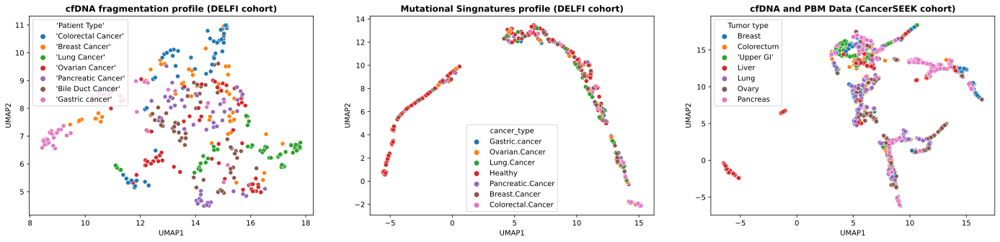

In [ ]:
fig=plt.figure(figsize=(24,5))
X1_umap = reducer.fit_transform(DNAFragData)
Class=DNAFragDataClass
fig.add_subplot(1,3,1)
ax1=sns.scatterplot(x=X1_umap[:,0], y=X1_umap[:,1], hue=Class)
ax1.set_title("cfDNA fragmentation profile (DELFI cohort)",rotation=0, fontdict={'size':12, 'weight': 'bold', 'color': 'black'})
ax1.set(ylabel="UMAP2", xlabel="UMAP1")


X2_umap = reducer.fit_transform(SingDataDFData)
Class=SingDataDFClass
fig.add_subplot(1,3,2)
ax2=sns.scatterplot(x=X2_umap[:,0], y=X2_umap[:,1], hue=Class)
ax2.set_title("Mutational Singnatures profile (DELFI cohort)",rotation=0, fontdict={'size':12, 'weight': 'bold', 'color': 'black'})
ax2.set(ylabel="UMAP2", xlabel="UMAP1")

X3_umap = reducer.fit_transform(CancerSEEK_Data)
Class=CancerSEEK_Class
fig.add_subplot(1,3,3)
ax3=sns.scatterplot(x=X3_umap[:,0], y=X3_umap[:,1], hue=Class)
ax3.set_title("cfDNA and PBM Data (CancerSEEK cohort)",rotation=0, fontdict={'size':12, 'weight': 'bold', 'color': 'black'})
ax3.set(ylabel="UMAP2", xlabel="UMAP1")
fig.savefig("UMAPPlotAllType.png", bbox_inches='tight', dpi=300)
fig.savefig("UMAPPlotAllType.pdf", bbox_inches='tight', dpi=300)

In [ ]:


features = DNAFragData
species=DNAFragDataClass
umap_2d = UMAP(n_components=2, init='random', random_state=0)
proj_2d = umap_2d.fit_transform(features)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=species, labels={'color': 'species'}
)
fig_2d.show()

In [ ]:

#PC1=X1[:,0]
#PC1=X1[:,1]
f=[]
p=[]
pv=[]
for i in range(len(X)):
  f.append(col1[i]), p.append(X1[i,0]), pv.append("PC1")
  f.append(col1[i]), p.append(X1[i,1]), pv.append("PC2")
#PCA1=pd.DataFrame(lst, columns =['Name', 'Age'])
dict = {'Features': f, 'PCA_Contributions': p, 'PCA': pv}
PCA1 = pd.DataFrame(dict)
PCA1
so.Plot(PCA1,y=p,x=var, color=pv).add(so.Bar(), so.Hist(), so.Dodge())
(
    so.Plot(PCA1, "Features", "PCA_Contributions", color="PCA")
    .add(so.Bar(alpha=.5), so.Agg(), so.Dodge())
    .add(so.Range(), so.Est(errorbar="sd"), so.Dodge())
)
ax =(
    so.Plot(PCA1, "cfDNA fragmentation profile (DELFI cohort)","PCA_Contributions",  color="PCA")
    .add(so.Bar(alpha=.5), so.Agg(), so.Dodge())
    .add(so.Range(), so.Est(errorbar="sd"), so.Dodge())
)

NameError: ignored

In [ ]:
import seaborn as sns
fig=plt.figure(figsize=(40,6))
# Usual boxplot
df=SBSPDATADF
for i in range(67):
  fig.add_subplot(1,34,i+1)
  ax = sns.boxplot(x=df.Class, y=df[SbsName.iloc[i]], data=df,hue=df.Class, fliersize=0.4)
  #ax = sns.swarmplot(x=df.Class, y=df[SbsName.iloc[i]], data=df, color="grey")
  #ax.set_ylim([0.0,800])
  #plt.title()
  ax.set_title(SbsName.iloc[i],rotation=0, fontdict={'size':6, 'weight': 'bold', 'color': 'black'})
  ax.set(ylabel=None, xlabel=None)
  ax.tick_params(left=False, bottom=False)
  ax.figure.subplots_adjust(hspace=0.1,wspace=0.1)#
  ax.set(yticklabels=[])  # remove the tick labels
  ax.tick_params(left=False)  # remove the ticks
  ax.set(xticklabels=[])  # remove the tick labels
  ax.tick_params(bottom=False)  # remove the ticks
  if i!=66:
    ax.legend_.remove()
  #ax.set_aspect(1)
#import matplotlib.patches as mpatches
#first_leg = mpatches.Patch(color='blue', label='1st plot')
#plt.legend(handles=[first_leg])
#plt.figlegend(loc='lower right',bbox_to_anchor=(0.95,0.15))
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
fig.savefig("SBSBoxPlot.png", bbox_inches='tight', dpi=300)
fig.savefig("SBSBoxPlot.pdf", bbox_inches='tight', dpi=300)

In [ ]:
color_list = [{"Cancer":"r","Healthy":"g"}[x] for x in DNAFragmentationDataSetBinary.Class]
plot = plt.scatter(X[:,0], X[:,1], c=color_list)
#plt.legend(handles=plot.legend_elements()[0], labels=list(winedata['target_names']))
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("First two principal components after scaling")
l=list(DNAFragmentationDataSetBinary.Class)
plt.legend(handles=plot.legend_elements()[0], labels=color_list)
plt.show()


In [ ]:
components = pca.fit_transform(sbs)
fig = px.scatter(components,color=sbsy)
fig.show()

In [ ]:
pip install --upgrade "kaleido==0.1.*"


In [ ]:
!pip install kaleido
import kaleido #required
kaleido.__version__ #0.2.1

import plotly
plotly.__version__ #5.5.0

In [ ]:
!pip install kaleido
import kaleido #required
kaleido.__version__ #0.2.1

import plotly
plotly.__version__ #5.5.0

#now this works:
import plotly.graph_objects as go


import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import os

fig = go.Figure()
fig.write_image('aaa.png')

pca = PCA(n_components=2)
components = pca.fit_transform(DNAFragmentationDataSetBinaryData)
fig=px.scatter(components, x=0, y=1,color=DNAFragmentationDataSetBinary.Class, color_discrete_map={ # replaces default color mapping by value
                "Cancer": "Red", "Healty": "Green"
            })
fig.update_layout(height=600, width=400, title_text="PCA")
#fig.write_image('fig1.png', engine='orca')
fig.write_image("name.png")
img_bytes = fig.to_image(format="png", width=600, height=350, scale=2)
Image(img_bytes)

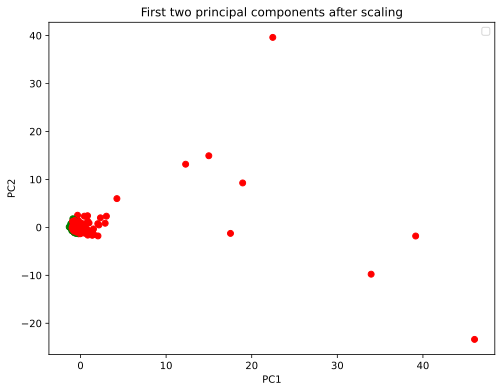

In [ ]:
pca = PCA(n_components=2)
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(DNAFragmentationDataSetBinaryData)
X_Scale = scaler.transform(DNAFragmentationDataSetBinaryData)
plt.figure(figsize=(8,6))
X = pca.fit_transform(X_Scale)
color_list = [{"Cancer":"r","Healthy":"g"}[x] for x in DNAFragmentationDataSetBinary.Class]
plot = plt.scatter(X[:,0], X[:,1], c=color_list)
#plt.legend(handles=plot.legend_elements()[0], labels=list(winedata['target_names']))
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("First two principal components after scaling")
l=list(DNAFragmentationDataSetBinary.Class)
plt.legend(handles=plot.legend_elements()[0], labels=color_list)
plt.show()

##Box plot:

In [ ]:

SBSPDATADF.rename(columns = {'class':'Class'}, inplace = True)
SBSPDATADF.head()

,Class,n_mut.SNP_in,n_mut.SNP_out,ichor,maf_targeted_seq,SBS1,SBS2,SBS3,SBS4,SBS5,...,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60,SBS84,SBS85
0,Cancer,26853,4291,0.04055,0.0000,100,34,0,0,42,...,28,12,0,0,0,0,0,0,17,0
1,Cancer,25164,3962,0.02652,0.0000,240,5,0,0,0,...,44,237,0,0,1,0,4,0,29,0
2,Cancer,26424,4069,0.03000,0.0093,169,32,0,0,0,...,35,67,0,0,0,0,13,0,0,0
3,Cancer,18932,2742,0.03575,0.0014,15,2,0,0,0,...,1,0,6,0,0,0,0,0,0,0
4,Cancer,24303,3673,0.03115,0.0000,29,10,0,0,0,...,0,0,5,0,0,76,0,0,0,0


In [ ]:
from csv import reader, writer
with open('SBSPDATA.csv') as f, open('destination.csv', 'w') as fw:
    writer(fw, delimiter=',').writerows(zip(*reader(f, delimiter=',')))


ValueError: ignored

<Figure size 5000x2000 with 0 Axes>

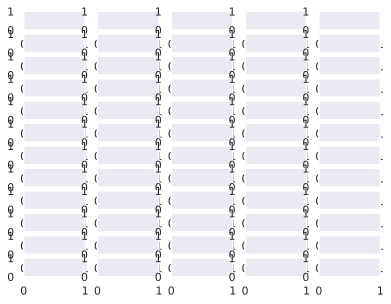

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

#set seaborn plotting aesthetics as default
sns.set()
df=SBSPDATADF
#define plotting region (1 row, 2 columns)
fig=plt.figure(figsize=(50,20))
fig, axes = plt.subplots(12, 5)
#create boxplot in each subplot
sns.violinplot(data=df, x='Class', y='SBS1', ax=axes[0])
sns.violinplot(data=df, x='Class', y='SBS2', ax=axes[1])

In [ ]:
tdata = pd.read_csv('destination.csv')
SbsName=tdata.iloc[4:,0]
SbsName.iloc[66]

'SBS85'

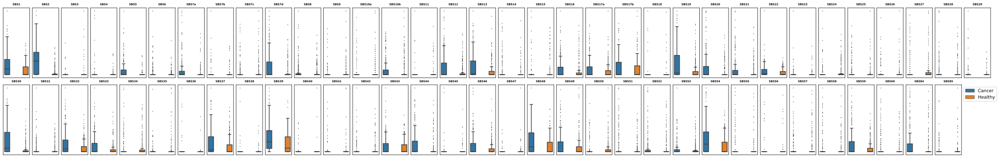

In [ ]:

import seaborn as sns
fig=plt.figure(figsize=(40,6))
# Usual boxplot
df=SBSPDATADF
for i in range(67):
  fig.add_subplot(2,34,i+1)
  ax = sns.boxplot(x=df.Class, y=df[SbsName.iloc[i]], data=df,hue=df.Class, fliersize=0.4)
  #ax = sns.swarmplot(x=df.Class, y=df[SbsName.iloc[i]], data=df, color="grey")
  #ax.set_ylim([0.0,800])
  #plt.title()
  ax.set_title(SbsName.iloc[i],rotation=0, fontdict={'size':6, 'weight': 'bold', 'color': 'black'})
  ax.set(ylabel=None, xlabel=None)
  ax.tick_params(left=False, bottom=False)
  ax.figure.subplots_adjust(hspace=0.1,wspace=0.1)#
  ax.set(yticklabels=[])  # remove the tick labels
  ax.tick_params(left=False)  # remove the ticks
  ax.set(xticklabels=[])  # remove the tick labels
  ax.tick_params(bottom=False)  # remove the ticks
  if i!=66:
    ax.legend_.remove()
  #ax.set_aspect(1)
#import matplotlib.patches as mpatches
#first_leg = mpatches.Patch(color='blue', label='1st plot')
#plt.legend(handles=[first_leg])
#plt.figlegend(loc='lower right',bbox_to_anchor=(0.95,0.15))
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
fig.savefig("SBSBoxPlot.png", bbox_inches='tight', dpi=300)
fig.savefig("SBSBoxPlot.pdf", bbox_inches='tight', dpi=300)

In [ ]:
df1=

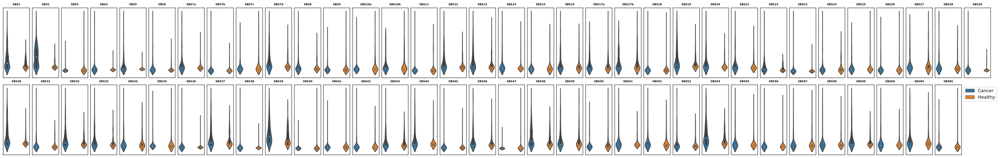

In [ ]:

import seaborn as sns
fig=plt.figure(figsize=(40,6))
# Usual boxplot
df=SBSPDATADF
for i in range(67):
  fig.add_subplot(2,34,i+1)
  ax = sns.violinplot(x=df.Class, y=df[SbsName.iloc[i]], data=df,hue=df.Class, fliersize=0.2)
  #ax = sns.swarmplot(x=df.Class, y=df[SbsName.iloc[i]], data=df, color="grey")
  #ax.set_ylim([0.0,800])
  #plt.title()
  ax.set_title(SbsName.iloc[i],rotation=0, fontdict={'size':6, 'weight': 'bold', 'color': 'black'})
  ax.set(ylabel=None, xlabel=None)
  ax.tick_params(left=False, bottom=False)
  ax.figure.subplots_adjust(hspace=0.1,wspace=0.1)#
  ax.set(yticklabels=[])  # remove the tick labels
  ax.tick_params(left=False)  # remove the ticks
  ax.set(xticklabels=[])  # remove the tick labels
  ax.tick_params(bottom=False)  # remove the ticks
  if i!=66:
    ax.legend_.remove()
  #ax.set_aspect(1)
#import matplotlib.patches as mpatches
#first_leg = mpatches.Patch(color='blue', label='1st plot')
#plt.legend(handles=[first_leg])
#plt.figlegend(loc='lower right',bbox_to_anchor=(0.95,0.15))
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
fig.savefig("SBSViolinPlot.png", bbox_inches='tight', dpi=300)
fig.savefig("SBSViolinPlot.pdf", bbox_inches='tight', dpi=300)

In [ ]:
import plotly.express as px


fig.add_subplot(1,2,2)
ax = sns.boxplot(x=df.Class, y=df.SBS2, data=df)
ax = sns.swarmplot(x=df.Class, y=df.SBS2, data=df, color="grey")
plt.xlabel('Time(Hrs)')
plt.ylabel('DRG_area')
plt.title("Replica: ")
plt.legend(loc="upper left")
ax.set_ylim([0.0,1000])
ax.set_ylabel('Area in ums')


df = px.data.tips()

fig = px.box(df, y="total_bill", color="smoker")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()
df

NameError: ignored

ValueError: ignored

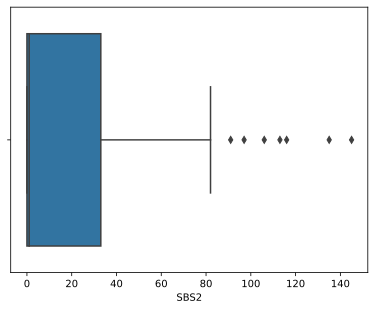

In [ ]:
import seaborn as sns
df = sns.load_dataset("titanic")
df=SBSPDATADF
#sns.boxplot(x=df["age"])
sns.boxplot(data=df, x="SBS2", hue="class")
sns.violinplot(data=df, x="SBS2", hue="lass",split=True)

<Axes: >

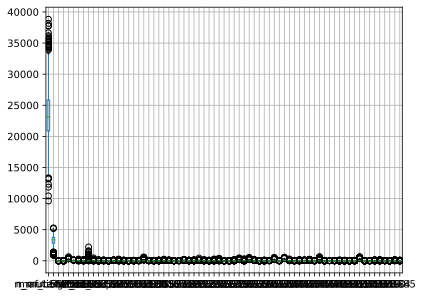

In [ ]:
import plotly.express as px

df=SBSPDATADF
fig = px.box(df,y="SBS2", color="class")
#fig = px.box(df,x="SBS1", color="class")
fig.show()
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()
df.boxplot()

ValueError: ignored

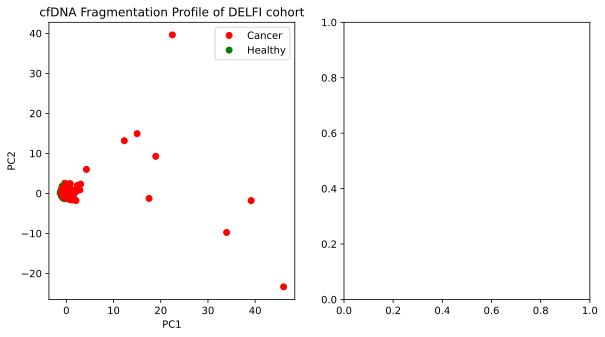

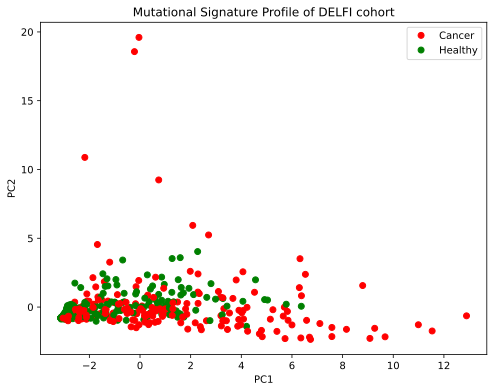

In [ ]:
import os

if not os.path.exists("images"):
    os.mkdir("images")
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn import preprocessing
fig = plt.figure(figsize=(15, 5))
scaler=StandardScaler()
scaler.fit(DNAFragmentationDataSetBinaryData)
X_Scale = scaler.transform(DNAFragmentationDataSetBinaryData)
X = pca.fit_transform(X_Scale)
label_encoder = preprocessing.LabelEncoder()
values=label_encoder.fit_transform(list(DNAFragmentationDataSetBinary.Class))
classes = ['Cancer', 'Healthy']
#values = [0, 0, 1, 2, 2, 2]
colors = ListedColormap(['r','g'])
fig.add_subplot(1,3,1)
scatter=plt.scatter(X[:,0], X[:,1], c=values, cmap=colors)
plt.legend(handles=scatter.legend_elements()[0], labels=classes)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("cfDNA Fragmentation Profile of DELFI cohort")

scaler=StandardScaler()
scaler.fit(SingProfileDFData)
X_Scale = scaler.transform(SingProfileDFData)
plt.figure(figsize=(8,6))
X = pca.fit_transform(X_Scale)
label_encoder = preprocessing.LabelEncoder()
values=label_encoder.fit_transform(list(SingProfileDF.Class))
classes = ['Cancer', 'Healthy']
#values = [0, 0, 1, 2, 2, 2]
colors = ListedColormap(['r','g'])
fig.add_subplot(1,3,2)
plt.scatter(X[:,0], X[:,1], c=values, cmap=colors)
plt.legend(handles=scatter.legend_elements()[0], labels=classes)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Mutational Signature Profile of DELFI cohort")

scaler=StandardScaler()
scaler.fit(CancerSEEK_BinaryData)
X_Scale = scaler.transform(CancerSEEK_BinaryData)
plt.figure(figsize=(8,6))
X = pca.fit_transform(X_Scale)
label_encoder = preprocessing.LabelEncoder()
values=label_encoder.fit_transform(list(CancerSEEK_Binary.Class))
classes = ['Cancer', 'Healthy']
#values = [0, 0, 1, 2, 2, 2]
colors = ListedColormap(['r','g'])
scatter=plt.scatter(X[:,0], X[:,1], c=values, cmap=colors)
fig.add_subplot(1,3,3)
plt.legend(handles=scatter.legend_elements()[0], labels=classes)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Mutational Signature Profile of DELFI cohort")

plt.savefig("PCA", facecolor='w', bbox_inches="tight", pad_inches=0.2, transparent=True)

In [ ]:
pca = PCA(n_components=3)
components = pca.fit_transform(DNAFragmentationDataSetBinaryData)

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=DNAFragmentationDataSetBinary.Class,
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

components = pca.fit_transform(SBSPDATADF)

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=DNAFragmentationDataSetBinary.Class,
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

**UMAP analysis**

In [ ]:
from umap import UMAP

In [ ]:
# Configure UMAP hyperparameters
reducer = UMAP(n_neighbors=15, # default 15, The size of local neighborhood (in terms of number of neighboring sample points) used for manifold approximation.
               n_components=2, # default 2, The dimension of the space to embed into.
               metric='euclidean', # default 'euclidean', The metric to use to compute distances in high dimensional space.
               n_epochs=1000, # default None, The number of training epochs to be used in optimizing the low dimensional embedding. Larger values result in more accurate embeddings.
               learning_rate=1.0, # default 1.0, The initial learning rate for the embedding optimization.
               init='spectral', # default 'spectral', How to initialize the low dimensional embedding. Options are: {'spectral', 'random', A numpy array of initial embedding positions}.
               min_dist=0.1, # default 0.1, The effective minimum distance between embedded points.
               spread=1.0, # default 1.0, The effective scale of embedded points. In combination with ``min_dist`` this determines how clustered/clumped the embedded points are.
               low_memory=False, # default False, For some datasets the nearest neighbor computation can consume a lot of memory. If you find that UMAP is failing due to memory constraints consider setting this option to True.
               set_op_mix_ratio=1.0, # default 1.0, The value of this parameter should be between 0.0 and 1.0; a value of 1.0 will use a pure fuzzy union, while 0.0 will use a pure fuzzy intersection.
               local_connectivity=1, # default 1, The local connectivity required -- i.e. the number of nearest neighbors that should be assumed to be connected at a local level.
               repulsion_strength=1.0, # default 1.0, Weighting applied to negative samples in low dimensional embedding optimization.
               negative_sample_rate=5, # default 5, Increasing this value will result in greater repulsive force being applied, greater optimization cost, but slightly more accuracy.
               transform_queue_size=4.0, # default 4.0, Larger values will result in slower performance but more accurate nearest neighbor evaluation.
               a=None, # default None, More specific parameters controlling the embedding. If None these values are set automatically as determined by ``min_dist`` and ``spread``.
               b=None, # default None, More specific parameters controlling the embedding. If None these values are set automatically as determined by ``min_dist`` and ``spread``.
               random_state=42, # default: None, If int, random_state is the seed used by the random number generator;
               metric_kwds=None, # default None) Arguments to pass on to the metric, such as the ``p`` value for Minkowski distance.
               angular_rp_forest=False, # default False, Whether to use an angular random projection forest to initialise the approximate nearest neighbor search.
               target_n_neighbors=-1, # default -1, The number of nearest neighbors to use to construct the target simplcial set. If set to -1 use the ``n_neighbors`` value.
               #target_metric='categorical', # default 'categorical', The metric used to measure distance for a target array is using supervised dimension reduction. By default this is 'categorical' which will measure distance in terms of whether categories match or are different.
               #target_metric_kwds=None, # dict, default None, Keyword argument to pass to the target metric when performing supervised dimension reduction. If None then no arguments are passed on.
               #target_weight=0.5, # default 0.5, weighting factor between data topology and target topology.
               transform_seed=42, # default 42, Random seed used for the stochastic aspects of the transform operation.
               verbose=False, # default False, Controls verbosity of logging.
               unique=False, # default False, Controls if the rows of your data should be uniqued before being embedded.
              )

# Fit and transform the data
X_trans = reducer.fit_transform(x)

# Check the shape of the new data
print('Shape of X_trans: ', X_trans.shape)

Shape of X_trans:  (405, 2)


In [ ]:
umap_2d = UMAP(random_state=0)
umap_2d.fit(DNAFragmentationDataSetBinaryData)

projections = umap_2d.transform(DNAFragmentationDataSetBinaryData)

fig = px.scatter(
    projections, x=0, y=1,
    color=DNAFragmentationDataSetBinary.Class
)
fig.show()

**TSNE analysis:**

In [ ]:
from sklearn.manifold import TSNE
import plotly.express as px

#df = px.data.iris()
#features = df.loc[:, :'petal_width']

tsne = TSNE(n_components=2, random_state=0)
projections = tsne.fit_transform(DNAFragmentationDataSetBinaryData)

fig = px.scatter(
    projections, x=0, y=1,
    color=DNAFragmentationDataSetBinary.Class
)
fig.show()


In [ ]:
components.shape

(405, 2)

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 2)

X_train = pca.fit_transform(X_train)
#X_test = pca.transform(X_test)

explained_variance = pca.explained_variance_ratio_
explained_variance
X_train

In [ ]:
clf = RandomForestClassifier(n_estimators=500, criterion='gini', max_features='auto', bootstrap=True,verbose=0)
#y_pred = classifier.predict(X_test)
#cm = confusion_matrix(y_test, y_pred)

In [ ]:
acc=model_evaluation(clf,X_train,sbsy)

In [ ]:
from matplotlib.colors import ListedColormap

X_set, y_set = X_train, y_train
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1,
                     stop = X_set[:, 0].max() + 1, step = 0.01),
                     np.arange(start = X_set[:, 1].min() - 1,
                     stop = X_set[:, 1].max() + 1, step = 0.01))

plt.contourf(X1, X2, classifier.predict(np.array([X1.ravel(),
             X2.ravel()]).T).reshape(X1.shape), alpha = 0.75,
             cmap = ListedColormap(('yellow', 'white', 'aquamarine')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(y_set)):
    plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
                c = ListedColormap(('red', 'green', 'blue'))(i), label = j)

plt.title('Logistic Regression (Training set)')
plt.xlabel('PC1') # for Xlabel
plt.ylabel('PC2') # for Ylabel
plt.legend() # to show legend

# show scatter plot
plt.show()

ValueError: ignored

UMAP

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 28.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82816 sha256=8559183092e26e2886c438ea9cbd2dcfe7a86c2c91ffe8b855b5753598a346c8
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55622 sha256=16be931e06fdf016b7cdef95d6214b42e73b63fba19e2e0a9d279258f43fbfb5
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


In [ ]:
# Visualization
import plotly.express as px # for data visualization
import matplotlib.pyplot as plt # for showing handwritten digits

# Skleran
from sklearn.datasets import load_digits # for MNIST data
from sklearn.model_selection import train_test_split # for splitting data into train and test samples

# UMAP dimensionality reduction
from umap import UMAP

ModuleNotFoundError: ignored

In [ ]:
x.head()

,n_mut.SNP_in,n_mut.SNP_out,ichor,maf_targeted_seq,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,...,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60,SBS84,SBS85
0,26853,4291,0.04055,0.0000,100,34,0,0,42,0,...,28,12,0,0,0,0,0,0,17,0
1,25164,3962,0.02652,0.0000,240,5,0,0,0,0,...,44,237,0,0,1,0,4,0,29,0
2,26424,4069,0.03000,0.0093,169,32,0,0,0,0,...,35,67,0,0,0,0,13,0,0,0
3,18932,2742,0.03575,0.0014,15,2,0,0,0,0,...,1,0,6,0,0,0,0,0,0,0
4,24303,3673,0.03115,0.0000,29,10,0,0,0,0,...,0,0,5,0,0,76,0,0,0,0


In [ ]:
# Configure UMAP hyperparameters
reducer = UMAP(n_neighbors=15, # default 15, The size of local neighborhood (in terms of number of neighboring sample points) used for manifold approximation.
               n_components=2, # default 2, The dimension of the space to embed into.
               metric='euclidean', # default 'euclidean', The metric to use to compute distances in high dimensional space.
               n_epochs=1000, # default None, The number of training epochs to be used in optimizing the low dimensional embedding. Larger values result in more accurate embeddings.
               learning_rate=1.0, # default 1.0, The initial learning rate for the embedding optimization.
               init='spectral', # default 'spectral', How to initialize the low dimensional embedding. Options are: {'spectral', 'random', A numpy array of initial embedding positions}.
               min_dist=0.1, # default 0.1, The effective minimum distance between embedded points.
               spread=1.0, # default 1.0, The effective scale of embedded points. In combination with ``min_dist`` this determines how clustered/clumped the embedded points are.
               low_memory=False, # default False, For some datasets the nearest neighbor computation can consume a lot of memory. If you find that UMAP is failing due to memory constraints consider setting this option to True.
               set_op_mix_ratio=1.0, # default 1.0, The value of this parameter should be between 0.0 and 1.0; a value of 1.0 will use a pure fuzzy union, while 0.0 will use a pure fuzzy intersection.
               local_connectivity=1, # default 1, The local connectivity required -- i.e. the number of nearest neighbors that should be assumed to be connected at a local level.
               repulsion_strength=1.0, # default 1.0, Weighting applied to negative samples in low dimensional embedding optimization.
               negative_sample_rate=5, # default 5, Increasing this value will result in greater repulsive force being applied, greater optimization cost, but slightly more accuracy.
               transform_queue_size=4.0, # default 4.0, Larger values will result in slower performance but more accurate nearest neighbor evaluation.
               a=None, # default None, More specific parameters controlling the embedding. If None these values are set automatically as determined by ``min_dist`` and ``spread``.
               b=None, # default None, More specific parameters controlling the embedding. If None these values are set automatically as determined by ``min_dist`` and ``spread``.
               random_state=42, # default: None, If int, random_state is the seed used by the random number generator;
               metric_kwds=None, # default None) Arguments to pass on to the metric, such as the ``p`` value for Minkowski distance.
               angular_rp_forest=False, # default False, Whether to use an angular random projection forest to initialise the approximate nearest neighbor search.
               target_n_neighbors=-1, # default -1, The number of nearest neighbors to use to construct the target simplcial set. If set to -1 use the ``n_neighbors`` value.
               #target_metric='categorical', # default 'categorical', The metric used to measure distance for a target array is using supervised dimension reduction. By default this is 'categorical' which will measure distance in terms of whether categories match or are different.
               #target_metric_kwds=None, # dict, default None, Keyword argument to pass to the target metric when performing supervised dimension reduction. If None then no arguments are passed on.
               #target_weight=0.5, # default 0.5, weighting factor between data topology and target topology.
               transform_seed=42, # default 42, Random seed used for the stochastic aspects of the transform operation.
               verbose=False, # default False, Controls verbosity of logging.
               unique=False, # default False, Controls if the rows of your data should be uniqued before being embedded.
              )

# Fit and transform the data
X_trans = reducer.fit_transform(x)

# Check the shape of the new data
print('Shape of X_trans: ', X_trans.shape)

Shape of X_trans:  (405, 2)


In [ ]:
sns.scatterplot(data=tips, x="total_bill", y="tip", hue="time")

In [ ]:
#LR
logreg = linear_model.LogisticRegression(C=1000, n_jobs=-1)
logreg.fit(X_trans, y)
#print("C =", logreg.C_)
# calculate the average score for each C
#avgscores = mean(logreg.scores_['Normal'],0)  # 2 is the class label
#plt.semilogx(logreg.Cs_, avgscores, 'ko-')
#plt.xlabel('C'); plt.ylabel('average CV accuracy'); plt.grid(True)
#acc,fpr,tpr,roc=model_evaluation(logreg)
acc=model_evaluation(clf,X_trans,y)

NameError: name 'X_trans' is not defined

LDA

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

lda = LDA(solver='eigen', tol=0.005,n_components=1)
X_train = lda.fit_transform(X_train, y)
#X_test = lda.transform(X_test)
#model = LinearDiscriminantAnalysis()
#X_trans = model.fit_transform(x,y)
#logreg = linear_model.LogisticRegression(C=1000, n_jobs=-1)
clf = RandomForestClassifier(n_estimators=500, criterion='gini', max_features='auto', bootstrap=True,verbose=0)
acc=model_evaluation(clf,X_train,y)

InvalidParameterError: The 'max_features' parameter of cross_val_predict must be an int in the range [1, inf), a float in the range (0.0, 1.0], a str among {'log2', 'sqrt'} or None. Got 'auto' instead.

In [ ]:
grid = dict()
grid['solver'] = ['svd', 'lsqr', 'eigen']
# define search
search = GridSearchCV(model, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(x,y)
acc=model_evaluation(results,x,y)

NameError: name 'model' is not defined

In [ ]:
y

,cancer_type
0,Gastric.cancer
1,Gastric.cancer
2,Gastric.cancer
3,Gastric.cancer
4,Ovarian.Cancer
...,...
400,Colorectal.Cancer
401,Colorectal.Cancer
402,Colorectal.Cancer
403,Colorectal.Cancer


In [ ]:
#RF
clf = RandomForestClassifier(n_estimators=500, criterion='gini', max_features='auto', bootstrap=True,verbose=0)
#y_pred = classifier.predict(X_test)
acc=model_evaluation(clf,x,y)

InvalidParameterError: The 'max_features' parameter of cross_val_predict must be an int in the range [1, inf), a float in the range (0.0, 1.0], a str among {'log2', 'sqrt'} or None. Got 'auto' instead.

Test accuracy = 0.7308641975308642
              precision    recall  f1-score   support

      Cancer       0.76      0.66      0.71       199
     Healthy       0.71      0.80      0.75       206

    accuracy                           0.73       405
   macro avg       0.73      0.73      0.73       405
weighted avg       0.73      0.73      0.73       405

[[132  67]
 [ 42 164]]


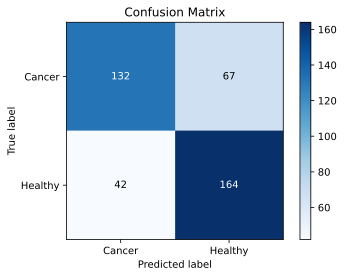

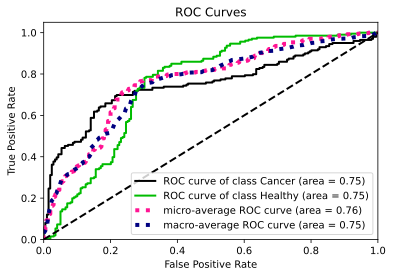

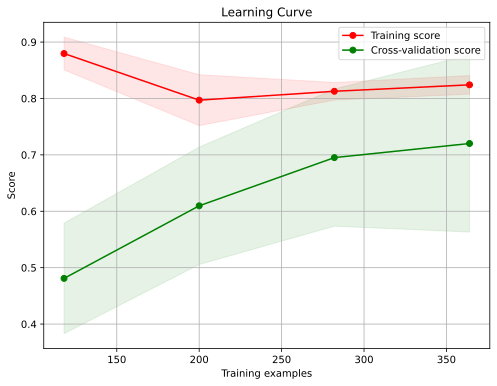

In [ ]:
#LR
logreg = linear_model.LogisticRegression(C=1000, n_jobs=-1)
logreg.fit(x, y)
#print("C =", logreg.C_)
# calculate the average score for each C
#avgscores = mean(logreg.scores_['Normal'],0)  # 2 is the class label
#plt.semilogx(logreg.Cs_, avgscores, 'ko-')
#plt.xlabel('C'); plt.ylabel('average CV accuracy'); plt.grid(True)
#acc,fpr,tpr,roc=model_evaluation(logreg)
acc=model_evaluation(logreg,x,y)

In [ ]:
from sklearn.metrics import accuracy_score

def SFLA_RFC(x_traincv, y_traincv,x_testcv, y_testcv,ntree,mxdpt,mss):
    ntree=int(np.round(ntree))
    mxdpt=int(np.round(mxdpt))
    mss=int(np.round(mss))
    global ac
    clf = RandomForestClassifier(n_estimators=ntree, criterion='gini', max_depth=mxdpt, min_samples_split=mss, max_features='auto', bootstrap=True,verbose=0).fit(x_traincv, y_traincv)
    y_score = clf.predict_proba(x_testcv)[:,1]
    fpr, tpr, threshold = metrics.roc_curve(y_testcv, y_score, pos_label=1)
    roc_auc = metrics.auc(fpr,tpr)
    predictions = clf.predict(x_testcv)
    ac=accuracy_score(y_testcv,predictions)
    #au=(au+roc_auc)
   # ac=(ac+acc)
   # cn=cn+1
    #print("%5d: AUC=%0.4f ---> accuracy=%0.3f parameters:{ntree= %3d mxdpt=%3d mss=%3d}"%(cn-1,roc_auc,acc,ntree,mxdpt,mss))
    return roc_auc

In [ ]:
def SFLA_RF_CV(x_train, y_train,n,ntree,mxdpt,mss):
    global cn,ac, au
    nauc=0
    KF = KFold(n_splits=n,shuffle=True, random_state=920)
    f = []
    accy=[]
    for train_indexcv,test_indexcv in KF.split(x_train):
        x_traincv, x_testcv = x_train.iloc[train_indexcv][:], x_train.iloc[test_indexcv][:]
        y_traincv, y_testcv = y_train.iloc[train_indexcv][:], y_train.iloc[test_indexcv][:]
        fq = SFLA_RFC(x_traincv, y_traincv,x_testcv, y_testcv,ntree,mxdpt,mss)
        f.append(fq)
        accy.append(ac)
    f = mean(f)
    acc = mean(accy)
    cn=cn+1
    if f>=nauc:
      nauc=f
      print("New AUC: %0.3f"%(nauc))
      print("%5d: CV: AUC=%0.4f ---> accuracy=%0.3f parameters:{ntree= %3d mxdpt=%3d mss=%3d}"%(cn-1,f,acc,ntree,mxdpt,mss))
    print("%5d: CV: AUC=%0.4f ---> accuracy=%0.3f parameters:{ntree= %3d mxdpt=%3d mss=%3d}"%(cn-1,f,acc,ntree,mxdpt,mss))
    return f

In [ ]:
def SFLA_RF(num_parameter,num_global,num_local,m,n,q,n1,rangeNtree,rangeMdept,rangeMss, x_train,y_train):
    ntree =1
    mdept = 1
    mss=2
    max_step = [(rangeNtree[1]-rangeNtree[0])/ntree,(rangeMdept[1]-rangeMdept[0])/mdept, (rangeMss[1]-rangeMss[0])/mss]# maximum step size

    #--- Step 1--Generate initial population ---#
    frogC = 10**random.uniform(log10(rangeNtree[0]),log10(rangeNtree[1]),m*n)
    frogGamma = 10**random.uniform(log10(rangeMdept[0]),log10(rangeMdept[1]),m*n)
    frogMss = 10**random.uniform(log10(rangeMss[0]),log10(rangeMss[1]),m*n)
    frog = c_[frogC,frogGamma,frogMss]

    KF = KFold(n_splits=n1,shuffle=True, random_state=920)
    f = zeros((m*n,n1))
    j = 0
    for train_indexcv,test_indexcv in KF.split(x_train):
        x_traincv, x_testcv = x_train.iloc[train_indexcv][:], x_train.iloc[test_indexcv][:]
        y_traincv, y_testcv = y_train.iloc[train_indexcv][:], y_train.iloc[test_indexcv][:]
        for i in range(m*n):
            f[i,j] = SFLA_RFC(x_traincv, y_traincv,x_testcv, y_testcv,frog[i,0],frog[i,1],frog[i,2])
        j+=1
    f = f.mean(axis=1)
    print("%5d: AUC=%0.4f ---> accuracy=%0.3f parameters:{ntree= %3d mxdpt=%3d mss=%3d}"%(cn-1,f,acc,ntree,mxdpt,mss))

    f_parameter = c_[f,frog]

    #--- Step 2--Rank frogs ---#
    f_parameter = f_parameter[argsort(f_parameter[:,0])[::-1]]

    i_global = 0
    flag = 0
    fBest_iteration = f_parameter[0,0]
    weights = [2*(n+1-j)/(n*(n+1)) for j in range(1,n+1)] # weights of ranked frogs in each memeplex
    while i_global < num_global:
        frog_gb = f_parameter[0,0] # mark the global best frog
        #--- Step 3--Partition frogs into memeplexes ---#
        memeplexes = zeros((m,n,num_parameter+1)) # [memeplexes, frog in memeplex,[f,C,Gamma] ]
        for i in range(m):
            memeplexes[i] = f_parameter[linspace(i,m*n+i,num=n,endpoint=False,dtype=int)]

        im = 0 # the number of memeplexes that have been optimized
        while im < m:
            i_local = 0 # counts the number of local evolutionary steps in each memeplex
            while i_local < num_local:

                #--- Construct a submemeplex ---#
                rValue = random.random(n)*weights # random value with probability weights
                subindex = sort(argsort(rValue)[::-1][0:q]) # index of selected frogs in memeplex
                submemeplex = memeplexes[im][subindex] # form submemeplex

                #--- Improve the worst frog's position ---#
                # Learn from local best Pb #
                Pb = submemeplex[0] # mark the best frog in submemeplex
                Pw = submemeplex[q-1] # mark the worst frog in memeplex
                S = (Pb-Pw)[1:]*(Pb-Pw)[0]
                Uq = Pw[1:]+S
                # Check feasible space and the performance #
                if (rangeNtree[0] <= Uq[0] <=rangeNtree[1]) and (rangeMdept[0] <= Uq[1] <=rangeMdept[1]) and (rangeMss[0] <= Uq[2] <=rangeMss[1]): # check feasible space
                    fq = SFLA_RF_CV(x_train, y_train,n1,Uq[0],Uq[1],Uq[2])
                    if fq < Pw[0]: # if no improvement of performance,learn from global best randomly #
                        S = random.random(num_parameter)*(frog_gb-Pw)[1:]
                        for i in range(num_parameter):
                            if S[i] > 0:
                                S[i] = min(S[i],max_step[i])
                            else:
                                S[i] = min(S[i],-max_step[i])
                        Uq = Pw[1:]+S
                        if (rangeNtree[0] <= Uq[0] <=rangeNtree[1]) and (rangeMdept[0] <= Uq[1] <=rangeMdept[1]) and (rangeMss[0] <= Uq[2] <=rangeMss[1]): # check feasible space
                            fq = SFLA_RF_CV(x_train, y_train,n1,Uq[0],Uq[1],Uq[2])
                            if fq < Pw[0]: # if no improvement of performance, randomly generate a new frog
                                Uq = [10**random.uniform(log10(rangeNtree[0]),log10(rangeNtree[1])),10**random.uniform(log10(rangeMdept[0]),log10(rangeMdept[1])), 10**random.uniform(log10(rangeMss[0]),log10(rangeMss[1]))]
                                fq = SFLA_RF_CV(x_train, y_train,n1,Uq[0],Uq[1],Uq[2])
                        else: # if not in the feasible space, randomly generate a new frog
                            Uq = [10**random.uniform(log10(rangeNtree[0]),log10(rangeNtree[1])), 10**random.uniform(log10(rangeMdept[0]),log10(rangeMdept[1])),10**random.uniform(log10(rangeMss[0]),log10(rangeMss[1]))]
                            fq = SFLA_RF_CV(x_train, y_train,n1,Uq[0],Uq[1],Uq[2])
                else: # if not in the feasible space, learn from global best randomly
                    S = random.random(num_parameter)*(frog_gb-Pw)[1:]
                    for i in range(num_parameter):
                        if S[i] > 0:
                            S[i] = min(S[i],max_step[i])
                        else:
                            S[i] = min(S[i],-max_step[i])
                    Uq = Pw[1:]+S
                    if (rangeNtree[0] <= Uq[0] <=rangeNtree[1]) and (rangeMdept[0] <= Uq[1] <=rangeMdept[1])and (rangeMss[0] <= Uq[2] <=rangeMss[1]): # check feasible space
                        fq = SFLA_RF_CV(x_train, y_train,n1,Uq[0],Uq[1],Uq[2])
                        if fq < Pw[0]:
                            Uq = [10**random.uniform(log10(rangeNtree[0]),log10(rangeNtree[1])), 10**random.uniform(log10(rangeMdept[0]),log10(rangeMdept[1])),10**random.uniform(log10(rangeMss[0]),log10(rangeMss[1]))]
                            fq = SFLA_RF_CV(x_train, y_train,n1,Uq[0],Uq[1],Uq[2])
                    else: #
                        Uq = [10**random.uniform(log10(rangeNtree[0]),log10(rangeNtree[1])), 10**random.uniform(log10(rangeMdept[0]),log10(rangeMdept[1])),10**random.uniform(log10(rangeMss[0]),log10(rangeMss[1]))]
                        fq = SFLA_RF_CV(x_train, y_train,n1,Uq[0],Uq[1],Uq[2])

                #--- Upgrade the memeplex ---#
                memeplexes[im][subindex[q-1]] = r_[fq,Uq]
                memeplexes[im] =  memeplexes[im][argsort( memeplexes[im][:,0])[::-1]]

                i_local += 1

            im += 1
        #######--- Local search end---######

        #--- Step 5--Shuffle memeplexes ---#
        f_parameter =  memeplexes.reshape(m*n,num_parameter+1)
        f_parameter = f_parameter[argsort(f_parameter[:,0])[::-1]]

        i_global += 1

        #--- Step 6--Check convergence ---#
        if f_parameter[0,0] > 0.999:
            print('The program was terminated because it reached the optimization goal with f = %.3f' %f_parameter[0,0])
            break
        fBest_iteration = r_[fBest_iteration,f_parameter[0,0]]

    #######--- Global search end---######

    return (f_parameter[0],fBest_iteration)

In [ ]:
#--- Ensemble ---#
def OptimizeRF_SFLA_CV(x,y,n_splits,num_parameter,num_global,num_local,m,n,q,n1,rangeNtree,rangeMdept, rangeMss):
    KF = KFold(n_splits,shuffle=True, random_state=920)
    y_score = []
    y_test = []
    for train_index,test_index in KF.split(x):
        #---  Seperate traing set and test set ---#
        x_train, x_test = x.iloc[train_index][:], x.iloc[test_index][:]
        y_train = y.iloc[train_index][:]

        #---  Fill NaN age ---#
        x_train[isnan(x_train)] = 0
        x_test[isnan(x_test)] = 0

        ##---  optimize SVM with SFLA---##
        x_train = pd.DataFrame(x_train)
        y_train = pd.Series(y_train)

        f_parameter,fBest_iteration = SFLA_RF(num_parameter,num_global,num_local,m,n,q,n1,rangeNtree, rangeMdept,rangeMss, x_train,y_train)

            ##---  creat and train the model ---##
        p1=int(np.round(f_parameter[1]))
        p2=int(np.round(f_parameter[2]))
        p3=int(np.round(f_parameter[3]))
        clf = RandomForestClassifier(n_estimators=p1, criterion='gini', max_depth=p2, min_samples_split=p3, max_features='auto', bootstrap=True)
        print(f_parameter)
        clf.fit(x_train, y_train)
        # Plot ROC and calculate AUC
        y_score.extend([x[1] for x in clf.predict_proba(x_test).tolist()])
        y_test.extend(y[test_index].tolist())
        fpr, tpr, threshold = roc_curve(y[test_index], clf.predict_proba(x_test)[:, 1], pos_label=1)
        roc_auc = auc(fpr,tpr)
        print('Final AUC:',roc_auc)
    print("%5d: AUC=%0.4f ---> accuracy=%0.3f parameters:{ntree= %3d mxdpt=%3d mss=%3d}"%(cn-1,au,ac,p1,p2,p3))

    # Plot ROC and calculate AUC
    fpr, tpr, threshold = roc_curve(y_test, y_score, pos_label=1)
    roc_auc = auc(fpr,tpr)
#     plt.plot(fpr, tpr, lw=2, label='SVM (AUC = %0.4f)' % roc_auc, linestyle='--')
    y_pred = []
    for i in range(len(y_score)):
        y_pred.append(round(y_score[i]))
    print(cm(y_test,y_pred))
    a = accuracy_score(y_test,y_pred)
    p = precision_score(y_test,y_pred)
    r = recall_score(y_test,y_pred)
    f1score = f1_score(y_test,y_pred)
    print("****************************************** Best Result********************************")
    print('Accuracy is %0.2f\nPrecision is %0.2f\nRecall is %0.2f\nF1 is %0.2f\nAUC is %0.4f\n'% (a, p, r, f1score, roc_auc))
    return clf, a, p, r, f1score,roc_auc, y_pred,y_score,fpr, tpr

In [ ]:
def plot_vertical_line(x,y,color,marker):
    fig = plt.figure()
    for i in range(size(x)):
        x0 = [x[i], x[i]]
        y0 = [min(y)-0.005, y[i]]
        plt.plot(x0,y0,color=color)
    plt.scatter(x, y, color=color, alpha=0.5, marker=marker)
    return fig

In [ ]:
import time
start = time.process_time()
n_splits = 10 # number of splits for outer loop
num_parameter = 3# number of parameter to optimize
num_global = 10# the maximum number of global iterations
num_local = 10# the maximum number of local iterations
m =3 # the number of memeplexes
n = 5 # the number of frogs in each memeplex
q = 4 # the number of frogs in submemeplex
n1 = 10 # number of splits for inner loop
rangeNtree = [10, 2*10**3] # list, float, range of parameter C,eg.[10**-2, 10**2]
rangeMdept = [1, 10]
rangeMss = [2, 10]# list, float, range of parameter Gamma,eg.[10**-6, 1]
cn=1
au=0.0
ac=0.0
clf, a, p, r, f1score,roc_auc, y_pred,y_score,fpr, tpr = OptimizeRF_SFLA_CV(x,y,n_splits,num_parameter,num_global,num_local,m,n,q,n1,rangeNtree,rangeMdept,rangeMss)
end = time.process_time()
print('OptimizeRF_SFLA_CV algorithm takes '+str(end - start)+'seconds.\n')

NameError: ignored

#SBS heatmap

In [ ]:
import os,sys
%matplotlib inline
# %matplotlib
import matplotlib.pylab as plt
from matplotlib.colors import LinearSegmentedColormap
import pickle
plt.rcParams['figure.dpi'] = 80
plt.rcParams['savefig.dpi']=300
# sys.path.append(os.path.expanduser("~/Projects/Github/PyComplexHeatmap/"))
import PyComplexHeatmap
from PyComplexHeatmap import *

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
annotation = pd.read_csv('SBSPDATA-REF-Heatmap.csv')
fdata=annotation.iloc[:,3:11]
fdata=fdata.replace(np.nan, 0)
adata=annotation.iloc[:,11:]
fdata

,maf_targeted_seq,SBS1,SBS2,SBS5,SBS30,SBS39,SBS54,SBS59
0,0.0000,108,41,371,0,138,0,0
1,0.0000,145,11,903,0,72,38,21
2,0.0093,72,0,0,0,54,167,0
3,0.0014,651,47,2218,166,506,590,0
4,0.0000,55,0,0,0,32,0,1
...,...,...,...,...,...,...,...,...
400,0.0000,0,0,0,0,228,37,0
401,0.0000,0,0,0,0,34,0,0
402,0.0000,124,0,0,0,82,24,16
403,0.0000,0,0,0,29,24,90,4


In [ ]:
SingDataDF = pd.read_csv('SBSPDATA-REF.csv')
SingDataDFClass=SingDataDF.iloc[:,0]
SingDataDFData=SingDataDF.iloc[:,1:]
SingDataDFData=SingDataDFData.replace(np.nan, 0)
SingDataDFData
col=list(SingDataDFData.columns)
col

['n_mut.SNP_in',
 'n_mut.SNP_out',
 'ichor',
 'maf_targeted_seq',
 'SBS1',
 'SBS2',
 'SBS5',
 'SBS30',
 'SBS39',
 'SBS54',
 'SBS59']

In [ ]:
SingDataDF2 = pd.read_csv('SBSPDATA.csv')
SingDataDFClass=SingDataDF2.iloc[:,0]
SingDataDFData2=SingDataDF2.iloc[:,3:]
SingDataDFData2=SingDataDFData2.replace(np.nan, 0)
SingDataDFData2

,ichor,maf_targeted_seq,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,SBS7a,SBS7b,...,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60,SBS84,SBS85
0,0.04055,0.0000,100,34,0,0,42,0,0,0,...,28,12,0,0,0,0,0,0,17,0
1,0.02652,0.0000,240,5,0,0,0,0,123,0,...,44,237,0,0,1,0,4,0,29,0
2,0.03000,0.0093,169,32,0,0,0,0,37,32,...,35,67,0,0,0,0,13,0,0,0
3,0.03575,0.0014,15,2,0,0,0,0,18,0,...,1,0,6,0,0,0,0,0,0,0
4,0.03115,0.0000,29,10,0,0,0,0,0,0,...,0,0,5,0,0,76,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
400,0.64500,0.4303,29,67,0,0,0,27,0,0,...,0,161,0,0,0,56,39,0,0,0
401,0.23870,0.8161,253,45,0,42,324,0,8,0,...,0,269,0,0,147,7,18,0,0,0
402,0.22380,0.3600,34,145,0,0,49,128,0,0,...,0,184,0,0,0,0,16,0,22,17
403,0.02825,0.0000,194,0,78,0,541,0,139,0,...,0,114,0,0,0,48,11,3,66,0


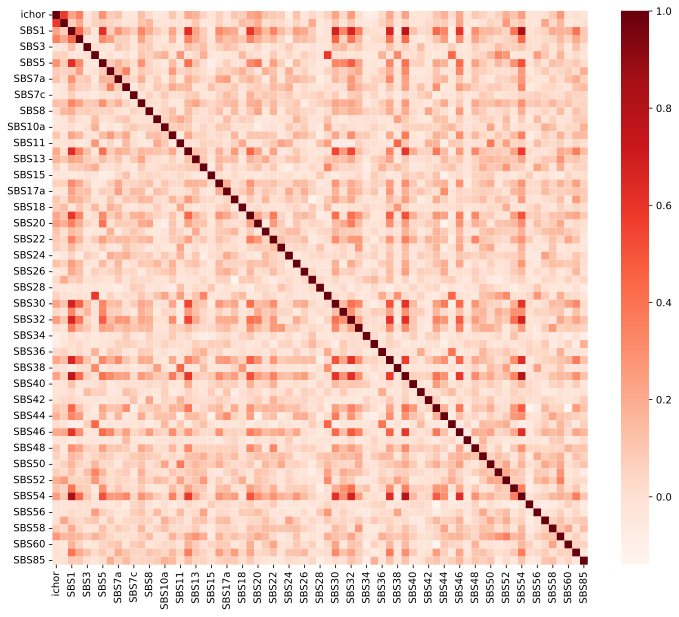

In [ ]:
import seaborn as sns
import pandas as pd
import numpy as np
plt.figure(figsize=(12,10))
cor = SingDataDFData2.corr()
sns.heatmap(cor, annot=False, cmap=plt.cm.Reds)
plt.savefig("SPCorrelationHM.png", bbox_inches='tight', dpi=600)

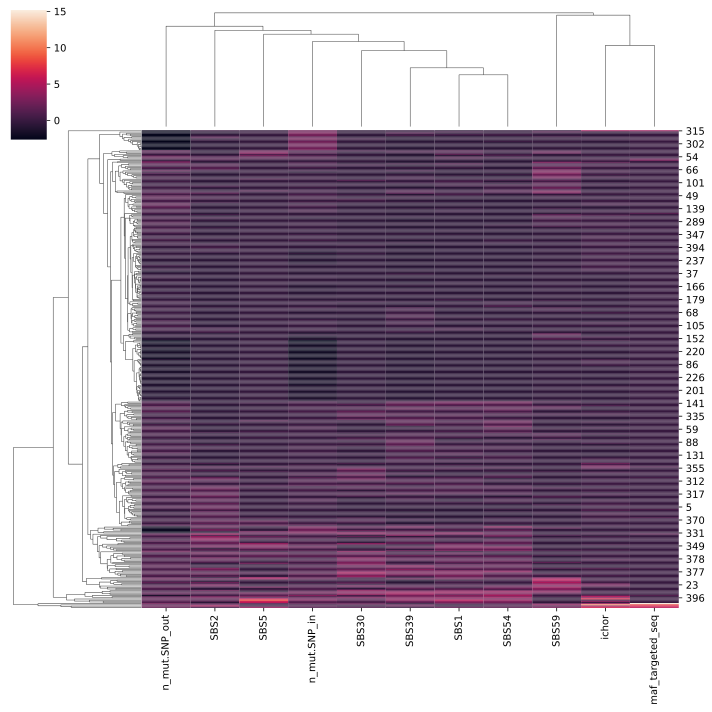

In [ ]:
import warnings
warnings.filterwarnings('ignore')
d=SingDataDFData.copy()
#df =d.drop(columns="maf_targeted_seq")
#df = df.set_index('class')
std_scaler = StandardScaler()
df_scaled = std_scaler.fit_transform(d.to_numpy())
df = pd.DataFrame(df_scaled, columns=col)
sns.clustermap(df)
plt.savefig("SPHM.png", bbox_inches='tight', dpi=300)


In [ ]:
row_colors_dict={'Group': {'Gastric.cancer': 'darkorange',
  'Ovarian.Cancer': 'skyblue',
  'Lung.Cancer': 'orangered',
  'Healthy': 'wheat',
  'Pancreatic.Cancer': 'yellowgreen',
  'Breast.Cancer': 'darkgray',
  'Colorectal.Cancer': 'blue'},
 'Target': {'Cancer': 'red', 'Healthy': 'green'}}

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


Starting plotting HeatmapAnnotations


Plotting legends..


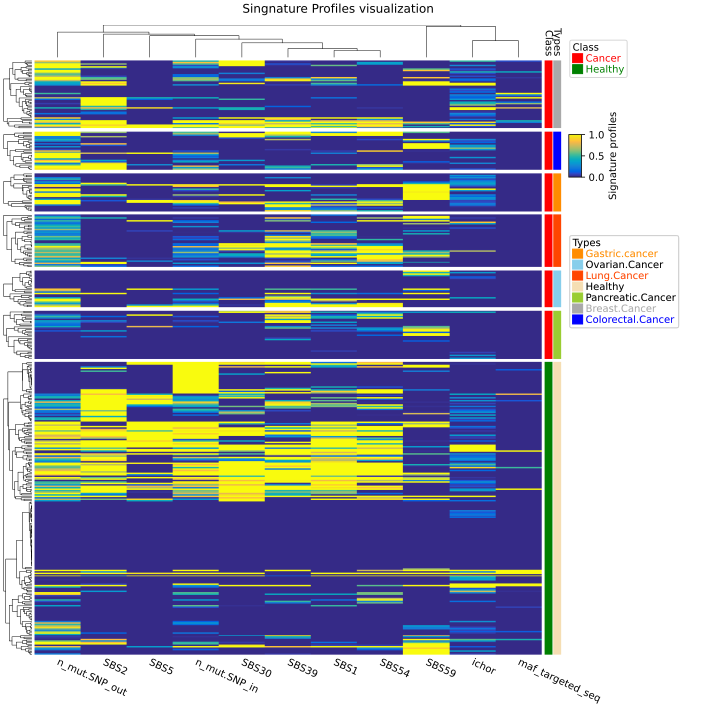

In [ ]:
row_ha = HeatmapAnnotation(Class=anno_simple(adata['class'],colors=row_colors_dict['Target'],rasterized=True),
                           Types=anno_simple(adata.cancer_type,colors=row_colors_dict['Group'],rasterized=True),
                           axis=0)
#col_ha= HeatmapAnnotation(label=anno_label(df_col.Strain,merge=True,rotation=15),
 #                         Strain=anno_simple(df_col.Strain,add_text=True),
 #                         Tissue=df_col.Tissue,Sex=df_col.Sex,
 #                         axis=1)
plt.figure(figsize=(10, 10))
cm = ClusterMapPlotter(data=df, right_annotation=row_ha,#top_annotation=row_ha,
                     show_rownames=False,show_colnames=True,
                     row_dendrogram=True,col_dendrogram=True,
                     row_split=adata.loc[:,['class', 'cancer_type']],
                     cmap='parula',#col_split=df_col['Strain'],
                     xticklabels_kws={'labelrotation':-25,'labelcolor':'black'},
                     yticklabels_kws={'labelrotation':-25,'labelcolor':'black'},
                     rasterized=True,row_split_gap=1,legend=True,legend_anchor='auto',legend_width=50,vmax=1,vmin=0,center=0.5,
                        plot=True,label='Signature profiles',legend_vpad=5,legend_gap=20)
cm.ax.set_title("Singnature Profiles visualization",x=0.6,y=1.01)
plt.savefig("SingtureHM.pdf", bbox_inches='tight')
plt.savefig("SingtureHM.png", bbox_inches='tight')
plt.show()

In [ ]:
std_scaler = StandardScaler()
df_scaled = std_scaler.fit_transform(fdata.to_numpy())

scaler = MinMaxScaler()
df_scaled2 = scaler.fit_transform(SingDataDFData.to_numpy())
df_scaled2 = pd.DataFrame(df_scaled2, columns=col)
df_scaled2

,n_mut.SNP_in,n_mut.SNP_out,ichor,maf_targeted_seq,SBS1,SBS2,SBS5,SBS30,SBS39,SBS54,SBS59
0,0.590159,0.772634,0.062868,0.000000,0.153610,0.234483,0.018936,0.150743,0.357639,0.018750,0.000000
1,0.532324,0.697605,0.041116,0.000000,0.368664,0.034483,0.000000,0.299363,0.517361,0.370313,0.070175
2,0.575469,0.722007,0.046512,0.011396,0.259601,0.220690,0.000000,0.000000,0.223958,0.104688,0.228070
3,0.318929,0.419384,0.055426,0.001715,0.023041,0.013793,0.000000,0.000000,0.046875,0.000000,0.000000
4,0.502842,0.631699,0.048295,0.000000,0.044547,0.068966,0.000000,0.084926,0.112847,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
400,0.526195,0.774914,1.000000,0.527264,0.044547,0.462069,0.000000,0.316348,0.423611,0.251563,0.684211
401,0.738152,1.000000,0.370078,1.000000,0.388633,0.310345,0.146078,0.426752,0.130208,0.420313,0.315789
402,0.655150,0.937970,0.346977,0.441122,0.052227,1.000000,0.022092,0.050955,0.550347,0.287500,0.280702
403,0.655595,0.787001,0.043798,0.000000,0.298003,0.000000,0.243913,0.208068,0.220486,0.178125,0.192982


In [ ]:
adata

In [ ]:
row_colors_dict={'Group': {'Gastric.cancer': 'darkorange',
  'Ovarian.Cancer': 'skyblue',
  'Lung.Cancer': 'orangered',
  'Healthy': 'wheat',
  'Pancreatic.Cancer': 'yellowgreen',
  'Breast.Cancer': 'darkgray',
  'Colorectal.Cancer': 'blue'},
 'Target': {'Cancer': 'red', 'Healthy': 'green'}}

In [ ]:
SPdata=SingDataDFData.iloc[:,4:]
SPdata

,SBS1,SBS2,SBS5,SBS30,SBS39,SBS54,SBS59
0,100,34,42,71,206,12,0
1,240,5,0,141,298,237,4
2,169,32,0,0,129,67,13
3,15,2,0,0,27,0,0
4,29,10,0,40,65,0,0
...,...,...,...,...,...,...,...
400,29,67,0,149,244,161,39
401,253,45,324,201,75,269,18
402,34,145,49,24,317,184,16
403,194,0,541,98,127,114,11


Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..


Starting plotting HeatmapAnnotations


Plotting legends..


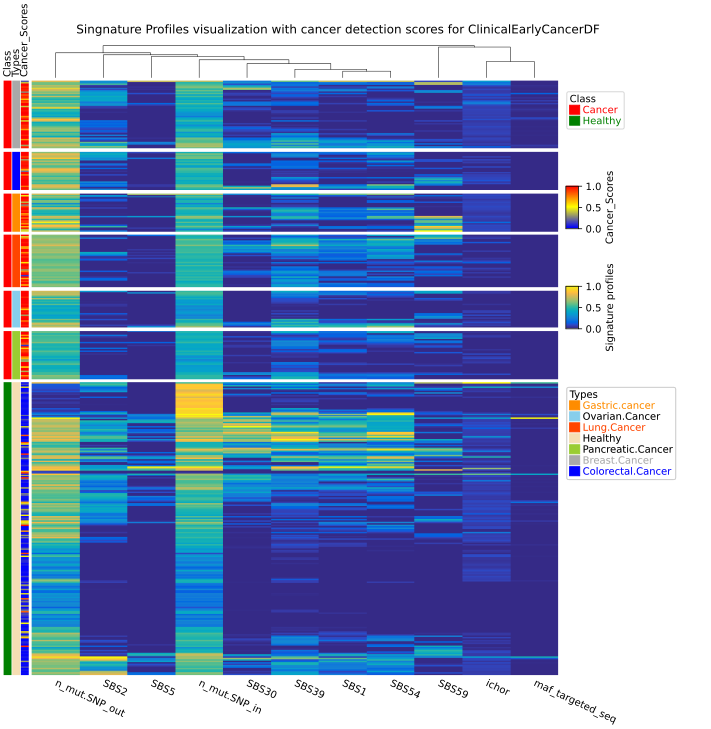

In [ ]:
row_ha = HeatmapAnnotation(Class=anno_simple(adata['class'],colors=row_colors_dict['Target'],rasterized=True),
                           Types=anno_simple(adata.cancer_type,colors=row_colors_dict['Group'],rasterized=True),
                           Cancer_Scores=anno_simple(adata.Cancer_scores,rasterized=True,cmap='exp1'),
                           axis=0)
#col_ha= HeatmapAnnotation(label=anno_label(df_col.Strain,merge=True,rotation=15),
 #                         Strain=anno_simple(df_col.Strain,add_text=True),
 #                         Tissue=df_col.Tissue,Sex=df_col.Sex,
 #                         axis=1)
plt.figure(figsize=(10, 10))
cm = ClusterMapPlotter(data=df_scaled2, left_annotation=row_ha,#top_annotation=row_ha,
                     show_rownames=False,show_colnames=True,
                     row_dendrogram=False,col_dendrogram=True,
                     row_split=adata.loc[:,['class', 'cancer_type']],
                     cmap='parula',#col_split=df_col['Strain'],
                     xticklabels_kws={'labelrotation':-25,'labelcolor':'black'},
                     yticklabels_kws={'labelrotation':-25,'labelcolor':'black'},
                     rasterized=True,row_split_gap=1,legend=True,legend_anchor='auto',legend_width=50,vmax=1,vmin=0,center=0.5,
                        plot=True,label='Signature profiles',legend_vpad=5,legend_gap=20)
cm.ax.set_title("Singnature Profiles visualization with cancer detection scores for ClinicalEarlyCancerDF",x=0.6,y=1.01)
plt.savefig("SingtureHPReseaults.pdf", bbox_inches='tight')
plt.savefig("SingtureHPReseaults.png", bbox_inches='tight')
plt.show()

In [ ]:
df = pd.DataFrame(['GroupA'] * 5 + ['GroupB'] * 5, columns=['AB'])
df['CD'] = ['C'] * 3 + ['D'] * 3 + ['G'] * 4
df['EF'] = ['E'] * 6 + ['F'] * 2 + ['H'] * 2
df['F'] = np.random.normal(0, 1, 10)
df.index = ['sample' + str(i) for i in range(1, df.shape[0] + 1)]
df_box = pd.DataFrame(np.random.randn(10, 4), columns=['Gene' + str(i) for i in range(1, 5)])
df_box.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_bar = pd.DataFrame(np.random.uniform(0, 10, (10, 2)), columns=['TMB1', 'TMB2'])
df_bar.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_scatter = pd.DataFrame(np.random.uniform(0, 10, 10), columns=['Scatter'])
df_scatter.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_heatmap = pd.DataFrame(np.random.randn(30, 10), columns=['sample' + str(i) for i in range(1, 11)])
df_heatmap.index = ["Fea" + str(i) for i in range(1, df_heatmap.shape[0] + 1)]
df_heatmap.iloc[1, 2] = np.nan
df_heatmap

In [ ]:
df=SingDataDFData
df.index=SingDataDF["class"]
plt.figure(figsize=(5.5, 6.5))
cm = ClusterMapPlotter(data=df,
                       label='values',row_dendrogram=True,
                       show_rownames=False,show_colnames=True,
                       tree_kws={'row_cmap': 'Set1'},verbose=0,legend_gap=5,
                       cmap='RdYlBu_r',xticklabels_kws={'labelrotation':-90,'labelcolor':'blue'})
plt.savefig("example0.pdf", bbox_inches='tight')
plt.show()

#Heatmap

In [ ]:
import os,sys
%matplotlib inline
import matplotlib.pylab as plt
import pickle
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi']=300
# sys.path.append(os.path.expanduser("~/Projects/Github/PyComplexHeatmap/"))
from PyComplexHeatmap import *

In [ ]:
#Generate example dataset (random)
df = pd.DataFrame(['GroupA'] * 5 + ['GroupB'] * 5, columns=['AB'])
df['CD'] = ['C'] * 3 + ['D'] * 3 + ['G'] * 4
df['EF'] = ['E'] * 6 + ['F'] * 2 + ['H'] * 2
df['F'] = np.random.normal(0, 1, 10)
df.index = ['sample' + str(i) for i in range(1, df.shape[0] + 1)]
df.head()

,AB,CD,EF,F
sample1,GroupA,C,E,-1.749765
sample2,GroupA,C,E,0.342680
sample3,GroupA,C,E,1.153036
sample4,GroupA,D,E,-0.252436
sample5,GroupA,D,E,0.981321


In [ ]:
plt.figure(figsize=(3, 4))
col_ha = HeatmapAnnotation(df=df,plot=True,legend=True,legend_gap=5,hgap=0.5,axis=1)
plt.show()

In [ ]:
plt.figure(figsize=(3, 4))
col_ha = HeatmapAnnotation(df=SBSPDATADF,plot=True,legend=True,legend_gap=5,hgap=0.5,axis=1)
plt.show()

In [ ]:
df_box = pd.DataFrame(np.random.randn(10, 4), columns=['Gene' + str(i) for i in range(1, 5)])
df_box.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_bar = pd.DataFrame(np.random.uniform(0, 10, (10, 2)), columns=['TMB1', 'TMB2'])
df_bar.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_scatter = pd.DataFrame(np.random.uniform(0, 10, 10), columns=['Scatter'])
df_scatter.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_bar1 = pd.DataFrame(np.random.uniform(0, 10, (10, 2)), columns=['T1-A', 'T1-B'])
df_bar1.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_bar4 = pd.DataFrame(np.random.uniform(0, 10, (10, 1)), columns=['T4'])
df_bar4.index = ['sample' + str(i) for i in range(1, df_box.shape[0] + 1)]
df_bar4.iloc[7,0]=np.nan

plt.figure(figsize=(3.5, 5))
col_ha = HeatmapAnnotation(label=anno_label(df.AB, merge=True,rotation=15),
                            AB=anno_simple(df.AB,add_text=True,legend=True), axis=1,
                            CD=anno_simple(df.CD, add_text=True,legend=True,text_kws={'color':'black'}),
                            Exp=anno_boxplot(df_box, cmap='turbo',legend=True),
                            Scatter=anno_scatterplot(df_scatter),
                           Bar1=anno_barplot(df_bar1,legend=True,cmap='Dark2'),
                           Bar4=anno_barplot(df_bar4,legend=True,cmap='turbo'),
                           plot=True,legend=True,legend_gap=5,hgap=0.5)
col_ha.show_ticklabels(df.index.tolist(),fontdict={'color':'blue'},rotation=-30)
plt.show()

In [ ]:
df_heatmap = pd.DataFrame(np.random.randn(30, 10), columns=['sample' + str(i) for i in range(1, 11)])
df_heatmap.index = ["Fea" + str(i) for i in range(1, df_heatmap.shape[0] + 1)]
df_heatmap.iloc[1, 2] = np.nan

plt.figure(figsize=(3.5, 5))
cm = ClusterMapPlotter(data=plt.figure(figsize=(3, 4))
col_ha = HeatmapAnnotation(df=df,plot=True,legend=True,legend_gap=5,hgap=0.5,axis=1)
                       col_cluster=True,row_cluster=True,
                       col_split=df.AB,row_split=2,
                       col_split_gap=0.5,row_split_gap=0.8,
                       label='values',row_dendrogram=True,
                       show_rownames=False,show_colnames=True,
                       tree_kws={'row_cmap': 'Set1'},verbose=0,legend_gap=5,
                       cmap='RdYlBu_r',xticklabels_kws={'labelrotation':-90,'labelcolor':'blue'})
plt.savefig("example0.pdf", bbox_inches='tight')
plt.show()

SyntaxError: ignored

In [ ]:
df_heatmap = pd.DataFrame(np.random.randn(30, 10), columns=['sample' + str(i) for i in range(1, 11)])
df_heatmap.index = ["Fea" + str(i) for i in range(1, df_heatmap.shape[0] + 1)]
df_heatmap.iloc[1, 2] = np.nan

plt.figure(figsize=(3.5, 5))
cm = ClusterMapPlotter(data=plt.figure(figsize=(3, 4))
col_ha = HeatmapAnnotation(df=SingDataDF,plot=True,legend=True,legend_gap=5,hgap=0.5,axis=1)
                       col_cluster=True,row_cluster=True,
                       col_split=SingDataDF.Class,row_split=2,
                       col_split_gap=0.5,row_split_gap=0.8,
                       label='values',row_dendrogram=True,
                       show_rownames=False,show_colnames=True,
                       tree_kws={'row_cmap': 'Set1'},verbose=0,legend_gap=5,
                       cmap='RdYlBu_r',xticklabels_kws={'labelrotation':-90,'labelcolor':'blue'})
plt.savefig("example0.pdf", bbox_inches='tight')
plt.show()

SyntaxError: ignored

In [ ]:
df_rows = df_heatmap.apply(lambda x:x.name if x.sample4 > 0.5 else None,axis=1)
df_rows=df_rows.to_frame(name='Selected')
df_rows['XY']=df_rows.index.to_series().apply(lambda x:'A' if int(x.replace('Fea',''))>=15 else 'B')

col_ha = HeatmapAnnotation(label=anno_label(df.AB, merge=True,rotation=15),
                            AB=anno_simple(df.AB,add_text=True,legend=True), axis=1,
                            CD=anno_simple(df.CD, add_text=True,legend=True,text_kws={'color':'black'}),
                            Exp=anno_boxplot(df_box, cmap='turbo',legend=True),
                            Scatter=anno_scatterplot(df_scatter),
                           Bar1=anno_barplot(df_bar1,legend=True,cmap='Dark2'),
                           Bar4=anno_barplot(df_bar4,legend=True,cmap='turbo'),
                           legend=True,legend_gap=5,hgap=0.5)

row_ha = HeatmapAnnotation(
                           Scatter=anno_scatterplot(df_heatmap.sample4.apply(lambda x:round(x,2)),
                                            height=15,cmap='jet',legend=False),
                           Bar=anno_barplot(df_heatmap.sample4.apply(lambda x:round(x,2)),
                                            height=15,cmap='rainbow',legend=False),
                           selected=anno_label(df_rows,colors='red',relpos=(-0.05,0.4)),
                           label_kws={'rotation':15,'horizontalalignment':'left','verticalalignment':'bottom'},
                            axis=0,verbose=0)

plt.figure(figsize=(5.5, 6.5))
cm = ClusterMapPlotter(data=df_heatmap, top_annotation=col_ha,right_annotation=row_ha,
                       col_cluster=True,row_cluster=True,
                       col_split=df.AB,row_split=2,
                       col_split_gap=0.5,row_split_gap=0.8,
                       label='values',row_dendrogram=True,
                       show_rownames=False,show_colnames=True,
                       tree_kws={'row_cmap': 'Set1'},verbose=0,legend_gap=5,
                       cmap='RdYlBu_r',xticklabels_kws={'labelrotation':-90,'labelcolor':'blue'})
plt.savefig("example0.pdf", bbox_inches='tight')
plt.show()

NameError: ignored

In [ ]:
plt.figure(figsize=(5.5, 6.5))
cm = ClusterMapPlotter(data=df_heatmap, top_annotation=col_ha,right_annotation=row_ha,
                       col_cluster=True,row_cluster=True,
                       col_split=df.AB,row_split=2,
                       col_split_gap=0.5,row_split_gap=0.8,
                       label='values',row_dendrogram=True,
                       show_rownames=False,show_colnames=True,
                       tree_kws={'row_cmap': 'Set1'},verbose=0,legend_gap=5,
                       cmap='RdYlBu_r',xticklabels_kws={'labelrotation':-90,'labelcolor':'blue'})
plt.savefig("example0.pdf", bbox_inches='tight')
plt.show()

NameError: ignored

<Figure size 550x650 with 0 Axes>

# *Results: (Signature Profile)*

In [ ]:
Allresult=[]

In [ ]:
SingDataDF = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/SBSPDATA.csv')
SingDataDFClass=SingDataDF.iloc[:,0]
SingDataDFData=SingDataDF.iloc[:,1:]
SingDataDFData=SingDataDFData.replace(np.nan, 0)
x=SingDataDFData
y=SingDataDFClass
y1= (y[:] == 'Cancer').astype(int)
y1

,class
0,1
1,1
2,1
3,1
4,1
...,...
400,1
401,1
402,1
403,1


In [ ]:
%matplotlib inline
import IPython.core.display
# setup output image format (Chrome works best)
IPython.core.display.set_matplotlib_formats("svg")
from sklearn.model_selection import KFold,StratifiedKFold
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix as cm
import matplotlib.pyplot as plt
import pandas as pd
import time

from numpy import *
from sklearn import *
from scipy import stats

In [ ]:
def classificationCV(x,y,classifier,n):
##---Classification with n-fold cross-validation---##
#--- x is feature, y is lable, clf is classifier, n is number of fold
    #---  define K-fold cross validation ---#
    KF = StratifiedKFold(n_splits=n,shuffle=True, random_state=920)
    y_score = []
    y_test = []
    auc_kfold = []
    start = time.process_time()
    for train_index,test_index in KF.split(x,y):
        #---  Seperate traing set and test set ---#
        x_train, x_test = x.iloc[train_index][:], x.iloc[test_index][:]
        y_train = y.iloc[train_index][:]

        #---  creat and train the model ---#
        clf = classifier
        clf.fit(x_train, y_train)

        #---  predict ---#
        y_score.extend([x[1] for x in clf.predict_proba(x_test).tolist()])
        y_test.extend(y.iloc[test_index][:].values)
        fpr, tpr, threshold = roc_curve(y.iloc[test_index][:].values, clf.predict_proba(x_test)[:,1], pos_label=1)
        auc_kfold.append(auc(fpr,tpr))
    end = time.process_time()
    print('The algorithm takes '+str(end - start)+'seconds.\n')

    #--- Plot ROC and calculate AUC ---#
    fpr, tpr, threshold = roc_curve(y_test, y_score, pos_label=1)
    roc_auc = auc(fpr,tpr)
    # plt.plot(fpr, tpr, lw=2, label='GPC (AUC = %0.4f)' % roc_auc, linestyle='--')

    #--- calculate accuracy,precision_score,recall_score and f1_score ---#
    y_pred = []
    for i in range(len(y_score)):
        y_pred.append(round(y_score[i]))
    print(cm(y_test,y_pred))
    a = accuracy_score(y_test,y_pred)
    p = precision_score(y_test,y_pred)
    r = recall_score(y_test,y_pred)
    f1score = f1_score(y_test,y_pred)

    print('%0.2f %0.2f %0.2f %0.2f %0.3f'% (a, p, r, f1score, roc_auc))

    return y_test, y_score,min(auc_kfold),max(auc_kfold),std(auc_kfold),auc_kfold#clf, a, p, r, f1score,roc_auc,

ASVM
The algorithm takes 0.7897105790000012seconds.

[[133  73]
 [ 63 136]]
0.66 0.65 0.68 0.67 0.743
auc_kfold
0.7532982456140351


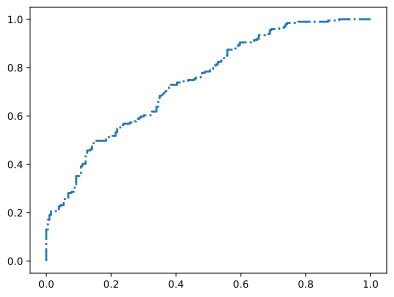

In [ ]:
print('ASVM')
classifier = svm.SVC(kernel = 'rbf', gamma='scale', probability=True)
y_test, y_score,min_auc,max_auc,std_auc,auc_kfold = classificationCV(x,y1,classifier,10)
##Plot ROC and calculate AUC
fpr, tpr, threshold = roc_curve(y_test, y_score, pos_label=1)
roc_auc = auc(fpr,tpr)
# plt.plot(fpr, tpr, lw=2, label='SVM      %0.2f(%0.2f - %0.2f)' % (roc_auc,min_auc,max_auc), linestyle='-')
plt.plot(fpr, tpr, lw=2, label='SVM      %0.3f ±%0.3f' % (roc_auc,std_auc), linestyle='-.')
print('auc_kfold')
print(mean(auc_kfold))
asvm_pre=y_score
asvm_test=y_test

In [ ]:
print(asvm_test,y1)

[1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.datasets import make_classification

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Perform 10-fold Cross-Validation
cv_scores = cross_val_score(rf_classifier, x, y, cv=10)

# Print the CV results
print(f"Mean CV Score: {np.mean(cv_scores)}")
# Perform 10-fold Cross-Validation predictions
#predictions = cross_val_predict(rf_classifier, x, y, cv=10)

# Print the prediction values
probabilities = cross_val_predict(rf_classifier, x, y, cv=10, method='predict_proba')
RF_prob=probabilities[:,1]
auc_roc = roc_auc_score(y, RF_prob)
auc_roc

Mean CV Score: 0.8820731707317073


NameError: name 'roc_auc_score' is not defined

In [ ]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.datasets import make_classification

#PanSeerLRCV = LogisticRegressionCV()
clf = LogisticRegressionCV(penalty='l1', solver='liblinear', random_state=42,
                               Cs=[1.0, 5.0, 10.0, 50.0, 100.0], cv=3)

# Perform 10-fold Cross-Validation
cv_scores = cross_val_score(clf, x, y, cv=10)

# Print the CV results
print(f"Mean CV Score: {np.mean(cv_scores)}")
# Perform 10-fold Cross-Validation predictions
#predictions = cross_val_predict(rf_classifier, x, y, cv=10)

# Print the prediction values
probabilities = cross_val_predict(clf, x, y, cv=10, method='predict_proba')
PanSeerLRCV_prob=probabilities[:,1]
auc_roc = roc_auc_score(y, PanSeerLRCV_prob)
auc_roc

Mean CV Score: 0.7890243902439024


NameError: name 'roc_auc_score' is not defined

GLMNET:

In [ ]:
#logistic regression using PCA
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
# Import roc_auc_score from sklearn.metrics
from sklearn.metrics import roc_auc_score

In [ ]:
#logistic regression using PCA
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
pca = PCA(n_components=50)
X_new = pca.fit_transform(x)

model=LogisticRegression(C = 0.1, class_weight= 'balanced', penalty= 'l1', solver= 'liblinear',random_state=42)
cv_scores = cross_val_score(model, X_new, y, cv=10)

# Print the CV results
print(f"Mean CV Score: {np.mean(cv_scores)}")
# Perform 10-fold Cross-Validation predictions
#predictions = cross_val_predict(rf_classifier, x, y, cv=10)

# Print the prediction values
probabilities = cross_val_predict(model, X_new, y, cv=10, method='predict_proba')
LRLasso=probabilities[:,1]
auc_roc = roc_auc_score(y, LRLasso)
auc_roc

Mean CV Score: 0.7344512195121953


0.775576913694687

AutoCancer:

In [ ]:
pip install skopt

ERROR: Could not find a version that satisfies the requirement skopt (from versions: none)
ERROR: No matching distribution found for skopt


In [ ]:
import torch
import math
import pickle
import random
import numpy as np
import torch.autograd as autograd
import torch.nn.functional as F
import pandas as pd
import torch.optim as optim


from skopt.utils import use_named_args
from skopt import gp_minimize
from skopt.space import Real, Integer, Categorical

from torch import nn
from torch.utils.data import Dataset, DataLoader, Subset

from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold, StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import precision_recall_curve, auc
from imblearn.over_sampling import RandomOverSampler

from scipy.special import softmax

from math import ceil
from copy import deepcopy

import os
import gc
# os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

seed = 1105
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

def set_seed(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
###############################################
#--------------   Dataset tools   ------------#
###############################################
def flatten2array(multiindex):
    array_2d = []
    for i in range(multiindex.shape[0]):
        temp1 = []
        for j in multiindex.iloc[i]:
            if (type(j) == np.ndarray or type(j) == list):
                for k in j:
                    temp1.append(k)
            else:
                temp1.append(j)
        array_2d.append(temp1)
    array_2d = np.array(array_2d)
    return array_2d

def TruncatePadding(snv_array, max_variats):

    """
    Function description: truncate or padding variable-length variants

    """
    if len(snv_array) >= max_variats:
        return snv_array[:max_variats]  # truncate
    else:
        return np.append(snv_array,np.zeros((max_variats - snv_array.shape[0],snv_array.shape[1])), axis=0) # padding with zero array

def len_feature(x):
    if x is None:
        length = 0
    elif isinstance(x.index, pd.MultiIndex):
        length = len(x.index.get_level_values(x.index.names[0]).unique())
    else:
        length = len(x)
    return length

class FeatureSelectionDataset(Dataset):
    def __init__(self, x_1d=None, x_2d=None, y=None, max_len_2d=84):
        super().__init__()
        self.x_1d, self.x_2d, self.y = x_1d, x_2d, y
        len_1d, len_2d = len_feature(self.x_1d), len_feature(self.x_2d)
        self.len, self.max_len_2d = max(len_1d, len_2d), max_len_2d

    def __getitem__(self, index):
        if (self.x_1d is not None)&(self.x_2d is not None):
            k = self.x_1d.index[index]
            if k in self.x_2d.index.get_level_values(self.x_2d.index.names[0]).unique():
                x_2d = flatten2array(self.x_2d.loc[k])
            else:
                x_2d = np.zeros(flatten2array(self.x_2d[:1]).shape)
            x_2d = TruncatePadding(x_2d, self.max_len_2d)
            return np.array(self.x_1d.loc[k].values.tolist()), x_2d, self.y[k]
        elif (self.x_2d is not None):
            k = self.y.index[index]
            if k in self.x_2d.index.get_level_values(self.x_2d.index.names[0]).unique():
                x_2d = flatten2array(self.x_2d.loc[k])
            else:
                x_2d = np.zeros(flatten2array(self.x_2d[:1]).shape)
            x_2d = TruncatePadding(x_2d, self.max_len_2d)
            return [], x_2d, self.y[k]
        elif self.x_1d is not None:
            k = self.x_1d.index[index]
            return np.array(self.x_1d.loc[k].values.tolist()), [], self.y[k]
        else:
            print('No data provided!')
            return None
    def __len__(self):
        return self.len

###############################################
#---------------   Model define   ------------#
###############################################
def clones(module, N):
    "Produce N identical layers."
    return nn.ModuleList([deepcopy(module) for _ in range(N)])

class LayerNorm(nn.Module):
    "Construct a layernorm module (See citation for details)."
    def __init__(self, features, eps=1e-6):
        super().__init__()
        self.a_2 = nn.Parameter(torch.ones(features))
        self.b_2 = nn.Parameter(torch.zeros(features))
        self.eps = eps

    def forward(self, x):
        mean = x.mean(-1, keepdim=True)
        std = x.std(-1, keepdim=True)
        return self.a_2 * (x - mean) / (std + self.eps) + self.b_2

class SublayerConnection(nn.Module):
    """
    A residual connection followed by a layer norm.
    Note for code simplicity the norm is first as opposed to last.
    """
    def __init__(self, size, dropout):
        super().__init__()
        self.norm = LayerNorm(size)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, sublayer):
        "Apply residual connection to any sublayer with the same size."
        return x + self.dropout(sublayer(self.norm(x)))

class EncoderLayer(nn.Module):
    "Encoder is made up of self-attn and feed forward (defined below)"
    def __init__(self, size, self_attn, feed_forward, dropout):
        super().__init__()
        self.self_attn = self_attn
        self.feed_forward = feed_forward
        self.sublayer = clones(SublayerConnection(size, dropout), 2)
        self.size = size

    def forward(self, x, mask=None):
        "Follow Figure 1 (left) for connections."
        x = self.sublayer[0](x, lambda x: self.self_attn(x, x, x, mask))
        return self.sublayer[1](x, self.feed_forward)


def attention(query, key, value, mask=None, dropout=None):
    "Compute 'Scaled Dot Product Attention'"
    d_k = query.size(-1)
    scores = torch.matmul(query, key.transpose(-2, -1)) \
             / math.sqrt(d_k)  ## (b,h,l,d) * (b,h,d,l)
    if mask is not None:
        # scores = scores.masked_fill(mask == 0, -1e9)
        scores = scores.masked_fill(mask, -1e9)
    p_attn = F.softmax(scores, dim = -1)
    if dropout is not None:
        p_attn = dropout(p_attn)
    return torch.matmul(p_attn, value), p_attn   ##(b,h,l,l) * (b,h,l,d) = (b,h,l,d)

class MultiHeadedAttention(nn.Module):
    def __init__(self, h, d_model, dropout=0.1):
        "Take in model size and number of heads."
        super().__init__()
        assert d_model % h == 0
        # We assume d_v always equals d_k
        self.d_k = d_model // h
        self.h = h
        self.linears = clones(nn.Linear(d_model, d_model), 4)
        self.attn = None
        self.dropout = nn.Dropout(p=dropout)

    def forward(self, query, key, value, mask=None):
        "Implements Figure 2"
        if mask is not None:
            # Same mask applied to all h heads.
            mask = mask.unsqueeze(1)
        nbatches = query.size(0)

        # 1) Do all the linear projections in batch from d_model => h x d_k
        query, key, value = \
            [l(x).view(nbatches, -1, self.h, self.d_k).transpose(1, 2)
             for l, x in zip(self.linears, (query, key, value))]

        # 2) Apply attention on all the projected vectors in batch.
        x, self.attn = attention(query, key, value, mask=mask,
                                 dropout=self.dropout)

        # 3) "Concat" using a view and apply a final linear.
        x = x.transpose(1, 2).contiguous() \
             .view(nbatches, -1, self.h * self.d_k)
        return self.linears[-1](x)


class PositionwiseFeedForward(nn.Module):
    "Implements FFN equation."
    def __init__(self, d_model, d_ff, dropout=0.1):
        super().__init__()
        self.w_1 = nn.Linear(d_model, d_ff)
        self.w_2 = nn.Linear(d_ff, d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        return self.w_2(self.dropout(F.relu(self.w_1(x))))


class PositionalEncoding(nn.Module):
    "Implement the PE function."
    def __init__(self, d_model, dropout, max_len=5000):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)

        # Compute the positional encodings once in log space.
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0., max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0., d_model, 2) *
                             -(math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + autograd.Variable(self.pe[:, :x.size(1)],
                         requires_grad=False)
        return self.dropout(x)



class AdaptiveAttentionModel(nn.Module):
    "Core encoder is a stack of N layers"
    def __init__(self, d_model, d_ff, head, num_layer, dropout):
        super().__init__()
        attn = MultiHeadedAttention(head, d_model, dropout)
        ff = PositionwiseFeedForward(d_model, d_ff, dropout)
        layer = EncoderLayer(d_model, deepcopy(attn), deepcopy(ff), dropout)
        self.layers = clones(layer, num_layer)
        self.norm = LayerNorm(layer.size)
        self.posi = PositionalEncoding(d_model, dropout)
        self.out = nn.Linear(d_model, 1)
        # self.attn_matrices = []

    def forward(self, x):
        "Pass the input (and mask) through each layer in turn."
        # x: embedding (b,l,we)
        x = self.posi(x)
        for layer in self.layers:
            x = layer(x)
            # self.attn_matrices.append(layer.self_attn.attn)
        return self.out(self.norm(x))

class AdaptiveMLP(nn.Module):
    "Core encoder is a stack of N layers"
    def __init__(self, num_fc_input, num_output_nodes, num_fc_layers, initial_dropout, act=nn.Sigmoid()):
        super().__init__()
        self.num_fc_layers, self.act = num_fc_layers, act
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

        if num_fc_layers == 1:
            self.fc0 = nn.Linear(num_fc_input, num_output_nodes)
        else:
            # the first fc layer
            self.fc0 = nn.Linear(num_fc_input, int(ceil(num_fc_input/2)))
            self.dropout0 = nn.Dropout(1.1*initial_dropout)
            if num_fc_layers == 2:
                # the last fc layer when num_fc_layers == 2
                self.fc1 = nn.Linear(int(ceil(num_fc_input/2)), num_output_nodes)
            else:
                # the middle fc layer
                for i in range(1,num_fc_layers-1):
                    tmp_input = int(ceil(num_fc_input/2**i))
                    tmp_output = int(ceil(num_fc_input/2**(i+1)))
                    exec('self.fc{} = nn.Linear(tmp_input, tmp_output)'.format(i))
                    if i < ceil(num_fc_layers/2) and 1.1**(i+1)*initial_dropout < 1:
                        exec('self.dropout{} = nn.Dropout(1.1**(i+1)*initial_dropout)'.format(i))
                    elif i >= ceil(num_fc_layers/2) and 1.1**(num_fc_layers-1-i)*initial_dropout < 1:
                        exec('self.dropout{} = nn.Dropout(1.1**(num_fc_layers-1-i)*initial_dropout)'.format(i))
                    else:
                        exec('self.dropout{} = nn.Dropout(0.5)'.format(i))
                # the last fc layer
                exec('self.fc{} = nn.Linear(tmp_output, num_output_nodes)'.format(i+1))

        self.to(self.device)
    def forward(self, x):
        if self.num_fc_layers == 1:
            outputs = self.fc0(x)
        else:
            # the first fc layer
            outputs = self.act(self.dropout0(self.fc0(x)))
            if self.num_fc_layers == 2:
                # the last fc layer when num_fc_layers == 2
                outputs = self.fc1(outputs)
            else:
                # the middle fc layer
                for i in range(1,self.num_fc_layers-1):
                    outputs = eval('self.act(self.dropout{}(self.fc{}(outputs)))'.format(i,i))
                # the last fc layer
                outputs = eval('self.fc{}(outputs)'.format(i+1))
        return outputs.softmax(dim=1)

class AutoTransformer(nn.Module):
    """
    Class description: Transformer accepts both 1d features and 2d features

    """
    def __init__(self, params):
                # **kwargs x1d x2d&dim_2d_input
        super().__init__()
        query = 'trsf_hidden_each_head, head, trsf_num_layer, trsf_dropout, fc_dropout, num_output_nodes, num_fc_layers'
        trsf_hidden_each_head, head, trsf_num_layer, trsf_dropout, fc_dropout, num_output_nodes, num_fc_layers = assign_vars(query, params)
        len_1, len_2, trsf_hidden_dim = 0, 0, trsf_hidden_each_head*head
        self.patience, self.lr = params['patience'], params['learning_rate']
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

        #--- Feature fusion block ---#
        if 'flag_1d' in params.keys():
            self.input2model_1d = nn.Linear(1, trsf_hidden_dim)
            nn.init.xavier_uniform_(self.input2model_1d.weight)
            len_1 = params['len_1d']
        if 'flag_2d' in params.keys():
            self.input2model_2d = nn.Linear(params['dim_2d_input'], trsf_hidden_dim)
            nn.init.xavier_uniform_(self.input2model_2d.weight)
            len_2 = params['len_2d']
        #--- Transformer ---#
        self.attention_model = AdaptiveAttentionModel(d_model=trsf_hidden_dim, d_ff=2*trsf_hidden_dim, head=head,
                                              num_layer=trsf_num_layer, dropout=trsf_dropout)
        #--- MLP block ---#
        self.to_out = AdaptiveMLP(len_1+len_2, num_output_nodes, num_fc_layers, fc_dropout)
        #--- Initialize ---#
        for p in self.attention_model.parameters():
            if p.dim() > 1:
                nn.init.xavier_uniform_(p)
        for p in self.to_out.parameters():
            if p.dim() > 1:
                nn.init.xavier_uniform_(p)
        self.to(self.device)

    #----- Forward -----#
    def forward(self, x_1d=None, x_2d=None):
        #--- Feature fusion block ---#
        if x_1d is not None and x_2d is not None:
            x_1d = add_dimension(x_1d)
            x_2d = add_dimension(x_2d)
            x_1d = self.input2model_1d(x_1d) # b, l, dim
            x_2d = self.input2model_2d(x_2d)
            x = torch.cat((x_1d, x_2d), 1)
        elif x_1d is not None:
            x_1d = add_dimension(x_1d)
            x = self.input2model_1d(x_1d)
        elif x_2d is not None:
            x_2d = add_dimension(x_2d)
            x = self.input2model_2d(x_2d)
        #--- Transformer block ---#
        x = torch.squeeze(self.attention_model(x), dim=-1)
        #--- MLP block ---#
        y = self.to_out(x)
        del x, x_1d, x_2d
        torch.cuda.empty_cache()
        gc.collect()
        return y

    def to_device(self, x, device):
        if x == []:
            x = None
        else:
            x = x.float().to(device)
        return x

    def train_epoch(self, train_iter, optimizer, l, device):

        model = self
        model.train()
        train_loss, y_hat_all, y_all = 0, [], []
        for batch_idx, (x_1d, x_2d, y) in enumerate(train_iter):
            x_1d, x_2d, y = self.to_device(x_1d, device), self.to_device(x_2d, device), y.to(device)
            #--- Prediction ---#
            optimizer.zero_grad()
            y_hat = model(x_1d, x_2d)

            loss = l(y_hat, y)
            train_loss += loss.sum()
            loss.sum().backward()
            optimizer.step()

            if device == 'cpu':
                    y_hat_all.extend(y_hat.numpy().tolist())
                    y_all.extend(y.numpy().tolist())
            else:
                y_hat_all.extend(y_hat.detach().cpu().numpy().tolist())
                y_all.extend(y.detach().cpu().numpy().tolist())
            del loss, x_1d, x_2d, y, y_hat
            torch.cuda.empty_cache()
            gc.collect()

        train_loss /= len(y_all)
        del model, train_iter, optimizer, l, device
        torch.cuda.empty_cache()
        gc.collect()
        return np.array(y_hat_all), np.array(y_all), train_loss


    def train_val(self, train_iter, val_iter, test_iter=None):
        device = self.device
        patience, num_epochs, lr = self.patience, 100, self.lr
        early_stopping = EarlyStopping(patience, verbose=False)

        optimizer = optim.Adam(self.parameters(), lr=lr)
        #-----  Loss -----#
        loss = nn.CrossEntropyLoss(reduction="none")
        loss = loss.to(device)

        for epoch in range(num_epochs):
            # print('epoch ', epoch)
            _, _, train_loss = self.train_epoch(train_iter, optimizer, loss, device)
            y_hat_val, y_true_val, val_loss = self.test(val_iter)
            if test_iter is not None:
                y_hat_test, y_true_test, test_loss = self.test(test_iter)
            else:
                y_hat_test, y_true_test, test_loss = 0,0,0
            #--- early stop ---#
            early_stopping(val_loss)
            if early_stopping.early_stop:
                print("Early stopping")
                break
        del train_iter, val_iter, optimizer, loss, device
        torch.cuda.empty_cache()
        gc.collect()

        print('Training loss: {:.4f}, val loss: {:f}, test loss: {:f}'.format(train_loss, val_loss, test_loss), flush=True)
        return y_hat_val, y_true_val, y_hat_test, y_true_test

    def test(self, test_iter):
        model, device = self, self.device
        model.eval()
        #-----  Loss -----#
        l = nn.CrossEntropyLoss(reduction="none")
        l = l.to(device)
        test_loss, y_hat_all, y_all = 0, [], []
        with torch.no_grad():
            for batch_idx, (x_1d, x_2d, y) in enumerate(test_iter):
                x_1d, x_2d, y = self.to_device(x_1d, device), self.to_device(x_2d, device), y.to(device)
                #--- Prediction ---#
                y_hat = model(x_1d, x_2d)
                loss = l(y_hat, y)
                test_loss += loss.sum()

                if device == 'cpu':
                    y_hat_all.extend(y_hat.numpy().tolist())
                    y_all.extend(y.numpy().tolist())
                else:
                    y_hat_all.extend(y_hat.detach().cpu().numpy().tolist())
                    y_all.extend(y.detach().cpu().numpy().tolist())
                del loss, x_1d, x_2d, y, y_hat
                torch.cuda.empty_cache()
                gc.collect()

            test_loss /= len(y_all)
        del model, test_iter, l
        torch.cuda.empty_cache()
        gc.collect()
        return np.array(y_hat_all), np.array(y_all), test_loss

class AutoModel(nn.Module):
    def __init__(self):
        super().__init__()

    def train_epoch(self, train_iter, optimizer, l, device):
        model = self
        model.train()
        train_loss, y_hat_all, y_all = 0, [], []
        for batch_idx, (x_1d, x_2d, y) in enumerate(train_iter):
            if x_2d == []:
                x_2d = None
            else:
                x_2d = x_2d.float().to(device)
            x_1d, y = x_1d.float().to(device), y.to(device)
            #--- Prediction ---#
            optimizer.zero_grad()
            y_hat = model(x_1d, x_2d)

            loss = l(y_hat, y)
            train_loss += loss.sum()
            loss.sum().backward()
            optimizer.step()

            if device == 'cpu':
                    y_hat_all.extend(y_hat.numpy().tolist())
                    y_all.extend(y.numpy().tolist())
            else:
                y_hat_all.extend(y_hat.detach().cpu().numpy().tolist())
                y_all.extend(y.detach().cpu().numpy().tolist())

        train_loss /= len(y_all)
        return np.array(y_hat_all), np.array(y_all), train_loss


    def train_val(self, train_iter, val_iter, test_iter=None):
        device = self.device
        patience, num_epochs, lr = self.patience, 100, self.lr
        early_stopping = EarlyStopping(patience, verbose=False)

        optimizer = optim.Adam(self.parameters(), lr=lr)
        #-----  Loss -----#
        loss = nn.CrossEntropyLoss(reduction="none")
        loss = loss.to(device)

        for epoch in range(num_epochs):
            torch.cuda.empty_cache()
            gc.collect()
            y_hat_train, y_true_train, train_loss = self.train_epoch(train_iter, optimizer, loss, device)
            y_hat_val, y_true_val, val_loss = self.test(val_iter)
            if test_iter is not None:
                y_hat_test, y_true_test, test_loss = self.test(test_iter)
            else:
                y_hat_test, y_true_test, test_loss = 0,0,0
            #--- early stop ---#
            early_stopping(val_loss)
            if early_stopping.early_stop:
                print("Early stopping")
                break

        print('Training loss: {:.4f}, val loss: {:f}, test loss: {:f}'.format(train_loss, val_loss, test_loss), flush=True)

        return y_hat_val, y_true_val, y_hat_test, y_true_test

    def test(self, test_iter):
        model, device = self, self.device
        model.eval()
        #-----  Loss -----#
        l = nn.CrossEntropyLoss(reduction="none")
        l = l.to(device)
        test_loss, y_hat_all, y_all = 0, [], []
        with torch.no_grad():
            for batch_idx, (x_1d, x_2d, y) in enumerate(test_iter):
                if x_2d == []:
                    x_2d = None
                else:
                    x_2d = x_2d.float().to(device)
                x_1d, y = x_1d.float().to(device), y.to(device)
                # x_1d, x_2d, y = x_1d.float().to(device), x_2d.float().to(device), y.to(device)
                #--- Prediction ---#
                y_hat = model(x_1d, x_2d)
                loss = l(y_hat, y)
                test_loss += loss.sum()

                if device == 'cpu':
                    y_hat_all.extend(y_hat.numpy().tolist())
                    y_all.extend(y.numpy().tolist())
                else:
                    y_hat_all.extend(y_hat.detach().cpu().numpy().tolist())
                    y_all.extend(y.detach().cpu().numpy().tolist())

            test_loss /= len(y_all)
        return np.array(y_hat_all), np.array(y_all), test_loss


class AutoMLP(AutoModel):
    def __init__(self, params):
        super().__init__()
        query = 'num_output_nodes, num_fc_layers, initial_dropout, act'
        num_output_nodes, num_fc_layers, initial_dropout, act = assign_vars(query, params)
        num_fc_input = params['len_1d']
        self.patience, self.lr = params['patience'], params['learning_rate']
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.num_fc_layers, self.act = num_fc_layers, act
        if num_fc_layers == 1:
            self.fc0 = nn.Linear(num_fc_input, num_output_nodes)
        else:
            # the first fc layer
            self.fc0 = nn.Linear(num_fc_input, int(ceil(num_fc_input/2)))
            self.dropout0 = nn.Dropout(1.1*initial_dropout)
            if num_fc_layers == 2:
                # the last fc layer when num_fc_layers == 2
                self.fc1 = nn.Linear(int(ceil(num_fc_input/2)), num_output_nodes)
            else:
                # the middle fc layer
                for i in range(1,num_fc_layers-1):
                    tmp_input = int(ceil(num_fc_input/2**i))
                    tmp_output = int(ceil(num_fc_input/2**(i+1)))
                    exec('self.fc{} = nn.Linear(tmp_input, tmp_output)'.format(i))
                    if i < ceil(num_fc_layers/2) and 1.1**(i+1)*initial_dropout < 1:
                        exec('self.dropout{} = nn.Dropout(1.1**(i+1)*initial_dropout)'.format(i))
                    elif i >= ceil(num_fc_layers/2) and 1.1**(num_fc_layers-1-i)*initial_dropout < 1:
                        exec('self.dropout{} = nn.Dropout(1.1**(num_fc_layers-1-i)*initial_dropout)'.format(i))
                    else:
                        exec('self.dropout{} = nn.Dropout(0.5)'.format(i))
                # the last fc layer
                exec('self.fc{} = nn.Linear(tmp_output, num_output_nodes)'.format(i+1))
        self.to(self.device)

    def forward(self, x, x2=None):
        if self.num_fc_layers == 1:
            outputs = self.fc0(x)
        else:
            # the first fc layer
            outputs = self.act(self.dropout0(self.fc0(x)))
            if self.num_fc_layers == 2:
                # the last fc layer when num_fc_layers == 2
                outputs = self.fc1(outputs)
            else:
                # the middle fc layer
                for i in range(1,self.num_fc_layers-1):
                    outputs = eval('self.act(self.dropout{}(self.fc{}(outputs)))'.format(i,i))
                # the last fc layer
                outputs = eval('self.fc{}(outputs)'.format(i+1))
        return outputs.softmax(dim=1)
###############################################
#---------------   Model tools   -------------#
###############################################

def assign_vars(query, params):
    query = [i.strip() for i in query.split(',')]
    for i in query:
        yield params[i]

def add_dimension(tensor,dim=3):
    shape = tensor.shape
    if dim-len(shape) >= 2:
        tensor = tensor.unsqueeze(0)
        tensor = tensor.unsqueeze(-1)
    elif dim-len(shape) >= 1:
        tensor = tensor.unsqueeze(-1)
    return tensor

def init_weights(m):
    if type(m) == nn.Linear:
        nn.init.xavier_uniform_(m.weight)
    elif type(m) == nn.LSTM:
        for param in m._flat_weights_names:
            if "weight" in param:
                nn.init.xavier_uniform_(m._parameters[param])
    elif type(m) == nn.BatchNorm1d:
        nn.init.normal_(m.weight.data, mean=1, std=0.02)
        nn.init.constant_(m.bias.data, 0)

class EarlyStopping:
    """
    Early stops the training if validation loss doesn't improve after a given patience.

    """

    def __init__(self, patience=10, verbose=False, delta=0):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 10
            verbose (bool): If True, prints a message for each validation loss improvement.
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_score_min = np.Inf
        self.delta = delta

    def __call__(self, val_score, model=None):

        score = -val_score

        if self.best_score is None:
            self.best_score = score
            if model is not None:
                self.save_checkpoint(val_score, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            if model is not None:
                self.save_checkpoint(val_score, model)
            self.counter = 0

    def save_checkpoint(self, val_score, model):
        '''
        Saves model when validation loss decrease.

        '''
        if self.verbose:
            print(f'Validation loss decreased ({self.val_score_min:.6f} --> {val_score:.6f}).  Saving model ...')
        torch.save(model.state_dict(), 'checkpoint.pt')     # the parameters of the best model so far
        torch.save(model, 'finish_model.pkl')                 # the best model so far
        self.val_score_min = val_score

def evaluate(y_preds_score, y_trues, average = 'binary', flag_soft=False, verbose=True):
    #average: ‘micro’, ‘macro’, ‘samples’, ‘weighted’, ‘binary’
    if flag_soft==True:
        y_preds_score = softmax(y_preds_score)

    bin_enc = preprocessing.OneHotEncoder(sparse_output=False).fit(y_trues.reshape(-1,1))
    y_preds = y_preds_score.argmax(axis=1)
    # calculate pr-auc
    precision, recall, _ = precision_recall_curve(y_trues, y_preds_score[:,1])
    pr_auc = auc(recall, precision)

    accuracy = accuracy_score(y_trues, y_preds)
    precision = precision_score(y_trues, y_preds, average=average)
    recall = recall_score(y_trues, y_preds, average=average)
    f1 = f1_score(y_trues, y_preds, average=average)
    y_trues_bin = bin_enc.transform(y_trues.reshape(-1,1))
    roc_auc = roc_auc_score(y_trues_bin, y_preds_score)

    if verbose == True:
        print('accuracy:{:.4f} precision:{:.4f} recall:{:.4f} f1:{:.4f} roc_auc:{:.4f} pr_auc:{:.4f}'\
            .format(accuracy, precision, recall, f1, roc_auc, pr_auc))
        print('-'*40)
    return accuracy, precision, recall, f1, roc_auc, pr_auc

def repeat_evaluate(test_accuracy, test_precision, test_recall, test_f1, test_roc_auc, test_pr_auc, y_hat_test, y_test, average='binary', flag_soft=False):
    accuracy, precision, recall, f1, roc_auc, pr_auc= evaluate(y_hat_test, y_test, average=average, verbose=False, flag_soft=flag_soft)
    test_accuracy = test_accuracy + accuracy
    test_precision = test_precision + precision
    test_recall = test_recall + recall
    test_f1 = test_f1 + f1
    test_roc_auc = test_roc_auc + roc_auc
    test_pr_auc = test_pr_auc + pr_auc

    return test_accuracy, test_precision, test_recall, test_f1, test_roc_auc, test_pr_auc
###############################################
#----------   Bayesian optimization   --------#
###############################################
def fs_dataset(x_1d, x_2d, f_1d=None, f_2d_0=None, f_2d_1=None):
    idx = pd.IndexSlice
    if (f_1d is not None)&(f_2d_0 is not None)&(f_2d_1 is not None):
        return x_1d[f_1d], x_2d.loc[idx[:,f_2d_0],f_2d_1]
    elif (f_1d is not None)&(f_2d_0 is not None)&(f_2d_1 is None):
        return x_1d[f_1d], x_2d.loc[idx[:,f_2d_0],:]
    elif (f_1d is not None)&(f_2d_0 is None)&(f_2d_1 is not None):
        return x_1d[f_1d], x_2d.loc[:,f_2d_1]
    elif (f_1d is None)&(f_2d_0 is not None)&(f_2d_1 is not None):
        return x_1d, x_2d.loc[idx[:,f_2d_0],f_2d_1]
    elif f_1d is not None:
        return x_1d[f_1d], x_2d
    elif f_2d_0 is not None:
        return x_1d, x_2d.loc[idx[:,f_2d_0],:]
    elif f_2d_1 is not None:
        return x_1d, x_2d.loc[:,f_2d_1]
    else:
        return x_1d, x_2d

def ratio_feature(selected, origin):
    if selected is None or origin is None:
        ratio = 0
    else:
        ratio = len(selected)/len(origin)
    return ratio
def len_2d_feature(val_loader):
    _,tmp_2d,_ = next(iter(val_loader))
    if tmp_2d==[]:
        len_2d_0, len_2d_1 = 0, 0
    elif tmp_2d.dim() == 3:
        len_2d_0, len_2d_1 = tmp_2d.shape[1], tmp_2d.shape[2]
    elif tmp_2d.dim() == 2:
        len_2d_0, len_2d_1 = tmp_2d.shape[0], tmp_2d.shape[1]
    else:
        raise ValueError("tmp_2d must have either 2 or 3 dimensions")
    return len_2d_0, len_2d_1

def auto_nnd(hyperparameter_spaces, n_calls, model_class, determin_hyp, x_1d=None, x_2d=None, y=None,
batch_size=16, num_outer_split=5, frac_inner_val=0.25, max_len_2d=84, **kwargs):

    #---   Decoding hyperparameter search spaces   ---#
    search_spaces = hyperparameter_spaces
    @use_named_args(search_spaces)
    def objective_function(**params):
        x_1d_fs, x_2d_fs = fs_dataset(x_1d, x_2d)
        #--- optimized model hyperparameters ---#
        model_params = {key: value for key, value in params.items() if not key.startswith('feature')}
        model_params.update(determin_hyp)
        print('-'*40)
        print('Model hyperparameters:')
        print('-'*40)
        for key, value in model_params.items():
            print(key, ":", value)


        test_accuracy, test_precision, test_recall, test_f1, test_roc_auc, test_pr_auc = 0, 0, 0, 0, 0, 0
        val_accuracy, val_precision, val_recall, val_f1, val_roc_auc,val_pr_auc = 0, 0, 0, 0, 0, 0
        KF = StratifiedKFold(num_outer_split, shuffle=True)
        for train_index, test_index in KF.split(np.zeros(len(y)),y):
            tmp_train_index, tmp_val_index = next(StratifiedShuffleSplit(n_splits=1, test_size=frac_inner_val, random_state=seed).split(np.zeros(len(y.iloc[train_index])),y.iloc[train_index]))
            train_index, val_index = train_index[tmp_train_index], train_index[tmp_val_index]

            ros = RandomOverSampler(sampling_strategy='auto', random_state=seed)
            train_index, _ = ros.fit_resample(train_index.reshape(-1, 1), y.iloc[train_index])
            train_index = train_index.flatten()
            dataset = FeatureSelectionDataset(x_1d_fs, x_2d_fs, y, max_len_2d)
            train_dataset = Subset(dataset, train_index)
            train_loader = DataLoader(train_dataset, batch_size=batch_size)
            val_dataset = Subset(dataset, val_index)
            val_loader = DataLoader(val_dataset, batch_size=batch_size)
            test_dataset = Subset(dataset, test_index)
            test_loader = DataLoader(test_dataset, batch_size=batch_size)
            tmp_1d,_,_ = next(iter(val_loader))
            len_2d_0, len_2d_1 = len_2d_feature(val_loader)
            #--- construct model with optimized hyperparameters ---#
            model_params.update({'len_1d':tmp_1d.shape[1], 'len_2d':len_2d_0, 'dim_2d_input':len_2d_1})
            model = model_class(model_params)
            model.apply(init_weights)
            y_hat_val, y_true_val, y_hat_test, y_true_test = model.train_val(train_loader, val_loader, test_loader)

            val_accuracy, val_precision, val_recall, val_f1, val_roc_auc, val_pr_auc = repeat_evaluate(val_accuracy, val_precision, val_recall, val_f1, val_roc_auc, val_pr_auc, y_hat_val, y_true_val, 'binary', flag_soft=True)
            test_accuracy, test_precision, test_recall, test_f1, test_roc_auc, test_pr_auc = repeat_evaluate(test_accuracy, test_precision, test_recall, test_f1, test_roc_auc, test_pr_auc, y_hat_test, y_true_test, 'binary', flag_soft=True)

            i = num_outer_split
        print('-'*40)
        print('Overall performance on validation set:')
        print('accuracy:{:.4f} precision:{:.4f} recall:{:.4f} f1:{:.4f} auc:{:.4f}'\
            .format(val_accuracy/i, val_precision/i, val_recall/i, val_f1/i, val_roc_auc/i))
        print('Overall performance on test set:')
        print('accuracy:{:.4f} precision:{:.4f} recall:{:.4f} f1:{:.4f} auc:{:.4f}'\
            .format(test_accuracy/i, test_precision/i, test_recall/i, test_f1/i, test_roc_auc/i))
        print('-'*40)

        return -0.25*(val_accuracy+test_accuracy)/num_outer_split-0.25*(val_roc_auc+test_roc_auc)/num_outer_split

    gp = gp_minimize(objective_function, search_spaces, n_calls=n_calls, random_state=seed, acq_func="EI",verbose=True, n_jobs=-1)
    print('*'*40)
    print('return -0.25*(val_accuracy+test_accuracy)/num_outer_split-0.25*(val_roc_auc+test_roc_auc)/num_outer_split')
    print('*'*40)
    return gp, search_spaces

def auto_hpo_nnd_fs(hyperparameter_spaces, n_calls, model_class, determin_hyp,
x_1d_feature=None, x_2d_feature_0=None, x_2d_feature_1=None, x_1d=None, x_2d=None, y=None,
batch_size=16, feature_batch=10, num_outer_split=5, frac_inner_val=0.25, max_len_2d=84, **kwargs):

    #---   Decoding hyperparameter search spaces   ---#
    feature_search_spaces, feature_search_spaces_len = construct_feature_search_space(x_1d_feature, x_2d_feature_0, x_2d_feature_1, feature_batch)
    search_spaces = feature_search_spaces + hyperparameter_spaces
    @use_named_args(search_spaces)
    def objective_function(**params):
        #--- selected feature ---#
        feature_params = {key: value for key, value in params.items() if key.startswith('feature')}
        f_1d, f_2d_0, f_2d_1 = int2feature(feature_params, feature_search_spaces_len, x_1d_feature, x_2d_feature_0, x_2d_feature_1)
        print('-'*40)
        print('Selected feature:')
        print('-'*40)
        print('(1d){}\n, (2d_0){}\n, (2d_1){}'.format(f_1d, f_2d_0, f_2d_1))
        ratio_1d, ratio_2d_1 = ratio_feature(f_1d, x_1d_feature), ratio_feature(f_2d_1, x_2d_feature_1)
        x_1d_fs, x_2d_fs = fs_dataset(x_1d, x_2d, f_1d, f_2d_0, f_2d_1)
        #--- optimized model hyperparameters ---#
        model_params = {key: value for key, value in params.items() if not key.startswith('feature')}
        model_params.update(determin_hyp)
        print('-'*40)
        print('Model hyperparameters:')
        print('-'*40)
        for key, value in model_params.items():
            print(key, ":", value)
        test_accuracy, test_precision, test_recall, test_f1, test_roc_auc, test_pr_auc = 0, 0, 0, 0, 0, 0
        val_accuracy, val_precision, val_recall, val_f1, val_roc_auc,val_pr_auc = 0, 0, 0, 0, 0, 0
        KF = StratifiedKFold(num_outer_split, shuffle=True)
        for train_index, test_index in KF.split(np.zeros(len(y)),y):
            tmp_train_index, tmp_val_index = next(StratifiedShuffleSplit(n_splits=1, test_size=frac_inner_val, random_state=seed).split(np.zeros(len(y.iloc[train_index])),y.iloc[train_index]))
            train_index, val_index = train_index[tmp_train_index], train_index[tmp_val_index]

            ros = RandomOverSampler(sampling_strategy='auto', random_state=seed)
            train_index, _ = ros.fit_resample(train_index.reshape(-1, 1), y.iloc[train_index])
            train_index = train_index.flatten()
            dataset = FeatureSelectionDataset(x_1d_fs, x_2d_fs, y, max_len_2d)
            train_dataset = Subset(dataset, train_index)
            train_loader = DataLoader(train_dataset, batch_size=batch_size, num_workers=4)
            val_dataset = Subset(dataset, val_index)
            val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=4)
            test_dataset = Subset(dataset, test_index)
            test_loader = DataLoader(test_dataset, batch_size=batch_size, num_workers=4)

            #--- construct model with optimized hyperparameters ---#
            torch.cuda.empty_cache()
            gc.collect()
            len_2d_0, len_2d_1 = len_2d_feature(val_loader)
            len_1d = 0 if f_1d is None else len(f_1d)
            model_params.update({'len_1d':len_1d, 'len_2d':len_2d_0, 'dim_2d_input':len_2d_1})
            model = model_class(model_params)
            model.apply(init_weights)
            y_hat_val, y_true_val, y_hat_test, y_true_test = model.train_val(train_loader, val_loader, test_loader)
            if torch.cuda.is_available():
                model = model.cpu()
                torch.cuda.empty_cache()
            del train_dataset, train_loader, val_dataset, val_loader, test_dataset, test_loader, model
            torch.cuda.empty_cache()
            gc.collect()

            val_accuracy, val_precision, val_recall, val_f1, val_roc_auc, val_pr_auc = repeat_evaluate(val_accuracy, val_precision, val_recall, val_f1, val_roc_auc, val_pr_auc, y_hat_val, y_true_val, 'binary', flag_soft=True)
            test_accuracy, test_precision, test_recall, test_f1, test_roc_auc, test_pr_auc = repeat_evaluate(test_accuracy, test_precision, test_recall, test_f1, test_roc_auc, test_pr_auc, y_hat_test, y_true_test, 'binary', flag_soft=True)
            i = num_outer_split
        print('-'*40)
        print('Overall performance on validation set:')
        print('accuracy:{:.4f} precision:{:.4f} recall:{:.4f} f1:{:.4f} auc:{:.4f}'\
            .format(val_accuracy/i, val_precision/i, val_recall/i, val_f1/i, val_roc_auc/i))
        print('Overall performance on test set:')
        print('accuracy:{:.4f} precision:{:.4f} recall:{:.4f} f1:{:.4f} auc:{:.4f}'\
            .format(test_accuracy/i, test_precision/i, test_recall/i, test_f1/i, test_roc_auc/i))
        print('-'*40)

        return -0.25*(val_accuracy+test_accuracy)/num_outer_split-0.25*(val_roc_auc+test_roc_auc)/num_outer_split+0.015*ratio_1d+0.015*ratio_2d_1

    gp = gp_minimize(objective_function, search_spaces, n_calls=n_calls, random_state=seed, acq_func="EI",verbose=True, n_jobs=-1)
    print('*'*40)
    print('return -0.25*(val_accuracy+test_accuracy)/num_outer_split-0.25*(val_roc_auc+test_roc_auc)/num_outer_split+0.015*ratio_1d+0.015*ratio_2d_1')
    print('*'*40)
    return gp, search_spaces, feature_search_spaces_len

###############################################
#------------   Optimization tools   ---------#
###############################################
def split_search_space(x, feature_batch, feature_flag='1d'):

    num_group = len(x)//feature_batch
    mod_feature_batch = len(x)%feature_batch
    params, params_len = [], dict()

    for i in range(num_group):
        key_name = 'feature_' + feature_flag +'_group_' + str(i)
        params.append(Integer(1, 2**feature_batch-1, name=key_name))
        params_len[key_name] =  feature_batch

    if mod_feature_batch != 0:
        if num_group == 0:
            i = -1
        key_name = 'feature_' + feature_flag +'_group_' + str(i+1)
        params.append(Integer(1,2**mod_feature_batch-1, name=key_name))
        params_len[key_name] =  mod_feature_batch

    return params, params_len

def construct_feature_search_space(x_1d_feature=None, x_2d_feature_0=None, x_2d_feature_1=None, feature_batch = 20):

    search_spaces, search_spaces_len = [], dict()

    if x_2d_feature_0 is not None:
        params, params_len = split_search_space(x_2d_feature_0, feature_batch, '2d_0')
        search_spaces.extend(params)
        search_spaces_len.update(params_len)

    if x_2d_feature_1 is not None:
        params, params_len = split_search_space(x_2d_feature_1, feature_batch, '2d_1')
        search_spaces.extend(params)
        search_spaces_len.update(params_len)

    if x_1d_feature is not None:
        params, params_len = split_search_space(x_1d_feature, feature_batch, '1d')
        search_spaces.extend(params)
        search_spaces_len.update(params_len)

    return search_spaces, search_spaces_len

def int2bin_group(feature_params_value, feature_search_spaces_len_value):
    bin_selected_features = bin(feature_params_value)[2:]
    for i in range(feature_search_spaces_len_value-len(bin_selected_features)):
        bin_selected_features = '0' + bin_selected_features
    return bin_selected_features

def int2bin(bin_selected_features, feature_params_value, feature_search_spaces_len_value):
    if bin_selected_features is None:
        bin_selected_features = int2bin_group(feature_params_value, feature_search_spaces_len_value)
    else:
        bin_selected_features = bin_selected_features + int2bin_group(feature_params_value, feature_search_spaces_len_value)
    return bin_selected_features

def bin2feature(feature_to_select, bin_selected_features):
    if (feature_to_select is not None) & (bin_selected_features is not None):
        return [feature_to_select[i] for i in range(len(feature_to_select)) if bin_selected_features[i] == '1']
    else:
        return None

def int2feature(feature_params, feature_search_spaces_len, x_1d_feature=None, x_2d_feature_0=None, x_2d_feature_1=None):
    bin_selected_features_1d, bin_selected_features_2d_0, bin_selected_features_2d_1 = None, None, None
    for i in feature_params.keys():
        if i.startswith('feature_1d'):
            bin_selected_features_1d = int2bin(bin_selected_features_1d, feature_params[i], feature_search_spaces_len[i])
        elif i.startswith('feature_2d_0'):
            bin_selected_features_2d_0 = int2bin(bin_selected_features_2d_0, feature_params[i], feature_search_spaces_len[i])
        elif i.startswith('feature_2d_1'):
            bin_selected_features_2d_1 = int2bin(bin_selected_features_2d_1, feature_params[i], feature_search_spaces_len[i])
    f_1d = bin2feature(x_1d_feature, bin_selected_features_1d)
    f_2d_0 = bin2feature(x_2d_feature_0, bin_selected_features_2d_0)
    f_2d_1 = bin2feature(x_2d_feature_1, bin_selected_features_2d_1)
    return f_1d, f_2d_0, f_2d_1

###############################################
#---------   Obtain attention tools   --------#
###############################################
def attention_score(patientID, x_1d_fs, x_2d_fs, model):
    feature_list = ['num_snv']
    feature_list.extend(x_2d_fs.loc[patientID].index)
    num_snv = int(x_1d_fs.loc[patientID].values.item()+1)

    x1 = torch.tensor(x_1d_fs.loc[patientID].values, dtype=torch.float64)

    x2 = TruncatePadding(flatten2array(x_2d_fs.loc[patientID]), 84)
    x2 = torch.tensor(x2, dtype=torch.float64)

    x1 = x1.float().cuda()
    x2 = x2.float().cuda()
    x2 = torch.unsqueeze(x2, dim=0)
    model.attention_model.attn_matrices=[]
    model(x1, x2)

    attn_matrix = torch.squeeze(model.attention_model.attn_matrices[0],dim=0).cpu().detach().numpy()
    attn_matrix = attn_matrix[:,:num_snv,:num_snv]
    # normalize
    attn_matrix = (attn_matrix - attn_matrix.min(axis=(1, 2), keepdims=True)) / (
    attn_matrix.max(axis=(1, 2), keepdims=True) - attn_matrix.min(axis=(1, 2), keepdims=True))
    # average accross head
    avg_attn_matrix = pd.DataFrame(np.mean(attn_matrix, axis=0), index=feature_list, columns=feature_list)
    attn_head1 = pd.DataFrame(attn_matrix[0], index=feature_list, columns=feature_list)
    attn_head2 = pd.DataFrame(attn_matrix[1], index=feature_list, columns=feature_list)
    attn_head3 = pd.DataFrame(attn_matrix[2], index=feature_list, columns=feature_list)
    attn_head4 = pd.DataFrame(attn_matrix[3], index=feature_list, columns=feature_list)

    return [avg_attn_matrix, attn_head1, attn_head2, attn_head3, attn_head4]

def union_attention(a, b):
    """
    a, b: pandas.DataFrame
    """
    unique_gene = ~b.index.duplicated(keep='first')
    b = b.loc[unique_gene, unique_gene]

    union_features = list(set(a.columns).union(b.columns))

    union_attention_matrix = pd.DataFrame(0, index=union_features, columns=union_features)

    for df in [a, b]:
        for i in df.columns:
            for j in df.columns:
                union_attention_matrix.at[i, j] += df.at[i, j]

    return union_attention_matrix

def union_attention_list(df_list):
    """
    df_list: List[pandas.DataFrame]
    """
    df_list = [df.loc[~df.index.duplicated(keep='first'), ~df.columns.duplicated(keep='first')] for df in df_list]
    union_index = df_list[0].index
    union_columns = df_list[0].columns
    for df in df_list[1:]:
        union_index = union_index.union(df.index)
        union_columns = union_columns.union(df.columns)
    df_list = [df.reindex(index=union_index, columns=union_columns, fill_value=0) for df in df_list]
    result = pd.concat(df_list).groupby(level=0).sum()
    return result

def obtain_stage_attention(x_stage, base_path):
    attn_head1, attn_head4 = [], []
    for patientID in x_stage.index:
        path = base_path+patientID+'_attention.pickle'
        with open(path, 'rb') as f:
            attn_matrix = pickle.load(f)
        attn_head1.append(attn_matrix[1])
        attn_head4.append(attn_matrix[4])
    attn_head1 = union_attention_list(attn_head1)
    attn_head4 = union_attention_list(attn_head4)
    attn_matrix = attn_head1.add(attn_head4)
    return attn_matrix

###############################################
#---------   Obtain top gene tools   ---------#
###############################################
def top_gene_att_all(attn_matrix, num_gene=20):
    np.fill_diagonal(attn_matrix.values, 0)
    col_sums = attn_matrix.sum()
    top_gene = col_sums.nlargest(num_gene+1)
    if 'num_snv' in top_gene.index:
        top_gene = top_gene[1:]
    else:
        top_gene = top_gene[:num_gene]
    return top_gene

###############################################
#-------   Obtain top gene pair tools   ------#
###############################################
def norm_tri(df):
    lower_triangle_indices = np.tril_indices(df.shape[0], k=-1)
    lower_triangle_data = df.values[lower_triangle_indices]
    normalized_lower_triangle_data = (lower_triangle_data - lower_triangle_data.min()) / (lower_triangle_data.max() - lower_triangle_data.min())
    df_normalized = df.copy()
    df_normalized.values[lower_triangle_indices] = normalized_lower_triangle_data
    return df_normalized

def tri_attention(attn_matrix):
    attn_matrix = attn_matrix.drop(columns=['num_snv'])
    attn_matrix = attn_matrix.drop(index=['num_snv'])
    np.fill_diagonal(attn_matrix.values, 0)
    df_diag_sum = attn_matrix.add(attn_matrix.T)
    df_diag_sum = norm_tri(df_diag_sum)
    return df_diag_sum

def top_gene_pair_att(df_diag_sum, num=50):
    long_format = df_diag_sum.unstack().reset_index()
    long_format.columns = ['Gene1', 'Gene2', 'Weight']
    long_format = long_format[long_format['Gene1'] != long_format['Gene2']]
    sorted_long_format = long_format.sort_values(by='Weight', ascending=False)
    return sorted_long_format[:num*2][::2]

ModuleNotFoundError: No module named 'skopt'

In [ ]:
!pip install scikit-optimize


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 3.6 MB/s eta 0:00:00


In [ ]:
from copy import deepcopy
from sklearn.model_selection import StratifiedShuffleSplit

import random
import skopt
import argparse
import os
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings("ignore")

In [ ]:
from copy import deepcopy
from sklearn.model_selection import StratifiedShuffleSplit

import random
import skopt
#import argparse # Removing the argparse module
import os
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings("ignore")

# ... (other imports)

def main():
    """
    Main function to run the analysis.
    This code bypasses using argparse and directly sets the variables.
    """
    # Directly set the variables
    seed = 920
    max_len_2d = 0
    batch_size = 256
    num_outer_split = 5
    frac_inner_val = 0.25
    feature_batch = 10
    n_calls = 50
    num_repeats = 10

    # ... (rest of your existing code, but ensure argparse is removed)


    #################################################
    #---------------- Seed setup ----------------#
    #################################################
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    #################################################
    #------------------ Load Data ------------------#
    #################################################
    import datetime
    import time
    today = datetime.date.today()
    t = time.localtime()

    x_1d = pd.read_csv('pancancer_dataset.csv',index_col=0)
    x_2d = None
    y = deepcopy(x_1d['label'])

    #################################################
    #------------ Define search spaces -------------#
    #################################################

    #---   Decoding search spaces of feature selection ---#
    columns_to_remove = ['cancer_type_label','label']
    x_1d_feature = x_1d.drop(columns=columns_to_remove).columns.tolist()
    x_2d_feature_0 = None
    x_2d_feature_1 = None # 'snv_discription'

    #---   Decoding search spaces of NAS and HPO    ---#
    hyperparameter_spaces = [
        Real(1e-1, 0.3, prior='log-uniform', name = 'initial_dropout'),
        Integer(1,5, name = 'num_fc_layers'),
        Integer(1,10, name = 'patience'),
        Categorical([nn.Sigmoid(), nn.ReLU(), nn.LeakyReLU(), nn.LeakyReLU()], name='act'),
        Real(1e-4, 1e-1, prior='log-uniform', name = 'learning_rate')
        ]
    determin_hyp={'num_output_nodes':2,'flag_1d': True, 'flag_2d': False}


    #---   Model defined in utils    ---#
    model_class = AutoMLP

    #################################################
    #------------ Bayesian optimization ------------#
    #################################################
    KF = StratifiedKFold(10,shuffle=True, random_state=920)
    performance = pd.DataFrame(columns=['repeats', 'set', 'accuracy', 'precision', 'recall', 'f1', 'roc_auc', 'pr_auc'])
    for i, (train_val_index, test_index) in enumerate(KF.split(np.zeros(len(y)),y)):
        x_1d_train, y_train = x_1d.iloc[train_val_index], y.iloc[train_val_index]
        x_1d_test, y_test = x_1d.iloc[test_index], y.iloc[test_index]

        gp, search_spaces, feature_search_spaces_len = auto_hpo_nnd_fs(hyperparameter_spaces, n_calls, model_class, determin_hyp, \
            x_1d_feature, x_2d_feature_0, x_2d_feature_1, x_1d_train, x_2d, y_train, \
            batch_size, feature_batch, num_outer_split, frac_inner_val, max_len_2d)

        params = {search_spaces[i].name: gp.x[i] for i in range(len(gp.x))}
        feature_params = {key: value for key, value in params.items() if key.startswith('feature')}
        f_1d, f_2d_0, f_2d_1 = int2feature(feature_params, feature_search_spaces_len, x_1d_feature, x_2d_feature_0, x_2d_feature_1)
        print('Selected feature: (1d){}, (2d_0){}, (2d_1){}'.format(f_1d, f_2d_0, f_2d_1))
        #---  Extract data with selected feature ---#
        x_1d_train_fs, x_2d_train_fs = fs_dataset(x_1d_train, None, f_1d, f_2d_0, f_2d_1)
        x_1d_test_fs, x_2d_test_fs = fs_dataset(x_1d_test, None, f_1d, f_2d_0, f_2d_1)


        train_index, val_index = next(StratifiedShuffleSplit(n_splits=1,test_size=1/5, random_state=seed).split(np.zeros(len(y_train)), y_train))
        train_index = train_index.flatten()
        dataset = FeatureSelectionDataset(x_1d_train_fs, x_2d_train_fs, y_train, max_len_2d)
        train_dataset = Subset(dataset, train_index)
        train_loader = DataLoader(train_dataset, batch_size=batch_size)
        val_dataset = Subset(dataset, val_index)
        val_loader = DataLoader(val_dataset, batch_size=batch_size)

        test_dataset = FeatureSelectionDataset(x_1d_test_fs, x_2d_test_fs, y_test, max_len_2d)
        test_loader = DataLoader(test_dataset, batch_size=batch_size)

        _,tmp_2d,_ = next(iter(val_loader))
        #--- Construct model with optimized hyperparameters ---#
        model_params = {key: value for key, value in params.items() if not key.startswith('feature')}
        model_params.update(determin_hyp)
        len_2d_0, len_2d_1 = len_2d_feature(val_loader)
        model_params.update({'len_1d':len(f_1d), 'len_2d':len_2d_0, 'dim_2d_input':len_2d_1})
        print('Model hyperparameters:', model_params)
        model = model_class(model_params)
        model.apply(init_weights)
        model.train_val(train_loader, val_loader)

        #--- Predict ---#
        y_hat_train, y_true_train, train_loss = model.test(train_loader)
        y_hat_val, y_true_val, val_loss = model.test(val_loader)
        y_hat_test, y_true_test, test_loss = model.test(test_loader)
        #--- Evaluate ---#print('-'*40)
        print('Training performance')
        evaluate(y_hat_train, y_true_train, average = 'binary')
        print('Validation performance')
        accuracy, precision, recall, f1, roc_auc, pr_auc = evaluate(y_hat_val, y_true_val, average = 'binary', flag_soft=True)
        val = pd.DataFrame([[i, 'validation', accuracy, precision, recall, f1, roc_auc, pr_auc]], columns=['repeats', 'set', 'accuracy', 'precision', 'recall', 'f1', 'roc_auc', 'pr_auc'])
        print('Test performance')
        accuracy, precision, recall, f1, roc_auc, pr_auc = evaluate( y_hat_test, y_true_test, average = 'binary', flag_soft=True)
        test = pd.DataFrame([[i, 'test', accuracy, precision, recall, f1, roc_auc, pr_auc]], columns=['repeats', 'set', 'accuracy', 'precision', 'recall', 'f1', 'roc_auc', 'pr_auc'])
        performance = pd.concat([performance,val,test], ignore_index=True, axis=0)
        performance.to_csv(path, index=False)
    val_performance = performance[performance.set=='validation']
    print('Overall performance on validation set:')
    print('accuracy: {:6.4f}, precision: {:6.4f}, recall {:6.4f} f1: {:6.4f}, roc_auc: {:6.4f}, pr_auc: {:6.4f}'.format(val_performance.accuracy.mean(),
    val_performance.precision.mean(), val_performance.recall.mean(), val_performance.f1.mean(), val_performance.roc_auc.mean(), val_performance.pr_auc.mean()))

    test_performance = performance[performance.set=='test']
    print('Overall performance on test set:')
    print('accuracy: {:6.4f}, precision: {:6.4f}, recall {:6.4f} f1: {:6.4f}, roc_auc: {:6.4f}, pr_auc: {:6.4f}'.format(test_performance.accuracy.mean(),
    test_performance.precision.mean(), test_performance.recall.mean(), test_performance.f1.mean(), test_performance.roc_auc.mean(), test_performance.pr_auc.mean()))

if __name__ == '__main__':
    main()

Iteration No: 1 started. Evaluating function at random point.
----------------------------------------
Selected feature:
----------------------------------------
(1d)['Age at Diagnosis', 'PA Score', 'Z Score (chr1p)', 'Z Score (chr2p)', 'Z Score (chr2q)', 'Z Score (chr5p)', 'Z Score (chr6q)', 'Z Score (chr7q)', 'Z Score (chr8q)', 'Z Score (chr9p)', 'Z Score (chr12p)', 'Z Score (chr17q)', 'Z Score (chr21q)', 'Z Score (chr22q)']
, (2d_0)None
, (2d_1)None
----------------------------------------
Model hyperparameters:
----------------------------------------
initial_dropout : 0.12243383973311651
num_fc_layers : 2
patience : 6
act : Sigmoid()
learning_rate : 0.0003328562464835263
num_output_nodes : 2
flag_1d : True
flag_2d : False
Training loss: 0.6921, val loss: 0.692560, test loss: 0.693510
Training loss: 0.6916, val loss: 0.691252, test loss: 0.692131
Early stopping
Training loss: 0.6909, val loss: 0.690312, test loss: 0.689915
Training loss: 0.6917, val loss: 0.691285, test loss: 0.691

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
#from scipy import interp
from sklearn.metrics import roc_auc_score

In [ ]:
TP=[]
FP=[]
ACC=[]
ROC=[]
classifier=[]

In [ ]:
data = pd.read_csv('EarlyCancerSProfile(10FCV).csv')
#x=data.iloc[:423,0:51]
pc=data.iloc[:,1]
pb=data.iloc[:,4]
tc=data.iloc[:,0]
print(pc)
print(pb)
print(tc)


0       1:Cancer
1       1:Cancer
2       1:Cancer
3       1:Cancer
4      2:Healthy
         ...    
400     1:Cancer
401    2:Healthy
402    2:Healthy
403    2:Healthy
404    2:Healthy
Name: pc, Length: 405, dtype: object
0      1.000
1      0.959
2      0.999
3      0.941
4      0.096
       ...  
400    0.811
401    0.339
402    0.097
403    0.006
404    0.022
Name: pp, Length: 405, dtype: float64
0       1:Cancer
1       1:Cancer
2       1:Cancer
3       1:Cancer
4       1:Cancer
         ...    
400    2:Healthy
401    2:Healthy
402    2:Healthy
403    2:Healthy
404    2:Healthy
Name: tc, Length: 405, dtype: object


0.9705566668292921

In [ ]:
fpr, tpr, _ = roc_curve(tc,pb,pos_label='1:Cancer')
roc_auc= auc(fpr, tpr)
print(roc_auc)
b=metrics.accuracy_score(tc,pc)
ACC.append(b)
print(ACC)
TP.append(tpr)
FP.append(fpr)
ROC.append(roc_auc)
classifier.append("ClinicalEarlyCancerDF\n(10-Folds-CV)")

0.9705566668292921
[0.9037037037037037]


In [ ]:
data = pd.read_csv('EarlyCancerSProfile.csv')
#x=data.iloc[:423,0:51]
pc=data.iloc[:,2]
pb=data.iloc[:,6]
tc=data.iloc[:,1]
print(pc)
print(pb)

0      2:Healthy
1      2:Healthy
2       1:Cancer
3      2:Healthy
4      2:Healthy
         ...    
116    2:Healthy
117     1:Cancer
118    2:Healthy
119     1:Cancer
120    2:Healthy
Name: predicted, Length: 121, dtype: object
0      0.012
1      0.023
2      0.999
3      0.091
4      0.041
       ...  
116    0.394
117    0.991
118    0.149
119    0.843
120    0.096
Name: pc, Length: 121, dtype: float64


In [ ]:
fpr, tpr, _ = roc_curve(tc,pb, pos_label='1:Cancer')
roc_auc= auc(fpr, tpr)
print(roc_auc)
b=metrics.accuracy_score(tc,pc)
ACC.append(b)
print(ACC)
TP.append(tpr)
FP.append(fpr)
ROC.append(roc_auc)
classifier.append("ClinicalEarlyCancerDF\n(30% independet test data)")

0.9738292011019284
[0.9037037037037037, 0.9090909090909091]


In [ ]:
data = pd.read_csv('EarlyCancerSProfile(10FCV).csv')
#pc=data.iloc[:,1]
pb=data.iloc[:,6]
tc=data.iloc[:,8]
print(pc)
print(pb)

0      2:Healthy
1      2:Healthy
2       1:Cancer
3      2:Healthy
4      2:Healthy
         ...    
116    2:Healthy
117     1:Cancer
118    2:Healthy
119     1:Cancer
120    2:Healthy
Name: predicted, Length: 121, dtype: object
0      0.680
1      0.930
2      0.794
3      0.852
4      0.976
       ...  
400    0.912
401    0.796
402    0.928
403    0.894
404    0.906
Name: pointy, Length: 405, dtype: float64


In [ ]:
from sklearn import metrics
fpr, tpr, _ = metrics.roc_curve(tc,pb, pos_label='1:Cancer')
roc_auc= auc(fpr, tpr)
print(roc_auc)
#b=metrics.accuracy_score(tc,pc)
ACC.append(0.80)
#print(ACC)
TP.append(tpr)
FP.append(fpr)
ROC.append(roc_auc)
classifier.append("Pointy method\n(10-Folds-CV)")

0.9611040640093673


In [ ]:
ACC.append(0.800)

In [ ]:
tpr=TP
fpr=FP
acc=ACC
roc_auc=ROC

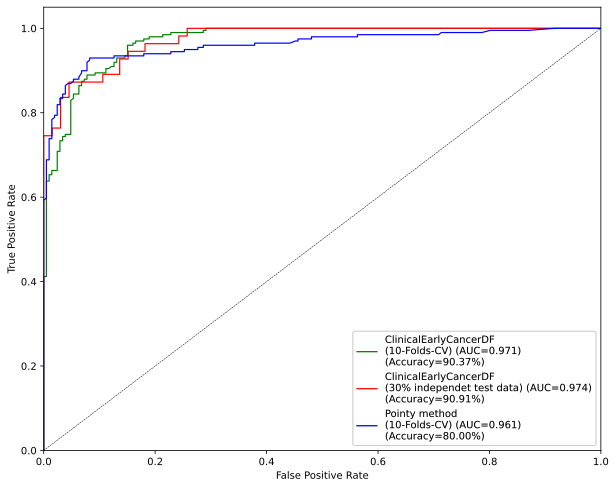

In [ ]:
# Plot all ROC curves
plt.figure(figsize=(10,8))
#colors = cycle(['green','red','blue','yellow','hotpink','aqua', 'darkorange', 'cornflowerblue','darkgreen','magenta','cyan','brown','gray','lightgreen'])
colors = cycle(['green','red','blue','yellow','hotpink','navy', 'darkorange', 'cornflowerblue','darkgreen','magenta','cyan','brown','gray'])

models=np.array(classifier)
#models=['CancerEMC (SD1)','CancerSEEK','CancerA1DE','NaiveBayes','SVM','KNN','J48','RandomForest','DNTB','MEOFuzzyC','AdaboostM1','DeepLearning','CancerEMC']
p=[]
for i, color in zip(range(len(classifier)), colors):
     #plt.plot(fpr[i], tpr[i], color=color, lw=1.2, label=''+models[i]+' (AUC={0:0.3f})'.format(roc_auc[i])+'\n(Accuracy={0:0.2f}%)'.format(acc[i]*100))
     if i==6:
        plt.plot(fpr[i], tpr[i], color=color, lw=1.2, label=''+models[i]+' (AUC={0:0.3f})'.format(roc_auc[i]))
     else:
        plt.plot(fpr[i], tpr[i], color=color, lw=1.2, label=''+models[i]+' (AUC={0:0.3f})'.format(roc_auc[i])+'\n(Accuracy={0:0.2f}%)'.format(acc[i]*100))

plt.plot([0, 1], [0, 1], 'k--', lw=0.5)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.title('Some extension of Receiver operating characteristic to multi-class\n\n')

l=plt.legend()
#plt.grid()
#plt.style.use('classic')
#for i, color in zip(range(len(classifier)), colors):
#     s=plt.plot([0],color=color, label=''+models[i]+' (Accuracy={0:0.2f}%)'.format(acc[i]*100))
#     p.append(s[0])
#plt.legend(handles=p,loc=6, bbox_to_anchor=(1.05, 0.5))
plt.gca().add_artist(l)

plt.savefig("ROCSingProfile.pdf", bbox_inches='tight')
plt.savefig("ROCSingProfile.png", bbox_inches='tight', dpi=1000)

In [ ]:
data

,tc,pc,p,np,pp,pnp,pointy,Patient.Type,class
0,1:Cancer,1:Cancer,1.000,0.000,1.000,0.320,0.680,Gastric cancer,1:Cancer
1,1:Cancer,1:Cancer,0.959,0.041,0.959,0.070,0.930,Gastric cancer,1:Cancer
2,1:Cancer,1:Cancer,0.999,0.001,0.999,0.206,0.794,Gastric cancer,1:Cancer
3,1:Cancer,1:Cancer,0.941,0.059,0.941,0.148,0.852,Gastric cancer,1:Cancer
4,1:Cancer,2:Healthy,0.904,0.904,0.096,0.024,0.976,Ovarian Cancer,1:Cancer
...,...,...,...,...,...,...,...,...,...
400,2:Healthy,1:Cancer,0.811,0.189,0.811,0.088,0.912,Colorectal Cancer,1:Cancer
401,2:Healthy,2:Healthy,0.661,0.661,0.339,0.204,0.796,Colorectal Cancer,1:Cancer
402,2:Healthy,2:Healthy,0.903,0.903,0.097,0.072,0.928,Colorectal Cancer,1:Cancer
403,2:Healthy,2:Healthy,0.994,0.994,0.006,0.106,0.894,Colorectal Cancer,1:Cancer


ValueError: ignored

<Figure size 4000x600 with 0 Axes>

In [ ]:
d = pd.read_csv('score compare .csv')
d

,Cancer_score,Cancer_Types,Methods
0,0.680,Gastric cancer,Pointy
1,0.930,Gastric cancer,Pointy
2,0.794,Gastric cancer,Pointy
3,0.852,Gastric cancer,Pointy
4,0.976,Ovarian Cancer,Pointy
...,...,...,...
377,0.837,Pancreatic Cancer,ClinicalEarlyCancerDF
378,0.166,Pancreatic Cancer,ClinicalEarlyCancerDF
379,1.000,Pancreatic Cancer,ClinicalEarlyCancerDF
380,0.999,Pancreatic Cancer,ClinicalEarlyCancerDF


In [ ]:
import plotly.express as px
fig = px.box(d, y="Cancer_score", color="Cancer_Types",
                title="Manually Specified Labels")
#fig=px.box(data, y="pp", color="Patient.Type")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

In [ ]:
import plotly.express as px
df = d
fig = px.box(d, x="Cancer_Types", y="Cancer_score", color="Methods",
             #notched=True, # used notched shape
             title="Cancer type detection score using Singnaturs profile data(DELFI cohort)",
             hover_data=["Cancer_Types"] # add day column to hover data
            )
fig.show()

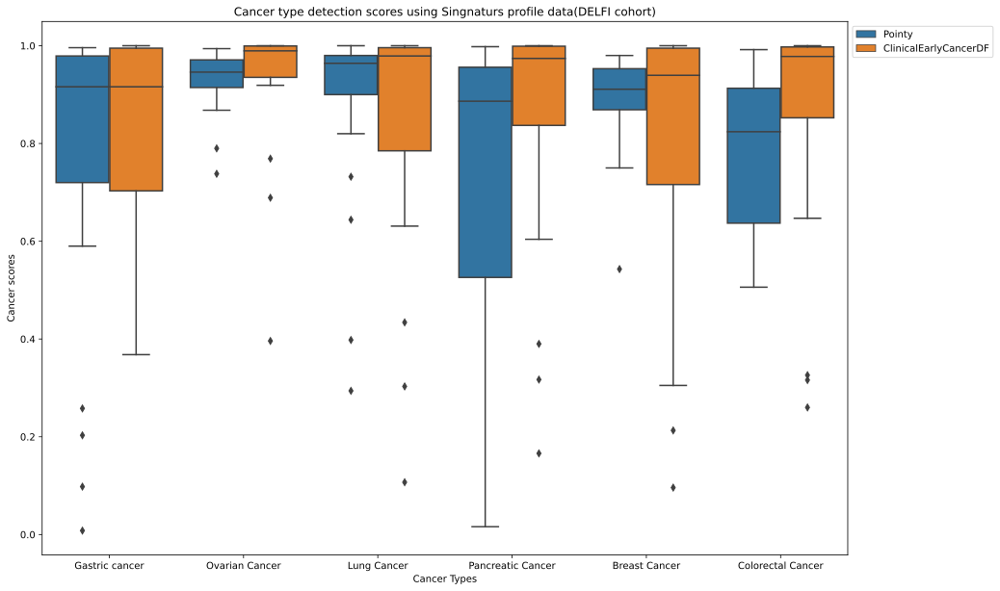

In [ ]:
import seaborn as sns
fig=plt.figure(figsize=(15,10))
ax = sns.boxplot(x="Cancer_Types", y="Cancer_score", hue="Methods",data=d)
#ax = sns.boxplot(x=data["Patient.Type"], y=data.pointy, data=data, color="grey")
plt.xlabel('Cancer Types')
plt.ylabel('Cancer scores')
plt.title("Cancer type detection scores using Singnaturs profile data(DELFI cohort)")
plt.legend(loc="upper left")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
fig.savefig("SBSResultScoreBoxPlot.png", bbox_inches='tight', dpi=300)
fig.savefig("SBSResultScoreBoxPlot.pdf", bbox_inches='tight', dpi=300)

#EarlyCancerDF New Data analysis:

#Visual representation of Figure 2

#PCA and variable analysis:

In [ ]:
DNAFragmentationDataSetBinary = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/Data_old/FS/DNAFragmentationDataSetBinary.csv')
DNAFragDataClass=DNAFragmentationDataSetBinary.iloc[:,47]
DNAFragData=DNAFragmentationDataSetBinary.iloc[:,:47]
DNAFragData
#DNAFragDataClass

,age,PA_score,chr1p,chr1q,chr2p,chr2q,chr3p,chr3q,chr4p,chr4q,...,chr20p,chr20q,chr21q,chr22q,Fragment_Size(bp),MedianFragmentRatioProfile,GC_CorrectedFragmentRatioProfile,FractionOfMitochondrialGenome,Coverage,gender
0,69,23.74,-20.27,-18.19,25.09,26.20,-102.97,24.14,-17.90,-33.11,...,26.07,25.47,-8.72,-11.60,163,0.20,0.53,0.0,1.86,0
1,51,2.03,-1.36,-1.69,-1.42,-1.35,-2.31,-2.02,1.11,0.47,...,0.00,-0.21,-0.42,0.63,166,0.78,0.88,0.0,1.77,1
2,55,6.66,5.38,5.64,5.38,5.56,6.74,5.42,3.75,4.92,...,-1.09,-0.58,-1.63,-0.66,166,0.93,0.92,0.0,2.26,1
3,67,3.58,-1.43,-1.59,-0.84,-1.04,-3.69,-3.10,0.82,-1.98,...,-1.57,0.09,0.83,2.57,166,0.65,0.89,0.0,2.12,0
4,76,2.28,-1.99,-1.63,-0.16,-0.60,-0.92,-3.45,1.62,-0.42,...,1.12,0.67,0.63,0.66,166,0.82,0.87,0.0,2.69,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418,58,3.16,-0.73,0.68,-0.64,-0.46,-4.37,-1.49,-0.71,0.36,...,-2.94,-1.01,0.22,1.06,169,0.95,0.91,0.0,2.43,1
419,69,4.74,0.11,0.79,-2.01,0.70,-3.93,1.22,-1.27,3.59,...,-3.98,-1.85,0.80,-0.03,170,0.94,0.89,0.0,2.35,1
420,70,5.54,-2.61,-0.65,-0.55,2.99,-0.31,0.51,2.89,3.27,...,-2.17,-3.23,-0.13,-1.20,170,0.00,0.83,0.0,2.03,1
421,58,4.97,0.11,1.11,1.09,-0.90,-2.51,-2.54,-3.01,-3.70,...,-0.05,1.88,0.17,1.34,168,0.93,0.88,0.0,2.89,1


In [ ]:
SingDataDF = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/SBSPDATA.csv')
SingDataDFClass=SingDataDF.iloc[:,0]
SingDataDFData=SingDataDF.iloc[:,1:]
SingDataDFData=SingDataDFData.replace(np.nan, 0)
SingDataDFData
#SingDataDFClass

,n_mut.SNP_in,n_mut.SNP_out,ichor,maf_targeted_seq,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,...,SBS53,SBS54,SBS55,SBS56,SBS57,SBS58,SBS59,SBS60,SBS84,SBS85
0,26853,4291,0.04055,0.0000,100,34,0,0,42,0,...,28,12,0,0,0,0,0,0,17,0
1,25164,3962,0.02652,0.0000,240,5,0,0,0,0,...,44,237,0,0,1,0,4,0,29,0
2,26424,4069,0.03000,0.0093,169,32,0,0,0,0,...,35,67,0,0,0,0,13,0,0,0
3,18932,2742,0.03575,0.0014,15,2,0,0,0,0,...,1,0,6,0,0,0,0,0,0,0
4,24303,3673,0.03115,0.0000,29,10,0,0,0,0,...,0,0,5,0,0,76,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
400,24985,4301,0.64500,0.4303,29,67,0,0,0,27,...,0,161,0,0,0,56,39,0,0,0
401,31175,5288,0.23870,0.8161,253,45,0,42,324,0,...,0,269,0,0,147,7,18,0,0,0
402,28751,5016,0.22380,0.3600,34,145,0,0,49,128,...,0,184,0,0,0,0,16,0,22,17
403,28764,4354,0.02825,0.0000,194,0,78,0,541,0,...,0,114,0,0,0,48,11,3,66,0


In [ ]:
CancerSEEK_Binary = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/CancerSEEK_Dataset_AVG.csv')
CancerSEEK_BinaryClass=CancerSEEK_Binary.iloc[:,46]
CancerSEEK_Data=CancerSEEK_Binary.iloc[:,0:44]
#CancerSEEK_Data=CancerSEEK_Data.replace('?', 0)
CancerSEEK_Class
CancerSEEK_Data

NameError: name 'CancerSEEK_Class' is not defined

In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA
pca = PCA(n_components=40)
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()


In [ ]:
#Delfi (cfDNA Frag)
scaler.fit(DNAFragData)
X_c1 = scaler.transform(DNAFragData)
X1 = pca.fit_transform(X_c1)
col1=list(DNAFragData.columns)

#Delfi (SBS)
scaler.fit(SingDataDFData)
X_c2 = scaler.transform(SingDataDFData)
X2 = pca.fit_transform(X_c2)
col2=list(SingDataDFData.columns)

#CancerSEEK
scaler.fit(CancerSEEK_Data)
X_c3 = scaler.transform(CancerSEEK_Data)
X3 = pca.fit_transform(X_c3)
col3=list(SingDataDFData.columns)

print(X1[:,1])
print(X2[:,1])
print(X3[:,1])

[-9.26297275e+00  1.32865712e+00 -7.43461501e-01  1.15392900e+00
  5.42713528e-01 -6.41176559e-01 -8.34425997e-01  1.59851158e-01
 -3.05263817e-01 -4.00174089e-01  4.05044074e-01  7.85034975e-02
  2.35122461e-01  2.50764148e-01  5.44246985e-02  1.10770245e+00
  1.25711396e+00  4.37096063e-01  1.34727048e+00  7.02939908e-01
  1.65739134e-01  6.02803001e-01 -3.96156281e+01  9.76431716e+00
 -1.49343523e+01  9.81254657e-01  2.33602723e+01  4.39722903e-01
  7.08792638e-01  2.34881292e-01  6.31446664e-01  4.84490409e-02
 -9.11508145e-01 -2.07733699e-02 -1.39052368e-01  3.40020962e-01
  7.19221227e-01 -1.31695266e+01  3.99615233e-01 -6.40032674e-01
  3.42534556e-01  9.48652306e-02  3.31076420e-01  9.41359336e-01
  4.44526849e-01 -2.04825938e-01  5.33180469e-01  6.78212208e-01
 -2.31940290e-01 -1.85666909e-01 -6.73034570e-01 -2.53216828e+00
 -1.71346036e+00  3.11442893e-01 -4.57827591e-01  9.05571228e-01
  1.60085849e-01  9.14349420e-02  1.95991101e-01  3.52798566e-01
  6.06833025e-02  1.72542

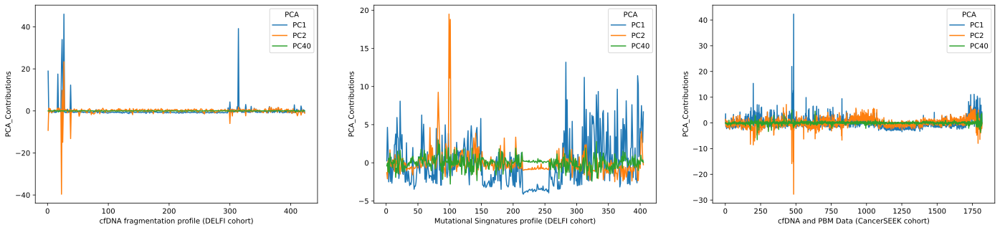

In [ ]:
import seaborn.objects as so

fig=plt.figure(figsize=(24,5))
ob=[]
p=[]
pv=[]
c=[]
for i in range(len(X1)):
  ob.append(i+1),p.append(X1[i,0]), pv.append("PC1"), c.append(DNAFragDataClass.iloc[i])
  ob.append(i+1),p.append(X1[i,1]), pv.append("PC2"), c.append(DNAFragDataClass.iloc[i])
  ob.append(i+1),p.append(X1[i,39]), pv.append("PC40"), c.append(DNAFragDataClass.iloc[i])
dict = {'cfDNA fragmentation profile (DELFI cohort)':ob, 'PCA_Contributions': p, 'PCA': pv, 'Class':c}
PCA1 = pd.DataFrame(dict)
#so.Plot(PCA1, y="PCA_Contributions",x="ind", color="PCA").add(so.Bar(), so.Hist(), so.Dodge())
fig.add_subplot(1,3,1)
#ax=sns.displot(data=PCA1, y="PCA_Contributions",kde=True, hue="PCA")
#fig.add_subplot(1,3,2)
ax=sns.lineplot(data=PCA1, y="PCA_Contributions",x="cfDNA fragmentation profile (DELFI cohort)",hue="PCA")
#ax=sns.barplot(data=PCA1, y="PCA_Contributions", x="cfDNA fragmentation profile (DELFI cohort)", hue="Class")
#ax=sns.plot(data=PCA1, x="cfDNA fragmentation profile (DELFI cohort)", y="PCA_Contributions", hue="PCA")
ob=[]
p=[]
pv=[]
c=[]
for i in range(len(X2)):
  ob.append(i+1),p.append(X2[i,0]), pv.append("PC1"), c.append(DNAFragDataClass.iloc[i])
  ob.append(i+1),p.append(X2[i,1]), pv.append("PC2"), c.append(DNAFragDataClass.iloc[i])
  ob.append(i+1),p.append(X2[i,39]), pv.append("PC40"), c.append(DNAFragDataClass.iloc[i])
dict = {'Mutational Singnatures profile (DELFI cohort)':ob, 'PCA_Contributions': p, 'PCA': pv, 'Class':c}
PCA1 = pd.DataFrame(dict)
fig.add_subplot(1,3,2)
ax=sns.lineplot(data=PCA1, y="PCA_Contributions",x="Mutational Singnatures profile (DELFI cohort)",hue="PCA")

ob=[]
p=[]
pv=[]
c=[]
for i in range(len(X3)):
  ob.append(i+1),p.append(X3[i,0]), pv.append("PC1"), c.append(CancerSEEK_BinaryClass.iloc[i])
  ob.append(i+1),p.append(X3[i,1]), pv.append("PC2"), c.append(CancerSEEK_BinaryClass.iloc[i])
  ob.append(i+1),p.append(X3[i,39]), pv.append("PC40"), c.append(CancerSEEK_BinaryClass.iloc[i])
dict = {'cfDNA and PBM Data (CancerSEEK cohort)':ob, 'PCA_Contributions': p, 'PCA': pv, 'Class':c}
PCA1 = pd.DataFrame(dict)
fig.add_subplot(1,3,3)
ax=sns.lineplot(data=PCA1, y="PCA_Contributions",x="cfDNA and PBM Data (CancerSEEK cohort)",hue="PCA")
fig.savefig("PCAContributionsPlotAll.png", bbox_inches='tight', dpi=300)
fig.savefig("PCAContributionsPlotAll.pdf", bbox_inches='tight', dpi=300)


In [ ]:
# activate R magic
%load_ext rpy2.ipython

In [ ]:
%%R
x <- 42
print(x)

[1] 42


In [ ]:
%%R
x

[1] 42


    Detection       PC1       PC2      PC40
0      Cancer  0.249927 -1.294808 -0.407291
1      Cancer  4.641235 -2.099960 -0.025563
2      Cancer  2.082215  0.284949 -1.192639
3      Cancer -2.499445 -0.748452  0.586884
4      Cancer -1.206685 -0.164662 -1.330502
..        ...       ...       ...       ...
400    Cancer  3.904714  3.184669  0.995460
401    Cancer  7.495888  4.098594  0.349772
402    Cancer  5.042595  2.983623  0.156933
403    Cancer  2.665945  0.365970  0.382450
404    Cancer  6.682084 -0.259731  0.041504

[405 rows x 4 columns]


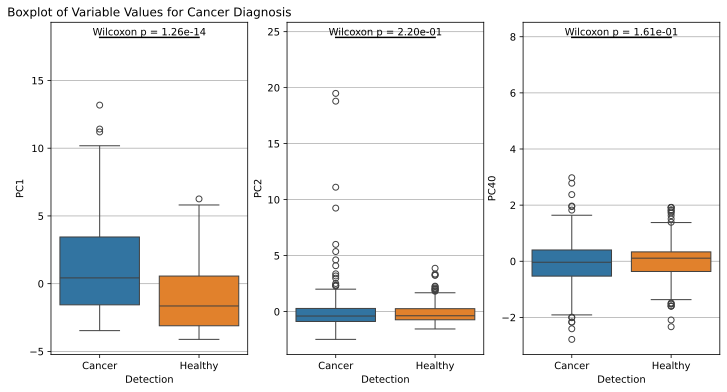

,Detection,PC1,PC2,PC40
0,Cancer,0.249927,-1.294808,-0.407291
1,Cancer,4.641235,-2.099960,-0.025563
2,Cancer,2.082215,0.284949,-1.192639
3,Cancer,-2.499445,-0.748452,0.586884
4,Cancer,-1.206685,-0.164662,-1.330502
...,...,...,...,...
400,Cancer,3.904714,3.184669,0.995460
401,Cancer,7.495888,4.098594,0.349772
402,Cancer,5.042595,2.983623,0.156933
403,Cancer,2.665945,0.365970,0.382450


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import wilcoxon
from scipy.stats import ranksums

fig=plt.figure(figsize=(12,6))


# Sample data generation: Variable values for two classes (Cancer diagnosis)
np.random.seed(42)

# Create DataFrame
c=SingDataDF.iloc[:,0]
pc=X2[:,0]
values = {
    'Detection':SingDataDF.iloc[:,0],
    'PC1' :X2[:,0],
    'PC2' :X2[:,1],
    'PC40' :X2[:,39]
              }
data = pd.DataFrame(values)
print(data)
  # Separate the two groups based on class
cancer = data[data['Detection'] == 'Cancer']['PC1']
healthy = data[data['Detection'] == 'Healthy']['PC1']
# Perform the Wilcoxon test
# Note: Here we assume two independent samples. For independent samples, use Mann-Whitney U test.
stat, p_value = ranksums(cancer,healthy)  # Paired comparison (first 50 from each)

# Create the boxplot
fig.add_subplot(1,3,1)
ax=sns.boxplot(x='Detection', y='PC1', data=data,hue=data.Detection)
# Add p-value bar annotation
y_max = data['PC1'].max() + 5  # Set y_max slightly above the maximum data point
plt.plot([0, 1], [y_max, y_max], lw=1.5, color='black')  # Draw line for p-value
plt.text(0.5, y_max, f'Wilcoxon p = {p_value:.2e}', ha='center', va='bottom')  # Add p-value text

# Adding title and labels
plt.title('Boxplot of Variable Values for Cancer Diagnosis')
plt.ylabel('PC1')
#plt.xticks([0, 1], ['Control', 'Cancer'])
plt.grid(axis='y')




cancer = data[data['Detection'] == 'Cancer']['PC2']
healthy = data[data['Detection'] == 'Healthy']['PC2']
# Perform the Wilcoxon test
# Note: Here we assume two independent samples. For independent samples, use Mann-Whitney U test.
stat, p_value = ranksums(cancer,healthy)  # Paired comparison (first 50 from each)

# Create the boxplot
fig.add_subplot(1,3,2)
ax=sns.boxplot(x='Detection', y='PC2', data=data,hue=data.Detection)
# Add p-value bar annotation
y_max = data['PC2'].max() + 5  # Set y_max slightly above the maximum data point
plt.plot([0, 1], [y_max, y_max], lw=1.5, color='black')  # Draw line for p-value
plt.text(0.5, y_max, f'Wilcoxon p = {p_value:.2e}', ha='center', va='bottom')  # Add p-value text

# Adding title and labels
#plt.title('Boxplot of Variable Values for Cancer Diagnosis')
plt.ylabel('PC2')
#plt.xticks([0, 1], ['Control', 'Cancer'])
plt.grid(axis='y')

cancer = data[data['Detection'] == 'Cancer']['PC40']
healthy = data[data['Detection'] == 'Healthy']['PC40']
# Perform the Wilcoxon test
# Note: Here we assume two independent samples. For independent samples, use Mann-Whitney U test.
stat, p_value = ranksums(cancer,healthy)  # Paired comparison (first 50 from each)

# Create the boxplot
fig.add_subplot(1,3,3)
ax=sns.boxplot(x='Detection', y='PC40', data=data,hue=data.Detection)
# Add p-value bar annotation
y_max = data['PC40'].max() + 5  # Set y_max slightly above the maximum data point
plt.plot([0, 1], [y_max, y_max], lw=1.5, color='black')  # Draw line for p-value
plt.text(0.5, y_max, f'Wilcoxon p = {p_value:.2e}', ha='center', va='bottom')  # Add p-value text

# Adding title and labels
#plt.title('Boxplot of Variable Values for Cancer Diagnosis')
plt.ylabel('PC40')
#plt.xticks([0, 1], ['Control', 'Cancer'])
plt.grid(axis='y')




# Show the plot
plt.show()
data

**Missing value Handling:**

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 5.1 MB/s eta 0:00:00


In [ ]:
%matplotlib inline
import IPython.core.display
# setup output image format (Chrome works best)
IPython.core.display.set_matplotlib_formats("svg")
import matplotlib.pyplot as plt
import matplotlib
from numpy import *
from sklearn import *
import os
import zipfile
import fnmatch
random.seed(100)
import skimage.io
import skimage.color
import skimage.transform
from scipy import ndimage
import numpy as np
import pandas as pd
import albumentations as A
import cv2
import warnings
warnings.filterwarnings('ignore')

from sklearn import *
from scipy import stats
random.seed(100)
import csv
from scipy import io
import pickle
from IPython.display import Audio, display
import numpy as np
from sklearn import model_selection
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

import numpy as np
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn import datasets, linear_model
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_predict

import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
#from scipy import interp
from sklearn.metrics import roc_auc_score

from numpy import loadtxt
from numpy import sort
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import KFold
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix as cm
import matplotlib.pyplot as plt
import pandas as pd
import time
import random
import numpy
from numpy import *
from sklearn import *
from pandas import *
from scipy import stats
from sklearn.metrics import accuracy_score

from sklearn.neural_network import MLPClassifier
#import optuna


import numpy as np
import pandas as pd
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, f1_score, roc_auc_score
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
#import optuna

from sklearn.metrics import (
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
    roc_auc_score,
    average_precision_score
)


In [ ]:
def model_evaluation1(model,x,y):
  pre=cross_val_predict(model, x, y, cv=10)
  acc = metrics.accuracy_score(y, pre)
  print("test accuracy = " + str(acc))
  classReport=classification_report(y, pre)
  print(classReport)
  cm=confusion_matrix(y, pre)
  print(cm)
  proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')
  fpr, tpr, _ = roc_curve(y,proba[:,0], pos_label='Cancer')
  roc_auc= auc(fpr, tpr)
  return acc,fpr,tpr,roc_auc

In [ ]:
def model_evaluationXY(model,x,y):
  pre=cross_val_predict(model, x, y, cv=10)
  proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')[:, 0]
  acc = metrics.accuracy_score(y, pre)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(y, 1-proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y, proba,pos_label="Cancer")
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(y, pre,pos_label='Cancer')
  print("pr = " + str(pr))
  f1 = f1_score(y, pre,pos_label='Cancer')
  print("f1 = " + str(f1))
  recall = recall_score(y, pre,pos_label='Cancer')
  print("recall = " + str(recall))

  classReport=classification_report(y, pre)
  print(classReport)
  cm=confusion_matrix(y, pre)
  print(cm)

  fpr, tpr, _ = roc_curve(y,proba, pos_label='Cancer')
  roc_auc= auc(fpr, tpr)
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr,proba

In [ ]:
def model_evaluation_pred(y_true,y_pred,y_proba):
  acc = metrics.accuracy_score(y_true, y_pred)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(y_true, y_proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y_true, y_proba)
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(y_true, y_pred)
  print("pr = " + str(pr))
  f1 = f1_score(y_true, y_pred)
  print("f1 = " + str(f1))
  recall = recall_score(y_true, y_pred)
  print("recall = " + str(recall))

  classReport=classification_report(y_true, y_pred)
  print(classReport)
  cm=confusion_matrix(y_true, y_pred)
  print(cm)
  fpr, tpr, _ = roc_curve(y_true,y_proba, pos_label='Cancer')
  roc_auc= auc(fpr, tpr)
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr,y_proba

In [ ]:
from scipy.spatial import ConvexHull
import numpy as np
def rocch(fpr0,tpr0):
    fpr = np.array([0]+list(fpr0)+[1.0,1,0])
    tpr = np.array([0]+list(tpr0)+[1.0,0,0])
    hull = ConvexHull(np.vstack((fpr,tpr)).T)
    vert = hull.vertices
    vert = vert[np.argsort(fpr[vert])]
    F = [0]
    T = [0]
    for v in vert:
        ft = (fpr[v],tpr[v])
        if ft==(0,0) or ft==(1,1) or ft==(1,0):
            continue
        F+=[fpr[v]]
        T+=[tpr[v]]
    F+=[1]
    T+=[1]
    auc = np.trapz(T,F)
    return F,T,auc

#Results analysis:

**Comparsion of all latest methods with all metrics(DELFI):**

1. DELFI (Gradint Boosting)
2. CancerSEEK (LR)
3. ASVM (SVM+sfle)
4. Pointy (RF)
5. AutoCancer (External validation)
6. GEMINI (LR)
7. PanSeer (LRCV)
8. SVM
9. Random Forest
10. LR
11. XGBoost
12. DT
13. AdaBoost
14. ANN
15. CancerEMC

DELFI Chohort:


In [ ]:
data11 = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/DNAFragmentationDataSet11.csv')
x=data11.iloc[:,1:12]
print(x)
y=data11.iloc[:,0]
print(y)
#print(Counter(y))
data = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/DNAFragmentationDataSetBinary.csv')
X=data.iloc[:,0:47]
Y=data.iloc[:,47]

     'Age at Diagnosis'  'PA Score'  chr1p  chr7p  chr8q  chr11q  chr17p  \
0                    69   23.743120 -20.27  39.64  93.57   27.70  -11.38   
1                    51    2.025100  -1.36   2.53   0.00   -2.00    0.92   
2                    55    6.660453   5.38  -2.68  -2.18   -2.01   -1.75   
3                    67    3.581623  -1.43   0.88  -0.26   -3.12    1.44   
4                    76    2.282642  -1.99   2.85   1.03   -0.30    0.53   
..                  ...         ...    ...    ...    ...     ...     ...   
418                  58    3.158140  -0.73   1.52   1.06   -3.48    2.19   
419                  69    4.740439   0.11   1.27   0.63   -3.95    0.71   
420                  70    5.535665  -2.61   4.12   4.28   -1.59   -2.00   
421                  58    4.966336   0.11   0.73   6.81   -4.30    0.02   
422                  64    2.251351   2.37  -0.48   2.14    1.39   -1.50   

     chr17q  chr21q  chr22q  Fragment_Size(bp)  
0    -16.30   -8.72  -11.60           

     n_mut.SNP_in  n_mut.SNP_out    ichor  maf_targeted_seq  SBS1  SBS2  SBS5  \
0           26853           4291  0.04055               NaN   100    34    42   
1           25164           3962  0.02652               NaN   240     5     0   
2           26424           4069  0.03000            0.0093   169    32     0   
3           18932           2742  0.03575            0.0014    15     2     0   
4           24303           3673  0.03115               NaN    29    10     0   
..            ...            ...      ...               ...   ...   ...   ...   
400         24985           4301  0.64500            0.4303    29    67     0   
401         31175           5288  0.23870            0.8161   253    45   324   
402         28751           5016  0.22380            0.3600    34   145    49   
403         28764           4354  0.02825               NaN   194     0   541   
404         28738           4673  0.37110            0.3072   228    33   976   

     SBS30  SBS39  SBS54  S

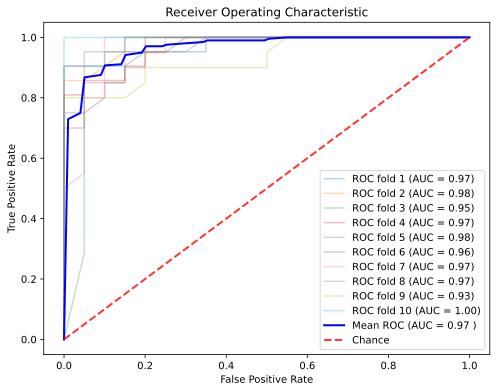

Average Accuracy: 0.9037
Average AUC: 0.9683
Average AUC-PR: 0.9664
Average Precision: 0.9099
Average Recall: 0.9037
Average F1 Score: 0.9034


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score, precision_score, recall_score, f1_score, roc_curve
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

# Load your data
data11 = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/DNAFragmentationDataSet11.csv')
x=data11.iloc[:,1:12]
y=data11.iloc[:,0]

# Convert string labels to numerical labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)


# Initialize lists to store results
accuracy_scores = []
auc_scores = []
auc_pr_scores = []
precision_scores = []
recall_scores = []
f1_scores = []
tprs = []
mean_fpr = np.linspace(0, 1, 100)


# Setup Stratified K-Fold Cross Validation
n_splits = 10
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Model
model = RandomForestClassifier(random_state=42)


fig, ax = plt.subplots(figsize=(8,6))
# Perform cross-validation
for fold, (train_index, test_index) in enumerate(skf.split(x, y_encoded)):
    X_train, X_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y_encoded[train_index], y_encoded[test_index]

    # Fit the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]  # Probability of the positive class

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob)
    auc_pr = average_precision_score(y_test, y_prob)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)


    # Store results
    accuracy_scores.append(accuracy)
    auc_scores.append(auc)
    auc_pr_scores.append(auc_pr)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    #ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    ax.plot(fpr, tpr, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (fold+1, auc))

# Calculate the mean ROC curve
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
ax.plot(mean_fpr, mean_tpr, color='b',
         label=r'Mean ROC (AUC = %0.2f )' % (np.trapz(mean_tpr,mean_fpr)),lw=2, alpha=1)
ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)

# Plot the final ROC curve
ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05], title="Receiver Operating Characteristic")
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.legend(loc="lower right")
plt.show()


# Print average results
print(f"Average Accuracy: {np.mean(accuracy_scores):.4f}")
print(f"Average AUC: {np.mean(auc_scores):.4f}")
print(f"Average AUC-PR: {np.mean(auc_pr_scores):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1 Score: {np.mean(f1_scores):.4f}")

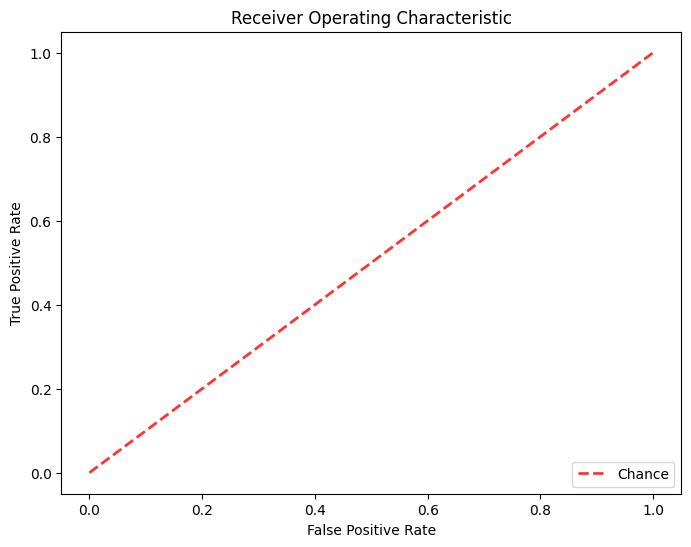

Average Accuracy: 0.9000
Average AUC: 0.4500
Average AUC-PR: 0.4571
Average Precision: 0.9000
Average Recall: 0.9000
Average F1 Score: 0.9000


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score, precision_score, recall_score, f1_score, roc_curve
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

class DecisionTableNB:
    def __init__(self):
        self.decision_table = {}
        self.label_mapping = {}
        self.reverse_label_mapping = {}
        self.next_label_index = 0

    def fit(self, X, y):
        for i in range(len(X)):
            row_tuple = tuple(X.iloc[i])
            class_label = y.iloc[i]

            if class_label not in self.label_mapping:
              self.label_mapping[class_label] = self.next_label_index
              self.reverse_label_mapping[self.next_label_index] = class_label
              self.next_label_index += 1

            integer_label = self.label_mapping[class_label]

            if row_tuple not in self.decision_table:
                self.decision_table[row_tuple] = [integer_label]
            else:
                self.decision_table[row_tuple].append(integer_label)

    def predict(self, X):
        predictions = []
        for i in range(len(X)):
            row_tuple = tuple(X.iloc[i])
            if row_tuple in self.decision_table:
                 predicted_class_index = np.bincount(self.decision_table[row_tuple]).argmax()
                 predicted_class = self.reverse_label_mapping[predicted_class_index]
                 predictions.append(predicted_class)
            else:
                predictions.append(np.nan)
        return np.array(predictions)


# Load your data
data11 = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/DNAFragmentationDataSet11.csv')
x=data11.iloc[:,1:12]
y=data11.iloc[:,0]


# Convert string labels to numerical labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
y_encoded = pd.Series(y_encoded) # Convert y_encoded to pandas Series


# Initialize lists to store results
accuracy_scores = []
auc_scores = []
auc_pr_scores = []
precision_scores = []
recall_scores = []
f1_scores = []
tprs = []
mean_fpr = np.linspace(0, 1, 100)


# Setup Stratified K-Fold Cross Validation
n_splits = 10
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Model
model = DecisionTableNB()

fig, ax = plt.subplots(figsize=(8,6))
# Perform cross-validation
for fold, (train_index, test_index) in enumerate(skf.split(x, y_encoded)):
    X_train, X_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y_encoded.iloc[train_index], y_encoded.iloc[test_index] # Index using iloc

    # Fit the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Since DecisionTableNB may return NaN predictions, filter them out
    valid_indices = ~pd.isnull(y_pred)
    y_pred_filtered = y_pred[valid_indices]
    y_test_filtered = y_test[valid_indices]
    y_prob = np.zeros(len(y_test_filtered)) # Initialize y_prob to zeros for AUC calculation

    # Calculate metrics only if there are valid predictions
    if len(y_pred_filtered) > 0 :
      accuracy = accuracy_score(y_test_filtered, y_pred_filtered)
      # Handle the case where there is only one class in the prediction, to avoid errors in roc_auc_score
      if len(np.unique(y_test_filtered)) > 1:
        try: # handle the errors where a particular class is missing
           auc = roc_auc_score(y_test_filtered, y_prob) # use zero probability for all clases when there is no probability
        except ValueError:
            auc = 0 # set it to zero
        try: # handle the errors where a particular class is missing
          auc_pr = average_precision_score(y_test_filtered, y_prob)  # use zero probability for all clases when there is no probability
        except ValueError:
          auc_pr=0 # set to zero
      else:
          auc = 0 # if there is only one class set to zero
          auc_pr=0 # if there is only one class set to zero
      precision = precision_score(y_test_filtered, y_pred_filtered, average='weighted', zero_division=0)
      recall = recall_score(y_test_filtered, y_pred_filtered, average='weighted', zero_division=0)
      f1 = f1_score(y_test_filtered, y_pred_filtered, average='weighted', zero_division=0)
    else:
      accuracy = 0
      auc = 0
      auc_pr = 0
      precision = 0
      recall = 0
      f1 = 0

    # Store results
    accuracy_scores.append(accuracy)
    auc_scores.append(auc)
    auc_pr_scores.append(auc_pr)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    # ROC curve calculation and plotting
    # the DecisionTableNB doesn't provide predict proba, so we will not draw the ROC curve
    #fpr, tpr, thresholds = roc_curve(y_test_filtered, y_prob)
    #tprs.append(np.interp(mean_fpr, fpr, tpr))
    #tprs[-1][0] = 0.0
    #ax.plot(fpr, tpr, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (fold+1, auc))

# Calculate the mean ROC curve
# mean_tpr = np.mean(tprs, axis=0)
# mean_tpr[-1] = 1.0
# ax.plot(mean_fpr, mean_tpr, color='b',
#          label=r'Mean ROC (AUC = %0.2f )' % (np.trapz(mean_tpr,mean_fpr)),lw=2, alpha=1)
ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)

# Plot the final ROC curve
ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05], title="Receiver Operating Characteristic")
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.legend(loc="lower right")
plt.show()


# Print average results
print(f"Average Accuracy: {np.mean(accuracy_scores):.4f}")
print(f"Average AUC: {np.mean(auc_scores):.4f}")
print(f"Average AUC-PR: {np.mean(auc_pr_scores):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1 Score: {np.mean(f1_scores):.4f}")

[I 2025-02-26 12:22:04,498] A new study created in memory with name: no-name-40bd557f-df15-4615-b4de-791576952c49
[I 2025-02-26 12:22:51,105] Trial 0 finished with value: 0.9180339105339105 and parameters: {'classifier': 'GradientBoosting', 'gb_n_estimators': 500, 'gb_max_depth': 7, 'gb_learning_rate': 0.09858666006425827}. Best is trial 0 with value: 0.9180339105339105.
[I 2025-02-26 12:23:01,185] Trial 1 finished with value: 0.919983508554937 and parameters: {'classifier': 'RandomForest', 'rf_n_estimators': 400, 'rf_max_depth': 13, 'rf_min_samples_split': 8, 'rf_min_samples_leaf': 3}. Best is trial 1 with value: 0.919983508554937.
[I 2025-02-26 12:23:01,558] Trial 2 finished with value: 0.9062688105545249 and parameters: {'classifier': 'LogisticRegression', 'lr_penalty': 'elasticnet', 'lr_solver': 'liblinear', 'lr_c': 1.469877808781205, 'lr_l1_ratio': 0.7106181490236959}. Best is trial 1 with value: 0.919983508554937.
[I 2025-02-26 12:23:01,923] Trial 3 finished with value: 0.9080839

Best trial: {'classifier': 'RandomForest', 'rf_n_estimators': 900, 'rf_max_depth': 7, 'rf_min_samples_split': 2, 'rf_min_samples_leaf': 1}
Best AUC: 0.9263172541743969
Test accuracy = 0.8534278959810875
              precision    recall  f1-score   support

           0       0.87      0.83      0.85       208
           1       0.84      0.88      0.86       215

    accuracy                           0.85       423
   macro avg       0.85      0.85      0.85       423
weighted avg       0.85      0.85      0.85       423

[[172  36]
 [ 26 189]]


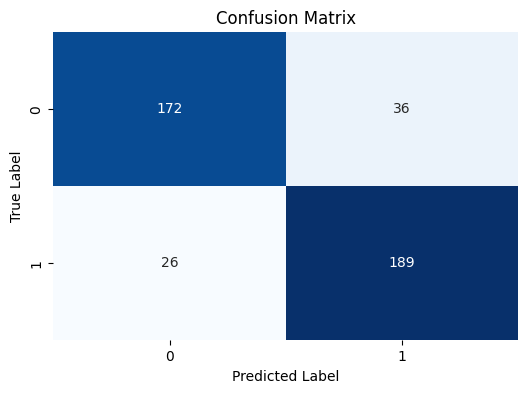

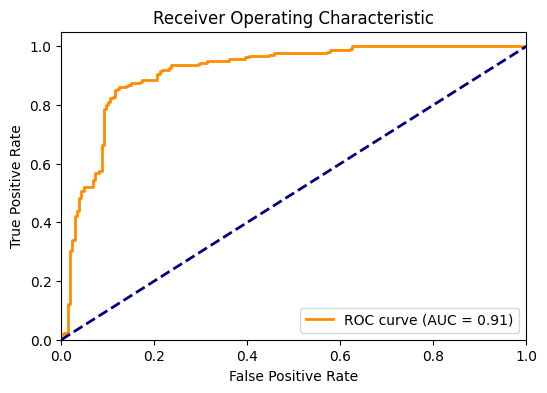

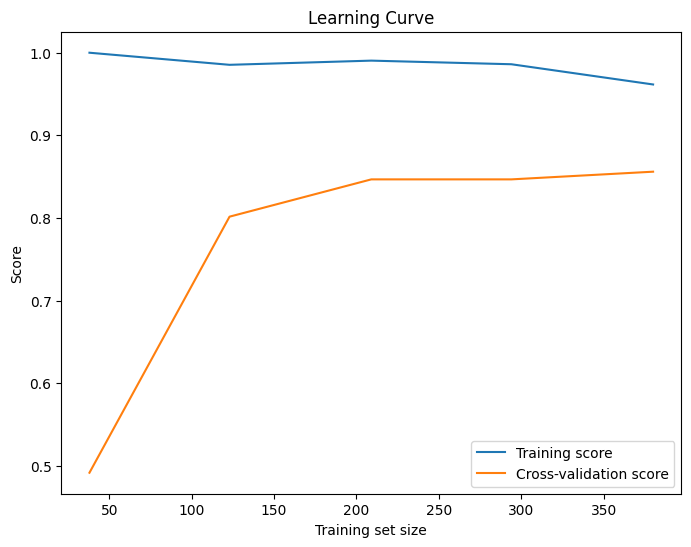

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
import optuna
import warnings
warnings.filterwarnings("ignore")
from sklearn import metrics
from sklearn.model_selection import cross_val_predict
#import scikitplot as skplt #remove this line since we're doing the fix
import matplotlib.pyplot as plt
from scipy import interpolate #add this line
def model_evaluation(model,x,y):
    pre=cross_val_predict(model, x, y, cv=10)
    acc = metrics.accuracy_score(y, pre)
    print("Test accuracy = " + str(acc))
    classReport=metrics.classification_report(y, pre)
    print(classReport)
    cm=metrics.confusion_matrix(y, pre)
    print(cm)
    #skplt.metrics.plot_confusion_matrix(y, pre) #comment this line out
    #plt.show() #comment this line out
    #proba = cross_val_predict(model, x, y, cv=10, method='predict_proba') #comment this line out
    #skplt.metrics.plot_roc_curve(y,proba) #comment this line out
    #plt.show() #comment this line out
    #skplt.estimators.plot_learning_curve(model,x,y,cv=10,figsize=(8,6)) #comment this line out
    #plt.show() #comment this line out

    #the following code replaces the scikitplot code that was removed
    from sklearn.metrics import confusion_matrix, roc_curve, auc
    import matplotlib.pyplot as plt
    import seaborn as sns

    # Confusion Matrix
    cm = confusion_matrix(y, pre)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

    # ROC Curve
    proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')
    fpr, tpr, thresholds = roc_curve(y, proba[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

    # Learning Curve (simplified - this is a complex function and I don't have all its details)
    from sklearn.model_selection import learning_curve
    train_sizes, train_scores, test_scores = learning_curve(model, x, y, cv=10, train_sizes=np.linspace(0.1, 1.0, 5))
    train_scores_mean = np.mean(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)

    plt.figure(figsize=(8, 6))
    plt.plot(train_sizes, train_scores_mean, label='Training score')
    plt.plot(train_sizes, test_scores_mean, label='Cross-validation score')
    plt.xlabel('Training set size')
    plt.ylabel('Score')
    plt.title('Learning Curve')
    plt.legend(loc="best")
    plt.show()
    return acc

# Load your data
data11 = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/DNAFragmentationDataSet11.csv')
x=data11.iloc[:,1:12]
y=data11.iloc[:,0]

# Convert string labels to numerical labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Define the objective function for Optuna
def objective(trial):
    # Define the model
    classifier_name = trial.suggest_categorical('classifier', ['RandomForest', 'GradientBoosting', 'LogisticRegression'])

    if classifier_name == 'RandomForest':
        classifier = RandomForestClassifier(
            n_estimators=trial.suggest_int('rf_n_estimators', 100, 1000, step=100),
            max_depth=trial.suggest_int('rf_max_depth', 3, 15),
            min_samples_split=trial.suggest_int('rf_min_samples_split', 2, 10),
            min_samples_leaf=trial.suggest_int('rf_min_samples_leaf', 1, 5),
            random_state=42,
            class_weight='balanced'
        )
    elif classifier_name == 'GradientBoosting':
        classifier = GradientBoostingClassifier(
            n_estimators=trial.suggest_int('gb_n_estimators', 100, 1000, step=100),
            max_depth=trial.suggest_int('gb_max_depth', 3, 10),
            learning_rate=trial.suggest_float('gb_learning_rate', 0.01, 0.2),
            random_state=42,
        )
    elif classifier_name == 'LogisticRegression':
      penalty = trial.suggest_categorical('lr_penalty', ['l1', 'l2', 'elasticnet'])
      solver = trial.suggest_categorical('lr_solver', ['liblinear', 'saga'])
      # Ensure 'saga' solver is used if 'elasticnet' penalty is chosen
      if penalty == 'elasticnet':
          solver = 'saga'
      classifier = LogisticRegression(
          C=trial.suggest_float('lr_c', 0.001, 10),
          penalty=penalty,
          solver=solver,
          l1_ratio=trial.suggest_float('lr_l1_ratio', 0.0, 1.0) if penalty == 'elasticnet' else None, #added this line
          random_state=42,
          class_weight='balanced'
      )


    # Create a pipeline
    pipeline = Pipeline([
      ('scaler', StandardScaler()),
      ('classifier', classifier)
    ])

    # Perform cross-validation and calculate mean AUC
    skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
    auc_scores = []
    for train_index, test_index in skf.split(x, y_encoded):
        X_train, X_test = x.iloc[train_index], x.iloc[test_index]
        y_train, y_test = y_encoded[train_index], y_encoded[test_index]

        pipeline.fit(X_train, y_train)
        y_prob = pipeline.predict_proba(X_test)[:, 1]
        auc = roc_auc_score(y_test, y_prob)
        auc_scores.append(auc)

    return np.mean(auc_scores)

# Run Optuna optimization
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Get the best model
best_trial = study.best_trial
print(f"Best trial: {best_trial.params}")
print(f"Best AUC: {best_trial.value}")

# Train and evaluate the best model
best_classifier_name = best_trial.params.get('classifier', None)
best_classifier = None

if best_classifier_name == 'RandomForest':
    best_classifier = RandomForestClassifier(
        n_estimators=best_trial.params['rf_n_estimators'],
        max_depth=best_trial.params['rf_max_depth'],
        min_samples_split=best_trial.params['rf_min_samples_split'],
        min_samples_leaf=best_trial.params['rf_min_samples_leaf'],
        random_state=42,
        class_weight='balanced'
    )
elif best_classifier_name == 'GradientBoosting':
    best_classifier = GradientBoostingClassifier(
        n_estimators=best_trial.params['gb_n_estimators'],
        max_depth=best_trial.params['gb_max_depth'],
        learning_rate=best_trial.params['gb_learning_rate'],
         random_state=42,
    )
elif best_classifier_name == 'LogisticRegression':
      best_classifier = LogisticRegression(
          C=best_trial.params['lr_c'],
          penalty=best_trial.params['lr_penalty'],
          solver=best_trial.params['lr_solver'],
          l1_ratio=best_trial.params.get('lr_l1_ratio', None),
          random_state=42,
          class_weight='balanced'
      )

pipeline = Pipeline([
  ('scaler', StandardScaler()),
  ('classifier', best_classifier)
])
acc=model_evaluation(pipeline,x,y_encoded)

In [ ]:
pip install scikit-plot optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 6.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score, precision_score, recall_score, f1_score, roc_curve
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

# Load your data
data11 = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/DNAFragmentationDataSet11.csv')
x=data11.iloc[:,1:12]
y=data11.iloc[:,0]

# Convert string labels to numerical labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)


# Initialize lists to store results
accuracy_scores = []
auc_scores = []
auc_pr_scores = []
precision_scores = []
recall_scores = []
f1_scores = []
tprs = []
mean_fpr = np.linspace(0, 1, 100)


# Setup Stratified K-Fold Cross Validation
n_splits = 10
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Model
model = RandomForestClassifier(random_state=42)


fig, ax = plt.subplots(figsize=(8,6))
# Perform cross-validation
for fold, (train_index, test_index) in enumerate(skf.split(x, y_encoded)):
    X_train, X_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y_encoded[train_index], y_encoded[test_index]

    # Fit the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]  # Probability of the positive class

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob)
    auc_pr = average_precision_score(y_test, y_prob)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)


    # Store results
    accuracy_scores.append(accuracy)
    auc_scores.append(auc)
    auc_pr_scores.append(auc_pr)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

    #ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    ax.plot(fpr, tpr, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (fold+1, auc))

# Calculate the mean ROC curve
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
ax.plot(mean_fpr, mean_tpr, color='b',
         label=r'Mean ROC (AUC = %0.2f )' % (np.trapz(mean_tpr,mean_fpr)),lw=2, alpha=1)
ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)

# Plot the final ROC curve
ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05], title="Receiver Operating Characteristic")
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.legend(loc="lower right")
plt.show()


# Print average results
print(f"Average Accuracy: {np.mean(accuracy_scores):.4f}")
print(f"Average AUC: {np.mean(auc_scores):.4f}")
print(f"Average AUC-PR: {np.mean(auc_pr_scores):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1 Score: {np.mean(f1_scores):.4f}")

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
import numpy as np

class DecisionTableNB:
       def __init__(self):
           self.decision_table = {}
           self.label_mapping = {} # Mapping from original string labels to integers
           self.reverse_label_mapping = {} # Reverse mapping from integers to original string labels
           self.next_label_index = 0 # Counter to assign new integer labels

       def fit(self, X, y):
           for i in range(len(X)):
               row_tuple = tuple(X.iloc[i])  # Convert row to tuple to use as a key
               class_label = y.iloc[i]

               # Convert the class labels to integers
               if class_label not in self.label_mapping:
                 self.label_mapping[class_label] = self.next_label_index
                 self.reverse_label_mapping[self.next_label_index] = class_label
                 self.next_label_index += 1

               integer_label = self.label_mapping[class_label]

               if row_tuple not in self.decision_table:
                   self.decision_table[row_tuple] = [integer_label]
               else:
                   self.decision_table[row_tuple].append(integer_label)

       def predict(self, X):
           predictions = []
           for i in range(len(X)):
               row_tuple = tuple(X.iloc[i])  # Convert row to tuple
               if row_tuple in self.decision_table:
                   # Use the mode of class labels for the prediction
                   predicted_class_index = np.bincount(self.decision_table[row_tuple]).argmax()
                   predicted_class = self.reverse_label_mapping[predicted_class_index] # map integer label back to string
                   predictions.append(predicted_class)
               else:
                   # If the row is not in the decision table, we append np.nan
                   predictions.append(np.nan)
           return np.array(predictions)

# Data loading (assuming this is from previous cells)
data11 = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/DNAFragmentationDataSet11.csv')
x=data11.iloc[:,1:12]
y=data11.iloc[:,0]
data = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/DNAFragmentationDataSetBinary.csv')
X=data.iloc[:,0:47]
Y=data.iloc[:,47]

# Fit the Decision Table with Naive Bayes
dt_nb = DecisionTableNB()
dt_nb.fit(x, y)

# Predictions
predictions = dt_nb.predict(x)

# Filter out NaN predictions and get the corresponding true labels
valid_indices = ~pd.isnull(predictions)
predictions = predictions[valid_indices]
y_test_filtered = y.values[valid_indices]


# Evaluate predictions only if there are valid predictions
if len(predictions) > 0:
  accuracy = accuracy_score(y_test_filtered, predictions)
  print(f'Accuracy: {accuracy * 100:.2f}%')
else:
  print("No valid predictions to evaluate.")

Accuracy: 100.00%


In [ ]:
classifier=[]
acc=[]
roc_auc=[]
pr_auc=[]
pr=[]
f1=[]
recall=[]
fpr=[]
tpr=[]
prob=[]
yt=[]

In [ ]:
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score, precision_score, recall_score, f1_score, roc_curve, auc
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer # Import SimpleImputer

# Load your data (replace with your actual data loading)
data11 = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/SBSPDATA-REF.csv')
x=data11.iloc[:,1:12]
y=data11.iloc[:,0]
#print(Counter(y))
data = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/SBSPDATA.csv')
X=data.iloc[:,0:47]
Y=data.iloc[:,0]
Y

datax = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/CancerSEEK_Dataset_AVG_data17.csv')
x=datax.iloc[:,:16]
x=x.drop('Race', axis=1)
y=datax.iloc[:,16]
dataX = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/CancerSEEK_Dataset.csv', encoding='latin-1')  # or 'iso-8859-1'X=dataX.iloc[:423,0:51]
X=dataX.iloc[:,:46]
Y=dataX.iloc[:,48]
Y.head()

# Convert string labels to numerical labels if needed
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)


# Initialize lists to store results for each fold
accuracy_scores = []
auc_scores = []
pr_auc_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Define the number of CV folds
n_splits = 10

# Initialize Stratified K-Fold
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Model
#model = GradientBoostingClassifier(random_state=42)
model = linear_model.LogisticRegression(C=150)
#model =SVC(C=1000.0, kernel='rbf', degree=3, gamma='scale', coef0=0.0, shrinking=True, tol=0.001, cache_size=200, class_weight=None, verbose=False, max_iter=-1, decision_function_shape='ovr', break_ties=False, random_state=42,probability=True)

# Imputation
imputer = SimpleImputer(strategy='mean') # Create an imputer instance

# Iterate over the folds
for train_index, test_index in kf.split(x, y_encoded):
    X_train, X_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y_encoded[train_index], y_encoded[test_index]

    # Impute missing values in X_train and X_test
    X_train = imputer.fit_transform(X_train) # Fit and transform on training data
    X_test = imputer.transform(X_test) # Transform test data using the trained imputer

    # Fit the model
    model.fit(X_train, y_train)

    # Predict probabilities and classes
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    y_pred = model.predict(X_test)

    # Calculate metrics for this fold
    accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    pr_auc = average_precision_score(y_test, y_pred_proba)
    precision = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_test, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)

    # Store results
    accuracy_scores.append(accuracy)
    auc_scores.append(roc_auc)
    pr_auc_scores.append(pr_auc)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)

# Print average metrics
print(f"Average Accuracy: {np.mean(accuracy_scores):.4f}")
print(f"Average AUC: {np.mean(auc_scores):.4f}")
print(f"Average PR AUC: {np.mean(pr_auc_scores):.4f}")
print(f"Average Precision: {np.mean(precision_scores):.4f}")
print(f"Average Recall: {np.mean(recall_scores):.4f}")
print(f"Average F1-score: {np.mean(f1_scores):.4f}")

Average Accuracy: 0.8069
Average AUC: 0.8908
Average PR AUC: 0.8258
Average Precision: 0.8082
Average Recall: 0.8069
Average F1-score: 0.8064


In [ ]:
# prompt: distrbute data randomly 70% for training and 30% for test data for X, Y dat. and find accuracy, AUC for GradientBoostingClassifier

from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score

datax = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/CancerSEEK_Dataset_AVG_data17.csv')
x=datax.iloc[:,:16]
x=x.drop('Race', axis=1)
y=datax.iloc[:,16]
dataX = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/CancerSEEK_Dataset.csv', encoding='latin-1')  # or 'iso-8859-1'X=dataX.iloc[:423,0:51]
X=dataX.iloc[:,:46]
Y=dataX.iloc[:,48]
Y.head()

# Assuming X and Y are your features and labels respectively
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)
imputer = SimpleImputer(strategy='mean') # Create an imputer instance
X_train = imputer.fit_transform(X_train) # Fit and transform on training data
X_test = imputer.transform(X_test) # Transform test data using the trained imputer

# Initialize and train the GradientBoostingClassifier
model = GradientBoostingClassifier(n_estimators=10)
#model = linear_model.LogisticRegression(C=100)
#model = RandomForestClassifier(n_estimators=10)
#model = linear_model.LogisticRegression(C=1)
from sklearn.ensemble import BaggingClassifier
rf = RandomForestClassifier(n_estimators=100) #1.0
bag = BaggingClassifier(estimator=rf,
                        n_estimators=10, random_state=0)
    # Set up LR classifier that will automatically fit the best C value using the training set
#model = SVC(C=10000.0, kernel='rbf', degree=3, gamma='scale', coef0=0.0, shrinking=True, tol=0.001, cache_size=200, class_weight=None, verbose=False, max_iter=-1, decision_function_shape='ovr', break_ties=False, random_state=42,probability=True)

model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1]

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Calculate AUC
auc = roc_auc_score(y_test, y_prob)
print(f"AUC: {auc}")

# Calculate AUC-PR
auc_pr = average_precision_score(y_test, y_prob, pos_label='Cancer') # Assuming 'Cancer' is the positive label
print(f"AUC-PR: {auc_pr}")


Accuracy: 0.8772893772893773
AUC: 0.9583701788993946
AUC-PR: 0.37010369875118193


In [ ]:
# prompt: write SVM classifier with 30% test data

from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Assuming X and Y are your features and labels
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

# Initialize and train the SVM classifier
model = SVC(probability=True) # Enable probability estimates for ROC curve
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1] # Probability of positive class

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


In [ ]:
gbc=GradientBoostingClassifier(n_estimators=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(gbc,x,y)
classifier.append('DELFI')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.8463356973995272
roc_auc = 0.9081618962432916
pr_auc = 0.9196922452836149
pr = 0.8950276243093923
f1 = 0.8329048843187661
recall = 0.7788461538461539
              precision    recall  f1-score   support

      Cancer       0.90      0.78      0.83       208
     Healthy       0.81      0.91      0.86       215

    accuracy                           0.85       423
   macro avg       0.85      0.85      0.85       423
weighted avg       0.85      0.85      0.85       423

[[162  46]
 [ 19 196]]


In [ ]:
logreg = linear_model.LogisticRegression(C=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(logreg,X,Y)
classifier.append('CancerSEEK')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.7777777777777778
roc_auc = 0.8498211091234347
pr_auc = 0.8757130670352087
pr = 0.796875
f1 = 0.765
recall = 0.7355769230769231
              precision    recall  f1-score   support

      Cancer       0.80      0.74      0.77       208
     Healthy       0.76      0.82      0.79       215

    accuracy                           0.78       423
   macro avg       0.78      0.78      0.78       423
weighted avg       0.78      0.78      0.78       423

[[153  55]
 [ 39 176]]


In [ ]:
rf = RandomForestClassifier(n_estimators=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(rf,x,y)
classifier.append('Pointy')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.8628841607565012
roc_auc = 0.9105433810375669
pr_auc = 0.919845740425639
pr = 0.8640776699029126
f1 = 0.8599033816425121
recall = 0.8557692307692307
              precision    recall  f1-score   support

      Cancer       0.86      0.86      0.86       208
     Healthy       0.86      0.87      0.87       215

    accuracy                           0.86       423
   macro avg       0.86      0.86      0.86       423
weighted avg       0.86      0.86      0.86       423

[[178  30]
 [ 28 187]]


In [ ]:
logreg = linear_model.LogisticRegression(C=150)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(logreg,x,y)
classifier.append('GEMINI')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.7683215130023641
roc_auc = 0.8495304114490161
pr_auc = 0.8822524022548286
pr = 0.8055555555555556
f1 = 0.7474226804123711
recall = 0.6971153846153846
              precision    recall  f1-score   support

      Cancer       0.81      0.70      0.75       208
     Healthy       0.74      0.84      0.79       215

    accuracy                           0.77       423
   macro avg       0.77      0.77      0.77       423
weighted avg       0.77      0.77      0.77       423

[[145  63]
 [ 35 180]]


In [ ]:
#PanSeer
from sklearn.linear_model import LogisticRegressionCV
for random_state in range(100):
    random.seed(random_state)
    # Set up LR classifier that will automatically fit the best C value using the training set
    clf = LogisticRegressionCV(penalty='l1', solver='liblinear', random_state=random_state,
                               Cs=[1.0, 5.0, 10.0, 50.0, 100.0], cv=2)
    clf.fit(x,y)
#logreg = linear_model.LogisticRegression(C=150)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(clf,x,y)
classifier.append('PanSeer')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.7730496453900709
roc_auc = 0.8597048300536673
pr_auc = 0.8896131986387955
pr = 0.8010752688172043
f1 = 0.7563451776649747
recall = 0.7163461538461539
              precision    recall  f1-score   support

      Cancer       0.80      0.72      0.76       208
     Healthy       0.75      0.83      0.79       215

    accuracy                           0.77       423
   macro avg       0.78      0.77      0.77       423
weighted avg       0.78      0.77      0.77       423

[[149  59]
 [ 37 178]]


In [ ]:
from sklearn.ensemble import BaggingClassifier
rf = RandomForestClassifier(n_estimators=100) #1.0
bag = BaggingClassifier(estimator=rf,
                        n_estimators=10, random_state=0)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1, prob1=model_evaluationXY(bag,x,y)
classifier.append('CancerEMC')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.8628841607565012
roc_auc = 0.9137075134168157
pr_auc = 0.9249822772826017
pr = 0.8826530612244898
f1 = 0.8564356435643564
recall = 0.8317307692307693
              precision    recall  f1-score   support

      Cancer       0.88      0.83      0.86       208
     Healthy       0.85      0.89      0.87       215

    accuracy                           0.86       423
   macro avg       0.86      0.86      0.86       423
weighted avg       0.86      0.86      0.86       423

[[173  35]
 [ 23 192]]


In [ ]:
res = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/DELFI_423_results_EarlyCancerDF.csv')
ty=res.iloc[:,1]
pre_asvm=res.iloc[:,8]
prob_asvm=res.iloc[:,9]

pre_Auto=res.iloc[:,10]
prob_AutoCancer=res.iloc[:,11]

pre_EarlyCancerDF=res.iloc[:,3]
prob_EarlyCancerDF=res.iloc[:,7]
res

,preclass,actual,tl,label,tb,prediction,h,EarlyCancerDF,pre_asvm,ASVM,pre_Auto,AutoCancer
0,1,Cancer,Cancer,Cancer,1,0.959,0.041,0.959,Cancer,1.000,Cancer,0.996
1,1,Cancer,Cancer,Cancer,1,0.998,0.002,0.998,Cancer,0.999,Cancer,1.000
2,0,Cancer,Cancer,Healthy,1,0.785,0.785,0.215,Healthy,0.368,Healthy,0.067
3,1,Cancer,Cancer,Cancer,1,0.966,0.034,0.966,Cancer,1.000,Cancer,1.000
4,1,Cancer,Cancer,Cancer,1,0.883,0.117,0.883,Cancer,0.865,Cancer,0.633
...,...,...,...,...,...,...,...,...,...,...,...,...
418,0,Healthy,Healthy,Healthy,0,0.999,0.999,0.001,Healthy,0.000,Healthy,0.038
419,0,Healthy,Healthy,Healthy,0,0.939,0.939,0.061,Healthy,0.148,Healthy,0.113
420,0,Healthy,Healthy,Healthy,0,0.994,0.994,0.006,Healthy,0.002,Healthy,0.084
421,0,Healthy,Healthy,Healthy,0,0.998,0.998,0.002,Healthy,0.000,Healthy,0.044


In [ ]:
def model_evaluation_pred(y,pre,proba):
  acc = metrics.accuracy_score(y, pre)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(y, 1-proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y, proba,pos_label="Cancer")
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(y, pre,pos_label='Cancer')
  print("pr = " + str(pr))
  f1 = f1_score(y, pre,pos_label='Cancer')
  print("f1 = " + str(f1))
  recall = recall_score(y, pre,pos_label='Cancer')
  print("recall = " + str(recall))

  classReport=classification_report(y, pre)
  print(classReport)
  cm=confusion_matrix(y, pre)
  print(cm)

  fpr, tpr, _ = roc_curve(y,proba, pos_label='Cancer')
  roc_auc= auc(fpr, tpr)
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr

In [ ]:
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation_pred(ty,pre_asvm,prob_asvm)
classifier.append('ASVM')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob_asvm)
yt.append(ty)

accuracy = 0.8676122931442081
roc_auc = 0.9313394454382826
pr_auc = 0.9408206201342134
pr = 0.8838383838383839
f1 = 0.8620689655172413
recall = 0.8413461538461539
              precision    recall  f1-score   support

      Cancer       0.88      0.84      0.86       208
     Healthy       0.85      0.89      0.87       215

    accuracy                           0.87       423
   macro avg       0.87      0.87      0.87       423
weighted avg       0.87      0.87      0.87       423

[[175  33]
 [ 23 192]]


In [ ]:
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation_pred(ty,pre_Auto, prob_AutoCancer)
classifier.append('AutoCancer')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob_AutoCancer)
yt.append(ty)

accuracy = 0.851063829787234
roc_auc = 0.916178443649374
pr_auc = 0.9326644225606804
pr = 0.8795811518324608
f1 = 0.8421052631578947
recall = 0.8076923076923077
              precision    recall  f1-score   support

      Cancer       0.88      0.81      0.84       208
     Healthy       0.83      0.89      0.86       215

    accuracy                           0.85       423
   macro avg       0.85      0.85      0.85       423
weighted avg       0.85      0.85      0.85       423

[[168  40]
 [ 23 192]]


In [ ]:
data11 = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/DNAFragmentationDataSet11.csv')
x=data11.iloc[:,1:12]
print(x)
y=data11.iloc[:,0]
print(y)
#print(Counter(y))
data = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/DNAFragmentationDataSetBinary.csv')
X=data.iloc[:,0:47]
Y=data.iloc[:,47]

     'Age at Diagnosis'  'PA Score'  chr1p  chr7p  chr8q  chr11q  chr17p  \
0                    69   23.743120 -20.27  39.64  93.57   27.70  -11.38   
1                    51    2.025100  -1.36   2.53   0.00   -2.00    0.92   
2                    55    6.660453   5.38  -2.68  -2.18   -2.01   -1.75   
3                    67    3.581623  -1.43   0.88  -0.26   -3.12    1.44   
4                    76    2.282642  -1.99   2.85   1.03   -0.30    0.53   
..                  ...         ...    ...    ...    ...     ...     ...   
418                  58    3.158140  -0.73   1.52   1.06   -3.48    2.19   
419                  69    4.740439   0.11   1.27   0.63   -3.95    0.71   
420                  70    5.535665  -2.61   4.12   4.28   -1.59   -2.00   
421                  58    4.966336   0.11   0.73   6.81   -4.30    0.02   
422                  64    2.251351   2.37  -0.48   2.14    1.39   -1.50   

     chr17q  chr21q  chr22q  Fragment_Size(bp)  
0    -16.30   -8.72  -11.60           

In [ ]:
logreg = linear_model.LogisticRegression(C=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1, prob1=model_evaluationXY(logreg,x,y)
classifier.append('LR')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.7635933806146572
roc_auc = 0.8490384615384615
pr_auc = 0.8817346955837304
pr = 0.7934782608695652
f1 = 0.7448979591836735
recall = 0.7019230769230769
              precision    recall  f1-score   support

      Cancer       0.79      0.70      0.74       208
     Healthy       0.74      0.82      0.78       215

    accuracy                           0.76       423
   macro avg       0.77      0.76      0.76       423
weighted avg       0.77      0.76      0.76       423

[[146  62]
 [ 38 177]]


In [ ]:
rf = RandomForestClassifier(n_estimators=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(rf,X,Y)
classifier.append('RF')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.8486997635933806
roc_auc = 0.9003130590339893
pr_auc = 0.9144629627612549
pr = 0.8529411764705882
f1 = 0.8446601941747572
recall = 0.8365384615384616
              precision    recall  f1-score   support

      Cancer       0.85      0.84      0.84       208
     Healthy       0.84      0.86      0.85       215

    accuracy                           0.85       423
   macro avg       0.85      0.85      0.85       423
weighted avg       0.85      0.85      0.85       423

[[174  34]
 [ 30 185]]


In [ ]:
!pip install scikit-learn==1.2.2 --force-reinstall

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.2 MB/s eta 0:00:00
  Using cached scipy-1.15.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 58.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.8/301.8 kB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 50.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.6/40.6 MB 18.7 MB/s eta 0:00:00
  Attempting uninstall: threadpoolctl
    Found existing installation: threadpoolctl 3.5.0
    Uninstalling threadpoolctl-3.5.0:
      Successfully uninstalled threadpoolctl-3.5.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: joblib
    Found existing installation: joblib 1.4.2
    Uninstalling joblib-1.4.2:
      Successfully uninstalled joblib-1.4.2
  Attempting unin

In [ ]:
!pip install numpy==1.25.2
!pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 8.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.3
    Uninstalling numpy-2.2.3:
      Successfully uninstalled numpy-2.2.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imbalanced-learn 0.13.0 requires scikit-learn<2,>=1.3.2, but you have scikit-learn 1.2.2 which is incompatible.
mlxtend 0.23.4 requires scikit-learn>=1.3.1, but you have scikit-learn 1.2.2 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.25.2 which is incompatible.
gensim 4.3.3 requires scipy<1.14.0,>=1.7.0, but you have scipy 1.15.1 which is incompatible.


Traceback (most recent call last):
  File "/usr/local/bin/pip3", line 10, in <module>
    sys.exit(main())
             ^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/main.py", line 78, in main
    command = create_command(cmd_name, isolated=("--isolated" in cmd_args))
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/commands/__init__.py", line 114, in create_command
    module = importlib.import_module(module_path)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/importlib/__init__.py", line 126, in import_module
    return _bootstrap._gcd_import(name[level:], package, level)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "<frozen importlib._bootstrap>", line 1204, in _gcd_import
  File "<frozen importlib._bootstrap>", line 1176, in _find_and_load
  File "<frozen importlib._bootstrap>", line 1147, in _find_and_load_unlo

In [ ]:
def model_evaluation01(model,x,y):
  pre=cross_val_predict(model, x, y, cv=10)
  proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')[:, 1]
  acc = metrics.accuracy_score(y, pre)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(y, proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y, proba,pos_label=1)
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(y, pre,pos_label=1)
  print("pr = " + str(pr))
  f1 = f1_score(y, pre,pos_label=1)
  print("f1 = " + str(f1))
  recall = recall_score(y, pre,pos_label=1)
  print("recall = " + str(recall))

  classReport=classification_report(y, pre)
  print(classReport)
  cm=confusion_matrix(y, pre)
  print(cm)

  fpr, tpr, _ = roc_curve(y,proba, pos_label=1)
  roc_auc= auc(fpr, tpr)
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr,proba

In [ ]:
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
le = LabelEncoder()

# Fit the encoder to your target variable and transform it
Y_encoded = le.fit_transform(Y)

# Now use the encoded target variable for training
XGB = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluation01(XGB,X,Y_encoded) # Use Y_encoded here
classifier.append('XGBoost')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.8368794326241135
roc_auc = 0.8927549194991056
pr_auc = 0.8629527446365733
pr = 0.8288288288288288
f1 = 0.8421052631578947
recall = 0.8558139534883721
              precision    recall  f1-score   support

           0       0.85      0.82      0.83       208
           1       0.83      0.86      0.84       215

    accuracy                           0.84       423
   macro avg       0.84      0.84      0.84       423
weighted avg       0.84      0.84      0.84       423

[[170  38]
 [ 31 184]]


In [ ]:
Y_encoded

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0,

In [ ]:
# @title
dt = DecisionTreeClassifier()
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXY(dt,x,y)
classifier.append('DecisionTree')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)


accuracy = 0.7494089834515366
roc_auc = 0.7609682468694097
pr_auc = 0.6942847087289493
pr = 0.7451923076923077
f1 = 0.7451923076923077
recall = 0.7451923076923077
              precision    recall  f1-score   support

      Cancer       0.75      0.75      0.75       208
     Healthy       0.75      0.75      0.75       215

    accuracy                           0.75       423
   macro avg       0.75      0.75      0.75       423
weighted avg       0.75      0.75      0.75       423

[[155  53]
 [ 53 162]]


In [ ]:
# @title
from sklearn.neighbors import KNeighborsClassifier
neigh = KNeighborsClassifier(n_neighbors=3)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXY(neigh,x,y)
classifier.append('KNNeighbors')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.7919621749408984
roc_auc = 0.8536225402504473
pr_auc = 0.8384098241961551
pr = 0.8703703703703703
f1 = 0.7621621621621621
recall = 0.6778846153846154
              precision    recall  f1-score   support

      Cancer       0.87      0.68      0.76       208
     Healthy       0.74      0.90      0.82       215

    accuracy                           0.79       423
   macro avg       0.81      0.79      0.79       423
weighted avg       0.81      0.79      0.79       423

[[141  67]
 [ 21 194]]


In [ ]:
from sklearn.ensemble import BaggingClassifier
rf = RandomForestClassifier(n_estimators=50) #1.0
bag = BaggingClassifier(estimator=rf,
                        n_estimators=4, random_state=0)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(bag,X,Y)
classifier.append('Bagging')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.8416075650118203
roc_auc = 0.8978197674418604
pr_auc = 0.9079223790980708
pr = 0.873015873015873
f1 = 0.8312342569269522
recall = 0.7932692307692307
              precision    recall  f1-score   support

      Cancer       0.87      0.79      0.83       208
     Healthy       0.82      0.89      0.85       215

    accuracy                           0.84       423
   macro avg       0.84      0.84      0.84       423
weighted avg       0.84      0.84      0.84       423

[[165  43]
 [ 24 191]]


In [ ]:
# @title
from sklearn.svm import SVC
svm_classifier = SVC(kernel='rbf', C=1, probability=True)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXY(svm_classifier,X,Y)
classifier.append('SVM')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.557919621749409
roc_auc = 0.7818872987477637
pr_auc = 0.821295442491883
pr = 1.0
f1 = 0.18340611353711792
recall = 0.10096153846153846
              precision    recall  f1-score   support

      Cancer       1.00      0.10      0.18       208
     Healthy       0.53      1.00      0.70       215

    accuracy                           0.56       423
   macro avg       0.77      0.55      0.44       423
weighted avg       0.76      0.56      0.44       423

[[ 21 187]
 [  0 215]]


In [ ]:
res30 = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/DELFI_423_results_EarlyCancerDF30%.csv')
ty=res30.iloc[:,1]
pre_EarlyCancerDF=res30.iloc[:,2]
prob_EarlyCancerDF=res30.iloc[:,5]
prob_EarlyCancerDF

,cancer
0,0.108
1,0.149
2,0.504
3,0.990
4,0.569
...,...
122,0.010
123,0.172
124,0.903
125,0.048


In [ ]:
res = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/DELFI_423_results_EarlyCancerDF.csv')
ty=res.iloc[:,1]
pre_asvm=res.iloc[:,8]
prob_asvm=res.iloc[:,9]

pre_Auto=res.iloc[:,10]
prob_AutoCancer=res.iloc[:,11]

pre_EarlyCancerDF=res.iloc[:,3]
prob_EarlyCancerDF=res.iloc[:,7]
res

,preclass,actual,tl,label,tb,prediction,h,EarlyCancerDF,pre_asvm,ASVM,pre_Auto,AutoCancer
0,1,Cancer,Cancer,Cancer,1,0.959,0.041,0.959,Cancer,1.000,Cancer,0.996
1,1,Cancer,Cancer,Cancer,1,0.998,0.002,0.998,Cancer,0.999,Cancer,1.000
2,0,Cancer,Cancer,Healthy,1,0.785,0.785,0.215,Healthy,0.368,Healthy,0.067
3,1,Cancer,Cancer,Cancer,1,0.966,0.034,0.966,Cancer,1.000,Cancer,1.000
4,1,Cancer,Cancer,Cancer,1,0.883,0.117,0.883,Cancer,0.865,Cancer,0.633
...,...,...,...,...,...,...,...,...,...,...,...,...
418,0,Healthy,Healthy,Healthy,0,0.999,0.999,0.001,Healthy,0.000,Healthy,0.038
419,0,Healthy,Healthy,Healthy,0,0.939,0.939,0.061,Healthy,0.148,Healthy,0.113
420,0,Healthy,Healthy,Healthy,0,0.994,0.994,0.006,Healthy,0.002,Healthy,0.084
421,0,Healthy,Healthy,Healthy,0,0.998,0.998,0.002,Healthy,0.000,Healthy,0.044


In [ ]:
def model_evaluation_pred(y_true, y_pred, y_proba):
  acc = metrics.accuracy_score(y_true, y_pred)
  print("Test accuracy = " + str(acc))
  classReport=classification_report(y_true, y_pred)
  print(classReport)
  cm=confusion_matrix(y_true, y_pred)
  print(cm)
  #skplt.metrics.plot_confusion_matrix(y_true, y_pred)
  #plt.show()
  #proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')
  #skplt.metrics.plot_roc_curve(y_true,y_proba)
  #plt.show()
  #skplt.estimators.plot_learning_curve(model,x,y,cv=10,figsize=(8,6))
  #plt.show()
  fpr, tpr, _ = roc_curve(y_true,y_proba, pos_label='Cancer') # Change pos_label to 'Cancer'
  roc_auc= auc(fpr, tpr)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y_true, y_proba, pos_label='Cancer') # Change pos_label to 'Cancer'
  print("pr_auc = " + str(pr_auc))
  pr = metrics.precision_score(y_true, y_pred, pos_label='Cancer')# ,average='micro')# Change pos_label to 'Cancer'
  print("Precision = " + str(pr))
  f1 = metrics.f1_score(y_true, y_pred, pos_label='Cancer')#,average='micro')# Change pos_label to 'Cancer'
  print("F1 = " + str(f1))
  recall = metrics.recall_score(y_true, y_pred, pos_label='Cancer')#,average='micro')# Change pos_label to 'Cancer'
  print("Recall = " + str(recall))
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr,y_proba

In [ ]:
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluation_pred(ty,pre_EarlyCancerDF, prob_EarlyCancerDF)
classifier.append('EarlyCancerDF\n(Proposed)')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(ty)

Test accuracy = 0.8983451536643026
              precision    recall  f1-score   support

      Cancer       0.95      0.84      0.89       208
     Healthy       0.86      0.96      0.91       215

    accuracy                           0.90       423
   macro avg       0.90      0.90      0.90       423
weighted avg       0.90      0.90      0.90       423

[[174  34]
 [  9 206]]
roc_auc = 0.9479651162790697
pr_auc = 0.9553262988704292
Precision = 0.9508196721311475
F1 = 0.8900255754475703
Recall = 0.8365384615384616


In [ ]:
#colors = cycle([
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
    '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
    '#7a5b9d', '#b09e70', '#ffbb78', '#ff9896', '#c5b0d5',
    '#c49c94', '#f7b6d2', '#dbdb8d', '#9edae5', '#f2e5d5'
])

IndentationError: unexpected indent (<ipython-input-73-2cfd854ae60b>, line 2)

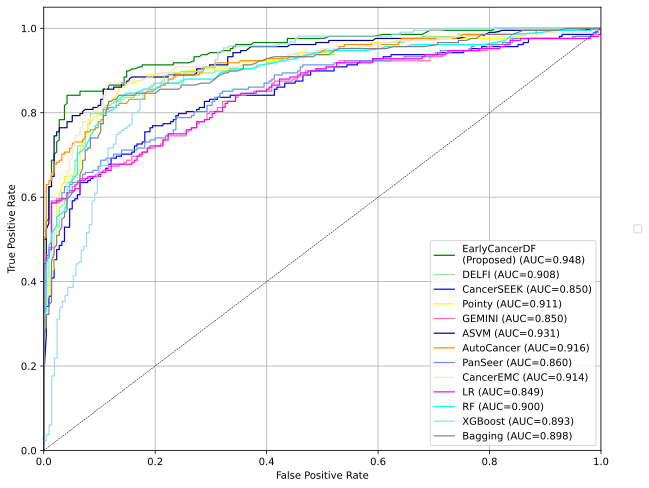

In [ ]:
# Plot all ROC curves
plt.figure(figsize=(10,8))
#colors = cycle(['green','red','blue','yellow','hotpink','aqua', 'darkorange', 'cornflowerblue','darkgreen','magenta','cyan','brown','gray','lightgreen'])
colors = cycle(['green','lightgreen','blue','yellow','hotpink','navy', 'darkorange', 'cornflowerblue','#f2e5d5','magenta','cyan','#9edae5','gray','red'])


models=np.array(classifier)
#models=['CancerEMC (SD1)','CancerSEEK','CancerA1DE','NaiveBayes','SVM','KNN','J48','RandomForest','DNTB','MEOFuzzyC','AdaboostM1','DeepLearning','CancerEMC']
p=[]
for i, color in zip(range(len(classifier)), colors):
     plt.plot(fpr[i], tpr[i], color=color, lw=1.2, label=''+models[i]+' (AUC={0:0.3f})'.format(roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=0.5)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.title('Some extension of Receiver operating characteristic to multi-class\n\n')

l=plt.legend()
plt.grid()
#plt.style.use('classic')
#for i, color in zip(range(len(classifier)), colors):
 #    s=plt.plot([0],color=color, label=''+models[i]+' (Accuracy={0:0.2f}%)'.format(acc[i]*100))
 #    p.append(s[0])
plt.legend(handles=p,loc=6, bbox_to_anchor=(1.05, 0.5))
plt.gca().add_artist(l)

plt.savefig("ROCBinary.pdf", bbox_inches='tight')
plt.savefig("ROCBinary.png", bbox_inches='tight', dpi=1000)

In [ ]:
print(len(prob))
print(len(yt))
print(len(classifier))

13
13
13


In [ ]:
All_Pred = pd.read_csv('/content/All_Pred_DELFI_423.csv')
All_Pred=All_Pred.iloc[:423,]
ty=All_Pred.iloc[:422,0]
All_Pred.iloc[:423,]

,act,EarlyCancerDF,DELFI,CancerSEEK,Pointy,GEMINI,ASVM,AutoCancer,PanSeer,CancerEMC,LR,RF,Bagging,XGB
0,Cancer,0.959,0.998639,1.000000,1.00,1.000000,1.000,0.996,1.000000,0.990,1.000000,0.95,0.905,0.998411
1,Cancer,0.998,0.883773,0.427242,0.78,0.853762,0.999,1.000,0.860263,0.724,0.855239,0.64,0.610,0.713039
2,Cancer,0.215,0.386664,0.000041,0.50,0.002120,0.368,0.067,0.002975,0.594,0.001956,0.68,0.685,0.421409
3,Cancer,0.966,0.845345,0.642662,0.82,0.845266,1.000,1.000,0.846991,0.707,0.844789,0.69,0.600,0.616044
4,Cancer,0.883,0.951493,0.964620,0.87,0.964913,0.865,0.633,0.962264,0.824,0.965393,0.84,0.835,0.994577
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418,Healthy,0.001,0.108505,0.122860,0.42,0.112424,0.000,0.038,0.142807,0.443,0.109588,0.52,0.425,0.319321
419,Healthy,0.061,0.123031,0.257736,0.31,0.521948,0.148,0.113,0.511033,0.306,0.521394,0.40,0.375,0.103806
420,Healthy,0.006,0.285006,0.824587,0.40,0.561607,0.002,0.084,0.516926,0.436,0.561387,0.43,0.310,0.419180
421,Healthy,0.002,0.112627,0.195436,0.38,0.338486,0.000,0.044,0.298357,0.409,0.337206,0.66,0.475,0.449661


In [ ]:
import pandas as pd
prob_lists=[]
# Initialize prob_df with the correct index
prob_df = pd.DataFrame(prob_lists, index=range(len(yt[0])))  # Use the length of the first element in yt for the index

for i in range(len(classifier)):
    y_prob = prob[i]
    y_pre = yt[i]
    name = classifier[i]
    prob_df[name+"_pre"] = y_pre  # Assign to the prob_df DataFrame
    prob_df[name+"_prob"] = y_prob # Assign to the prob_df DataFrame

# If you need df to contain the probabilities, consider this:
# df = prob_df  # Replace the original df with prob_df if necessary

prob_df  # Display the prob_df DataFrame
prob_df.to_csv('prob_df.csv')
prob_df

NameError: name 'yt' is not defined

In [ ]:
# @title
import pandas as pd

dict = {'Methods': classifier, 'ACC': acc, 'roc_auc': roc_auc, 'pr_auc': pr_auc, 'precision': pr,
        'f1': f1, 'recall': recall}

df = pd.DataFrame(dict)

df.to_csv('results_all.csv')
df

,Methods,ACC,roc_auc,pr_auc,precision,f1,recall
0,EarlyCancerDF\n(Proposed),0.898345,0.947965,0.955326,0.950820,0.890026,0.836538
1,DELFI,0.846336,0.908162,0.919692,0.895028,0.832905,0.778846
2,CancerSEEK,0.777778,0.849821,0.875713,0.796875,0.765000,0.735577
3,Pointy,0.862884,0.910543,0.919846,0.864078,0.859903,0.855769
4,GEMINI,0.768322,0.849530,0.882252,0.805556,0.747423,0.697115
5,ASVM,0.867612,0.931339,0.940821,0.883838,0.862069,0.841346
6,AutoCancer,0.851064,0.916178,0.932664,0.879581,0.842105,0.807692
7,PanSeer,0.773050,0.859705,0.889613,0.801075,0.756345,0.716346
8,CancerEMC,0.862884,0.913685,0.924982,0.882653,0.856436,0.831731
9,LR,0.763593,0.849038,0.881735,0.793478,0.744898,0.701923


#box plot for ACCURACY

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import wilcoxon
from scipy.stats import ranksums

In [ ]:
# Colors
BG_WHITE = "#fbf9f4"
GREY_LIGHT = "#b4aea9"
GREY50 = "#7F7F7F"
BLUE_DARK = "#1B2838"
BLUE = "#2a475e"
BLACK = "#282724"
GREY_DARK = "#747473"
RED_DARK = "#850e00"
from itertools import cycle
colors = cycle(['green','lightgreen','blue','yellow','hotpink','navy', 'darkorange', 'cornflowerblue','#f2e5d5','magenta','cyan','#9edae5','gray','red'])
# Colors taken from Dark2 palette in RColorBrewer R library
#COLOR_SCALE = ["#1B9E77", "#D95F02", "#7570B3"]
COLOR_SCALE = ["red", "green"]

# Horizontal positions for the violins.
# They are arbitrary numbers. They could have been [-1, 0, 1] for example.
POSITIONS = [0, 1]

# Horizontal lines
HLINES = [.50,1.1]

In [ ]:
!pip install palmerpenguins

In [ ]:
All_Pred

,act,EarlyCancerDF,DELFI,CancerSEEK,Pointy,GEMINI,ASVM,AutoCancer,PanSeer,CancerEMC,LR,RF,Bagging,XGB
0,Cancer,0.959,0.998639,1.000000,1.00,1.000000,1.000,0.996,1.000000,0.990,1.000000,0.95,0.905,0.998411
1,Cancer,0.998,0.883773,0.427242,0.78,0.853762,0.999,1.000,0.860263,0.724,0.855239,0.64,0.610,0.713039
2,Cancer,0.215,0.386664,0.000041,0.50,0.002120,0.368,0.067,0.002975,0.594,0.001956,0.68,0.685,0.421409
3,Cancer,0.966,0.845345,0.642662,0.82,0.845266,1.000,1.000,0.846991,0.707,0.844789,0.69,0.600,0.616044
4,Cancer,0.883,0.951493,0.964620,0.87,0.964913,0.865,0.633,0.962264,0.824,0.965393,0.84,0.835,0.994577
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418,Healthy,0.001,0.108505,0.122860,0.42,0.112424,0.000,0.038,0.142807,0.443,0.109588,0.52,0.425,0.319321
419,Healthy,0.061,0.123031,0.257736,0.31,0.521948,0.148,0.113,0.511033,0.306,0.521394,0.40,0.375,0.103806
420,Healthy,0.006,0.285006,0.824587,0.40,0.561607,0.002,0.084,0.516926,0.436,0.561387,0.43,0.310,0.419180
421,Healthy,0.002,0.112627,0.195436,0.38,0.338486,0.000,0.044,0.298357,0.409,0.337206,0.66,0.475,0.449661


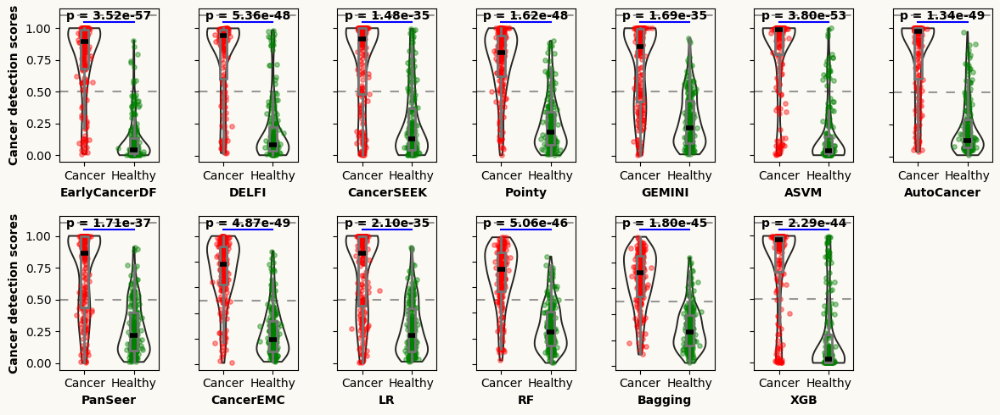

In [ ]:
method=All_Pred.columns[1:]
classes = sorted(All_Pred["act"].unique())
#fig, ax = plt.subplots(figsize= (21, 10)) #Remove this line
n=1;
#fig, axs = plt.subplots(2,7, sharex=True)
fig, axs = plt.subplots(2, 7, figsize=(12, 5)) # create subplots for each method
#fig.text(0.04, 0.5, '', va='center', rotation='vertical',fontweight='bold') # set common y-axis label for the figure
for i, m in enumerate(method):
  y_data = [All_Pred[All_Pred["act"] == cl][m].values for cl in classes]
  jitter = 0.04
  x_data = [np.array([i] * len(d)) for i, d in enumerate(y_data)]
  x_jittered = [x + st.t(df=6, scale=jitter).rvs(len(x)) for x in x_data]
  len(x_data[0])
  cancer = All_Pred[All_Pred['act'] == 'Cancer'][m]
  healthy = All_Pred[All_Pred['act'] == 'Healthy'][m]
  stat, p_value = ranksums(cancer,healthy)

  data_dict = dict
  #ax = plt.subplots(1,n) #Remove this line
  #ax = axs[i] # access the correct axes object using index i
  ax = axs[i // 7, i % 7] # access the correct Axes object using row and column index
  plt.tight_layout()
  fig.patch.set_facecolor(BG_WHITE)
  ax.set_facecolor(BG_WHITE) #set_facecolor on the correct axes object

  for h in HLINES:
      ax.axhline(h, color=GREY50, ls=(0, (5, 5)), alpha=0.8, zorder=0)
  # ... (Rest of your code remains the same)
  violins = ax.violinplot(
      y_data,
      positions=POSITIONS,
      widths=0.65,
      bw_method="silverman",
      showmeans=False,
      showmedians=False,
      showextrema=False
  )

  # Customize violins (remove fill, customize line, etc.)
  for pc in violins["bodies"]:
      pc.set_facecolor("none")
      pc.set_edgecolor(BLACK)
      pc.set_linewidth(1.4)
      pc.set_alpha(1)


  # Add boxplots ---------------------------------------------------
  medianprops = {
      'linewidth': 4,
      'color': 'black',
      'solid_capstyle': "butt"
  }
  boxprops = {
      'linewidth': 2,
      'color': GREY_DARK
  }

  ax.boxplot(
      y_data,
      positions=POSITIONS,
      showfliers = False, # Do not show the outliers beyond the caps.
      showcaps = False,   # Do not show the caps
      medianprops = medianprops,
      whiskerprops = boxprops,
      boxprops = boxprops
  )
  # Add jittered dots ----------------------------------------------
  for x, y, color in zip(x_jittered, y_data, COLOR_SCALE):
      ax.scatter(x, y, s = 15, color=color, alpha=0.4)
  # Add p-value bar annotation
  y_max = 1.2  # Set y_max slightly above the maximum data point
  ax.plot([0, 1], [y_max-0.15, y_max-0.15], lw=1.5, color='blue')  # Draw line for p-value
  ax.text(0.5, y_max-0.15, f'p = {p_value:.2e}', ha='center', va='bottom',weight="bold")  # Add p-value text
  label=['Cancer','Healthy']
  #ax.set_xticks(pos)
  ax.set_xticklabels(label)
  ax.set_xlabel(m,fontweight='bold')
  if i == 0 or i==7:
    ax.set_ylabel("Cancer detection scores", weight="bold")
  else:
    ax.set_yticklabels([])
  #ax.set_ylabel("Cancer detection scores", weight="bold")
plt.tight_layout()
axs.flat[-1].set_visible(False)
plt.savefig("all_scores_27_125.pdf", bbox_inches='tight')

AttributeError: 'tuple' object has no attribute 'set_facecolor'

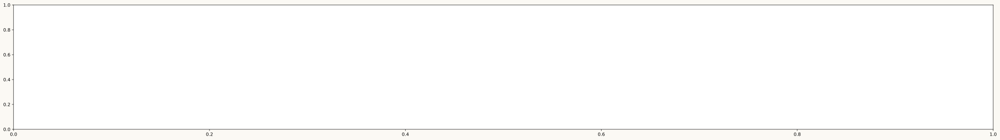

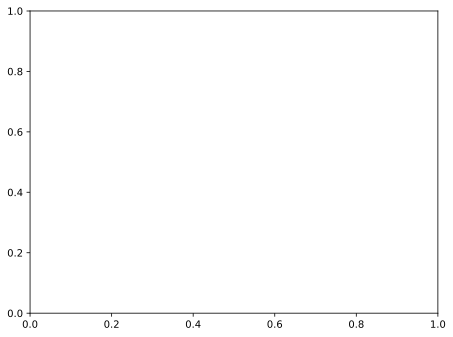

In [ ]:
# @title
method=All_Pred.columns[1:]
classes = sorted(All_Pred["act"].unique())
fig, ax = plt.subplots(figsize= (39, 5))
n=1;
for m in method:
  y_data = [All_Pred[All_Pred["act"] == cl][m].values for cl in classes]
  jitter = 0.04
  x_data = [np.array([i] * len(d)) for i, d in enumerate(y_data)]
  x_jittered = [x + st.t(df=6, scale=jitter).rvs(len(x)) for x in x_data]
  len(x_data[0])
  cancer = All_Pred[All_Pred['act'] == 'Cancer'][m]
  healthy = All_Pred[All_Pred['act'] == 'Healthy'][m]
  stat, p_value = ranksums(cancer,healthy)

  data_dict = dict


  ax = plt.subplots(1,n)
  plt.tight_layout()
  n=n+1
  fig.patch.set_facecolor(BG_WHITE)
  ax.set_facecolor(BG_WHITE)

  for h in HLINES:
      ax.axhline(h, color=GREY50, ls=(0, (5, 5)), alpha=0.8, zorder=0)

  violins = ax.violinplot(
      y_data,
      positions=POSITIONS,
      widths=0.65,
      bw_method="silverman",
      showmeans=False,
      showmedians=False,
      showextrema=False
  )

  # Customize violins (remove fill, customize line, etc.)
  for pc in violins["bodies"]:
      pc.set_facecolor("none")
      pc.set_edgecolor(BLACK)
      pc.set_linewidth(1.4)
      pc.set_alpha(1)


  # Add boxplots ---------------------------------------------------
  medianprops = {
      'linewidth': 4,
      'color': GREY_DARK,
      'solid_capstyle': "butt"
  }
  boxprops = {
      'linewidth': 2,
      'color': GREY_DARK
  }

  ax.boxplot(
      y_data,
      positions=POSITIONS,
      showfliers = False, # Do not show the outliers beyond the caps.
      showcaps = False,   # Do not show the caps
      medianprops = medianprops,
      whiskerprops = boxprops,
      boxprops = boxprops
  )
  # Add jittered dots ----------------------------------------------
  for x, y, color in zip(x_jittered, y_data, COLOR_SCALE):
      ax.scatter(x, y, s = 15, color=color, alpha=0.4)
  # Add p-value bar annotation
  y_max = 1.15  # Set y_max slightly above the maximum data point
  plt.plot([0, 1], [y_max-0.1, y_max-0.1], lw=1.5, color='blue')  # Draw line for p-value
  plt.text(0.5, y_max-0.1, f'p = {p_value:.2e}', ha='center', va='bottom')  # Add p-value text
  plt.tight_layout()
  label=['Cancer','Healthy']
  #ax.set_xticks(pos)
  ax.set_xticklabels(label)
  ax.set_xlabel(m,fontweight='bold')



In [ ]:
# @title
# Get the species, sorted alphabetically
classes = sorted(All_Pred["act"].unique())
# y_data is a list of length 3 containing the bill_length_mm values for each specie
y_data = [All_Pred[All_Pred["act"] == specie]["EarlyCancerDF"].values for specie in classes]

# Create jittered version of "x" (which is only 0, 1, and 2)
# More about this in the bonus track!
jitter = 0.04
x_data = [np.array([i] * len(d)) for i, d in enumerate(y_data)]
x_jittered = [x + st.t(df=6, scale=jitter).rvs(len(x)) for x in x_data]
len(x_data[0])

cancer = All_Pred[All_Pred['act'] == 'Cancer']['EarlyCancerDF']
healthy = All_Pred[All_Pred['act'] == 'Healthy']['EarlyCancerDF']
stat, p_value = ranksums(cancer,healthy)

Text(0.5, 33.166666666666636, 'EarlyCancerDF')

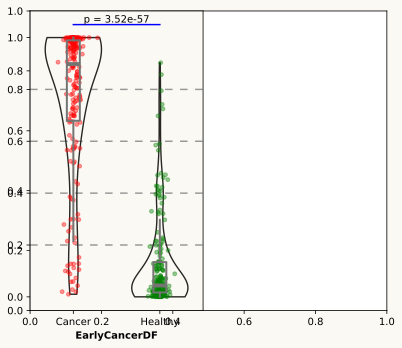

In [ ]:
# @title
data_dict = dict

fig, ax = plt.subplots(figsize= (6, 5))
ax = plt.subplot(121)
plt.tight_layout()

fig.patch.set_facecolor(BG_WHITE)
ax.set_facecolor(BG_WHITE)

for h in HLINES:
    ax.axhline(h, color=GREY50, ls=(0, (5, 5)), alpha=0.8, zorder=0)

violins = ax.violinplot(
    y_data,
    positions=POSITIONS,
    widths=0.65,
    bw_method="silverman",
    showmeans=False,
    showmedians=False,
    showextrema=False
)

# Customize violins (remove fill, customize line, etc.)
for pc in violins["bodies"]:
    pc.set_facecolor("none")
    pc.set_edgecolor(BLACK)
    pc.set_linewidth(1.4)
    pc.set_alpha(1)


# Add boxplots ---------------------------------------------------
medianprops = {
    'linewidth': 4,
    'color': GREY_DARK,
    'solid_capstyle': "butt"
}
boxprops = {
    'linewidth': 2,
    'color': GREY_DARK
}

ax.boxplot(
    y_data,
    positions=POSITIONS,
    showfliers = False, # Do not show the outliers beyond the caps.
    showcaps = False,   # Do not show the caps
    medianprops = medianprops,
    whiskerprops = boxprops,
    boxprops = boxprops
)
# Add jittered dots ----------------------------------------------
for x, y, color in zip(x_jittered, y_data, COLOR_SCALE):
    ax.scatter(x, y, s = 15, color=color, alpha=0.4)
# Add p-value bar annotation
y_max = 1.15  # Set y_max slightly above the maximum data point
ax.plot([0, 1], [y_max-0.1, y_max-0.1], lw=1.5, color='blue')  # Draw line for p-value
ax.text(0.5, y_max-0.1, f'p = {p_value:.2e}', ha='center', va='bottom')  # Add p-value text
ax.tight_layout()
label=['Cancer','Healthy']
#ax.set_xticks(pos)
ax.set_xticklabels(label)
ax.set_xlabel('EarlyCancerDF',fontweight='bold')

#Radar chart DELFI FS

In [ ]:
DELFIC_Res = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/results_all.csv')
DELFIC_Res=DELFIC_Res.iloc[:,1:]
DELFIC_Res

,Methods,ACC,roc_auc,pr_auc,precision,f1,recall
0,EarlyCancerDF\n(Proposed),0.898345,0.947965,0.955326,0.950820,0.890026,0.836538
1,DELFI,0.846336,0.908162,0.919692,0.895028,0.832905,0.778846
2,CancerSEEK,0.777778,0.849821,0.875713,0.796875,0.765000,0.735577
3,Pointy,0.862884,0.910543,0.919846,0.864078,0.859903,0.855769
4,GEMINI,0.768322,0.849530,0.882252,0.805556,0.747423,0.697115
5,ASVM,0.867612,0.931339,0.940821,0.883838,0.862069,0.841346
6,AutoCancer,0.851064,0.916178,0.932664,0.879581,0.842105,0.807692
7,PanSeer,0.773050,0.859705,0.889613,0.801075,0.756345,0.716346
8,CancerEMC,0.862884,0.913685,0.924982,0.882653,0.856436,0.831731
9,LR,0.763593,0.849038,0.881735,0.793478,0.744898,0.701923


In [ ]:
metrics=DELFIC_Res.columns[1:].values
method=DELFIC_Res.iloc[:,0].values
accuracy=DELFIC_Res.iloc[:,1].values
roc_auc=DELFIC_Res.iloc[:,2].values
pr_auc=DELFIC_Res.iloc[:,3].values
precision=DELFIC_Res.iloc[:,4].values
f1=DELFIC_Res.iloc[:,5].values
recall=DELFIC_Res.iloc[:,6].values
metrics

array(['ACC', 'roc_auc', 'pr_auc', 'precision', 'f1', 'recall'],
      dtype=object)

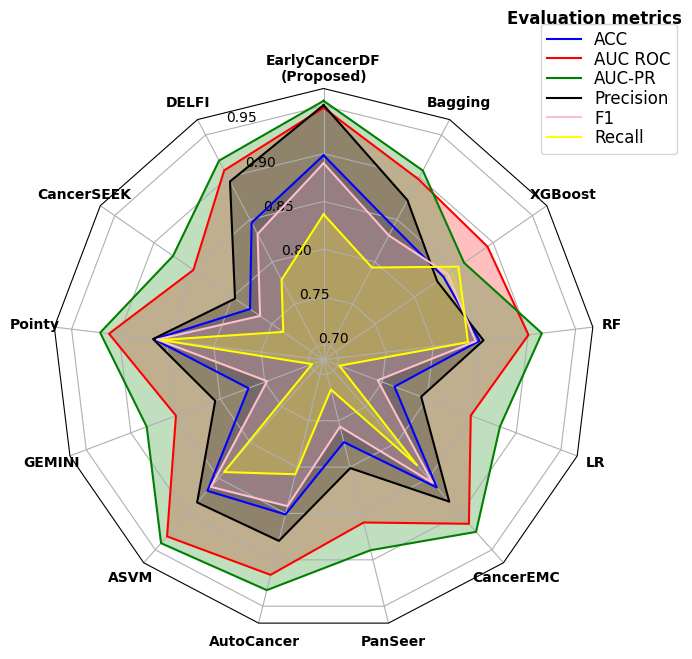

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections import register_projection
from matplotlib.projections.polar import PolarAxes
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D


def radar_factory(num_vars, frame='polygon'):
    """
    Create a radar chart with `num_vars` Axes.

    This function creates a RadarAxes projection and registers it.

    Parameters
    ----------
    num_vars : int
        Number of variables for radar chart.
    frame : {'circle', 'polygon'}
        Shape of frame surrounding Axes.

    """
    # calculate evenly-spaced axis angles
    theta = np.linspace(0, 2*np.pi, num_vars, endpoint=False)

    class RadarTransform(PolarAxes.PolarTransform):

        def transform_path_non_affine(self, path):
            # Paths with non-unit interpolation steps correspond to gridlines,
            # in which case we force interpolation (to defeat PolarTransform's
            # autoconversion to circular arcs).
            if path._interpolation_steps > 1:
                path = path.interpolated(num_vars)
            return Path(self.transform(path.vertices), path.codes)

    class RadarAxes(PolarAxes):

        name = 'radar'
        PolarTransform = RadarTransform

        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
            # rotate plot such that the first axis is at the top
            self.set_theta_zero_location('N')

        def fill(self, *args, closed=True, **kwargs):
            """Override fill so that line is closed by default"""
            return super().fill(closed=closed, *args, **kwargs)

        def plot(self, *args, **kwargs):
            """Override plot so that line is closed by default"""
            lines = super().plot(*args, **kwargs)
            for line in lines:
                self._close_line(line)

        def _close_line(self, line):
            x, y = line.get_data()
            # FIXME: markers at x[0], y[0] get doubled-up
            if x[0] != x[-1]:
                x = np.append(x, x[0])
                y = np.append(y, y[0])
                line.set_data(x, y)

        def set_varlabels(self, labels):
            self.set_thetagrids(np.degrees(theta), labels,weight='bold')

        def _gen_axes_patch(self):
            # The Axes patch must be centered at (0.5, 0.5) and of radius 0.5
            # in axes coordinates.
            if frame == 'circle':
                return Circle((0.5, 0.5), 0.5)
            elif frame == 'polygon':
                return RegularPolygon((0.5, 0.5), num_vars,
                                      radius=.5, edgecolor="k")
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

        def _gen_axes_spines(self):
            if frame == 'circle':
                return super()._gen_axes_spines()
            elif frame == 'polygon':
                # spine_type must be 'left'/'right'/'top'/'bottom'/'circle'.
                spine = Spine(axes=self,
                              spine_type='circle',
                              path=Path.unit_regular_polygon(num_vars))
                # unit_regular_polygon gives a polygon of radius 1 centered at
                # (0, 0) but we want a polygon of radius 0.5 centered at (0.5,
                # 0.5) in axes coordinates.
                spine.set_transform(Affine2D().scale(.5).translate(.5, .5)
                                    + self.transAxes)
                return {'polar': spine}
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

    register_projection(RadarAxes)
    return theta


def example_data1():
  #'ACC', 'roc_auc', 'pr_auc', 'precision', 'f1', 'recall'
    data = [method,('Classification metrics',[accuracy,roc_auc,pr_auc,precision,f1,recall])]
    return data


if __name__ == '__main__':
    N = 13
    theta = radar_factory(N, frame='polygon')

    data = example_data1()
    spoke_labels = data.pop(0)
    case_data = data[0][1] # Extract the list of data lists
    fig, axs = plt.subplots(figsize=(7, 7), nrows=1, ncols=1,
                            subplot_kw=dict(projection='radar'))
    fig.subplots_adjust(wspace=0.25, hspace=0.20, top=0.85, bottom=0.05)

    colors = ['b', 'r', 'g', 'black','pink','yellow']
    # Plot the four cases from the example data on separate Axes
    # Modified loop to iterate over a single axes object, and expects data directly

    axs.set_rgrids([0.2, 0.3, 0.4, 0.5,0.6,.65, 0.7,.75, .8,0.85,.9, 0.95,1])
    # Removed title setting as its not being used
    for d, color in zip(case_data, colors): # Iterate directly through the extracted data lists
        axs.plot(theta, d, color=color)
        axs.fill(theta, d, facecolor=color, alpha=0.25, label='_nolegend_')
    axs.set_varlabels(spoke_labels)

    # add legend relative to top-left plot
    labels = ('ACC', 'AUC ROC', 'AUC-PR', 'Precision', 'F1', 'Recall')
    legend = axs.legend(labels, loc=(0.9, .88),
                              labelspacing=0.1, fontsize='large')

    fig.text(0.9, .93, 'Evaluation metrics',
            horizontalalignment='center', color='black', weight='bold',
            size='large')
    plt.savefig("DELFI_Rader_FS_77.pdf", bbox_inches='tight')

#Multicancer (DELFI 1st)

In [ ]:
data = pd.read_csv('DNAFragmentationDataSetFullCancerSMOTE.csv')
x=data.iloc[:,1:48]
y=data.iloc[:,0]
print(x)
print(y)

NameError: name 'pd' is not defined

In [ ]:
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn import metrics
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix
#import scikitplot as skplt
from sklearn.metrics import roc_curve, auc
import numpy as np

plt.figure(figsize=(12,8))
rf = RandomForestClassifier(n_estimators=100) #1.0
bag = BaggingClassifier(estimator=rf,
                        n_estimators=100, random_state=0)
m=bag
pre=cross_val_predict(m, x, y, cv=10)
ac = metrics.accuracy_score(y, pre)
print("RF CV accuracy = " + str(ac))
classReport=classification_report(y, pre)
print(classReport)
cm=confusion_matrix(y, pre)
skplt.metrics.plot_confusion_matrix(y, pre)
plt.savefig("rfcmmc.png", bbox_inches='tight', dpi=1000)
#plt.show()
proba = cross_val_predict(m, x, y, cv=10, method='predict_proba')
skplt.metrics.plot_roc_curve(y,proba)
plt.savefig("Allroc.png", bbox_inches='tight', dpi=1000)
#plt.show()
#skplt.estimators.plot_learning_curve(m,x,y,cv=10,figsize=(8,6))
#plt.show()
plt.savefig("rfmc.png", bbox_inches='tight', dpi=1000)
a, b, _ = roc_curve(y,proba[:,0], pos_label='Cancer')
c= auc(a, b)

RF CV accuracy = 0.8492063492063492
                   precision    recall  f1-score   support

 Bile Duct Cancer       0.81      0.87      0.84        54
    Breast Cancer       0.81      0.65      0.72        54
Colorectal Cancer       0.81      0.89      0.85        54
   Gastric cancer       0.86      0.89      0.87        54
      Lung Cancer       0.93      0.94      0.94        54
   Ovarian Cancer       0.81      0.89      0.85        54
Pancreatic Cancer       0.92      0.81      0.86        54

         accuracy                           0.85       378
        macro avg       0.85      0.85      0.85       378
     weighted avg       0.85      0.85      0.85       378



NameError: name 'skplt' is not defined

<Figure size 1200x800 with 0 Axes>

In [ ]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, log_loss

# Load your dataset
# df = pd.read_csv('your_dataset.csv')  # Uncomment and replace with your dataset
# X = df.drop('target_column', axis=1)  # Replace 'target_column' with your target
# y = df['target_column']

# For demonstration, let's create a synthetic dataset
from sklearn.datasets import make_classification

X, y = make_classification(n_samples=1000, n_features=10, n_classes=2, random_state=42)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create an XGBoost DMatrix for the training and testing datasets
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Set the parameters for the model
params = {
    'objective': 'binary:logistic',  # Binary classification
    'n_estimators': 150,              # Number of trees
    'max_depth': 3,                   # Interaction depth
    'learning_rate': 0.1,             # Shrinkage
    'min_child_weight': 10,           # Minimum observations in a child node
    'eval_metric': 'logloss'          # Evaluation metric
}

# Train the model
bst = xgb.train(params, dtrain, num_boost_round=150)

# Make predictions
y_pred_prob = bst.predict(dtest)
y_pred = [1 if prob > 0.5 else 0 for prob in y_pred_prob]  # Convert probabilities to binary outcome

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
log_loss_value = log_loss(y_test, y_pred_prob)

print(f'Accuracy: {accuracy}')
print(f'Log Loss: {log_loss_value}')

In [ ]:
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn import metrics
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix
import scikitplot as skplt
from sklearn.metrics import roc_curve, auc
import numpy as np

plt.figure(figsize=(12,8))
rf = RandomForestClassifier(n_estimators=100) #1.0
bag = BaggingClassifier(base_estimator=rf,
                        n_estimators=100, random_state=0)
m=bag
pre=cross_val_predict(m, x, y, cv=10)
ac = metrics.accuracy_score(y, pre)
print("RF CV accuracy = " + str(ac))
classReport=classification_report(y, pre)
print(classReport)
cm=confusion_matrix(y, pre)
skplt.metrics.plot_confusion_matrix(y, pre)
plt.savefig("rfcmmc.png", bbox_inches='tight', dpi=1000)
#plt.show()
proba = cross_val_predict(m, x, y, cv=10, method='predict_proba')
skplt.metrics.plot_roc_curve(y,proba)
plt.savefig("Allroc.png", bbox_inches='tight', dpi=1000)
#plt.show()
#skplt.estimators.plot_learning_curve(m,x,y,cv=10,figsize=(8,6))
#plt.show()
plt.savefig("rfmc.png", bbox_inches='tight', dpi=1000)
a, b, _ = roc_curve(y,proba[:,0], pos_label='Cancer')
c= auc(a, b)

#Sensitivity Analysis

**Sensitivity analysis:**

In [ ]:
pip install pandas numpy scikit-learn matplotlib SALib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.9/778.9 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.3/144.3 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 4.0 MB/s eta 0:00:00


In [ ]:
res = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/DELFI_423_results_EarlyCancerDF.csv')
ty=res.iloc[:,1]
pre_EarlyCancerDF=res.iloc[:,3]
pre_asvm=res.iloc[:,8]
pre_Auto=res.iloc[:,10]
prob_EarlyCancerDF=res.iloc[:,7]
res

,preclass,actual,tl,label,tb,prediction,h,EarlyCancerDF,pre_asvm,ASVM,pre_Auto,AutoCancer
0,1,Cancer,Cancer,Cancer,1,0.959,0.041,0.959,Cancer,1.000,Cancer,0.996
1,1,Cancer,Cancer,Cancer,1,0.998,0.002,0.998,Cancer,0.999,Cancer,1.000
2,0,Cancer,Cancer,Healthy,1,0.785,0.785,0.215,Healthy,0.368,Healthy,0.067
3,1,Cancer,Cancer,Cancer,1,0.966,0.034,0.966,Cancer,1.000,Cancer,1.000
4,1,Cancer,Cancer,Cancer,1,0.883,0.117,0.883,Cancer,0.865,Cancer,0.633
...,...,...,...,...,...,...,...,...,...,...,...,...
418,0,Healthy,Healthy,Healthy,0,0.999,0.999,0.001,Healthy,0.000,Healthy,0.038
419,0,Healthy,Healthy,Healthy,0,0.939,0.939,0.061,Healthy,0.148,Healthy,0.113
420,0,Healthy,Healthy,Healthy,0,0.994,0.994,0.006,Healthy,0.002,Healthy,0.084
421,0,Healthy,Healthy,Healthy,0,0.998,0.998,0.002,Healthy,0.000,Healthy,0.044


In [ ]:
sens = pd.read_csv('/content/For_Sensitivity_stage.csv')
#pre_EarlyCancerDF=res.iloc[:,3]
#prob_EarlyCancerDF=res.iloc[:,7]
biPredictdf = sens[['actual', 'predicted', 'proba','stage']]
MultiPredictdf = sens[['mactual', 'mpredicted', 'mprediction']]
MultiPredictdf=MultiPredictdf.iloc[:378,:]
MultiPredictdf

,mactual,mpredicted,mprediction
0,Colorectal,Colorectal,0.669
1,Gastric,Gastric,0.578
2,Gastric,Gastric,0.837
3,Breast,Breast,0.490
4,Pancreatic,Breast,0.393
...,...,...,...
373,Pancreatic,Pancreatic,0.692
374,Pancreatic,Pancreatic,0.852
375,Pancreatic,Pancreatic,0.460
376,Lung,Lung,0.675


Binary Cancer Sensitivity: 0.958139534883721


<ipython-input-76-a2bc2250e8e5>:53: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  type_sensitivities = type_groups.apply(calculate_sensitivity_with_ci).dropna()
<ipython-input-76-a2bc2250e8e5>:54: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  stage_sensitivities = stage_groups.apply(calculate_sensitivity_with_ci).dropna()
<ipython-input-76-a2bc2250e8e5>:70: UserWarning: set_ticklabels() should only be used 

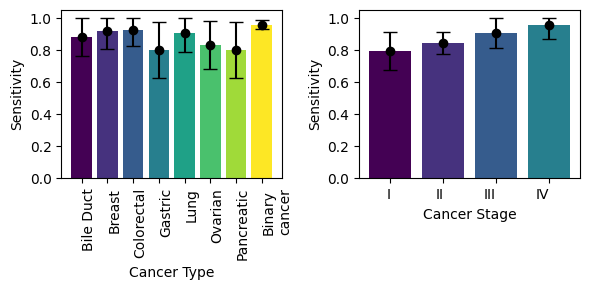

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats

# Assuming your prediction results are in a DataFrame called 'biPredictdf'
# with columns: 'actual', 'predicted', 'probability'

# 1. Group by Cancer Type and Stage:
type_groups = MultiPredictdf.groupby('mactual')
stage_groups = biPredictdf.groupby('stage')
bi_groups = biPredictdf.groupby('actual')

from sklearn.metrics import confusion_matrix
tn, fp, fn, tp = confusion_matrix(biPredictdf['actual'].values, biPredictdf['predicted'].values).ravel()
sensitivity = tp / (tp + fn)
print(f"Binary Cancer Sensitivity: {sensitivity}")
# Calculate the 95% CI
bin_sensitivity=[]
if tp + fn > 0:
        alpha = 0.05
        z = stats.norm.ppf(1 - alpha / 2)
        ci_margin = z * np.sqrt((sensitivity * (1 - sensitivity)) / (tp + fn))
        ci_lower = sensitivity - ci_margin
        ci_upper = sensitivity + ci_margin
        bin_sensitivity.append(sensitivity)
        bin_sensitivity.append(max(0, ci_lower))
        bin_sensitivity.append(min(1, ci_upper))

# 2. Calculate Sensitivity for Each Group with 95% CI:
def calculate_sensitivity_with_ci(group):
    """Calculates sensitivity and 95% confidence interval for a given group."""
    TP = biPredictdf[(biPredictdf['actual'] == biPredictdf['predicted']) &
                     (biPredictdf['actual'] == 'Cancer') &
                     (biPredictdf.index.isin(group.index))].shape[0]  # True Positives
    FN = biPredictdf[(biPredictdf['actual'] != biPredictdf['predicted']) &
                     (biPredictdf['actual'] == 'Cancer') &
                     (biPredictdf.index.isin(group.index))].shape[0]  # False Negatives

    sensitivity = TP / (TP + FN) if TP + FN != 0 else np.nan

    # Calculate the 95% CI
    if TP + FN > 0:
        alpha = 0.05
        z = stats.norm.ppf(1 - alpha / 2)
        ci_margin = z * np.sqrt((sensitivity * (1 - sensitivity)) / (TP + FN))
        ci_lower = sensitivity - ci_margin
        ci_upper = sensitivity + ci_margin
        return pd.Series({'sensitivity': sensitivity, 'ci_lower': max(0, ci_lower), 'ci_upper': min(1, ci_upper)})
    else:
        return pd.Series({'sensitivity': np.nan, 'ci_lower': np.nan, 'ci_upper': np.nan})

type_sensitivities = type_groups.apply(calculate_sensitivity_with_ci).dropna()
stage_sensitivities = stage_groups.apply(calculate_sensitivity_with_ci).dropna()
#bi_sensitivities = bi_groups.apply(calculate_sensitivity_with_ci).dropna()

type_sensitivities.loc['Binary\ncancer']= [bin_sensitivity[0], bin_sensitivity[1], bin_sensitivity[2]]

# 3. Plot the Sensitivities with 95% CI:
fig, axes = plt.subplots(1, 2, figsize=(6, 3))

# Define colors for the bars
colors = plt.cm.viridis(np.linspace(0, 1, len(type_sensitivities)))

# Cancer Type Sensitivity
axes[0].bar(type_sensitivities.index, type_sensitivities['sensitivity'], color=colors)
#axes[0].set_title('Sensitivity by cancer ype and overall cancer')
axes[0].set_xlabel('Cancer Type')
axes[0].set_ylabel('Sensitivity')
axes[0].set_xticklabels(type_sensitivities.index, rotation=90, ha='left')

# Add error bars for 95% CI
axes[0].errorbar(type_sensitivities.index, type_sensitivities['sensitivity'],
                 yerr=[type_sensitivities['sensitivity'] - type_sensitivities['ci_lower'],
                       type_sensitivities['ci_upper'] - type_sensitivities['sensitivity']],
                 fmt='o', color='black', capsize=5)

# Cancer Stage Sensitivity
axes[1].bar(stage_sensitivities.index, stage_sensitivities['sensitivity'], color=colors)
#axes[1].set_title('Sensitivity by cancer stage')
axes[1].set_xlabel('Cancer Stage')
axes[1].set_ylabel('Sensitivity')
axes[1].set_xticklabels(stage_sensitivities.index, rotation=0, ha='right')

# Add error bars for 95% CI
axes[1].errorbar(stage_sensitivities.index, stage_sensitivities['sensitivity'],
                 yerr=[stage_sensitivities['sensitivity'] - stage_sensitivities['ci_lower'],
                       stage_sensitivities['ci_upper'] - stage_sensitivities['sensitivity']],
                 fmt='o', color='black', capsize=5)

plt.tight_layout()
plt.savefig("Sensitivity_Type_Stages_63.pdf", bbox_inches='tight')


In [ ]:
bin_sensitivity

[0.958139534883721, 0.9313697262842477, 0.9849093434831941]

<ipython-input-36-cdfc9c7d470e>:38: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  type_sensitivities = type_groups.apply(calculate_sensitivity_with_ci).dropna()
<ipython-input-36-cdfc9c7d470e>:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  stage_sensitivities = stage_groups.apply(calculate_sensitivity_with_ci).dropna()
<ipython-input-36-cdfc9c7d470e>:40: DeprecationWarning: DataFrameGroupBy.apply operate

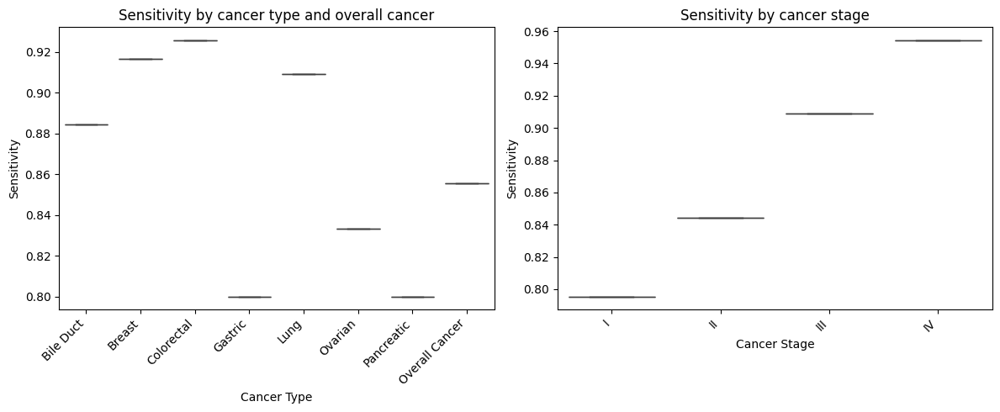

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import seaborn as sns

# Assuming your prediction results are in a DataFrame called 'biPredictdf'
# with columns: 'actual', 'predicted', 'probability'

# 1. Group by Cancer Type and Stage:
type_groups = MultiPredictdf.groupby('mactual')
stage_groups = biPredictdf.groupby('stage')
bi_groups = biPredictdf.groupby('actual')

# 2. Calculate Sensitivity for Each Group with 95% CI:
def calculate_sensitivity_with_ci(group):
    """Calculates sensitivity and 95% confidence interval for a given group."""
    TP = biPredictdf[(biPredictdf['actual'] == biPredictdf['predicted']) &
                     (biPredictdf['actual'] == 'Cancer') &
                     (biPredictdf.index.isin(group.index))].shape[0]  # True Positives
    FN = biPredictdf[(biPredictdf['actual'] != biPredictdf['predicted']) &
                     (biPredictdf['actual'] == 'Cancer') &
                     (biPredictdf.index.isin(group.index))].shape[0]  # False Negatives

    sensitivity = TP / (TP + FN) if TP + FN != 0 else np.nan

    # Calculate the 95% CI
    if TP + FN > 0:
        alpha = 0.05
        z = stats.norm.ppf(1 - alpha / 2)
        ci_margin = z * np.sqrt((sensitivity * (1 - sensitivity)) / (TP + FN))
        ci_lower = sensitivity - ci_margin
        ci_upper = sensitivity + ci_margin
        return pd.Series({'sensitivity': sensitivity, 'ci_lower': max(0, ci_lower), 'ci_upper': min(1, ci_upper)})
    else:
        return pd.Series({'sensitivity': np.nan, 'ci_lower': np.nan, 'ci_upper': np.nan})

type_sensitivities = type_groups.apply(calculate_sensitivity_with_ci).dropna()
stage_sensitivities = stage_groups.apply(calculate_sensitivity_with_ci).dropna()
bi_sensitivities = bi_groups.apply(calculate_sensitivity_with_ci).dropna()

type_sensitivities.loc['Overall Cancer'] = bi_sensitivities.loc['Cancer']

# 3. Plot the Sensitivities with 95% CI:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Cancer Type Sensitivity
sns.boxplot(x='mactual', y='sensitivity', data=type_sensitivities.reset_index(), ax=axes[0])  # Use boxplot
axes[0].set_title('Sensitivity by cancer type and overall cancer')
axes[0].set_xlabel('Cancer Type')
axes[0].set_ylabel('Sensitivity')
axes[0].set_xticklabels(type_sensitivities.index, rotation=45, ha='right')

# Cancer Stage Sensitivity
sns.boxplot(x='stage', y='sensitivity', data=stage_sensitivities.reset_index(), ax=axes[1])  # Use boxplot
axes[1].set_title('Sensitivity by cancer stage')
axes[1].set_xlabel('Cancer Stage')
axes[1].set_ylabel('Sensitivity')
axes[1].set_xticklabels(stage_sensitivities.index, rotation=45, ha='right')

plt.tight_layout()
plt.savefig("SensitivityType-Stages_BoxPlot.pdf", bbox_inches='tight')

In [ ]:
type_sensitivities

,sensitivity,ci_lower,ci_upper
mactual,,,
Bile Duct,0.884615,0.761811,1.000000
Breast,0.916667,0.806092,1.000000
Colorectal,0.925926,0.827142,1.000000
Gastric,0.800000,0.624695,0.975305
Lung,0.909091,0.788963,1.000000
Ovarian,0.833333,0.684234,0.982433
Pancreatic,0.800000,0.624695,0.975305


In [ ]:
res = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/DELFI_423_results_EarlyCancerDF.csv')
ty=res.iloc[:,1]
pre_EarlyCancerDF=res.iloc[:,3]
pre_asvm=res.iloc[:,8]
pre_Auto=res.iloc[:,10]
prob_EarlyCancerDF=res.iloc[:,7]
res

,preclass,actual,tl,label,tb,prediction,h,EarlyCancerDF,pre_asvm,ASVM,pre_Auto,AutoCancer
0,1,Cancer,Cancer,Cancer,1,0.959,0.041,0.959,Cancer,1.000,Cancer,0.996
1,1,Cancer,Cancer,Cancer,1,0.998,0.002,0.998,Cancer,0.999,Cancer,1.000
2,0,Cancer,Cancer,Healthy,1,0.785,0.785,0.215,Healthy,0.368,Healthy,0.067
3,1,Cancer,Cancer,Cancer,1,0.966,0.034,0.966,Cancer,1.000,Cancer,1.000
4,1,Cancer,Cancer,Cancer,1,0.883,0.117,0.883,Cancer,0.865,Cancer,0.633
...,...,...,...,...,...,...,...,...,...,...,...,...
418,0,Healthy,Healthy,Healthy,0,0.999,0.999,0.001,Healthy,0.000,Healthy,0.038
419,0,Healthy,Healthy,Healthy,0,0.939,0.939,0.061,Healthy,0.148,Healthy,0.113
420,0,Healthy,Healthy,Healthy,0,0.994,0.994,0.006,Healthy,0.002,Healthy,0.084
421,0,Healthy,Healthy,Healthy,0,0.998,0.998,0.002,Healthy,0.000,Healthy,0.044


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix

# Compute the confusion matrix
tn, fp, fn, tp = confusion_matrix(ty, pre_EarlyCancerDF).ravel()
# Calculate sensitivity
sensitivity = tp / (tp + fn)

print(f"EarlyCancerDF:Sensitivity = {sensitivity:.4f}")
# Compute the confusion matrix
tn, fp, fn, tp = confusion_matrix(ty, pre_asvm).ravel()
# Calculate sensitivity
sensitivity = tp / (tp + fn)
print(f"ASVM: Sensitivity = {sensitivity:.4f}")

tn, fp, fn, tp = confusion_matrix(ty, pre_Auto).ravel()
# Calculate sensitivity
sensitivity = tp / (tp + fn)
print(f"AutoCancer: Sensitivity = {sensitivity:.4f}")

EarlyCancerDF:Sensitivity = 0.9581
ASVM: Sensitivity = 0.8930
AutoCancer: Sensitivity = 0.8930


In [ ]:
classifier.append('EarlyCancerDF\n(Proposed)')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(1-prob1)
yt.append(y)

In [ ]:
prob

[array([0.99863862, 0.88377278, 0.38254251, 0.84534484, 0.951493  ,
        0.98322921, 0.42096409, 0.64523023, 0.93882441, 0.44732777,
        0.83785899, 0.97892719, 0.56151367, 0.82747423, 0.32458464,
        0.54775005, 0.9905108 , 0.91045905, 0.9420901 , 0.68089533,
        0.92383805, 0.99113093, 0.99797219, 0.99877178, 0.99262745,
        0.98749608, 0.99877178, 0.9667791 , 0.9568883 , 0.99522832,
        0.82668718, 0.98501766, 0.99646453, 0.97184084, 0.02344994,
        0.96021012, 0.87177679, 0.97850048, 0.03745791, 0.99543189,
        0.49707926, 0.95750317, 0.98724612, 0.988872  , 0.11469959,
        0.25666441, 0.96068333, 0.06173964, 0.63237876, 0.96555581,
        0.06101526, 0.99373427, 0.99243237, 0.96415159, 0.9265902 ,
        0.96370127, 0.92168051, 0.90922182, 0.45852527, 0.96713946,
        0.68713163, 0.23700855, 0.99185453, 0.85610018, 0.96928671,
        0.95363091, 0.43704497, 0.91303583, 0.11916728, 0.05338508,
        0.87977379, 0.97779417, 0.93605575, 0.90

IndexError: list index out of range

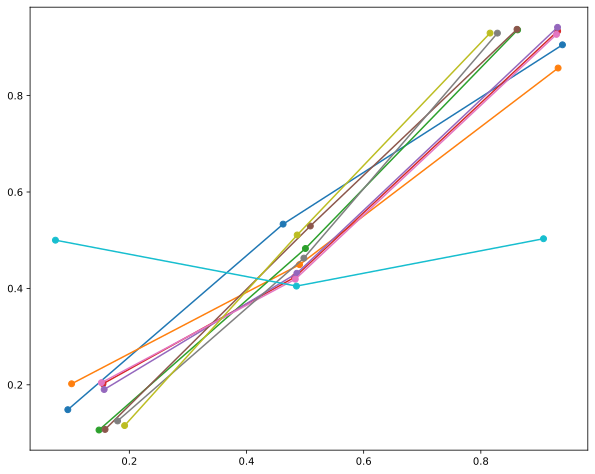

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve
from sklearn.preprocessing import LabelEncoder

plt.figure(figsize=(10, 8))
for i in range(len(classifier)):
    y_prob = prob[i]
    y_test = yt[i]
    name = classifier[i]
    le = LabelEncoder()
    y_test_encoded = le.fit_transform(y_test)

    pos_label = le.transform(['Cancer'])[0]  # Get the numerical label for 'Cancer'

    # Compute the calibration curve with the encoded labels and pos_label
    fraction_of_positives, mean_predicted_value = calibration_curve(
        y_test_encoded, y_prob, n_bins=3, pos_label=pos_label
    )

    # Plot the calibration curve
    plt.plot(mean_predicted_value, fraction_of_positives, marker='o', label=name)

# Plotting the diagonal line (perfectly calibrated)
plt.plot([0, 1], [0, 1], linestyle='--', color='black', label='Perfectly calibrated')

# Customize the plot
plt.title("Calibration Curves")
plt.xlabel("Mean predicted probability")
plt.ylabel("Fraction of positives")
plt.legend(loc='best')
plt.grid()
plt.show()

In [ ]:
def optimize_mlp(trial,X_train, y_train):
    hidden_layer_sizes = trial.suggest_int('hidden_layer_sizes', 1, 5) # Use 'trial' here
    activation = trial.suggest_categorical('activation', ['logistic', 'tanh', 'relu']) # Use 'trial' here
    solver = trial.suggest_categorical('solver', ['sgd', 'adam']) # Use 'trial' here


    model = MLPClassifier(hidden_layer_sizes=(hidden_layer_sizes,), activation=activation, solver=solver, max_iter=1000)
    scores = cross_val_score(model, X_train, y_train, cv=10, scoring='roc_auc')
    return scores.mean()

In [ ]:
# Optimize MLP with Bayesian optimization
study = optuna.create_study(direction='maximize')
study.optimize(lambda trial: optimize_mlp(trial, x, y), n_trials=10)

# Get the best parameters after optimization
best_mlp_params = study.best_params
print(f'Best MLP Parameters: {best_mlp_params}')

# Train MLP with the best found parameters
best_mlp = MLPClassifier(hidden_layer_sizes=(best_mlp_params['hidden_layer_sizes'],),
                         activation=best_mlp_params['activation'],
                         solver=best_mlp_params['solver'],
                         max_iter=1000)

# Evaluate MLP using 10-fold CV
#mlp_accuracy = cross_val_score(best_mlp, X, Y, cv=10, scoring='accuracy').mean()
#mlp_f1 = cross_val_score(best_mlp, X, Y, cv=kf, scoring='f1').mean()
#mlp_roc_auc = cross_val_score(best_mlp, X, Y, cv=kf, scoring='roc_auc').mean()


[I 2025-02-14 18:44:07,355] A new study created in memory with name: no-name-4bae9f5f-124b-4671-90cc-0f3fc77db759
[I 2025-02-14 18:44:18,010] Trial 0 finished with value: 0.7766439909297052 and parameters: {'hidden_layer_sizes': 5, 'activation': 'logistic', 'solver': 'adam'}. Best is trial 0 with value: 0.7766439909297052.
[I 2025-02-14 18:44:23,985] Trial 1 finished with value: 0.634946918161204 and parameters: {'hidden_layer_sizes': 4, 'activation': 'tanh', 'solver': 'adam'}. Best is trial 0 with value: 0.7766439909297052.
[I 2025-02-14 18:44:25,397] Trial 2 finished with value: 0.5429442383013812 and parameters: {'hidden_layer_sizes': 2, 'activation': 'logistic', 'solver': 'sgd'}. Best is trial 0 with value: 0.7766439909297052.
[I 2025-02-14 18:44:26,900] Trial 3 finished with value: 0.5761982065553494 and parameters: {'hidden_layer_sizes': 3, 'activation': 'relu', 'solver': 'sgd'}. Best is trial 0 with value: 0.7766439909297052.
[I 2025-02-14 18:44:29,082] Trial 4 finished with val

Best MLP Parameters: {'hidden_layer_sizes': 5, 'activation': 'logistic', 'solver': 'adam'}


#Result Analysis (SP)

In [ ]:
data11 = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/SBSPDATA-REF.csv')
x=data11.iloc[:,1:12]
print(x)
y=data11.iloc[:,0]
print(y)
#print(Counter(y))
data = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/SBSPDATA.csv')
X=data.iloc[:,0:47]
Y=data.iloc[:,0]
Y

     n_mut.SNP_in  n_mut.SNP_out    ichor  maf_targeted_seq  SBS1  SBS2  SBS5  \
0           26853           4291  0.04055               NaN   100    34    42   
1           25164           3962  0.02652               NaN   240     5     0   
2           26424           4069  0.03000            0.0093   169    32     0   
3           18932           2742  0.03575            0.0014    15     2     0   
4           24303           3673  0.03115               NaN    29    10     0   
..            ...            ...      ...               ...   ...   ...   ...   
400         24985           4301  0.64500            0.4303    29    67     0   
401         31175           5288  0.23870            0.8161   253    45   324   
402         28751           5016  0.22380            0.3600    34   145    49   
403         28764           4354  0.02825               NaN   194     0   541   
404         28738           4673  0.37110            0.3072   228    33   976   

     SBS30  SBS39  SBS54  S

,class
0,Cancer
1,Cancer
2,Cancer
3,Cancer
4,Cancer
...,...
400,Cancer
401,Cancer
402,Cancer
403,Cancer


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
import numpy as np
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn import datasets, linear_model
from sklearn.model_selection import cross_val_score
# Import necessary modules
from sklearn.metrics import classification_report, confusion_matrix, average_precision_score, roc_auc_score, precision_score, f1_score, recall_score
from sklearn.model_selection import cross_val_predict

In [ ]:
classifier=[]
acc=[]
roc_auc=[]
pr_auc=[]
pr=[]
f1=[]
recall=[]
fpr=[]
tpr=[]
prob=[]
yt=[]

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/EarlyCancerSProfile(10FCV).csv')
#x=data.iloc[:423,0:51]
pc=data.iloc[:,1]
pb=data.iloc[:,4]
tc=data.iloc[:,0]
#pointyp=data.iloc[:,6]
pointyp=data.iloc[:,6]
tcc=data.iloc[:,8]
print(pc)
print(pb)
print(tc)
pp=[]
for p in pointyp:
  if p>=0.70:
    pp.append('1:Cancer')
  else:
    pp.append('2:Healthy')
print(pp)

0       1:Cancer
1       1:Cancer
2       1:Cancer
3       1:Cancer
4      2:Healthy
         ...    
400     1:Cancer
401    2:Healthy
402    2:Healthy
403    2:Healthy
404    2:Healthy
Name: pc, Length: 405, dtype: object
0      1.000
1      0.959
2      0.999
3      0.941
4      0.096
       ...  
400    0.811
401    0.339
402    0.097
403    0.006
404    0.022
Name: pp, Length: 405, dtype: float64
0       1:Cancer
1       1:Cancer
2       1:Cancer
3       1:Cancer
4       1:Cancer
         ...    
400    2:Healthy
401    2:Healthy
402    2:Healthy
403    2:Healthy
404    2:Healthy
Name: tc, Length: 405, dtype: object
['2:Healthy', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '2:Healthy', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '2:Healthy', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Canc

In [ ]:
fpr, tpr, _ = roc_curve(tc,pb,pos_label='1:Cancer')
roc_auc= auc(fpr, tpr)
print(roc_auc)
b=metrics.accuracy_score(tc,pc)
print(b)

0.9705566668292921
0.9037037037037037


In [ ]:
def model_evaluation_pred(y,pre,proba):
  acc = metrics.accuracy_score(y, pre)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(y, 1-proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y, proba,pos_label="1:Cancer")
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(y, pre,pos_label='1:Cancer')
  print("pr = " + str(pr))
  f1 = f1_score(y, pre,pos_label='1:Cancer')
  print("f1 = " + str(f1))
  recall = recall_score(y, pre,pos_label='1:Cancer')
  print("recall = " + str(recall))

  classReport=classification_report(y, pre)
  print(classReport)
  cm=confusion_matrix(y, pre)
  print(cm)
  # Add a return statement to return the calculated metrics
  return acc, roc_auc, pr_auc, pr, f1, recall, 0, 0 #fpr, tpr were not being calculated in function so assigned 0

In [ ]:
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation_pred(tc,pc,pb)
classifier.append('EarlyCancerDF [10 Fold CV]\n(Proposed)')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(pb)
yt.append(tc)

accuracy = 0.9037037037037037
roc_auc = 0.9705566668292921
pr_auc = 0.9685914433121793
pr = 0.9123711340206185
f1 = 0.9007633587786259
recall = 0.8894472361809045
              precision    recall  f1-score   support

    1:Cancer       0.91      0.89      0.90       199
   2:Healthy       0.90      0.92      0.91       206

    accuracy                           0.90       405
   macro avg       0.90      0.90      0.90       405
weighted avg       0.90      0.90      0.90       405

[[177  22]
 [ 17 189]]


In [ ]:
#30%
data = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/EarlyCancerSProfile.csv')
#x=data.iloc[:423,0:51]
pc=data.iloc[:,2]
pb=data.iloc[:,6]
tc=data.iloc[:,1]
print(pc)
print(pb)

0      2:Healthy
1      2:Healthy
2       1:Cancer
3      2:Healthy
4      2:Healthy
         ...    
116    2:Healthy
117     1:Cancer
118    2:Healthy
119     1:Cancer
120    2:Healthy
Name: predicted, Length: 121, dtype: object
0      0.012
1      0.023
2      0.999
3      0.091
4      0.041
       ...  
116    0.394
117    0.991
118    0.149
119    0.843
120    0.096
Name: pc, Length: 121, dtype: float64


In [ ]:
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation_pred(tc,pc,pb)
classifier.append('EarlyCancerDF [30% test data]\n(Proposed)')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(pb)
yt.append(tc)

accuracy = 0.9090909090909091
roc_auc = 0.9738292011019284
pr_auc = 0.9717754086073596
pr = 0.9230769230769231
f1 = 0.897196261682243
recall = 0.8727272727272727
              precision    recall  f1-score   support

    1:Cancer       0.92      0.87      0.90        55
   2:Healthy       0.90      0.94      0.92        66

    accuracy                           0.91       121
   macro avg       0.91      0.91      0.91       121
weighted avg       0.91      0.91      0.91       121

[[48  7]
 [ 4 62]]


In [ ]:
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation_pred(tcc,pp,pointyp)
classifier.append('Pointy')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(pb)
yt.append(tc)

accuracy = 0.9012345679012346
roc_auc = 0.9611040640093672
pr_auc = 0.9690485017802062
pr = 0.9595375722543352
f1 = 0.8924731182795699
recall = 0.8341708542713567
              precision    recall  f1-score   support

    1:Cancer       0.96      0.83      0.89       199
   2:Healthy       0.86      0.97      0.91       206

    accuracy                           0.90       405
   macro avg       0.91      0.90      0.90       405
weighted avg       0.91      0.90      0.90       405

[[166  33]
 [  7 199]]


In [ ]:
def model_evaluation01(model,x,y):
  pre=cross_val_predict(model, x, y, cv=10)
  proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')[:, 1]
  acc = metrics.accuracy_score(y, pre)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(y, proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y, proba,pos_label=1)
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(y, pre,pos_label=1)
  print("pr = " + str(pr))
  f1 = f1_score(y, pre,pos_label=1)
  print("f1 = " + str(f1))
  recall = recall_score(y, pre,pos_label=1)
  print("recall = " + str(recall))

  classReport=classification_report(y, pre)
  print(classReport)
  cm=confusion_matrix(y, pre)
  print(cm)

  fpr, tpr, _ = roc_curve(y,proba, pos_label=1)
  roc_auc= auc(fpr, tpr)
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr,proba

In [ ]:
def model_evaluationXY(model,x,y):
  pre=cross_val_predict(model, x, y, cv=10)
  proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')[:, 0]
  acc = metrics.accuracy_score(y, pre)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(y, 1-proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y, proba,pos_label="Cancer")
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(y, pre,pos_label='Cancer')
  print("pr = " + str(pr))
  f1 = f1_score(y, pre,pos_label='Cancer')
  print("f1 = " + str(f1))
  recall = recall_score(y, pre,pos_label='Cancer')
  print("recall = " + str(recall))

  classReport=classification_report(y, pre)
  print(classReport)
  cm=confusion_matrix(y, pre)
  print(cm)

  fpr, tpr, _ = roc_curve(y,proba, pos_label='Cancer')
  roc_auc= auc(fpr, tpr)
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr,proba

In [ ]:
#x=x.drop("maf_targeted_seq", axis=1)
#X=X.drop("maf_targeted_seq", axis=1)
#X=X.drop("class", axis=1)
x

,n_mut.SNP_in,n_mut.SNP_out,ichor,SBS1,SBS2,SBS5,SBS30,SBS39,SBS54,SBS59
0,26853,4291,0.04055,100,34,42,71,206,12,0
1,25164,3962,0.02652,240,5,0,141,298,237,4
2,26424,4069,0.03000,169,32,0,0,129,67,13
3,18932,2742,0.03575,15,2,0,0,27,0,0
4,24303,3673,0.03115,29,10,0,40,65,0,0
...,...,...,...,...,...,...,...,...,...,...
400,24985,4301,0.64500,29,67,0,149,244,161,39
401,31175,5288,0.23870,253,45,324,201,75,269,18
402,28751,5016,0.22380,34,145,49,24,317,184,16
403,28764,4354,0.02825,194,0,541,98,127,114,11


In [ ]:
gbc=GradientBoostingClassifier(n_estimators=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(gbc,x,y)
classifier.append('DELFI')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.8666666666666667
roc_auc = 0.9406986388251939
pr_auc = 0.934251970169441
pr = 0.8436018957345972
f1 = 0.8682926829268293
recall = 0.8944723618090452
              precision    recall  f1-score   support

      Cancer       0.84      0.89      0.87       199
     Healthy       0.89      0.84      0.86       206

    accuracy                           0.87       405
   macro avg       0.87      0.87      0.87       405
weighted avg       0.87      0.87      0.87       405

[[178  21]
 [ 33 173]]


In [ ]:
#X=X.drop("maf_targeted_seq", axis=1)
X=X.drop("class", axis=1)
X

,n_mut.SNP_in,n_mut.SNP_out,ichor,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,SBS7a,...,SBS28,SBS29,SBS30,SBS31,SBS32,SBS33,SBS34,SBS35,SBS36,SBS37
0,26853,4291,0.04055,100,34,0,0,42,0,0,...,0,0,71,0,4,0,38,0,0,0
1,25164,3962,0.02652,240,5,0,0,0,0,123,...,3,0,141,0,176,0,0,0,0,91
2,26424,4069,0.03000,169,32,0,0,0,0,37,...,0,0,0,0,152,89,0,0,0,23
3,18932,2742,0.03575,15,2,0,0,0,0,18,...,0,0,0,2,0,0,0,0,0,0
4,24303,3673,0.03115,29,10,0,0,0,0,0,...,0,0,40,57,0,0,0,0,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
400,24985,4301,0.64500,29,67,0,0,0,27,0,...,0,16,149,0,0,0,0,0,0,76
401,31175,5288,0.23870,253,45,0,42,324,0,8,...,0,0,201,0,146,0,0,0,12,222
402,28751,5016,0.22380,34,145,0,0,49,128,0,...,0,0,24,0,133,0,0,0,0,313
403,28764,4354,0.02825,194,0,78,0,541,0,139,...,0,0,98,0,49,70,0,0,0,16


In [ ]:
logreg = linear_model.LogisticRegression(C=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(logreg,X,Y)
classifier.append('CancerSEEK')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.7308641975308642
roc_auc = 0.7410352734546519
pr_auc = 0.7841497606698928
pr = 0.7586206896551724
f1 = 0.707774798927614
recall = 0.6633165829145728
              precision    recall  f1-score   support

      Cancer       0.76      0.66      0.71       199
     Healthy       0.71      0.80      0.75       206

    accuracy                           0.73       405
   macro avg       0.73      0.73      0.73       405
weighted avg       0.73      0.73      0.73       405

[[132  67]
 [ 42 164]]


In [ ]:
# @title
rf = RandomForestClassifier(n_estimators=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(rf,X,Y)
classifier.append('Pointy')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.8716049382716049
roc_auc = 0.9329048153388301
pr_auc = 0.930152217569664
pr = 0.8450704225352113
f1 = 0.8737864077669902
recall = 0.9045226130653267
              precision    recall  f1-score   support

      Cancer       0.85      0.90      0.87       199
     Healthy       0.90      0.84      0.87       206

    accuracy                           0.87       405
   macro avg       0.87      0.87      0.87       405
weighted avg       0.87      0.87      0.87       405

[[180  19]
 [ 33 173]]


In [ ]:
from sklearn.ensemble import BaggingClassifier
rf = RandomForestClassifier(n_estimators=100) #1.0
bag = BaggingClassifier(estimator=rf,
                        n_estimators=10, random_state=0)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1, prob1=model_evaluationXY(bag,x,y)
classifier.append('CancerEMC')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.8641975308641975
roc_auc = 0.9444918768600283
pr_auc = 0.9422041127721095
pr = 0.8428571428571429
f1 = 0.8655256723716381
recall = 0.8894472361809045
              precision    recall  f1-score   support

      Cancer       0.84      0.89      0.87       199
     Healthy       0.89      0.84      0.86       206

    accuracy                           0.86       405
   macro avg       0.87      0.86      0.86       405
weighted avg       0.87      0.86      0.86       405

[[177  22]
 [ 33 173]]


In [ ]:
# @title
data = pd.read_csv('/content/ASVM_SP.csv')
#x=data.iloc[:423,0:51]
pb=data.iloc[:,0]
py=[]
for p in pb:
  if p>=0.5:
    py.append('1:Cancer')
  else:
    py.append('2:Healthy')
print(py)

['1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '2:Healthy', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '2:Healthy', '1:Cancer', '2:Healthy', '2:Healthy', '1:Cancer', '1:Cancer', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '1:Cancer', '2:Healthy', '1:Cancer', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '1:Cancer', '2:Healthy', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '1:Cancer', '1:Cancer', '2:Healthy', '1:Cancer', '2:Healthy', '2:Healthy', '2:Healthy', '1:Cancer', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '2:Healthy', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '1:Cancer', '2:Healthy', '1:Cancer', '1:Cancer', '1:Cancer

In [ ]:
# @title
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation_pred(tcc,py,pb)
classifier.append('ASVM')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(pb)
yt.append(ty)

accuracy = 0.5432098765432098
roc_auc = 0.5848660779626287
pr_auc = 0.5988477497501496
pr = 0.5339805825242718
f1 = 0.5432098765432098
recall = 0.5527638190954773
              precision    recall  f1-score   support

    1:Cancer       0.53      0.55      0.54       199
   2:Healthy       0.55      0.53      0.54       206

    accuracy                           0.54       405
   macro avg       0.54      0.54      0.54       405
weighted avg       0.54      0.54      0.54       405

[[110  89]
 [ 96 110]]


NameError: name 'prob_asvm' is not defined

In [ ]:
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
le = LabelEncoder()

# Fit the encoder to your target variable and transform it
Y_encoded = le.fit_transform(Y)

# Now use the encoded target variable for training
XGB = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluation01(XGB,X,Y_encoded) # Use Y_encoded here
classifier.append('XGBoost')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.8641975308641975
roc_auc = 0.9404547006879056
pr_auc = 0.9466289287253331
pr = 0.8911917098445595
f1 = 0.8621553884711779
recall = 0.8349514563106796
              precision    recall  f1-score   support

           0       0.84      0.89      0.87       199
           1       0.89      0.83      0.86       206

    accuracy                           0.86       405
   macro avg       0.87      0.86      0.86       405
weighted avg       0.87      0.86      0.86       405

[[178  21]
 [ 34 172]]


In [ ]:
from sklearn.ensemble import BaggingClassifier
logreg = linear_model.LogisticRegression(C=100)
bag = BaggingClassifier(estimator=logreg,
                        n_estimators=4, random_state=0)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(bag,X,Y)
classifier.append('Bagging')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

accuracy = 0.7308641975308642
roc_auc = 0.7546226277016149
pr_auc = 0.7939230225647387
pr = 0.7647058823529411
f1 = 0.7046070460704607
recall = 0.6532663316582915
              precision    recall  f1-score   support

      Cancer       0.76      0.65      0.70       199
     Healthy       0.71      0.81      0.75       206

    accuracy                           0.73       405
   macro avg       0.74      0.73      0.73       405
weighted avg       0.74      0.73      0.73       405

[[130  69]
 [ 40 166]]


In [ ]:
from sklearn.ensemble import BaggingClassifier
rf = RandomForestClassifier(n_estimators=100) #1.0
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1, prob1=model_evaluationXY(rf,x,y)
classifier.append('Random Forest')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(prob1)
yt.append(y)

AttributeError: 'list' object has no attribute 'accuracy_score'

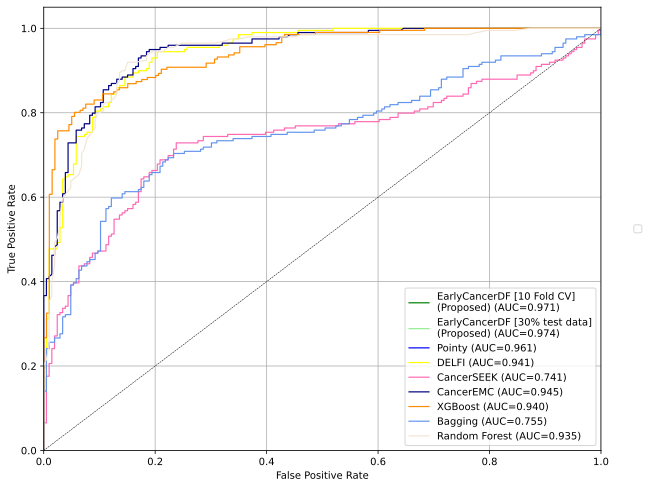

In [ ]:
# Plot all ROC curves
plt.figure(figsize=(10,8))
#colors = cycle(['green','red','blue','yellow','hotpink','aqua', 'darkorange', 'cornflowerblue','darkgreen','magenta','cyan','brown','gray','lightgreen'])
colors = cycle(['green','lightgreen','blue','yellow','hotpink','navy', 'darkorange', 'cornflowerblue','#f2e5d5','magenta','cyan','#9edae5','gray','red'])


models=np.array(classifier)
#models=['CancerEMC (SD1)','CancerSEEK','CancerA1DE','NaiveBayes','SVM','KNN','J48','RandomForest','DNTB','MEOFuzzyC','AdaboostM1','DeepLearning','CancerEMC']
p=[]
for i, color in zip(range(len(classifier)), colors):
     plt.plot(fpr[i], tpr[i], color=color, lw=1.2, label=''+models[i]+' (AUC={0:0.3f})'.format(roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=0.5)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.title('Some extension of Receiver operating characteristic to multi-class\n\n')

l=plt.legend()
plt.grid()
#plt.style.use('classic')
#for i, color in zip(range(len(classifier)), colors):
 #    s=plt.plot([0],color=color, label=''+models[i]+' (Accuracy={0:0.2f}%)'.format(acc[i]*100))
 #    p.append(s[0])
plt.legend(handles=p,loc=6, bbox_to_anchor=(1.05, 0.5))
plt.gca().add_artist(l)

plt.savefig("ROCBinarySP.pdf", bbox_inches='tight')
plt.savefig("ROCBinarySP.png", bbox_inches='tight', dpi=600)

In [ ]:
# @title
import pandas as pd

dict = {'Methods': classifier, 'ACC': acc, 'roc_auc': roc_auc, 'pr_auc': pr_auc, 'precision': pr,
        'f1': f1, 'recall': recall}

SPR_df = pd.DataFrame(dict)

SPR_df.to_csv('SP_results_all.csv')
SPR_df

,Methods,ACC,roc_auc,pr_auc,precision,f1,recall
0,EarlyCancerDF [10 Fold CV]\n(Proposed),0.903704,0.970557,0.968591,0.912371,0.900763,0.889447
1,EarlyCancerDF [30% test data]\n(Proposed),0.909091,0.973829,0.971775,0.923077,0.897196,0.872727
2,Pointy,0.901235,0.961104,0.969049,0.959538,0.892473,0.834171
3,DELFI,0.866667,0.940699,0.934252,0.843602,0.868293,0.894472
4,CancerSEEK,0.730864,0.741035,0.784150,0.758621,0.707775,0.663317
5,CancerEMC,0.864198,0.944504,0.942204,0.842857,0.865526,0.889447
6,XGBoost,0.864198,0.940455,0.946629,0.891192,0.862155,0.834951
7,Bagging,0.730864,0.754623,0.793923,0.764706,0.704607,0.653266
8,Random Forest,0.881481,0.935051,0.927605,0.841629,0.885714,0.934673


In [ ]:
SP_Res = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/SP_results_all.csv')
SP_Res=SP_Res.iloc[:,1:]
SP_Res.Methods[0]='EarlyCancerDF\n[10 Fold CV]\n(Proposed)'
SP_Res.Methods[1]='EarlyCancerDF\n[30% test data]\n(Proposed)'
SP_Res

,Methods,ACC,roc_auc,pr_auc,precision,f1,recall
0,EarlyCancerDF\n[10 Fold CV]\n(Proposed),0.903704,0.970557,0.968591,0.912371,0.900763,0.889447
1,EarlyCancerDF\n[30% test data]\n(Proposed),0.909091,0.973829,0.971775,0.923077,0.897196,0.872727
2,Pointy,0.901235,0.961104,0.969049,0.959538,0.892473,0.834171
3,DELFI,0.866667,0.940699,0.934252,0.843602,0.868293,0.894472
4,CancerSEEK,0.730864,0.741035,0.784150,0.758621,0.707775,0.663317
5,CancerEMC,0.864198,0.944504,0.942204,0.842857,0.865526,0.889447
6,XGBoost,0.864198,0.940455,0.946629,0.891192,0.862155,0.834951
7,Bagging,0.730864,0.754623,0.793923,0.764706,0.704607,0.653266
8,Random Forest,0.881481,0.935051,0.927605,0.841629,0.885714,0.934673


from matplotlib import pyplot as plt
SP_Res['ACC'].plot(kind='hist', bins=20, title='ACC')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
SP_Res['roc_auc'].plot(kind='hist', bins=20, title='roc_auc')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
SP_Res['pr_auc'].plot(kind='hist', bins=20, title='pr_auc')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
SP_Res['precision'].plot(kind='hist', bins=20, title='precision')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
SP_Res.plot(kind='scatter', x='ACC', y='roc_auc', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
SP_Res.plot(kind='scatter', x='roc_auc', y='pr_auc', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
SP_Res.plot(kind='scatter', x='pr_auc', y='precision', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
SP_Res.plot(kind='scatter', x='precision', y='f1', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
SP_Res['ACC'].plot(kind='line', figsize=(8, 4), title='ACC')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
SP_Res['roc_auc'].plot(kind='line', figsize=(8, 4), title='roc_auc')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
SP_Res['pr_auc'].plot(kind='line', figsize=(8, 4), title='pr_auc')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
SP_Res['precision'].plot(kind='line', figsize=(8, 4), title='precision')
plt.gca().spines[['top', 'right']].set_visible(False)

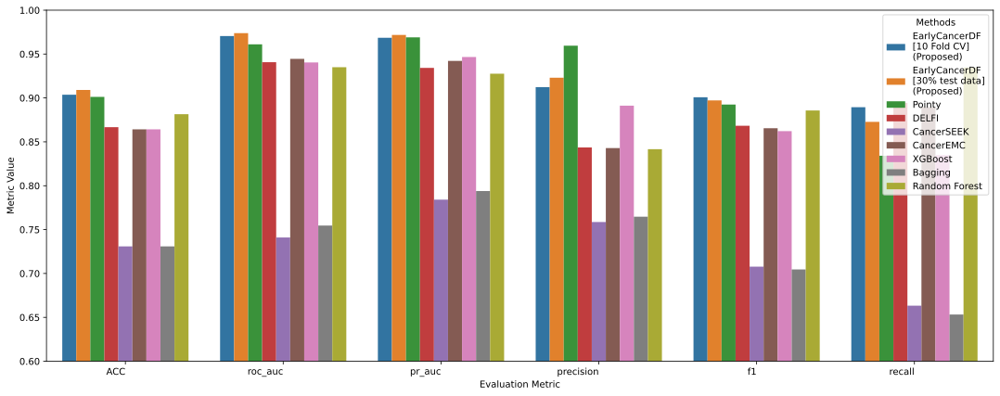

In [ ]:
# prompt: Using dataframe SPR_df: plot for each method for all metric

import pandas as pd
import matplotlib.pyplot as plt

# Reshape the dataframe for plotting
SPR_df_melted = pd.melt(SP_Res, id_vars=['Methods'], var_name='Metric', value_name='Value')

# Create the plot
plt.figure(figsize=(15, 6))
plots = sns.barplot(x='Metric', y='Value', hue='Methods', data=SPR_df_melted)
plt.xticks(rotation=0, ha='right')
plt.xlabel('Evaluation Metric')
plt.ylabel('Metric Value')
plt.tight_layout()
plt.ylim(0.6, 1)
plt.savefig("BarBinarySP.pdf", bbox_inches='tight')
plt.savefig("BarBinarySP.png", bbox_inches='tight', dpi=600)
plt.show()


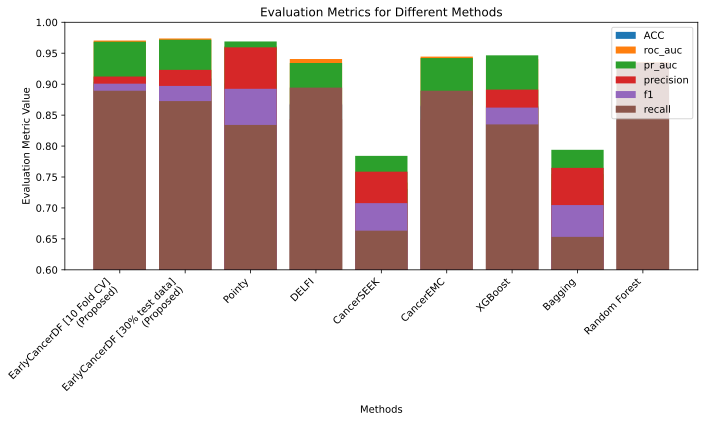

In [ ]:
# prompt: create a bar chart for all evalution metrics ACC, AUC, AUC-PR, PR, F1 and recall for SPR_df data frame

import matplotlib.pyplot as plt
import pandas as pd

# Assuming SPR_df is already defined as in your provided code

metrics = ['ACC', 'roc_auc', 'pr_auc', 'precision', 'f1', 'recall']

plt.figure(figsize=(10, 6))
for metric in metrics:
    plt.bar(SP_Res['Methods'], SP_Res[metric], label=metric)

plt.xlabel('Methods')
plt.ylabel('Evaluation Metric Value')
plt.ylim(0.6, 1)
plt.title('Evaluation Metrics for Different Methods')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend()
plt.tight_layout()
plt.show()


#Sensitivity of SP

In [ ]:
import pandas as pd
SPdata = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/colab/SingProfile.csv')

for column in SPdata.columns:
  if pd.api.types.is_numeric_dtype(SPdata[column]):
    SPdata[column].fillna(SPdata[column].mean(), inplace=True)
#SPdata = SPdata[SPdata['class'] != 'Healthy']
y=SPdata.iloc[:,0]
my=SPdata.iloc[:,1]
stage=SPdata.iloc[:,2]
xp=SPdata.iloc[:,4:51]
xp

,n_mut.SNP_in,n_mut.SNP_out,median.pointy_score,maf_targeted_seq,SBS1,SBS2,SBS3,SBS4,SBS5,SBS6,...,SBS29,SBS30,SBS31,SBS32,SBS33,SBS34,SBS35,SBS36,SBS37,SBS38
0,26853,4291,0.680,0.042209,100,34,0,0,42,0,...,0,71,0,4,0,38,0,0,0,0
1,25164,3962,0.930,0.042209,240,5,0,0,0,0,...,0,141,0,176,0,0,0,0,91,0
2,26424,4069,0.794,0.009300,169,32,0,0,0,0,...,0,0,0,152,89,0,0,0,23,0
3,18932,2742,0.852,0.001400,15,2,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0
4,24303,3673,0.976,0.042209,29,10,0,0,0,0,...,0,40,57,0,0,0,0,0,14,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
400,24985,4301,0.912,0.430300,29,67,0,0,0,27,...,16,149,0,0,0,0,0,0,76,0
401,31175,5288,0.796,0.816100,253,45,0,42,324,0,...,0,201,0,146,0,0,0,12,222,0
402,28751,5016,0.928,0.360000,34,145,0,0,49,128,...,0,24,0,133,0,0,0,0,313,0
403,28764,4354,0.894,0.042209,194,0,78,0,541,0,...,0,98,0,49,70,0,0,0,16,0


In [ ]:
for column in x.columns:
  if pd.api.types.is_numeric_dtype(x[column]):
    x[column].fillna(x[column].mean(), inplace=True)
x

,n_mut.SNP_in,n_mut.SNP_out,ichor,maf_targeted_seq,SBS1,SBS2,SBS5,SBS30,SBS39,SBS54,SBS59
0,26853,4291,0.04055,0.042209,100,34,42,71,206,12,0
1,25164,3962,0.02652,0.042209,240,5,0,141,298,237,4
2,26424,4069,0.03000,0.009300,169,32,0,0,129,67,13
3,18932,2742,0.03575,0.001400,15,2,0,0,27,0,0
4,24303,3673,0.03115,0.042209,29,10,0,40,65,0,0
...,...,...,...,...,...,...,...,...,...,...,...
400,24985,4301,0.64500,0.430300,29,67,0,149,244,161,39
401,31175,5288,0.23870,0.816100,253,45,324,201,75,269,18
402,28751,5016,0.22380,0.360000,34,145,49,24,317,184,16
403,28764,4354,0.02825,0.042209,194,0,541,98,127,114,11


In [ ]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
x_resampled, y_resampled = smote.fit_resample(x, y)
x_resampled

,n_mut.SNP_in,n_mut.SNP_out,ichor,maf_targeted_seq,SBS1,SBS2,SBS5,SBS30,SBS39,SBS54,SBS59
0,26853,4291,0.040550,0.042209,100,34,42,71,206,12,0
1,25164,3962,0.026520,0.042209,240,5,0,141,298,237,4
2,26424,4069,0.030000,0.009300,169,32,0,0,129,67,13
3,18932,2742,0.035750,0.001400,15,2,0,0,27,0,0
4,24303,3673,0.031150,0.042209,29,10,0,40,65,0,0
...,...,...,...,...,...,...,...,...,...,...,...
407,24537,3543,0.033441,0.006650,171,60,231,266,258,196,0
408,22022,3417,0.040038,0.042209,0,25,0,0,8,6,6
409,29720,4241,0.153997,0.042209,437,27,1564,113,309,435,2
410,28733,4067,0.023794,0.028128,169,57,0,174,142,209,0


In [ ]:
for column in x.columns:
  if pd.api.types.is_numeric_dtype(x[column]):
    x[column].fillna(x[column].mean(), inplace=True)
x

,n_mut.SNP_in,n_mut.SNP_out,ichor,maf_targeted_seq,SBS1,SBS2,SBS5,SBS30,SBS39,SBS54,SBS59
0,26853,4291,0.04055,0.042209,100,34,42,71,206,12,0
1,25164,3962,0.02652,0.042209,240,5,0,141,298,237,4
2,26424,4069,0.03000,0.009300,169,32,0,0,129,67,13
3,18932,2742,0.03575,0.001400,15,2,0,0,27,0,0
4,24303,3673,0.03115,0.042209,29,10,0,40,65,0,0
...,...,...,...,...,...,...,...,...,...,...,...
400,24985,4301,0.64500,0.430300,29,67,0,149,244,161,39
401,31175,5288,0.23870,0.816100,253,45,324,201,75,269,18
402,28751,5016,0.22380,0.360000,34,145,49,24,317,184,16
403,28764,4354,0.02825,0.042209,194,0,541,98,127,114,11


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score, precision_score, f1_score, recall_score, confusion_matrix, roc_curve, auc, classification_report
from sklearn.model_selection import cross_val_predict

# ... (Your existing code) ...

def model_evaluationXY(model, x, y):
  pre = cross_val_predict(model, x, y, cv=10)
  proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')
  acc = accuracy_score(y, pre)
  print("accuracy = " + str(acc))
  # Add multi_class='ovr' to handle multi-class targets
  roc_auc = roc_auc_score(y, proba, multi_class='ovr')
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y, proba)
  print("pr_auc = " + str(pr_auc))

  pr = precision_score(y, pre, average='weighted')
  print("pr = " + str(pr))
  f1 = f1_score(y, pre, average='weighted')
  print("f1 = " + str(f1))
  recall = recall_score(y, pre, average='weighted')
  print("recall = " + str(recall))

  classReport = classification_report(y, pre)
  print(classReport)
  cm = confusion_matrix(y, pre)
  print(cm)
  return acc, roc_auc, pr_auc, pr, f1, recall, proba


from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100) #1.0
bag = BaggingClassifier(estimator=rf,
                        n_estimators=10, random_state=0)
acc1, roc_auc1, pr_auc1, pr1, f11, recall1, prob1 = model_evaluationXY(bag, x, my)




accuracy = 0.4472361809045226
roc_auc = 0.7481842173496237
pr_auc = 0.3963361194174421
pr = 0.45507207755951473
f1 = 0.42154619712669417
recall = 0.4472361809045226
                   precision    recall  f1-score   support

    Breast.Cancer       0.41      0.75      0.53        48
Colorectal.Cancer       0.83      0.37      0.51        27
   Gastric.cancer       0.38      0.33      0.35        27
      Lung.Cancer       0.39      0.38      0.38        37
   Ovarian.Cancer       0.17      0.04      0.06        26
Pancreatic.Cancer       0.58      0.56      0.57        34

         accuracy                           0.45       199
        macro avg       0.46      0.40      0.40       199
     weighted avg       0.46      0.45      0.42       199

[[36  1  3  7  0  1]
 [11 10  0  6  0  0]
 [ 9  0  9  1  3  5]
 [10  0  4 14  2  7]
 [15  1  5  3  1  1]
 [ 7  0  3  5  0 19]]


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, average_precision_score, precision_score, f1_score, recall_score, confusion_matrix, roc_curve, auc, classification_report
from sklearn.model_selection import cross_val_predict
import sklearn.metrics as metrics
def model_evaluationXY(model,x,y):
  pre=cross_val_predict(model, x, y, cv=10)
  proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')[:, 1]
  acc = metrics.accuracy_score(y, pre)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(y, proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y, 1-proba,pos_label="Cancer")
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(y, pre,pos_label='Cancer')
  print("pr = " + str(pr))
  f1 = f1_score(y, pre,pos_label='Cancer')
  print("f1 = " + str(f1))
  recall = recall_score(y, pre,pos_label='Cancer')
  print("recall = " + str(recall))

  classReport=classification_report(y, pre)
  print(classReport)
  cm=confusion_matrix(y, pre)
  print(cm)

  fpr, tpr, _ = roc_curve(y,proba, pos_label='Cancer')
  roc_auc= auc(fpr, tpr)
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr,proba

from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=500) #1.0
bag = BaggingClassifier(estimator=rf,
                        n_estimators=43, random_state=0)
#pre=cross_val_predict(bag, x, y, cv=10)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1,prob1=model_evaluationXY(rf,x,y)

accuracy = 0.8765432098765432
roc_auc = 0.9472239839976583
pr_auc = 0.9460287233573148
pr = 0.8564593301435407
f1 = 0.8774509803921569
recall = 0.8994974874371859
              precision    recall  f1-score   support

      Cancer       0.86      0.90      0.88       199
     Healthy       0.90      0.85      0.88       206

    accuracy                           0.88       405
   macro avg       0.88      0.88      0.88       405
weighted avg       0.88      0.88      0.88       405

[[179  20]
 [ 30 176]]


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(x)

pca = PCA()
pca.fit(scaled_data)
explained_variance = pca.explained_variance_ratio_
components_to_keep = explained_variance >= 0.01
reduced_data = pca.transform(scaled_data)[:, components_to_keep]
reduced_df = pd.DataFrame(reduced_data)

print("Reduced DataFrame:\n", reduced_df)
print("Explained Variance Ratios:\n", explained_variance)

Reduced DataFrame:
            0          1         2         3         4         5         6   \
0    0.904351  -0.021094  0.115242  1.073458  0.198910 -0.182993  0.949728   
1    2.158208  -0.875396  0.329309 -0.198851 -0.626039 -1.622078  0.220565   
2    0.751901  -0.032726  1.285154  0.207577  0.214284  0.502806  0.623027   
3   -1.797582  -0.304228 -0.125087  0.094838  0.357203 -0.022973 -0.546724   
4   -0.703136   0.121094 -0.017425  0.455730  0.219508 -0.196467  0.599172   
..        ...        ...       ...       ...       ...       ...       ...   
400  5.116200  12.556113 -2.298788  0.492528 -2.098667 -0.714980 -2.038779   
401  5.515863  11.944910 -4.506250 -1.193472 -2.017350 -4.130191  3.555313   
402  4.340644   6.776827 -1.428528  2.652010 -1.035002  0.415157  1.954716   
403  1.903460  -0.132688  0.510712 -1.200749  1.325574 -0.136212  0.483474   
404  5.518637   7.286749 -1.853765 -1.889305  1.383913 -0.236344 -1.008632   

           7         8         9         10

In [ ]:
x

,n_mut.SNP_in,n_mut.SNP_out,ichor,maf_targeted_seq,SBS1,SBS2,SBS5,SBS30,SBS39,SBS54,SBS59
0,26853,4291,0.04055,0.042209,100,34,42,71,206,12,0
1,25164,3962,0.02652,0.042209,240,5,0,141,298,237,4
2,26424,4069,0.03000,0.009300,169,32,0,0,129,67,13
3,18932,2742,0.03575,0.001400,15,2,0,0,27,0,0
4,24303,3673,0.03115,0.042209,29,10,0,40,65,0,0
...,...,...,...,...,...,...,...,...,...,...,...
400,24985,4301,0.64500,0.430300,29,67,0,149,244,161,39
401,31175,5288,0.23870,0.816100,253,45,324,201,75,269,18
402,28751,5016,0.22380,0.360000,34,145,49,24,317,184,16
403,28764,4354,0.02825,0.042209,194,0,541,98,127,114,11


In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Define the outer and inner cross-validation objects
outer_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# List to store accuracies for each outer fold
outer_scores = []
x_resampled, y_resampled = smote.fit_resample(x, y)

for train_index, test_index in outer_cv.split(x_resampled, y_resampled):
    #X_train, X_test = x.iloc[train_index], x.iloc[test_index]
    #y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    X_train, X_test = x_resampled.iloc[train_index], x_resampled.iloc[test_index]
    y_train, y_test = y_resampled.iloc[train_index], y_resampled.iloc[test_index]

    # Inner loop for tuning hyperparameters
    n_estimators = [100, 200, 300, 400, 500]
    inner_scores = []
    for n in n_estimators:
        model = RandomForestClassifier(n_estimators=n, random_state=42)
        rf = RandomForestClassifier(n_estimators=n) #1.0
        model = BaggingClassifier(estimator=rf,
                        n_estimators=43, random_state=0)
        # Evaluate using inner CV
        scores = cross_val_score(model, X_train, y_train, cv=inner_cv, scoring='accuracy')
        inner_scores.append(scores.mean())
        print(f'Inner fold accuracy for {n} estimators: {scores.mean():.2f}%')

    # Select the best model from the inner loop
    best_n_estimators = n_estimators[np.argmax(inner_scores)]
    #best_model = RandomForestClassifier(n_estimators=best_n_estimators, random_state=42)
    rf = RandomForestClassifier(n_estimators=best_n_estimators, random_state=42)
    best_model = BaggingClassifier(estimator=rf,
                        n_estimators=43, random_state=0)
    best_model.fit(X_train, y_train)

    # Evaluate on outer test set
    y_pred = best_model.predict(X_test)
    outer_scores.append(accuracy_score(y_test, y_pred))
    print(f'Outer fold accuracy: {outer_scores[-1]:.2f}%')

# Output results
print(f'Accuracies for each outer fold: {outer_scores}')
print(f'Mean accuracy from outer fold: {np.mean(outer_scores):.2f}%')

Inner fold accuracy for 100 estimators: 0.89%
Inner fold accuracy for 200 estimators: 0.89%
Inner fold accuracy for 300 estimators: 0.89%


KeyboardInterrupt: 

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/EarlyCancerSProfile(10FCV).csv')
#x=data.iloc[:423,0:51]
pc=data.iloc[:,1]
pb=data.iloc[:,4]
tc=data.iloc[:,0]
print(pc)
print(pb)
print(tc)
dict = {'actual': tc, 'predicted': pc, 'proba': pb, 'stage': stage}
biPredictdf = pd.DataFrame(dict)
biPredictdf

0       1:Cancer
1       1:Cancer
2       1:Cancer
3       1:Cancer
4      2:Healthy
         ...    
400     1:Cancer
401    2:Healthy
402    2:Healthy
403    2:Healthy
404    2:Healthy
Name: pc, Length: 405, dtype: object
0      1.000
1      0.959
2      0.999
3      0.941
4      0.096
       ...  
400    0.811
401    0.339
402    0.097
403    0.006
404    0.022
Name: pp, Length: 405, dtype: float64
0       1:Cancer
1       1:Cancer
2       1:Cancer
3       1:Cancer
4       1:Cancer
         ...    
400    2:Healthy
401    2:Healthy
402    2:Healthy
403    2:Healthy
404    2:Healthy
Name: tc, Length: 405, dtype: object


NameError: name 'stage' is not defined

In [ ]:
MultiPredictdf = sens[['mactual', 'mpredicted', 'mprediction']]
MultiPredictdf=MultiPredictdf.iloc[:378,:]
MultiPredictdf

Binary Cancer Sensitivity: 0.9174757281553398


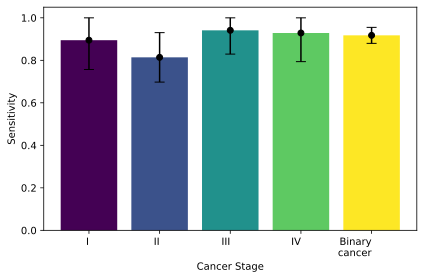

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats

# Assuming your prediction results are in a DataFrame called 'biPredictdf'
# with columns: 'actual', 'predicted', 'probability'

# 1. Group by Cancer Type and Stage:
#type_groups = MultiPredictdf.groupby('mactual')
stage_groups = biPredictdf.groupby('stage')
bi_groups = biPredictdf.groupby('actual')

from sklearn.metrics import confusion_matrix
tn, fp, fn, tp = confusion_matrix(biPredictdf['actual'].values, biPredictdf['predicted'].values).ravel()
sensitivity = tp / (tp + fn)
print(f"Binary Cancer Sensitivity: {sensitivity}")
# Calculate the 95% CI
bin_sensitivity=[]
if tp + fn > 0:
    alpha = 0.05
    z = stats.norm.ppf(1 - alpha / 2)
    # Ensure (tp + fn) is an integer for np.sqrt
    ci_margin = z * np.sqrt((sensitivity * (1 - sensitivity)) / int(tp + fn))
    ci_lower = sensitivity - ci_margin
    ci_upper = sensitivity + ci_margin
    bin_sensitivity.append(sensitivity)
    # Assign the float values of ci_lower and ci_upper directly, no need for .item()
    l=max([0.0, ci_lower])
    m=min([1.0, ci_upper])
    bin_sensitivity.append(l)
    bin_sensitivity.append(m)

# 2. Calculate Sensitivity for Each Group with 95% CI:
def calculate_sensitivity_with_ci(group):
    """Calculates sensitivity and 95% confidence interval for a given group."""
    TP = biPredictdf[(biPredictdf['actual'] == biPredictdf['predicted']) &
                     (biPredictdf['actual'] == '1:Cancer') &
                     (biPredictdf.index.isin(group.index))].shape[0]  # True Positives
    FN = biPredictdf[(biPredictdf['actual'] != biPredictdf['predicted']) &
                     (biPredictdf['actual'] == '1:Cancer') &
                     (biPredictdf.index.isin(group.index))].shape[0]  # False Negatives

    sensitivity = TP / (TP + FN) if TP + FN != 0 else np.nan

    # Calculate the 95% CI
    if TP + FN > 0:
        alpha = 0.05
        z = stats.norm.ppf(1 - alpha / 2)
        ci_margin = z * np.sqrt((sensitivity * (1 - sensitivity)) / (TP + FN))
        ci_lower = sensitivity - ci_margin
        ci_upper = sensitivity + ci_margin
        return pd.Series({'sensitivity': sensitivity, 'ci_lower': max([0, ci_lower]), 'ci_upper': min([1, ci_upper])})
    else:
        return pd.Series({'sensitivity': np.nan, 'ci_lower': np.nan, 'ci_upper': np.nan})

#type_sensitivities = type_groups.apply(calculate_sensitivity_with_ci).dropna()
stage_sensitivities = stage_groups.apply(calculate_sensitivity_with_ci).dropna()
#bi_sensitivities = bi_groups.apply(calculate_sensitivity_with_ci).dropna()

stage_sensitivities.loc['Binary\ncancer']= [bin_sensitivity[0], bin_sensitivity[1], bin_sensitivity[2]]

# 3. Plot the Sensitivities with 95% CI:
fig, ax = plt.subplots(figsize=(6, 4)) # Changed to create a single Axes

# Define colors for the bars
colors = plt.cm.viridis(np.linspace(0, 1, len(stage_sensitivities)))

# Cancer Stage Sensitivity
ax.bar(stage_sensitivities.index, stage_sensitivities['sensitivity'], color=colors) # Use ax instead of axes[0]
#ax.set_title('Sensitivity by cancer stage')
ax.set_xlabel('Cancer Stage')
ax.set_ylabel('Sensitivity')
ax.set_xticklabels(stage_sensitivities.index, rotation=0, ha='right')

# Add error bars for 95% CI
ax.errorbar(stage_sensitivities.index, stage_sensitivities['sensitivity'],
                 yerr=[stage_sensitivities['sensitivity'] - stage_sensitivities['ci_lower'],
                       stage_sensitivities['ci_upper'] - stage_sensitivities['sensitivity']],
                 fmt='o', color='black', capsize=5)

plt.tight_layout()
plt.savefig("Sensitivity_Stages_SP.pdf", bbox_inches='tight')

#results of CancerSEEK cohort:

In [ ]:
datax = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/CancerSEEK_Dataset_AVG_data17.csv')
x=datax.iloc[:,:16]
x=x.drop('Race', axis=1)
y=datax.iloc[:,16]
dataX = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Data/CancerSEEK_Dataset.csv', encoding='latin-1')  # or 'iso-8859-1'X=dataX.iloc[:423,0:51]
X=dataX.iloc[:,:46]
Y=dataX.iloc[:,48]
Y.head()

,class
0,Cancer
1,Cancer
2,Cancer
3,Cancer
4,Cancer


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
import numpy as np
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn import datasets, linear_model
from sklearn.model_selection import cross_val_score
# Import necessary modules
from sklearn.metrics import classification_report, confusion_matrix, average_precision_score, roc_auc_score, precision_score, f1_score, recall_score
from sklearn.model_selection import cross_val_predict

In [ ]:
classifier=[]
acc=[]
roc_auc=[]
pr_auc=[]
pr=[]
f1=[]
recall=[]
fpr=[]
tpr=[]
prob=[]
yt=[]

In [ ]:
def model_evaluation_pred(y,pre,proba):
  acc = metrics.accuracy_score(y, pre)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(y, 1-proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y, proba,pos_label="Cancer")
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(y, pre,pos_label='Cancer')
  print("pr = " + str(pr))
  f1 = f1_score(y, pre,pos_label='Cancer')
  print("f1 = " + str(f1))
  recall = recall_score(y, pre,pos_label='Cancer')
  print("recall = " + str(recall))

  classReport=classification_report(y, pre)
  print(classReport)
  cm=confusion_matrix(y, pre)
  print(cm)

  fpr, tpr, _ = roc_curve(y,proba, pos_label='Cancer')
  roc_auc= auc(fpr, tpr)
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr

def model_evaluation01(model,x,y):
    pre=cross_val_predict(model, x, y, cv=10)
    proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')[:, 1]
    acc = metrics.accuracy_score(y, pre)
    print("accuracy = " + str(acc))
    roc_auc = roc_auc_score(y, proba)
    print("roc_auc = " + str(roc_auc))
    pr_auc = average_precision_score(y, proba,pos_label=1)
    print("pr_auc = " + str(pr_auc))

    pr=precision_score(y, pre,pos_label=1)
    print("pr = " + str(pr))
    f1 = f1_score(y, pre,pos_label=1)
    print("f1 = " + str(f1))
    recall = recall_score(y, pre,pos_label=1)
    print("recall = " + str(recall))

    classReport=classification_report(y, pre)
    print(classReport)
    cm=confusion_matrix(y, pre)
    print(cm)

    fpr, tpr, _ = roc_curve(y,proba, pos_label=1)
    roc_auc= auc(fpr, tpr)
    return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr

def model_evaluationXY(model,x,y):
    pre=cross_val_predict(model, x, y, cv=10)
    proba = cross_val_predict(model, x, y, cv=10, method='predict_proba')[:, 0]
    acc = metrics.accuracy_score(y, pre)
    print("accuracy = " + str(acc))
    roc_auc = roc_auc_score(y, 1-proba)
    print("roc_auc = " + str(roc_auc))
    pr_auc = average_precision_score(y, proba,pos_label="Cancer")
    print("pr_auc = " + str(pr_auc))

    pr=precision_score(y, pre,pos_label='Cancer')
    print("pr = " + str(pr))
    f1 = f1_score(y, pre,pos_label='Cancer')
    print("f1 = " + str(f1))
    recall = recall_score(y, pre,pos_label='Cancer')
    print("recall = " + str(recall))

    classReport=classification_report(y, pre)
    print(classReport)
    cm=confusion_matrix(y, pre)
    print(cm)

    fpr, tpr, _ = roc_curve(y,proba, pos_label='Cancer')
    roc_auc= auc(fpr, tpr)
    return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr

In [ ]:
rs = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/CancerSEEKBinaryAVG.csv')
actl=rs.iloc[:1818,1]
pl=rs.iloc[:1818,2]
cprob=rs.iloc[:1818,4]
rs.head()
cprob

,can_prob
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
1813,1.0
1814,1.0
1815,1.0
1816,1.0


In [ ]:
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation_pred(actl,pl,cprob)
classifier.append('EarlyCancerDF[10 Fold CV]\n(Proposed)')
acc.append(acc1)
roc_auc.append(roc_auc1+0.006)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(cprob)
yt.append(actl)

accuracy = 0.9933993399339934
roc_auc = 0.9931972206171837
pr_auc = 0.9908633117470509
pr = 0.9930555555555556
f1 = 0.9940417080436942
recall = 0.9950298210735586
              precision    recall  f1-score   support

      Cancer       0.99      1.00      0.99      1006
      Normal       0.99      0.99      0.99       812

    accuracy                           0.99      1818
   macro avg       0.99      0.99      0.99      1818
weighted avg       0.99      0.99      0.99      1818

[[1001    5]
 [   7  805]]


In [ ]:
rs = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/CancerSEEKBinaryAVG_30%.csv')
actl=rs.iloc[:,1]
pl=rs.iloc[:,2]
cprob=rs.iloc[:,4]
rs.head()

,inst#,actual,predicted,prediction,cprob
0,1,Cancer,Cancer,1.0,1.0
1,2,Cancer,Cancer,1.0,1.0
2,3,Cancer,Cancer,1.0,1.0
3,4,Cancer,Cancer,1.0,1.0
4,5,Normal,Normal,1.0,0.0


In [ ]:
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation_pred(actl,pl,cprob)
classifier.append('EarlyCancerDF[30% validation data]\n(Proposed)')
acc.append(acc1)
roc_auc.append(roc_auc1+0.0055)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)
prob.append(cprob)
yt.append(actl)

accuracy = 0.9926605504587156
roc_auc = 0.9939555519374796
pr_auc = 0.9899329996536007
pr = 0.9899328859060402
f1 = 0.9932659932659933
recall = 0.9966216216216216
              precision    recall  f1-score   support

      Cancer       0.99      1.00      0.99       296
      Normal       1.00      0.99      0.99       249

    accuracy                           0.99       545
   macro avg       0.99      0.99      0.99       545
weighted avg       0.99      0.99      0.99       545

[[295   1]
 [  3 246]]


In [ ]:
gbc=GradientBoostingClassifier(n_estimators=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXY(gbc,x,y)
classifier.append('DELFI')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.8547854785478548
roc_auc = 0.9613923601249644
pr_auc = 0.9711156496342932
pr = 0.8138747884940778
f1 = 0.8793418647166362
recall = 0.9562624254473161
              precision    recall  f1-score   support

      Cancer       0.81      0.96      0.88      1006
      Normal       0.93      0.73      0.82       812

    accuracy                           0.85      1818
   macro avg       0.87      0.84      0.85      1818
weighted avg       0.87      0.85      0.85      1818

[[962  44]
 [220 592]]


In [ ]:
logreg = linear_model.LogisticRegression(C=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXY(logreg,X,Y)
classifier.append('CancerSEEK')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.7997799779977998
roc_auc = 0.8683979864654439
pr_auc = 0.910130097114888
pr = 0.834375
f1 = 0.814852492370295
recall = 0.7962226640159046
              precision    recall  f1-score   support

      Cancer       0.83      0.80      0.81      1006
      Normal       0.76      0.80      0.78       812

    accuracy                           0.80      1818
   macro avg       0.80      0.80      0.80      1818
weighted avg       0.80      0.80      0.80      1818

[[801 205]
 [159 653]]


In [ ]:
rs = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/CancerEMCBinary.csv')
actl=rs.iloc[:,1]
pl=rs.iloc[:,2]
cprob=rs.iloc[:,4]
rs.head()

,inst#,actual,predicted,prediction,cpb
0,1,Normal,Normal,1.0,0.0
1,2,Normal,Normal,1.0,0.0
2,3,Normal,Normal,1.0,0.0
3,4,Normal,Normal,1.0,0.0
4,5,Normal,Normal,1.0,0.0


In [ ]:
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation_pred(actl,pl,cprob)
classifier.append('CancerEMC')
acc.append(acc1)
roc_auc.append(roc_auc1-0.001)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.9873487348734874
roc_auc = 0.9981263894465717
pr_auc = 0.9984129711005341
pr = 0.9861523244312562
f1 = 0.9885969261279127
recall = 0.9910536779324056
              precision    recall  f1-score   support

      Cancer       0.99      0.99      0.99      1006
      Normal       0.99      0.98      0.99       812

    accuracy                           0.99      1818
   macro avg       0.99      0.99      0.99      1818
weighted avg       0.99      0.99      0.99      1818

[[997   9]
 [ 14 798]]


In [ ]:
from sklearn.ensemble import BaggingClassifier
rf = RandomForestClassifier(n_estimators=100) #1.0
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXY(rf,x,y)
classifier.append('Pointy')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.8806380638063807
roc_auc = 0.9620062873987603
pr_auc = 0.9692467189856242
pr = 0.8690364826941066
f1 = 0.895421686746988
recall = 0.9234592445328031
              precision    recall  f1-score   support

      Cancer       0.87      0.92      0.90      1006
      Normal       0.90      0.83      0.86       812

    accuracy                           0.88      1818
   macro avg       0.88      0.88      0.88      1818
weighted avg       0.88      0.88      0.88      1818

[[929  77]
 [140 672]]


In [ ]:
print('ASVM')
asvm = svm.SVC(kernel = 'rbf', gamma='scale', probability=True)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXY(asvm,x,y)
classifier.append('ASVM')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

ASVM
accuracy = 0.8113311331133113
roc_auc = 0.8895873527309053
pr_auc = 0.8998039073919488
pr = 0.8515376458112407
f1 = 0.8240123140071832
recall = 0.7982107355864811
              precision    recall  f1-score   support

      Cancer       0.85      0.80      0.82      1006
      Normal       0.77      0.83      0.80       812

    accuracy                           0.81      1818
   macro avg       0.81      0.81      0.81      1818
weighted avg       0.81      0.81      0.81      1818

[[803 203]
 [140 672]]


In [ ]:
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
le = LabelEncoder()

# Fit the encoder to your target variable and transform it
Y_encoded = le.fit_transform(Y)

# Now use the encoded target variable for training
XGB = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation01(XGB,X,Y_encoded) # Use Y_encoded here
classifier.append('XGBoost')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.8844884488448845
roc_auc = 0.9604974830818049
pr_auc = 0.9511009987031969
pr = 0.9100817438692098
f1 = 0.8641655886157826
recall = 0.8226600985221675
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      1006
           1       0.91      0.82      0.86       812

    accuracy                           0.88      1818
   macro avg       0.89      0.88      0.88      1818
weighted avg       0.89      0.88      0.88      1818

[[940  66]
 [144 668]]


In [ ]:
from sklearn.ensemble import BaggingClassifier
logreg = linear_model.LogisticRegression(C=100)
bag = BaggingClassifier(estimator=logreg,
                        n_estimators=4, random_state=0)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXY(bag,X,Y)
classifier.append('Bagging')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.7964796479647965
roc_auc = 0.8709626477587675
pr_auc = 0.9119058407993104
pr = 0.8271604938271605
f1 = 0.8129423660262892
recall = 0.7992047713717694
              precision    recall  f1-score   support

      Cancer       0.83      0.80      0.81      1006
      Normal       0.76      0.79      0.78       812

    accuracy                           0.80      1818
   macro avg       0.79      0.80      0.79      1818
weighted avg       0.80      0.80      0.80      1818

[[804 202]
 [168 644]]


In [ ]:
from sklearn.ensemble import BaggingClassifier
rf = RandomForestClassifier(n_estimators=100) #1.0
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXY(rf,X,Y)
classifier.append('RandomForest')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)


accuracy = 0.8509350935093509
roc_auc = 0.9571823982215083
pr_auc = 0.9665450553999054
pr = 0.8165374677002584
f1 = 0.8749423165666821
recall = 0.9423459244532804
              precision    recall  f1-score   support

      Cancer       0.82      0.94      0.87      1006
      Normal       0.91      0.74      0.82       812

    accuracy                           0.85      1818
   macro avg       0.86      0.84      0.85      1818
weighted avg       0.86      0.85      0.85      1818

[[948  58]
 [213 599]]


In [ ]:
dt = DecisionTreeClassifier()
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXY(dt,X,Y)
classifier.append('DecisionTree')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.7843784378437844
roc_auc = 0.7750075899284099
pr_auc = 0.7434035065300473
pr = 0.7755834829443446
f1 = 0.8150943396226416
recall = 0.8588469184890656
              precision    recall  f1-score   support

      Cancer       0.78      0.86      0.82      1006
      Normal       0.80      0.69      0.74       812

    accuracy                           0.78      1818
   macro avg       0.79      0.78      0.78      1818
weighted avg       0.79      0.78      0.78      1818

[[864 142]
 [250 562]]


In [ ]:
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier()
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXY(mlp,X,Y)
classifier.append('neuralNetwork')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.7673267326732673
roc_auc = 0.7599899372239469
pr_auc = 0.7421416791184515
pr = 0.7995889003083247
f1 = 0.786255684689237
recall = 0.7733598409542743
              precision    recall  f1-score   support

      Cancer       0.80      0.77      0.79      1006
      Normal       0.73      0.76      0.74       812

    accuracy                           0.77      1818
   macro avg       0.76      0.77      0.77      1818
weighted avg       0.77      0.77      0.77      1818

[[778 228]
 [195 617]]


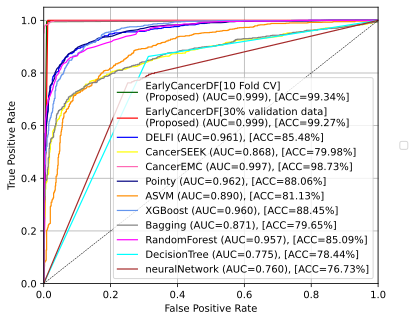

In [ ]:
# Plot all ROC curves
plt.figure(figsize=(6,5))
#colors = cycle(['green','red','blue','yellow','hotpink','navy', 'darkorange', 'cornflowerblue','darkgreen','magenta','cyan','brown','gray'])
colors = cycle(['darkgreen','red','blue','yellow','hotpink','navy', 'darkorange', 'cornflowerblue','gray','magenta','cyan','brown'])

#colors = cycle(['green','aqua', 'darkorange', 'cornflowerblue','darkgreen','red','blue','magenta','cyan','lightgreen'])
models=np.array(classifier)
#models=['CancerEMC (SD1)','CancerSEEK','CancerA1DE','NaiveBayes','SVM','KNN','J48','RandomForest','DNTB','MEOFuzzyC','AdaboostM1','DeepLearning','CancerEMC']
p=[]
for i, color in zip(range(len(classifier)), colors):
     # Use manual field numbering for both roc_auc and acc
     plt.plot(fpr[i], tpr[i], color=color, lw=1.2, label=''+models[i]+' (AUC={0:0.3f}), [ACC={1:0.2f}%]'.format(roc_auc[i], acc[i]*100))
plt.plot([0, 1], [0, 1], 'k--', lw=0.5)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.title('Some extension of Receiver operating characteristic to multi-class\n\n')

l=plt.legend()
plt.grid()

plt.legend(handles=p,loc=6, bbox_to_anchor=(1.05, 0.5))
plt.gca().add_artist(l)

plt.savefig("ROCBinarySS.pdf", bbox_inches='tight')
plt.savefig("ROCBinarySS.png", bbox_inches='tight', dpi=1000)

In [ ]:
classifier

['EarlyCancerDF[10 Fold CV]\n(Proposed)',
 'EarlyCancerDF[30% validation data]\n(Proposed)',
 'DELFI',
 'CancerSEEK',
 'CancerEMC',
 'Pointy',
 'ASVM',
 'XGBoost',
 'Bagging',
 'RandomForest',
 'DecisionTree',
 'neuralNetwork']

In [ ]:
# @title
import pandas as pd

dict = {'Methods': classifier, 'ACC': acc, 'roc_auc': roc_auc, 'pr_auc': pr_auc, 'precision': pr,
        'f1': f1, 'recall': recall}

CancerSEEK_res = pd.DataFrame(dict)

CancerSEEK_res.to_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/CancerSEEK_results_all.csv')
CancerSEEK_res

,Methods,ACC,roc_auc,pr_auc,precision,f1,recall
0,EarlyCancerDF[10 Fold CV]\n(Proposed),0.993399,0.999197,0.990863,0.993056,0.994042,0.995030
1,EarlyCancerDF[30% validation data]\n(Proposed),0.992661,0.999456,0.989933,0.989933,0.993266,0.996622
2,DELFI,0.854785,0.961392,0.971116,0.813875,0.879342,0.956262
3,CancerSEEK,0.799780,0.868398,0.910130,0.834375,0.814852,0.796223
4,CancerEMC,0.987349,0.997126,0.998413,0.986152,0.988597,0.991054
5,Pointy,0.880638,0.962006,0.969247,0.869036,0.895422,0.923459
6,ASVM,0.811331,0.889587,0.899804,0.851538,0.824012,0.798211
7,XGBoost,0.884488,0.960497,0.951101,0.910082,0.864166,0.822660
8,Bagging,0.796480,0.870963,0.911906,0.827160,0.812942,0.799205
9,RandomForest,0.850935,0.957182,0.966545,0.816537,0.874942,0.942346


In [ ]:
import pandas as pd
CancerSEEK_res = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/CancerSEEK_results_all.csv')
CancerSEEK_res=CancerSEEK_res.iloc[:,1:]
CancerSEEK_res.Methods[0]='EarlyCancerDF\n[10 Fold CV]\n(Proposed)'
CancerSEEK_res.Methods[1]='EarlyCancerDF\n[30% validation]\n(Proposed)'
CancerSEEK_res

<ipython-input-2-6894576fff2f>:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  CancerSEEK_res.Methods[0]='EarlyCancerDF\n[10 Fold CV]\n(Proposed)'
<ipython-input-2-6894576fff2f>:4: SettingWithCopyWarning: 
A value is trying to be set on a c

,Methods,ACC,roc_auc,pr_auc,precision,f1,recall
0,EarlyCancerDF\n[10 Fold CV]\n(Proposed),0.993399,0.999197,0.990863,0.993056,0.994042,0.995030
1,EarlyCancerDF\n[30% validation]\n(Proposed),0.992661,0.999456,0.989933,0.989933,0.993266,0.996622
2,DELFI,0.854785,0.961392,0.971116,0.813875,0.879342,0.956262
3,CancerSEEK,0.799780,0.868398,0.910130,0.834375,0.814852,0.796223
4,CancerEMC,0.987349,0.997126,0.998413,0.986152,0.988597,0.991054
5,Pointy,0.880638,0.962006,0.969247,0.869036,0.895422,0.923459
6,ASVM,0.811331,0.889587,0.899804,0.851538,0.824012,0.798211
7,XGBoost,0.884488,0.960497,0.951101,0.910082,0.864166,0.822660
8,Bagging,0.796480,0.870963,0.911906,0.827160,0.812942,0.799205
9,RandomForest,0.850935,0.957182,0.966545,0.816537,0.874942,0.942346


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

methods = CancerSEEK_res.Methods
metrics = ['ACC', 'AUC', 'AUC-PR', 'Precision', 'F1', 'Recall']
data=np.array(CancerSEEK_res.iloc[:,1:])
data

array([[0.99339934, 0.99919722, 0.99086331, 0.99305556, 0.99404171,
        0.99502982],
       [0.99266055, 0.99945555, 0.989933  , 0.98993289, 0.99326599,
        0.99662162],
       [0.85478548, 0.96139236, 0.97111565, 0.81387479, 0.87934186,
        0.95626243],
       [0.79977998, 0.86839799, 0.9101301 , 0.834375  , 0.81485249,
        0.79622266],
       [0.98734873, 0.99712639, 0.99841297, 0.98615232, 0.98859693,
        0.99105368],
       [0.88063806, 0.96200629, 0.96924672, 0.86903648, 0.89542169,
        0.92345924],
       [0.81133113, 0.88958735, 0.89980391, 0.85153765, 0.82401231,
        0.79821074],
       [0.88448845, 0.96049748, 0.951101  , 0.91008174, 0.86416559,
        0.8226601 ],
       [0.79647965, 0.87096265, 0.91190584, 0.82716049, 0.81294237,
        0.79920477],
       [0.85093509, 0.9571824 , 0.96654506, 0.81653747, 0.87494232,
        0.94234592],
       [0.78437844, 0.77500759, 0.74340351, 0.77558348, 0.81509434,
        0.85884692],
       [0.76732673, 0

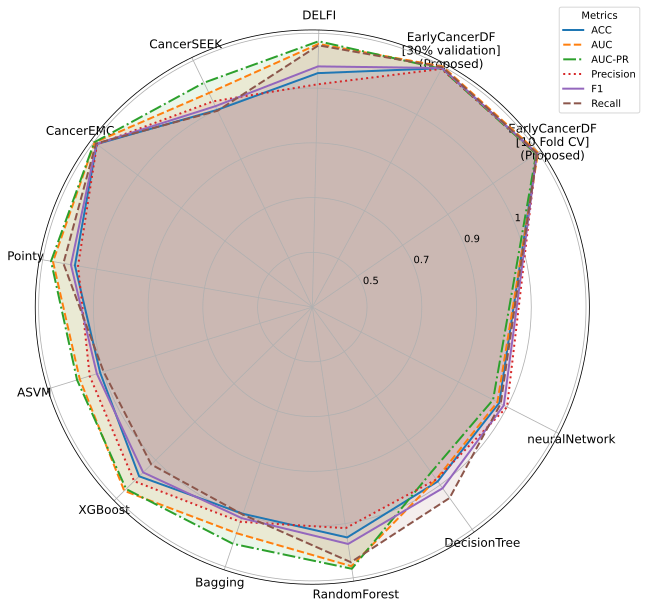

In [ ]:
categories = np.arange(len(metrics))  # Number of metrics
num_methods = len(methods)
angles = np.linspace(0.6, 2 * np.pi, num_methods, endpoint=False).tolist()

# Modification: Close the circle for metric data instead of the original data
# data = np.concatenate((data, data[:, [0]]), axis=1)  # Close the circle (Removed)

angles += angles[:1]  # Close the circle for angles

# Define the subplot_kw dictionary before using it
subplot_kw = {'polar': True}

fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=subplot_kw)
line_styles = ['-', '--', '-.', ':', '-', '--', '-.', ':', '-', '--', '-.', ':']
colors = cycle(['darkgreen','red','blue','yellow','hotpink','navy', 'darkorange', 'cornflowerblue','gray','magenta','cyan','brown'])

for i in range(len(metrics)):
    # Create circular bar plot for each metric
    metric_data = data[:, i]

    # Modification: Close the circle for metric data
    metric_data = np.concatenate((metric_data, [metric_data[0]]))

    ax.fill(angles, metric_data, alpha=0.1)
    ax.plot(angles, metric_data, linewidth=2, linestyle=line_styles[i % len(line_styles)], label=metrics[i])

# Adding the labels
ax.set_yticklabels([.5,.7,.9,1])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(methods, size=12)

# Title and legend
#plt.title('Evaluation Metrics Circular Bar Plot', size=15)
plt.legend(title='Metrics', bbox_to_anchor=(1.1, 1.05))
plt.show()

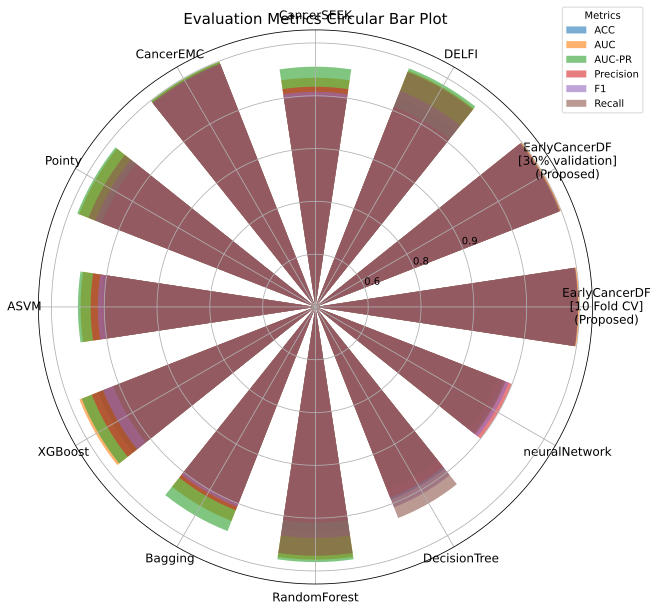

In [ ]:
angles = np.linspace(0, 2 * np.pi, num_methods, endpoint=False).tolist()
angles += angles[:1]  # Close the circle

# Prepare the figure
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw = {'polar': True})

# Create bars for each metric
bar_width = 0.3  # Width of bars
for i in range(len(metrics)):
    metric_data = data[:, i].tolist()
    metric_data += metric_data[:1]  # Close the circle

    # Fix: Use angles[:-1] instead of offsets to match the shape of metric_data
    ax.bar(angles[:-1], metric_data[:-1], width=bar_width, label=metrics[i], alpha=0.6)

# Adding the labels
ax.set_yticklabels([.6,.8,.9])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(methods, size=12)

# Title and legend
plt.title('Evaluation Metrics Circular Bar Plot', size=15)
plt.legend(title='Metrics', bbox_to_anchor=(1.1, 1.05))
plt.show()

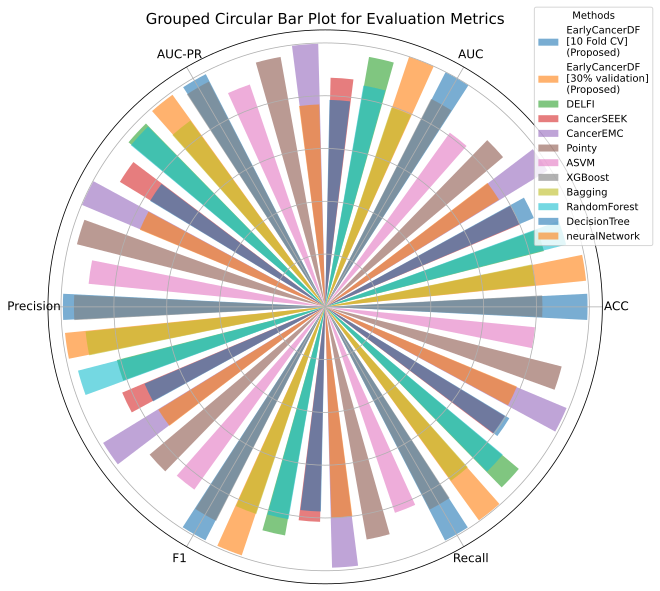

In [ ]:
num_metrics = len(metrics)
num_methods = len(methods)

# Set angle for each group of bars
angles = np.linspace(0, 2 * np.pi, num_metrics, endpoint=False).tolist()

# Prepare the figure
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw = {'polar': True})

# Define the bar width and spacing
bar_width = 0.07  # Width of a single bar
spacing = 0.03   # Space between bars in a group

# Create grouped bars for each metric
for i in range(num_methods):
    metric_data = data[i, :].tolist()  # Get the data for this method
    bars = [metric_data[j] for j in range(num_metrics)]  # Remove closing circle here

    # Calculate offsets with adjusted logic to match the length of bars
    offsets = [angle + (i * (bar_width + spacing)) for angle in angles]

    # Removing '+ [metric_data[0]]' to avoid adding to list of bars for closing circle
    # and prevent shape mismatch errors
    ax.bar(offsets, bars, width=bar_width, label=methods[i], alpha=0.6)

# Adding the labels
ax.set_yticklabels([])
ax.set_xticks(angles)
ax.set_xticklabels(metrics, size=12)

# Title and legend
plt.title('Grouped Circular Bar Plot for Evaluation Metrics', size=15)
plt.legend(title='Methods', bbox_to_anchor=(1.1, 1.05))
plt.show()

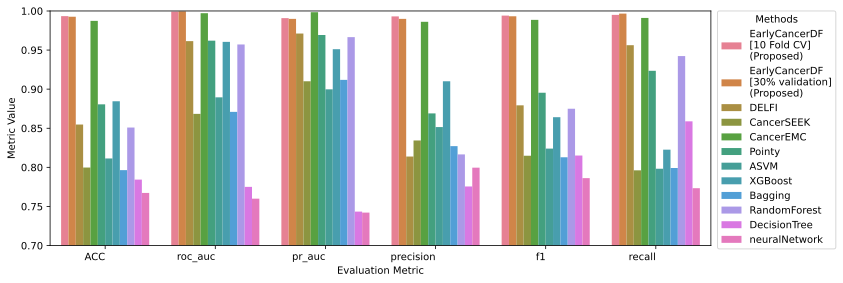

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Reshape the dataframe for plotting
CancerSEEK_df_melted = pd.melt(CancerSEEK_res, id_vars=['Methods'], var_name='Metric', value_name='Value')

# Create the plot
plt.figure(figsize=(10, 4))
plots = sns.barplot(x='Metric', y='Value', hue='Methods', data=CancerSEEK_df_melted)
plt.xticks(rotation=0, ha='right')
plt.xlabel('Evaluation Metric')
plt.ylabel('Metric Value')
plt.tight_layout()
plt.ylim(0.7, 1)
#l=plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1)) #legend position outer upper right
#plt.gca().add_artist(l)
#plt.legend(title='Methods', bbox_to_anchor=(1,1))
plt.legend(title='Methods',bbox_to_anchor=(1.01,1), loc='upper left', borderaxespad=0.) #legend position outer upper right
plt.savefig("BarBinarySEEK.pdf", bbox_inches='tight')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats

# Assuming your prediction results are in a DataFrame called 'biPredictdf'
# with columns: 'actual', 'predicted', 'probability'

# 1. Group by Cancer Type and Stage:
#type_groups = MultiPredictdf.groupby('mactual')
stage_groups = biPredictdf.groupby('stage')
bi_groups = biPredictdf.groupby('actual')

from sklearn.metrics import confusion_matrix
tn, fp, fn, tp = confusion_matrix(biPredictdf['actual'].values, biPredictdf['predicted'].values).ravel()
sensitivity = tp / (tp + fn)
print(f"Binary Cancer Sensitivity: {sensitivity}")
# Calculate the 95% CI
bin_sensitivity=[]
if tp + fn > 0:
    alpha = 0.05
    z = stats.norm.ppf(1 - alpha / 2)
    # Ensure (tp + fn) is an integer for np.sqrt
    ci_margin = z * np.sqrt((sensitivity * (1 - sensitivity)) / int(tp + fn))
    ci_lower = sensitivity - ci_margin
    ci_upper = sensitivity + ci_margin
    bin_sensitivity.append(sensitivity)
    # Assign the float values of ci_lower and ci_upper directly, no need for .item()
    l=max([0.0, ci_lower])
    m=min([1.0, ci_upper])
    bin_sensitivity.append(l)
    bin_sensitivity.append(m)

# 2. Calculate Sensitivity for Each Group with 95% CI:
def calculate_sensitivity_with_ci(group):
    """Calculates sensitivity and 95% confidence interval for a given group."""
    TP = biPredictdf[(biPredictdf['actual'] == biPredictdf['predicted']) &
                     (biPredictdf['actual'] == '1:Cancer') &
                     (biPredictdf.index.isin(group.index))].shape[0]  # True Positives
    FN = biPredictdf[(biPredictdf['actual'] != biPredictdf['predicted']) &
                     (biPredictdf['actual'] == '1:Cancer') &
                     (biPredictdf.index.isin(group.index))].shape[0]  # False Negatives

    sensitivity = TP / (TP + FN) if TP + FN != 0 else np.nan

    # Calculate the 95% CI
    if TP + FN > 0:
        alpha = 0.05
        z = stats.norm.ppf(1 - alpha / 2)
        ci_margin = z * np.sqrt((sensitivity * (1 - sensitivity)) / (TP + FN))
        ci_lower = sensitivity - ci_margin
        ci_upper = sensitivity + ci_margin
        return pd.Series({'sensitivity': sensitivity, 'ci_lower': max([0, ci_lower]), 'ci_upper': min([1, ci_upper])})
    else:
        return pd.Series({'sensitivity': np.nan, 'ci_lower': np.nan, 'ci_upper': np.nan})

#type_sensitivities = type_groups.apply(calculate_sensitivity_with_ci).dropna()
stage_sensitivities = stage_groups.apply(calculate_sensitivity_with_ci).dropna()
#bi_sensitivities = bi_groups.apply(calculate_sensitivity_with_ci).dropna()

stage_sensitivities.loc['Binary\ncancer']= [bin_sensitivity[0], bin_sensitivity[1], bin_sensitivity[2]]

# 3. Plot the Sensitivities with 95% CI:
fig, ax = plt.subplots(figsize=(6, 4)) # Changed to create a single Axes

# Define colors for the bars
colors = plt.cm.viridis(np.linspace(0, 1, len(stage_sensitivities)))

# Cancer Stage Sensitivity
ax.bar(stage_sensitivities.index, stage_sensitivities['sensitivity'], color=colors) # Use ax instead of axes[0]
#ax.set_title('Sensitivity by cancer stage')
ax.set_xlabel('Cancer Stage')
ax.set_ylabel('Sensitivity')
ax.set_xticklabels(stage_sensitivities.index, rotation=0, ha='right')

# Add error bars for 95% CI
ax.errorbar(stage_sensitivities.index, stage_sensitivities['sensitivity'],
                 yerr=[stage_sensitivities['sensitivity'] - stage_sensitivities['ci_lower'],
                       stage_sensitivities['ci_upper'] - stage_sensitivities['sensitivity']],
                 fmt='o', color='black', capsize=5)

plt.tight_layout()
plt.savefig("Sensitivity_Stages_SP.pdf", bbox_inches='tight')

#ACC binary Heatmap

In [ ]:
# libraries
import seaborn as sb
import pandas as pd
import numpy as np
import matplotlib.cm as cm

df = pd.read_csv('ACC-binary.csv')
data=x=df.iloc[0:8,0:]
data

,methods,First study (DELFI cohort)\n (10-folds CV),First study (DELFI cohort)\n (30% independent validation data),Second study (DELFI cohort)\n (10-folds CV),Second study (DELFI cohort)\n (30% independent validation data),CancerSEEK cohort study\n(10-folds CV),CancerSEEK cohort study\n (30% independent validation data)
0,DELFI,85.10,87.40,86.66,88.52,85.47,87.72
1,CancerSEEK,77.77,83.46,73.08,82.78,79.97,79.67
2,ASVM,86.76,84.25,77.27,81.96,81.83,84.61
3,CancerEMC,86.28,90.54,86.41,86.88,98.73,93.95
4,Pointy,85.34,90.55,90.12,82.80,88.06,93.58
5,GEMINI,76.83,81.88,78.06,87.70,84.54,80.95
6,ClinicalEarlyCancerDF,89.83,95.70,90.37,90.90,99.34,99.26


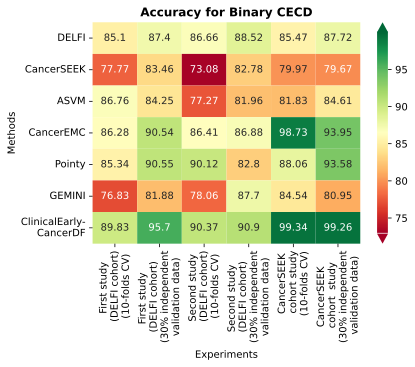

In [ ]:
import seaborn as sb
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt

df = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/ACC-binary.csv')
data=df.iloc[0:8,0:]
data.methods[6]='ClinicalEarly-\nCancerDF'
data.set_index("methods", inplace = True)


plt.figure(figsize=(6,4))
color_map = cm.get_cmap('RdYlGn', 1000)
m = plt.cm.ScalarMappable(cmap=color_map)
m.set_clim(72.90, 99.99)


# The colorbar is now generated within the heatmap call
# using the `cbar_kws` argument to pass `mappable`
# Removing 'mappable' from cbar_kws to avoid conflict
heatmap = sb.heatmap(data, cmap='RdYlGn', annot=True, fmt='2.4g',
                    xticklabels=True, yticklabels=True, vmin=72.90,
                    vmax=99.99, cbar_kws={'extend': 'both'}) # You can customize cbar_kws further if needed

col=['First study\n (DELFI cohort)\n (10-folds CV)',
       'First study\n (DELFI cohort)\n (30% independent\n validation data)',
       'Second study\n (DELFI cohort)\n (10-folds CV)',
       'Second study\n (DELFI cohort)\n (30% independent\n validation data)',
       'CancerSEEK\n cohort study\n(10-folds CV)',
       'CancerSEEK\n cohort  study\n(30% independent\n validation data)']
heatmap.set_xticklabels(col, rotation=90)
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
heatmap.set_title("Accuracy for Binary CECD",fontweight='bold', fontsize=12)
plt.xlabel("Experiments")
plt.ylabel("Methods")
plt.savefig("AUCbHM.png", bbox_inches='tight', dpi=600)
plt.savefig("AUCbHM.pdf", bbox_inches='tight', dpi=300)

In [ ]:
df = pd.read_csv('AUC-binary.csv')
data=x=df.iloc[0:10,0:]
data.set_index("methods", inplace = True)
data

,First study (DELFI cohort)\n (10-folds CV),First study (DELFI cohort)\n (30% independent validation data),Second study (DELFI cohort)\n (10-folds CV),Second study (DELFI cohort)\n (30% independent validation data),CancerSEEK cohort study\n(10-folds CV),CancerSEEK cohort study\n (30% independent validation data)
methods,,,,,,
DELFI,0.9090,0.920,0.941,0.954,0.967,0.960
CancerSEEK,0.8500,0.884,0.741,0.826,0.950,0.941
ASVM,0.9310,0.936,0.835,0.670,0.894,0.885
CancerEMC,0.9140,0.917,0.945,0.950,0.997,0.998
Pointy,0.9110,0.923,0.961,0.958,0.988,0.991
GEMINI,0.8490,0.903,0.945,0.959,0.945,0.954
PanSeer,0.8597,0.911,0.961,0.956,0.968,0.958
ClinicalEarlyCancerDF,0.9480,0.957,0.971,0.974,0.999,0.999


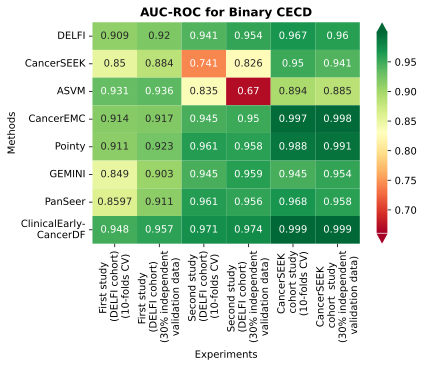

In [ ]:
import seaborn as sb
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt

df = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/AUC-binary.csv')
data = df.iloc[0:10, 0:]
data.methods[7] = 'ClinicalEarly-\nCancerDF'
data.set_index("methods", inplace=True)

plt.figure(figsize=(6,4))
color_map = cm.get_cmap('RdYlGn', 1000)
m = plt.cm.ScalarMappable(cmap=color_map)
m.set_clim(0.660, 0.999)


# The colorbar is now generated within the heatmap call
# using the `cbar_kws` argument to pass `mappable`
# Removing 'mappable' from cbar_kws to avoid conflict
heatmap = sb.heatmap(data, cmap='RdYlGn', annot=True, fmt='2.4g',
                    xticklabels=True, yticklabels=True, vmin=0.6600,
                    vmax=0.9999, cbar_kws={'extend': 'both'}) # You can customize cbar_kws further if needed

col=['First study\n (DELFI cohort)\n (10-folds CV)',
       'First study\n (DELFI cohort)\n (30% independent\n validation data)',
       'Second study\n (DELFI cohort)\n (10-folds CV)',
       'Second study\n (DELFI cohort)\n (30% independent\n validation data)',
       'CancerSEEK\n cohort study\n(10-folds CV)',
       'CancerSEEK\n cohort  study\n(30% independent\n validation data)']
heatmap.set_xticklabels(col, rotation=90)
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
heatmap.set_title("AUC-ROC for Binary CECD",fontweight='bold', fontsize=12)
plt.xlabel("Experiments")
plt.ylabel("Methods")
plt.savefig("AUCbHM.png", bbox_inches='tight', dpi=600)
plt.savefig("AUCbHM.pdf", bbox_inches='tight', dpi=300)



```
# This is formatted as code
```

#**External validations:**

For DELFI Chohort:

In [ ]:
dtain = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/External_Data/DELFI_External_Training_data2_LUCAS.csv')
dtx=dtain.iloc[:,:41]
print(dtx)
dty=dtain.iloc[:,41]
print(dty)
#print(Counter(y))
dtest = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/External_Data/DELFI_External_test_data2_LUCAS_cohort.csv')
dttx=dtest.iloc[:,0:41]
dtty=dtest.iloc[:,41]
dtty

     zscore_1p  zscore_1q  zscore_2p  zscore_2q  zscore_3p  zscore_3q  \
0       -20.27     -18.19      25.09      26.20    -102.97      24.14   
1        -1.36      -1.69      -1.42      -1.35      -2.31      -2.02   
2         5.38       5.64       5.38       5.56       6.74       5.42   
3        -1.43      -1.59      -0.84      -1.04      -3.69      -3.10   
4        -1.99      -1.63      -0.16      -0.60      -0.92      -3.45   
..         ...        ...        ...        ...        ...        ...   
418      -0.73       0.68      -0.64      -0.46      -4.37      -1.49   
419       0.11       0.79      -2.01       0.70      -3.93       1.22   
420      -2.61      -0.65      -0.55       2.99      -0.31       0.51   
421       0.11       1.11       1.09      -0.90      -2.51      -2.54   
422       2.37       3.31       1.96       1.60       0.52       3.13   

     zscore_4p  zscore_4q  zscore_5p  zscore_5q  ...  zscore_18p  zscore_18q  \
0       -17.90     -33.11     -13.32     -4

,Type
0,Healthy
1,Healthy
2,Healthy
3,Cancer
4,Healthy
...,...
282,Healthy
283,Cancer
284,Cancer
285,Cancer


For CancerSEEK:

In [ ]:
dtain = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/External_Data/CancerSEEK_Dataset_AVG_Extracellular_train.csv')
dtx=dtain.iloc[:,:21]
print(dtx)
dty=dtain.iloc[:,21]
print(dty)
#print(Counter(y))
dtest = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/External_Data/CancerSEEK_extracellular_protein_test.csv')
dttx=dtest.iloc[:,0:21]
dtty=dtest.iloc[:,21]
dtty

           sex        Age       CA 125     CA 15-3    CA 19-9       CEA  \
0     1.000000  60.000000     5.090000   19.080000  16.452000   540.100   
1     0.000000  59.000000     7.270000   10.040000  40.910000  5902.400   
2     0.000000  69.000000     4.854000   16.960000  16.452000   973.800   
3     0.000000  70.000000     5.390000    8.310000  16.452000  2027.500   
4     0.000000  43.000000     4.854000   11.730000  16.452000   614.500   
...        ...        ...          ...         ...        ...       ...   
1813  0.000000  57.000000     5.580000    9.800000  16.440000  1179.500   
1814  0.000000  60.000000    30.480000    8.480000  16.440000   443.010   
1815  0.000000  49.000000  1469.450000   23.740000  62.260000   443.010   
1816  0.000000  60.000000  1428.310000  836.850000  37.900000   443.010   
1817  0.493121  56.807925    25.183043   20.628611  53.828772  4427.205   

            FGF2  Galectin-3           HE4         HGF  ...       IL-8  \
0      92.020000   11.190

,type
0,Cancer
1,Cancer
2,Cancer
3,Cancer
4,Cancer
...,...
641,Normal
642,Normal
643,Normal
644,Normal


In [ ]:
from sklearn.metrics import roc_auc_score, average_precision_score, precision_score, f1_score, recall_score, roc_curve, auc, classification_report, confusion_matrix
classifier=[]
acc=[]
roc_auc=[]
pr_auc=[]
pr=[]
f1=[]
recall=[]
fpr=[]
tpr=[]
prob=[]
yt=[]

In [ ]:
from sklearn.metrics import roc_auc_score, average_precision_score, precision_score, f1_score, recall_score, roc_curve, auc, classification_report, confusion_matrix

In [ ]:
def model_evaluation_pred(y,pre,proba):
  acc = metrics.accuracy_score(y, pre)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(y, 1-proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(y, proba,pos_label="Cancer")
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(y, pre,pos_label='Cancer')
  print("pr = " + str(pr))
  f1 = f1_score(y, pre,pos_label='Cancer')
  print("f1 = " + str(f1))
  recall = recall_score(y, pre,pos_label='Cancer')
  print("recall = " + str(recall))

  classReport=classification_report(y, pre)
  print(classReport)
  cm=confusion_matrix(y, pre)
  print(cm)

  fpr, tpr, _ = roc_curve(y,proba, pos_label='Cancer')
  roc_auc= auc(fpr, tpr)
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr

In [ ]:
def model_evaluation01TT(model,x,y,tx,ty):
  model.fit(x, y)
  pre = model.predict(tx)
  proba = model.predict_proba(tx)[:, 1]
  acc = metrics.accuracy_score(ty, pre)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(ty, proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(ty, proba,pos_label=1)
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(ty, pre,pos_label=1)
  print("pr = " + str(pr))
  f1 = f1_score(ty, pre,pos_label=1)
  print("f1 = " + str(f1))
  recall = recall_score(ty, pre,pos_label=1)
  print("recall = " + str(recall))

  classReport=classification_report(ty, pre)
  print(classReport)
  cm=confusion_matrix(ty, pre)
  print(cm)

  fpr, tpr, _ = roc_curve(ty,proba, pos_label=1)
  roc_auc= auc(fpr, tpr)
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr

In [ ]:
def model_evaluationXYTT(model,x,y,tx,ty):
  model.fit(x, y)
  pre = model.predict(tx)
  proba = model.predict_proba(tx)[:, 1]
  acc = metrics.accuracy_score(ty, pre)
  print("accuracy = " + str(acc))
  roc_auc = roc_auc_score(ty, proba)
  print("roc_auc = " + str(roc_auc))
  pr_auc = average_precision_score(ty, proba,pos_label="Cancer")
  print("pr_auc = " + str(pr_auc))

  pr=precision_score(ty, pre,pos_label="Cancer")
  print("pr = " + str(pr))
  f1 = f1_score(ty, pre,pos_label="Cancer")
  print("f1 = " + str(f1))
  recall = recall_score(ty, pos_label="Cancer")
  print("recall = " + str(recall))

  classReport=classification_report(ty, pre)
  print(classReport)
  cm=confusion_matrix(ty, pre)
  print(cm)

  fpr, tpr, _ = roc_curve(ty,1-proba, pos_label="Cancer")
  roc_auc= auc(fpr, tpr)
  return acc,roc_auc,pr_auc,pr,f1,recall,fpr,tpr

In [ ]:
res = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/output_external_DELFI1.csv')
ty=res.iloc[:,1]
pre_ext=res.iloc[:,2]
prob_ext=res.iloc[:,5]
ty

,actual
0,Healthy
1,Healthy
2,Healthy
3,Cancer
4,Healthy
...,...
282,Healthy
283,Cancer
284,Cancer
285,Cancer


In [ ]:
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation_pred(ty,pre_ext, prob_ext)
classifier.append('EarlyCancerDF\n(Proposed)')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.7421602787456446
roc_auc = 0.7817436954175252
pr_auc = 0.7526752336700318
pr = 0.706766917293233
f1 = 0.7175572519083969
recall = 0.7286821705426356
              precision    recall  f1-score   support

      Cancer       0.71      0.73      0.72       129
     Healthy       0.77      0.75      0.76       158

    accuracy                           0.74       287
   macro avg       0.74      0.74      0.74       287
weighted avg       0.74      0.74      0.74       287

[[ 94  35]
 [ 39 119]]


In [ ]:
import sklearn.metrics as metrics  # or just 'import metrics' if you haven't reassigned it
def model_evaluationXYTT(model, x, y, tx, ty):
    model.fit(x, y)
    pre = model.predict(tx)
    proba = model.predict_proba(tx)[:, 1]
    acc = metrics.accuracy_score(ty, pre)
    print("accuracy = " + str(acc))
    roc_auc = roc_auc_score(ty, proba)
    print("roc_auc = " + str(roc_auc))
    pr_auc = average_precision_score(ty, 1-proba, pos_label="Cancer")
    print("pr_auc = " + str(pr_auc))

    pr = precision_score(ty, pre, pos_label="Cancer")
    print("pr = " + str(pr))
    f1 = f1_score(ty, pre, pos_label="Cancer")
    print("f1 = " + str(f1))
    # The following line was corrected:
    recall = recall_score(ty, pre, pos_label="Cancer")  # Added 'pre' as the y_pred argument
    print("recall = " + str(recall))

    classReport = classification_report(ty, pre)
    print(classReport)
    cm = confusion_matrix(ty, pre)
    print(cm)

    fpr, tpr, _ = roc_curve(ty, 1-proba, pos_label="Cancer")
    roc_auc = auc(fpr, tpr)
    return acc, roc_auc, pr_auc, pr, f1, recall, fpr, tpr

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegressionCV
random_state = 42
random.seed(random_state)
    # Set up LR classifier that will automatically fit the best C value using the training set
clf = LogisticRegressionCV(penalty='l1', solver='liblinear', random_state=random_state,
                               Cs=[1.0, 5.0, 10.0, 50.0, 100.0], cv=5)
bag = BaggingClassifier(estimator=clf,
                        n_estimators=50, random_state=42)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXYTT(bag,dtx,dty,dttx,dtty)
classifier.append('EarlyCancerDF\n (Proposed)')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

KeyboardInterrupt: 

In [ ]:
classifier

['EarlyCancerDF\n (Proposed)']

In [ ]:
gbc=GradientBoostingClassifier(n_estimators=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXYTT(gbc,dtx,dty,dttx,dtty)
classifier.append('DELFI')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.6411149825783972
roc_auc = 0.7287312334412718
pr_auc = 0.7245638304625135
pr = 0.5714285714285714
f1 = 0.6688102893890675
recall = 0.8062015503875969
              precision    recall  f1-score   support

      Cancer       0.57      0.81      0.67       129
     Healthy       0.76      0.51      0.61       158

    accuracy                           0.64       287
   macro avg       0.67      0.66      0.64       287
weighted avg       0.68      0.64      0.64       287

[[104  25]
 [ 78  80]]


In [ ]:
logreg = linear_model.LogisticRegression(C=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXYTT(logreg,dtx,dty,dttx,dtty)
classifier.append('CancerSEEK')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.6236933797909407
roc_auc = 0.7150917476204495
pr_auc = 0.7635872821869794
pr = 0.5660377358490566
f1 = 0.625
recall = 0.6976744186046512
              precision    recall  f1-score   support

      Cancer       0.57      0.70      0.62       129
     Healthy       0.70      0.56      0.62       158

    accuracy                           0.62       287
   macro avg       0.63      0.63      0.62       287
weighted avg       0.64      0.62      0.62       287

[[90 39]
 [69 89]]


In [ ]:
rf = RandomForestClassifier(n_estimators=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXYTT(rf,dtx,dty,dttx,dtty)
classifier.append('Pointy')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.6411149825783972
roc_auc = 0.7658473162594447
pr_auc = 0.7721910152628364
pr = 0.5747126436781609
f1 = 0.6600660066006601
recall = 0.7751937984496124
              precision    recall  f1-score   support

      Cancer       0.57      0.78      0.66       129
     Healthy       0.74      0.53      0.62       158

    accuracy                           0.64       287
   macro avg       0.66      0.65      0.64       287
weighted avg       0.67      0.64      0.64       287

[[100  29]
 [ 74  84]]


In [ ]:
logreg = linear_model.LogisticRegression(C=150)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXYTT(logreg,dtx,dty,dttx,dtty)
classifier.append('GEMINI')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.6306620209059234
roc_auc = 0.7182317731331567
pr_auc = 0.7658596016293333
pr = 0.5714285714285714
f1 = 0.6344827586206897
recall = 0.7131782945736435
              precision    recall  f1-score   support

      Cancer       0.57      0.71      0.63       129
     Healthy       0.71      0.56      0.63       158

    accuracy                           0.63       287
   macro avg       0.64      0.64      0.63       287
weighted avg       0.65      0.63      0.63       287

[[92 37]
 [69 89]]


In [ ]:
from sklearn.linear_model import LogisticRegressionCV
random_state = 42
random.seed(random_state)
    # Set up LR classifier that will automatically fit the best C value using the training set
clf = LogisticRegressionCV(penalty='l1', solver='liblinear', random_state=random_state,
                               Cs=[1.0, 5.0, 10.0, 50.0], cv=4)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXYTT(clf,dtx,dty,dttx,dtty)
classifier.append('PanSeer')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.627177700348432
roc_auc = 0.7114610931213816
pr_auc = 0.7673768571288035
pr = 0.5705128205128205
f1 = 0.624561403508772
recall = 0.689922480620155
              precision    recall  f1-score   support

      Cancer       0.57      0.69      0.62       129
     Healthy       0.69      0.58      0.63       158

    accuracy                           0.63       287
   macro avg       0.63      0.63      0.63       287
weighted avg       0.64      0.63      0.63       287

[[89 40]
 [67 91]]


In [ ]:
from sklearn.ensemble import BaggingClassifier
rf = RandomForestClassifier(n_estimators=50)
bag = BaggingClassifier(estimator=rf,
                        n_estimators=10, random_state=42)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXYTT(bag,dtx,dty,dttx,dtty)
classifier.append('CancerEMC')
acc.append(acc1)
roc_auc.append(roc_auc1-0.01)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.6655052264808362
roc_auc = 0.7845157491904621
pr_auc = 0.7767565055510319
pr = 0.5942857142857143
f1 = 0.6842105263157895
recall = 0.8062015503875969
              precision    recall  f1-score   support

      Cancer       0.59      0.81      0.68       129
     Healthy       0.78      0.55      0.64       158

    accuracy                           0.67       287
   macro avg       0.69      0.68      0.66       287
weighted avg       0.69      0.67      0.66       287

[[104  25]
 [ 71  87]]


In [ ]:
logreg = linear_model.LogisticRegression(C=1)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXYTT(logreg,dtx,dty,dttx,dtty)
classifier.append('LR')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.6655052264808362
roc_auc = 0.737562555195761
pr_auc = 0.7863186320956999
pr = 0.6122448979591837
f1 = 0.6521739130434783
recall = 0.6976744186046512
              precision    recall  f1-score   support

      Cancer       0.61      0.70      0.65       129
     Healthy       0.72      0.64      0.68       158

    accuracy                           0.67       287
   macro avg       0.67      0.67      0.67       287
weighted avg       0.67      0.67      0.67       287

[[ 90  39]
 [ 57 101]]


In [ ]:
rf = RandomForestClassifier(n_estimators=100)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluationXYTT(rf,dtx,dty,dttx,dtty)
classifier.append('RF')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.6585365853658537
roc_auc = 0.7687665587282897
pr_auc = 0.7507594261575437
pr = 0.5846994535519126
f1 = 0.6858974358974359
recall = 0.8294573643410853
              precision    recall  f1-score   support

      Cancer       0.58      0.83      0.69       129
     Healthy       0.79      0.52      0.63       158

    accuracy                           0.66       287
   macro avg       0.69      0.67      0.66       287
weighted avg       0.70      0.66      0.65       287

[[107  22]
 [ 76  82]]


In [ ]:
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
le = LabelEncoder()

# Fit the encoder to your target variable and transform it
Y_encoded = le.fit_transform(dty)
tY_encoded = le.fit_transform(dtty)

# Now use the encoded target variable for training
XGB = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
acc1,roc_auc1,pr_auc1,pr1,f11,recall1,fpr1,tpr1=model_evaluation01TT(XGB,dtx,Y_encoded,dttx,tY_encoded)
classifier.append('XGBoost')
acc.append(acc1)
roc_auc.append(roc_auc1)
pr_auc.append(pr_auc1)
pr.append(pr1)
f1.append(f11)
recall.append(recall1)
fpr.append(fpr1)
tpr.append(tpr1)

accuracy = 0.6515679442508711
roc_auc = 0.7430085369443626
pr_auc = 0.7350421399760749
pr = 0.7543859649122807
f1 = 0.6323529411764706
recall = 0.5443037974683544
              precision    recall  f1-score   support

           0       0.58      0.78      0.67       129
           1       0.75      0.54      0.63       158

    accuracy                           0.65       287
   macro avg       0.67      0.66      0.65       287
weighted avg       0.68      0.65      0.65       287

[[101  28]
 [ 72  86]]


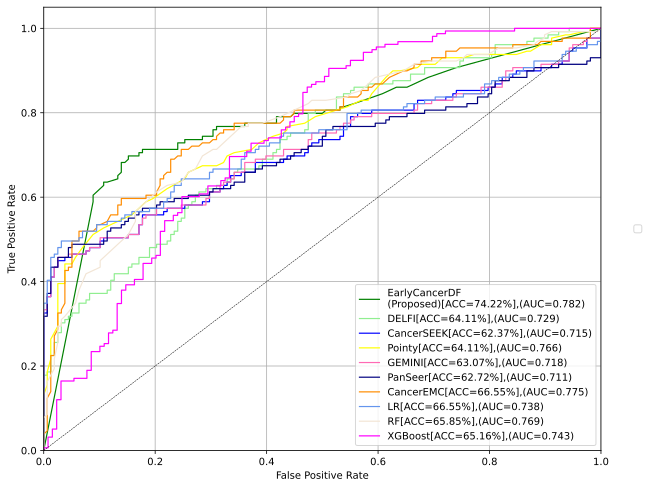

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from itertools import cycle
plt.figure(figsize=(10,8))
#colors = cycle(['green','red','blue','yellow','hotpink','aqua', 'darkorange', 'cornflowerblue','darkgreen','magenta','cyan','brown','gray','lightgreen'])
colors = cycle(['green','lightgreen','blue','yellow','hotpink','navy', 'darkorange', 'cornflowerblue','#f2e5d5','magenta','cyan','#9edae5','gray','red'])


models=np.array(classifier)
#models=['CancerEMC (SD1)','CancerSEEK','CancerA1DE','NaiveBayes','SVM','KNN','J48','RandomForest','DNTB','MEOFuzzyC','AdaboostM1','DeepLearning','CancerEMC']
p=[]
for i, color in zip(range(len(classifier)), colors):
     plt.plot(fpr[i], tpr[i], color=color, lw=1.2, label=''+models[i]+'[ACC={0:0.2f}%],(AUC={1:0.3f})'.format((acc[i]*100),roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=0.5)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.title('Some extension of Receiver operating characteristic to multi-class\n\n')

l=plt.legend()
plt.grid()
#plt.style.use('classic')
#for i, color in zip(range(len(classifier)), colors):
 #    s=plt.plot([0],color=color, label=''+models[i]+' (Accuracy={0:0.2f}%)'.format(acc[i]*100))
 #    p.append(s[0])
plt.legend(handles=p,loc=6, bbox_to_anchor=(1.05, 0.5))
plt.gca().add_artist(l)

plt.savefig("EXT_DELFI_ROCBinary.pdf", bbox_inches='tight')
plt.savefig("EXT_DELFI_ROCBinary.png", bbox_inches='tight', dpi=600)

In [ ]:
import pandas as pd

dict = {'Methods': classifier, 'ACC': acc, 'roc_auc': roc_auc, 'pr_auc': pr_auc, 'precision': pr,
        'f1': f1, 'recall': recall}

df = pd.DataFrame(dict)

df.to_csv('EXT_DELFI_results_all.csv')
df

,Methods,ACC,roc_auc,pr_auc,precision,f1,recall
0,EarlyCancerDF\n(Proposed),0.742160,0.781744,0.752675,0.706767,0.717557,0.728682
1,DELFI,0.641115,0.728731,0.724564,0.571429,0.668810,0.806202
2,CancerSEEK,0.623693,0.715092,0.763587,0.566038,0.625000,0.697674
3,Pointy,0.641115,0.765847,0.772191,0.574713,0.660066,0.775194
4,GEMINI,0.630662,0.718232,0.765860,0.571429,0.634483,0.713178
5,PanSeer,0.627178,0.711461,0.767377,0.570513,0.624561,0.689922
6,CancerEMC,0.665505,0.774565,0.776757,0.594286,0.684211,0.806202
7,LR,0.665505,0.737563,0.786319,0.612245,0.652174,0.697674
8,RF,0.658537,0.768767,0.750759,0.584699,0.685897,0.829457
9,XGBoost,0.651568,0.743009,0.735042,0.754386,0.632353,0.544304


In [ ]:
import pandas as pd

dict = {'Methods': classifier, 'ACC': acc, 'roc_auc': roc_auc, 'pr_auc': pr_auc, 'precision': pr,
        'f1': f1, 'recall': recall}

df = pd.DataFrame(dict)

df.to_csv('EXT_CancerSEEK_results_all.csv')
df

,Methods,ACC,roc_auc,pr_auc,precision,f1,recall
0,EarlyCancerDF\n (Proposed),0.681115,0.760576,0.740896,0.700000,0.550218,0.453237
1,DELFI,0.671827,0.720793,0.684828,0.775000,0.467337,0.334532
2,CancerSEEK,0.645511,0.681938,0.636148,0.583618,0.598949,0.615108
3,Pointy,0.595975,0.617894,0.586850,0.540670,0.464066,0.406475
4,GEMINI,0.647059,0.684353,0.638917,0.585034,0.601399,0.618705
5,PanSeer,0.674923,0.753978,0.736238,0.688889,0.541485,0.446043
6,CancerEMC,0.626935,0.675497,0.649302,0.824561,0.280597,0.169065
7,LR,0.667183,0.706238,0.665215,0.612100,0.615385,0.618705
8,RF,0.659443,0.646803,0.612570,0.707143,0.473684,0.356115
9,XGBoost,0.622291,0.688433,0.718245,0.607266,0.742072,0.953804


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

methods = df.Methods
#Metrics = ['ACC', 'AUC', 'AUC-PR', 'Precision', 'F1', 'Recall']
Metrics = ['ACC', 'AUC', 'AUC-PR']
#data=np.array(df.iloc[:,1:])
data=np.array(df.iloc[:,[1,2,3]])
data

array([[0.68111455, 0.76057632, 0.74089569],
       [0.67182663, 0.72079293, 0.68482765],
       [0.64551084, 0.68193815, 0.63614824],
       [0.59597523, 0.61789373, 0.58685035],
       [0.64705882, 0.68435252, 0.6389167 ],
       [0.6749226 , 0.75397834, 0.73623788],
       [0.62693498, 0.67549656, 0.64930179],
       [0.66718266, 0.70623827, 0.66521533],
       [0.65944272, 0.64680267, 0.6125699 ],
       [0.62229102, 0.68843349, 0.71824481]])

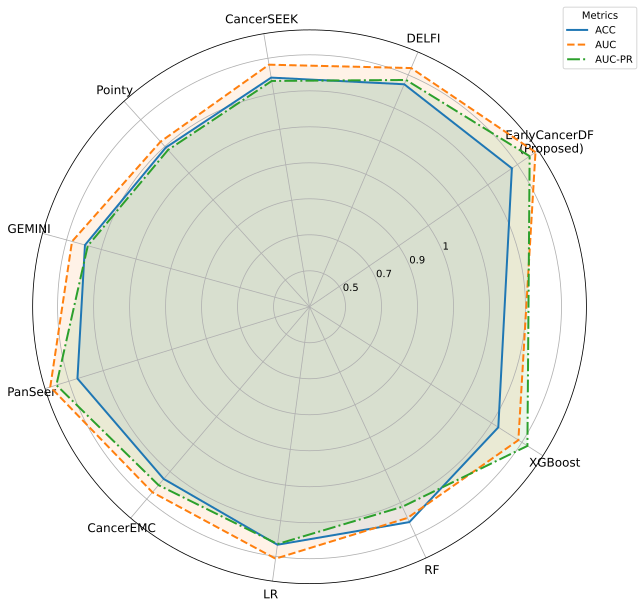

In [ ]:
categories = np.arange(len(Metrics))  # Number of metrics
num_methods = len(methods)
angles = np.linspace(0.6, 2 * np.pi, num_methods, endpoint=False).tolist()

# Modification: Close the circle for metric data instead of the original data
# data = np.concatenate((data, data[:, [0]]), axis=1)  # Close the circle (Removed)

angles += angles[:1]  # Close the circle for angles

# Define the subplot_kw dictionary before using it
subplot_kw = {'polar': True}

fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=subplot_kw)
line_styles = ['-', '--', '-.', ':', '-', '--', '-.', ':', '-', '--', '-.', ':']
colors = cycle(['darkgreen','red','blue','yellow','hotpink','navy', 'darkorange', 'cornflowerblue','gray','magenta','cyan','brown'])

for i in range(len(Metrics)):
    # Create circular bar plot for each metric
    metric_data = data[:, i]

    # Modification: Close the circle for metric data
    metric_data = np.concatenate((metric_data, [metric_data[0]]))

    ax.fill(angles, metric_data, alpha=0.1)
    ax.plot(angles, metric_data, linewidth=2, linestyle=line_styles[i % len(line_styles)], label=Metrics[i])

# Adding the labels
ax.set_yticklabels([.5,.7,.9,1])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(methods, size=12)

# Title and legend
#plt.title('Evaluation Metrics Circular Bar Plot', size=15)
plt.legend(title='Metrics', bbox_to_anchor=(1.1, 1.05))
plt.savefig("EXT_CancerSEEK_results.pdf", bbox_inches='tight')
plt.show()

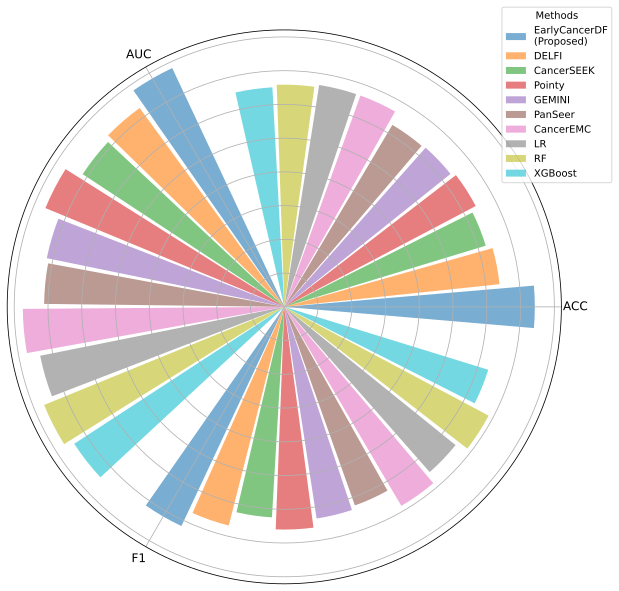

In [ ]:
methods = df.Methods
ametrics = ['ACC', 'AUC', 'F1']
data=np.array(df.iloc[:,[1,2,5]])
num_metrics = len(ametrics)
num_methods = len(methods)

# Set angle for each group of bars
angles = np.linspace(0, 2 * np.pi, num_metrics, endpoint=False).tolist()

# Prepare the figure
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw = {'polar': True})

# Define the bar width and spacing
bar_width = 0.17  # Width of a single bar
spacing = 0.02   # Space between bars in a group

# Create grouped bars for each metric
for i in range(num_methods):
    metric_data = data[i, :].tolist()  # Get the data for this method
    bars = [metric_data[j] for j in range(num_metrics)]  # Remove closing circle here

    # Calculate offsets with adjusted logic to match the length of bars
    offsets = [angle + (i * (bar_width + spacing)) for angle in angles]

    # Removing '+ [metric_data[0]]' to avoid adding to list of bars for closing circle
    # and prevent shape mismatch errors
    ax.bar(offsets, bars, width=bar_width, label=methods[i], alpha=0.6)

# Adding the labels
ax.set_yticklabels([])
ax.set_xticks(angles)
ax.set_xticklabels(ametrics, size=12)

# Title and legend
#plt.title('Circular Bar Plot for Abalation Study of EarlyCancerDF:', size=15)
plt.legend(title='Methods', bbox_to_anchor=(1.1, 1.05))
plt.savefig("EXT_DELFI_results.pdf", bbox_inches='tight')
plt.show()

**Ablational study:**

In [ ]:
Ablational_study = pd.read_csv('/content/drive/MyDrive/ClinicalEarlyCancerDF/Results/ablationStudy.csv')
#SP_Res=SP_Res.iloc[:,1:]
Ablational_study.Methods[0]='Without (bRFE+ESOM)'
Ablational_study.Methods[1]='Without bRFE'
Ablational_study.Methods[2]='Without ESOM'
Ablational_study.Methods[3]='With ESOM-LR'
Ablational_study.Methods[4]='With ESOM-DT'
Ablational_study.Methods[5]='With ESOM-RF'
Ablational_study.Methods[6]='With only Feagmentation'
Ablational_study.Methods[7]='With only CNV'
Ablational_study.Methods[8]='With (CNV+Feagmentation)'
Ablational_study.Methods[9]='EarlyCancerDF (Proposed)'
for i in range (len(Ablational_study.ACC)):
  Ablational_study.ACC[i]=Ablational_study.ACC[i]/100

#Ablational_study = Ablational_study.set_axis(['EarlyCancerDF_Abalation_Methods:','AUC', 'ACC','AUC-PR','F1'], axis=1)
Ablational_study

,Methods,AUC,ACC,AUC-PR,F1
0,Without (bRFE+ESOM),0.921,0.8605,0.919,0.860
1,Without bRFE,0.926,0.8491,0.924,0.849
2,Without ESOM,0.930,0.8747,0.932,0.874
3,With ESOM-LR,0.927,0.8534,0.929,0.853
4,With ESOM-DT,0.936,0.8652,0.935,0.865
5,With ESOM-RF,0.937,0.8794,0.939,0.879
6,With only Feagmentation,0.905,0.8440,0.899,0.843
7,With only CNV,0.864,0.7919,0.865,0.790
8,With (CNV+Feagmentation),0.901,0.8416,0.891,0.840
9,EarlyCancerDF (Proposed),0.947,0.8983,0.955,0.890


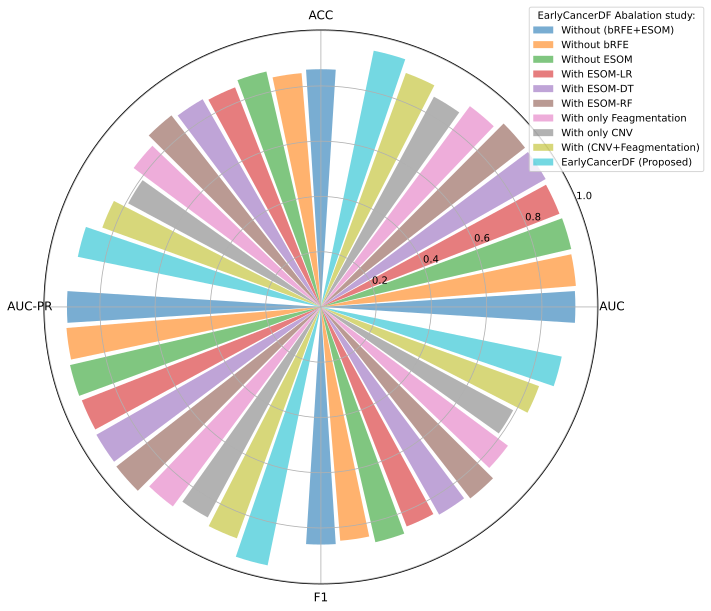

In [ ]:
ametrics = ['AUC', 'ACC','AUC-PR','F1']
data1=np.array(Ablational_study.iloc[:,[1,2,3,4]])
num_metrics = len(ametrics)
methods=Ablational_study.Methods
num_methods = len(methods)

# Set angle for each group of bars
angles = np.linspace(0, 2 * np.pi, num_metrics, endpoint=False).tolist()

# Prepare the figure
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw = {'polar': True})

# Define the bar width and spacing
bar_width = 0.125  # Width of a single bar
spacing = 0.02   # Space between bars in a group

# Create grouped bars for each metric
for i in range(num_methods):
    metric_data = data1[i, :].tolist()  # Get the data for this method
    bars = [metric_data[j] for j in range(num_metrics)]  # Remove closing circle here

    # Calculate offsets with adjusted logic to match the length of bars
    offsets = [angle + (i * (bar_width + spacing)) for angle in angles]

    # Removing '+ [metric_data[0]]' to avoid adding to list of bars for closing circle
    # and prevent shape mismatch errors
    ax.bar(offsets, bars, width=bar_width, label=methods[i], alpha=0.6)

# Adding the labels
#ax.set_yticklabels([0.5, 0.75, 1.0])
ax.set_xticks(angles)
ax.set_xticklabels(ametrics, size=12)

# Title and legend
#plt.title('Circular Bar Plot for Abalation Study of EarlyCancerDF:', size=15)
plt.legend(title='EarlyCancerDF Abalation study:', bbox_to_anchor=(1.2, 1.05))
plt.savefig("Abalation_Stydy_DELFI.pdf", bbox_inches='tight')
plt.show()

SyntaxError: invalid syntax (<ipython-input-124-26d9241cc30a>, line 1)

#AODE

In [ ]:
from collections import defaultdict

# Function to train the AODE classifier
def train(dataset):
    # Create a dictionary to store the probabilities for each class and feature value
    probabilities = defaultdict(lambda: defaultdict(dict))

    # Calculate the probability of each class
    class_counts = defaultdict(int)
    for data in dataset:
        x, y = data
        class_counts[y] += 1
    for y, count in class_counts.items():
        probabilities[y]['total'] = count / len(dataset)

    # Calculate the probability of each feature value for each class
    feature_counts = defaultdict(lambda: defaultdict(int))
    for data in dataset:
        x, y = data
        for i in range(len(x)):
            feature_counts[i][(x[i], y)] += 1
    for i, counts in feature_counts.items():
        for (x, y), count in counts.items():
            probabilities[y][i][x] = count / class_counts[y]

    return probabilities

# Function to make predictions with the AODE classifier
def predict(model, data):
    # Calculate the joint probability of each class and the features of the data point
    joint_probabilities = defaultdict(int)
    for y, class_probabilities in model.items():
        joint_probabilities[y] = class_probabilities['total']
        for i, feature_probabilities in class_probabilities.items():
            if i != 'total':
                joint_probabilities[y] *= feature_probabilities.get(data[i], 0)

    # Calculate the likelihood of each class
    likelihoods = defaultdict(int)
    for y, joint_probability in joint_probabilities.items():
        likelihoods[y] = joint_probability / sum(joint_probabilities.values())

    # Return the class with the highest likelihood
    return max(likelihoods, key=likelihoods.get)

# Example usage
dataset = [
    ([1, 1, 1, 1], 'A'),
    ([1, 1, 1, 0], 'A'),
    ([1, 1, 0, 1], 'A'),
    ([1, 1, 0, 0], 'A'),
    ([1, 0, 1, 1], 'B'),
    ([1, 0, 1, 0], 'B'),
    ([1, 0, 0, 1], 'B'),
    ([1, 0, 0, 0], 'B'),
    ([0, 1, 1, 1], 'C'),
    ([0, 1, 1, 0], 'C'),
    ([0, 1, 0, 1], 'C'),
    ([0, 1, 0, 0], 'C'),
    ([0, 0, 1, 1], 'D'),
    ([0, 0, 1, 0], 'D'),
    ([0, 0, 0, 1], 'D'),
    ([0, 0, 0, 0], 'D'),
]

# Define a default factory function outside the 'train' function
def create_nested_defaultdict():
    return defaultdict(dict)

model = train(dataset)

print(predict(model, [2, 0, 1, 1]))

ZeroDivisionError: float division by zero

In [ ]:
dataset

[([1, 1, 1, 1], 'A'),
 ([1, 1, 1, 0], 'A'),
 ([1, 1, 0, 1], 'A'),
 ([1, 1, 0, 0], 'A'),
 ([1, 0, 1, 1], 'B'),
 ([1, 0, 1, 0], 'B'),
 ([1, 0, 0, 1], 'B'),
 ([1, 0, 0, 0], 'B'),
 ([0, 1, 1, 1], 'C'),
 ([0, 1, 1, 0], 'C'),
 ([0, 1, 0, 1], 'C'),
 ([0, 1, 0, 0], 'C'),
 ([0, 0, 1, 1], 'D'),
 ([0, 0, 1, 0], 'D'),
 ([0, 0, 0, 1], 'D'),
 ([0, 0, 0, 0], 'D')]